# download dataset

This dataset contains resting(eyes closed, eyes open) and cognitive(subtraction, music, memory) state EEG recordings with 60 participants during three experimental sessions together with sleep, emotion, mental health, and mind-wandering related measures

In [ ]:
from eegdash.dataset import DS004148

dataset = DS004148(cache_dir="./data", download=True)

for rec in dataset.datasets:
    raw = rec.raw
    raw.load_data()

# setup

In [26]:
import os
import glob
import random
import numpy as np
import mne
import matplotlib.pyplot as plt

from scipy.signal import welch
from scipy.stats import entropy

DATA_DIR = "./data/ds004148"
TARGET_SFREQ = 125
WINDOW_SEC = 0.25

bands = {
    "delta": (1, 4),
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta":  (13, 30),
    "gamma": (30, 40)
}

band_edges = [1, 4, 8, 13, 30, 40]

# single fixed channel (robust choice)
CHANNEL = "Pz"

# feature functions

In [3]:
def load_signal(file, channel):
    try:
        raw = mne.io.read_raw_brainvision(file, preload=True, verbose=False)

        if channel not in raw.ch_names:
            return None
        if channel in raw.info["bads"]:
            return None

        raw.pick([channel])

        # ------------------------
        # FILTERING STEP (IMPORTANT)
        # ------------------------
        raw.notch_filter(50, verbose=False)   # remove mains noise
        raw.filter(1, 40, verbose=False)      # keep only <= 40 Hz

        raw.resample(TARGET_SFREQ)

        x = raw.get_data()[0]

        if not np.all(np.isfinite(x)):
            return None
        if np.std(x) < 1e-10:
            return None

        return x

    except Exception:
        return None


def bandpower(psd, freqs, band):
    fmin, fmax = band
    mask = (freqs >= fmin) & (freqs <= fmax)
    return np.trapz(psd[mask], freqs[mask])


def spectral_entropy(psd):
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    return entropy(psd / total)


def spectral_complexity(psd):
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    uniform = np.ones_like(p) / len(p)
    return entropy(p, uniform)

In [4]:
def spectral_complexity_alternative(psd, freqs):
    """True complexity measures"""

    # Option 1: Spectral edge frequency (frequency containing 95% power)
    cumsum = np.cumsum(psd)
    idx = np.where(cumsum >= 0.95 * cumsum[-1])[0]
    sef95 = freqs[idx[0]] if len(idx) > 0 else np.nan

    # Option 2: Number of spectral peaks
    from scipy.signal import find_peaks
    peaks, _ = find_peaks(psd, height=np.mean(psd))
    n_peaks = len(peaks)

    # Option 3: Spectral rolloff rate
    rolloff_slope = np.polyfit(freqs, np.cumsum(psd)/np.sum(psd), 1)[0]

    return {
        "sef95": sef95,
        "n_peaks": n_peaks,
        "rolloff_slope": rolloff_slope
    }

# Or use Hjorth complexity
def hjorth_complexity(signal):
    """Temporal complexity, independent of spectral entropy"""
    diff1 = np.diff(signal)
    diff2 = np.diff(diff1)
    mobility = np.std(diff1) / np.std(signal)
    complexity = (np.std(diff2) / np.std(diff1)) / mobility
    return complexity

In [5]:
def spectral_entropy(psd):
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    return entropy(psd / total)


def spectral_complexity(psd):
    """Original complexity measure (KL divergence from uniform)"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    uniform = np.ones_like(p) / len(p)
    return entropy(p, uniform)


def spectral_complexity_alternative(psd, freqs):
    """Alternative complexity measures independent of entropy"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return {"sef95": np.nan, "n_peaks": np.nan, "rolloff_slope": np.nan}

    # Option 1: Spectral edge frequency (frequency containing 95% power)
    cumsum = np.cumsum(psd)
    cumsum_norm = cumsum / cumsum[-1]
    idx_95 = np.where(cumsum_norm >= 0.95)[0]
    sef95 = freqs[idx_95[0]] if len(idx_95) > 0 else np.nan

    # Option 2: Number of spectral peaks
    from scipy.signal import find_peaks
    psd_norm = psd / np.max(psd)
    peaks, _ = find_peaks(psd_norm, height=0.3 * np.max(psd_norm), distance=5)
    n_peaks = len(peaks)

    # Option 3: Spectral rolloff rate
    cumsum_norm_smooth = cumsum_norm
    rolloff_slope = np.polyfit(freqs, cumsum_norm_smooth, 1)[0]

    return {
        "sef95": sef95,
        "n_peaks": n_peaks,
        "rolloff_slope": rolloff_slope
    }


def hjorth_complexity(x):
    """Hjorth complexity (temporal complexity, independent of spectral entropy)"""
    if len(x) < 3:
        return np.nan

    # Activity (variance)
    activity = np.var(x)
    if activity == 0:
        return np.nan

    # Mobility (sqrt of variance of first derivative / variance of signal)
    diff1 = np.diff(x)
    mobility = np.sqrt(np.var(diff1) / activity)

    # Complexity (mobility of first derivative / mobility of signal)
    diff2 = np.diff(diff1)
    if len(diff2) > 0 and mobility > 0:
        complexity = (np.sqrt(np.var(diff2) / np.var(diff1))) / mobility
    else:
        complexity = np.nan

    return complexity

In [6]:
def spectral_entropy(psd):
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    return entropy(psd / total)


def spectral_complexity(psd):
    """Original complexity measure (KL divergence from uniform)"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    uniform = np.ones_like(p) / len(p)
    return entropy(p, uniform)


def spectral_complexity_alternative(psd, freqs):
    """Alternative complexity measures independent of entropy"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return {"sef95": np.nan, "n_peaks": np.nan, "rolloff_slope": np.nan}

    # Option 1: Spectral edge frequency (frequency containing 95% power)
    cumsum = np.cumsum(psd)
    cumsum_norm = cumsum / cumsum[-1]
    idx_95 = np.where(cumsum_norm >= 0.95)[0]
    sef95 = freqs[idx_95[0]] if len(idx_95) > 0 else np.nan

    # Option 2: Number of spectral peaks
    from scipy.signal import find_peaks
    psd_norm = psd / np.max(psd)
    peaks, _ = find_peaks(psd_norm, height=0.3 * np.max(psd_norm), distance=5)
    n_peaks = len(peaks)

    # Option 3: Spectral rolloff rate
    cumsum_norm_smooth = cumsum_norm
    rolloff_slope = np.polyfit(freqs, cumsum_norm_smooth, 1)[0]

    return {
        "sef95": sef95,
        "n_peaks": n_peaks,
        "rolloff_slope": rolloff_slope
    }


def hjorth_activity(x):
    """Hjorth activity = variance of signal"""
    return np.var(x)


def hjorth_mobility(x):
    """Hjorth mobility = sqrt(var(diff(signal)) / var(signal))"""
    if len(x) < 2:
        return np.nan
    activity = np.var(x)
    if activity == 0:
        return np.nan
    diff1 = np.diff(x)
    mobility = np.sqrt(np.var(diff1) / activity)
    return mobility


def hjorth_complexity(x):
    """Hjorth complexity = mobility(diff(signal)) / mobility(signal)"""
    if len(x) < 3:
        return np.nan

    mobility_signal = hjorth_mobility(x)
    if np.isnan(mobility_signal) or mobility_signal == 0:
        return np.nan

    diff1 = np.diff(x)
    mobility_diff = hjorth_mobility(diff1)
    if np.isnan(mobility_diff):
        return np.nan

    complexity = mobility_diff / mobility_signal
    return complexity


def hjorth_all(x):
    """Return all Hjorth parameters (activity, mobility, complexity)"""
    activity = hjorth_activity(x)
    mobility = hjorth_mobility(x)
    complexity = hjorth_complexity(x)

    return {
        "activity": activity,
        "log_activity": np.log1p(activity) if activity > 0 else np.nan,
        "mobility": mobility,
        "complexity": complexity
    }

# selecting subjects

In [27]:
subjects = sorted(glob.glob(os.path.join(DATA_DIR, "sub-*")))

rest_files = {}
task_files = {}

for subj_path in subjects:
    subj = os.path.basename(subj_path)
    eeg_path = os.path.join(subj_path, "ses-session1", "eeg")

    # Rest: eyesclosed and eyesopen
    rest_closed = glob.glob(os.path.join(eeg_path, "*task-eyesclosed*_eeg.vhdr"))
    rest_open = glob.glob(os.path.join(eeg_path, "*task-eyesopen*_eeg.vhdr"))
    rest = rest_closed + rest_open

    # Task: everything that's NOT eyesclosed or eyesopen
    all_task = glob.glob(os.path.join(eeg_path, "*task-*_eeg.vhdr"))
    task = [t for t in all_task if "task-eyesclosed" not in t and "task-eyesopen" not in t]

    if len(rest) > 0:
        rest_files[subj] = rest  # Now rest is a list of files
    if len(task) > 0:
        task_files[subj] = task  # Or decide how to handle multiple tasks

subjects = sorted(rest_files.keys())
print("Subjects with REST:", len(subjects))

Subjects with REST: 10


# features calc

In [28]:
rest_stats = {}
task_stats = {}

rest_signals = {}
task_signals = {}

FLAT_STD_THRESH = 1e-6
FLAT_RANGE_THRESH = 1e-5


def is_bad_signal(x):
    if x is None:
        return True
    if not np.all(np.isfinite(x)):
        return True
    if np.std(x) < FLAT_STD_THRESH:
        return True
    if (np.max(x) - np.min(x)) < FLAT_RANGE_THRESH:
        return True
    return False


valid_subjects = []

for subj in subjects:

    # --------------------
    # LOAD REST (take all rest files)
    # --------------------
    if subj not in rest_files or len(rest_files[subj]) == 0:
        continue

    # Process each rest file separately or combine? Here taking first
    x_rest = load_signal(rest_files[subj][0], CHANNEL)  # CHANGED: [0] added

    if is_bad_signal(x_rest):
        continue

    freqs_r, psd_r = welch(x_rest, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)

    if np.sum(psd_r) <= 0 or not np.all(np.isfinite(psd_r)):
        continue

    # --------------------
    # LOAD ALL TASK FILES
    # --------------------
    if subj not in task_files or len(task_files[subj]) == 0:  # CHANGED: check length
        continue

    # NEW: Loop through all task files
    for task_idx, task_file in enumerate(task_files[subj]):  # CHANGED: added loop
        x_task = load_signal(task_file, CHANNEL)

        if is_bad_signal(x_task):
            continue

        freqs_t, psd_t = welch(x_task, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)

        if np.sum(psd_t) <= 0 or not np.all(np.isfinite(psd_t)):
            continue

        # --------------------
        # Compute Hjorth features
        # --------------------
        hjorth_rest = hjorth_all(x_rest)
        hjorth_task = hjorth_all(x_task)

        # --------------------
        # Compute band powers (normalized and unnormalized)
        # --------------------
        bands_rest_raw = {k: bandpower(psd_r, freqs_r, v) for k, v in bands.items()}
        total_power_rest = sum(bands_rest_raw.values())
        bands_rest_norm = {k: v / total_power_rest if total_power_rest > 0 else np.nan
                           for k, v in bands_rest_raw.items()}

        bands_task_raw = {k: bandpower(psd_t, freqs_t, v) for k, v in bands.items()}
        total_power_task = sum(bands_task_raw.values())
        bands_task_norm = {k: v / total_power_task if total_power_task > 0 else np.nan
                           for k, v in bands_task_raw.items()}

        # --------------------
        # Store task with unique key (NEW)
        # --------------------
        task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]  # NEW
        task_key = f"{subj}_{task_name}"  # NEW

        task_stats[task_key] = {  # CHANGED: task_key instead of subj
            "freqs": freqs_t,
            "psd": psd_t,

            # Spectral features
            "entropy": spectral_entropy(psd_t),
            "complexity": spectral_complexity(psd_t),
            "complexity_alt": spectral_complexity_alternative(psd_t, freqs_t),

            # Hjorth features (raw + log activity)
            "hjorth_activity": hjorth_task["activity"],
            "hjorth_log_activity": hjorth_task["log_activity"],
            "hjorth_mobility": hjorth_task["mobility"],
            "hjorth_complexity": hjorth_task["complexity"],

            # Band powers (raw and normalized)
            "bands_raw": bands_task_raw,
            "bands_norm": bands_task_norm,
            "total_power": total_power_task,
        }

        task_signals[task_key] = x_task  # CHANGED: task_key instead of subj

    # --------------------
    # Store rest (once per subject)
    # --------------------
    rest_stats[subj] = {
        "freqs": freqs_r,
        "psd": psd_r,

        # Spectral features
        "entropy": spectral_entropy(psd_r),
        "complexity": spectral_complexity(psd_r),
        "complexity_alt": spectral_complexity_alternative(psd_r, freqs_r),

        # Hjorth features (raw + log activity)
        "hjorth_activity": hjorth_rest["activity"],
        "hjorth_log_activity": hjorth_rest["log_activity"],
        "hjorth_mobility": hjorth_rest["mobility"],
        "hjorth_complexity": hjorth_rest["complexity"],

        # Band powers (raw and normalized)
        "bands_raw": bands_rest_raw,
        "bands_norm": bands_rest_norm,
        "total_power": total_power_rest,
    }

    rest_signals[subj] = x_rest
    valid_subjects.append(subj)


print("VALID subjects:", len(valid_subjects))
print("REST kept:", len(rest_stats))
print("TASK kept:", len(task_stats))

/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/3440122867.py:36: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return np.trapz(psd[mask], freqs[mask])


VALID subjects: 10
REST kept: 10
TASK kept: 30


# PLOT - power spectrum

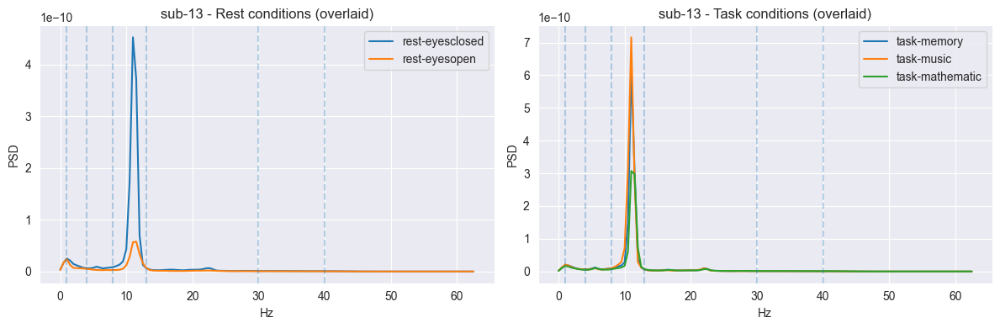

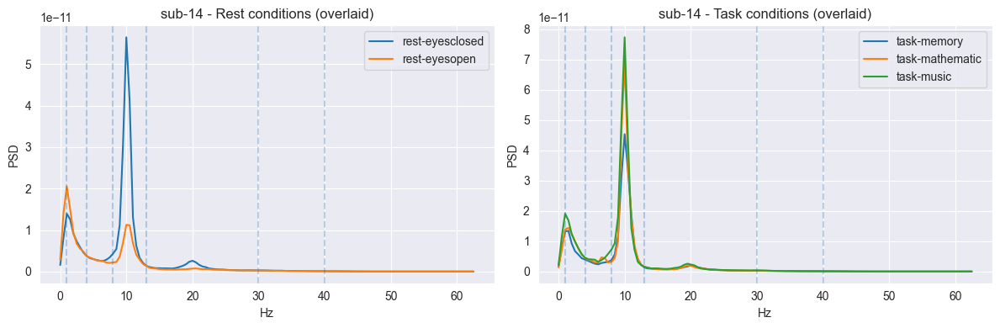

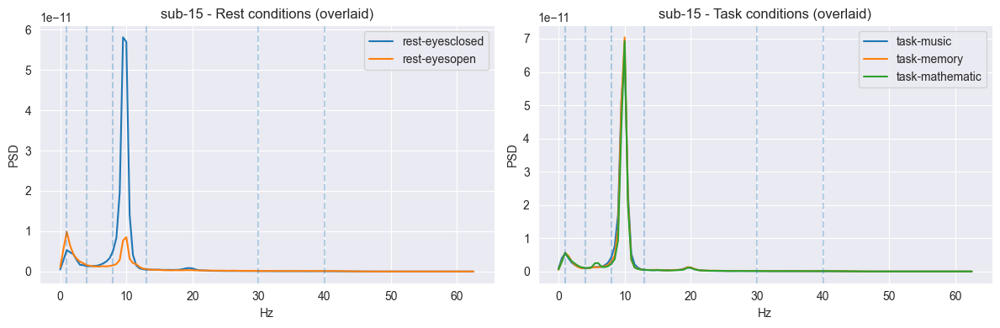

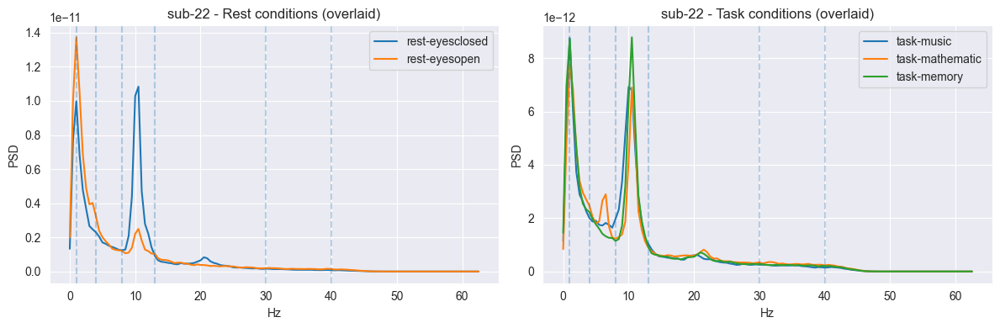

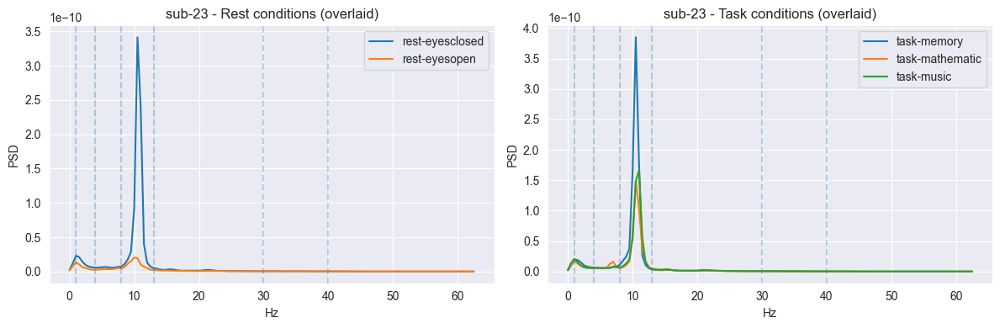

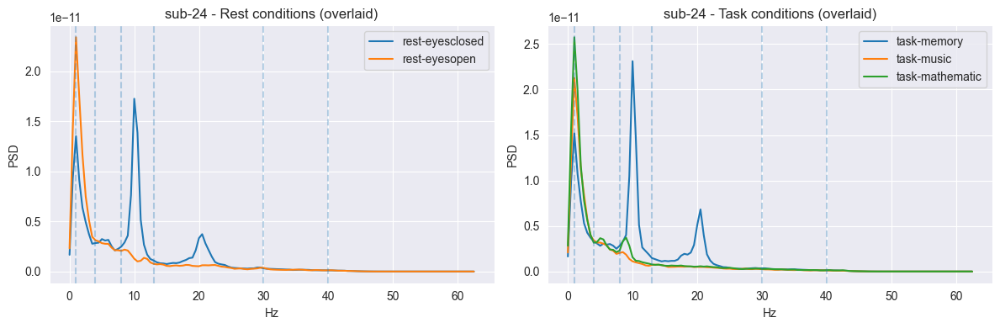

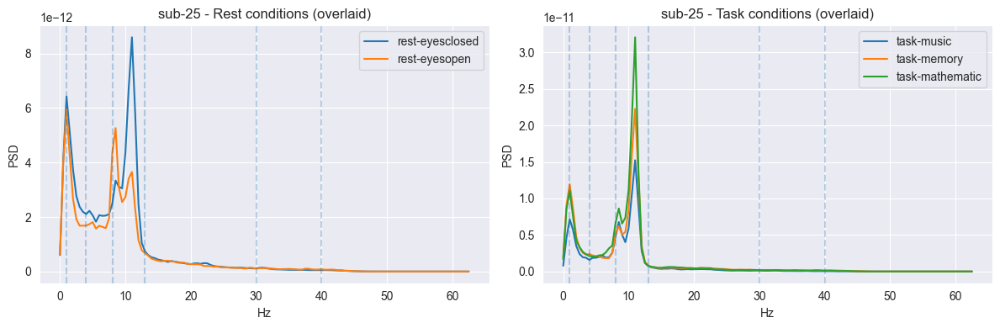

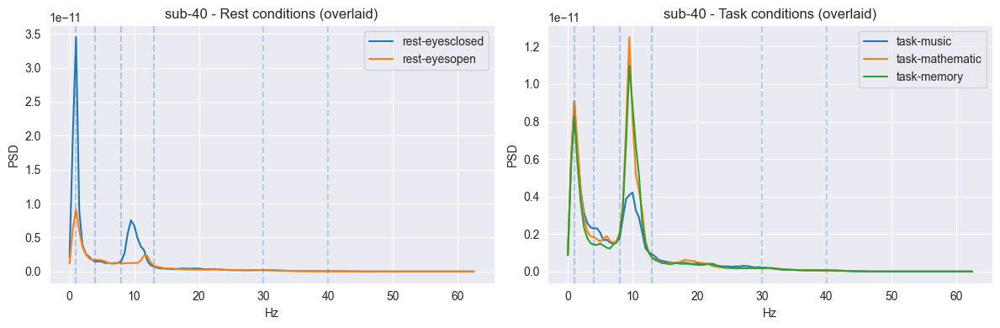

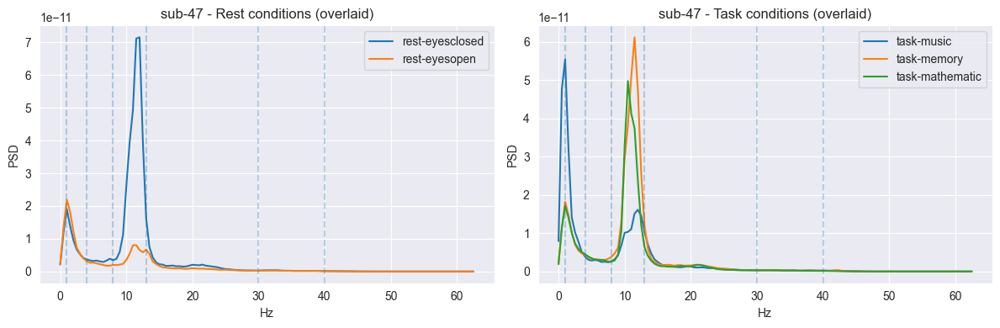

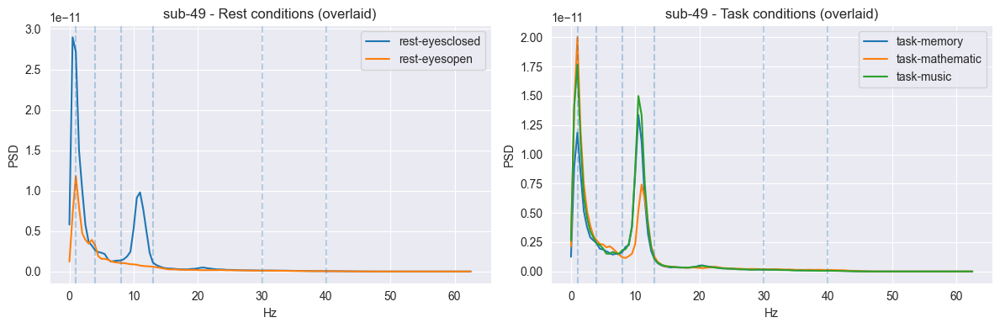

In [30]:
# Visualization 1: Side-by-side comparison
# Left: Both rest conditions overlaid
# Right: All tasks overlaid

for subj in rest_stats.keys():
    fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(12, 4))

    # LEFT: Rest conditions (eyes closed and eyes open)
    if subj in rest_files and len(rest_files[subj]) > 0:
        for rest_file in rest_files[subj]:
            rest_name = os.path.basename(rest_file).split('_task-')[1].split('_')[0]
            x_rest_temp = load_signal(rest_file, CHANNEL)
            if not is_bad_signal(x_rest_temp):
                freqs_temp, psd_temp = welch(x_rest_temp, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                ax_left.plot(freqs_temp, psd_temp, label=f"rest-{rest_name}")

    for b in band_edges:
        ax_left.axvline(b, linestyle="--", alpha=0.3)
    ax_left.set_xlabel("Hz")
    ax_left.set_ylabel("PSD")
    ax_left.set_title(f"{subj} - Rest conditions (overlaid)")
    ax_left.legend()

    # RIGHT: All task conditions
    if subj in task_files and len(task_files[subj]) > 0:
        for task_file in task_files[subj]:
            task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]
            x_task_temp = load_signal(task_file, CHANNEL)
            if not is_bad_signal(x_task_temp):
                freqs_temp, psd_temp = welch(x_task_temp, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                ax_right.plot(freqs_temp, psd_temp, label=f"task-{task_name}")

    for b in band_edges:
        ax_right.axvline(b, linestyle="--", alpha=0.3)
    ax_right.set_xlabel("Hz")
    ax_right.set_ylabel("PSD")
    ax_right.set_title(f"{subj} - Task conditions (overlaid)")
    ax_right.legend()

    plt.tight_layout()
    plt.show()

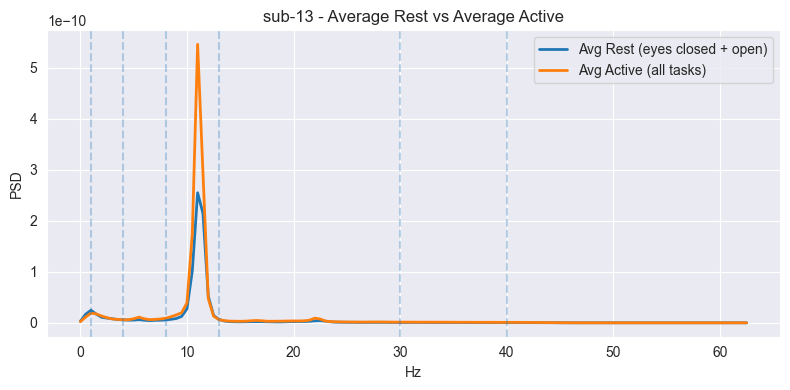

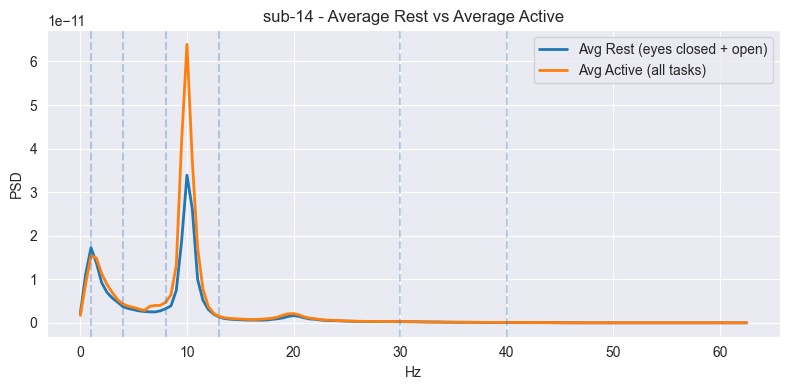

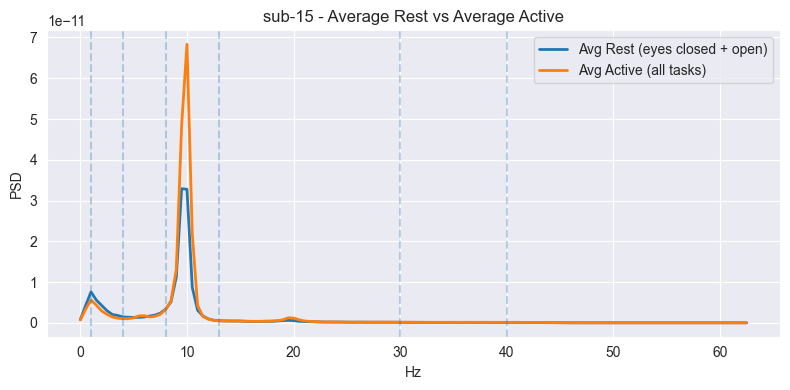

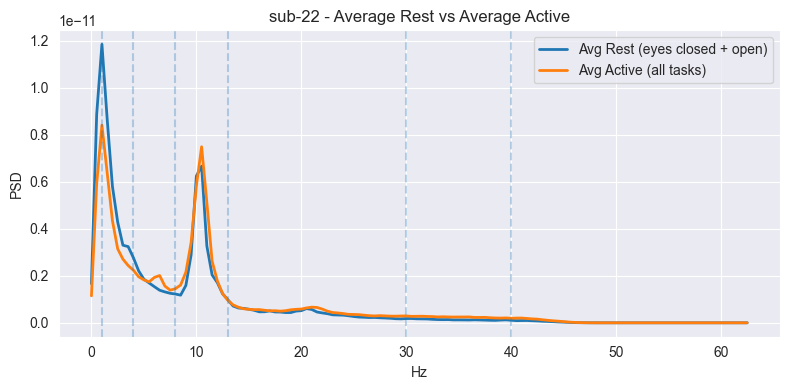

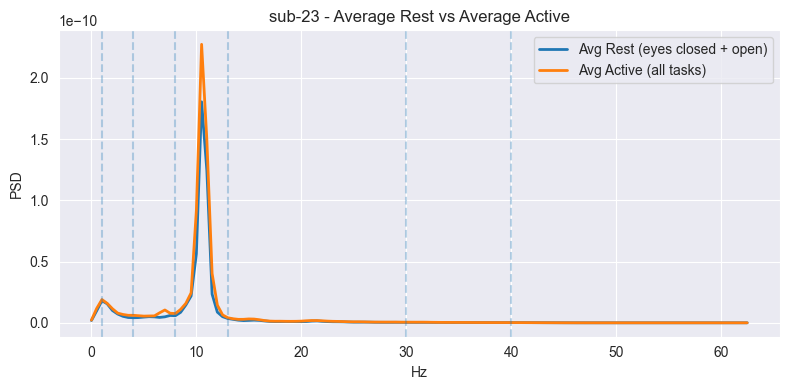

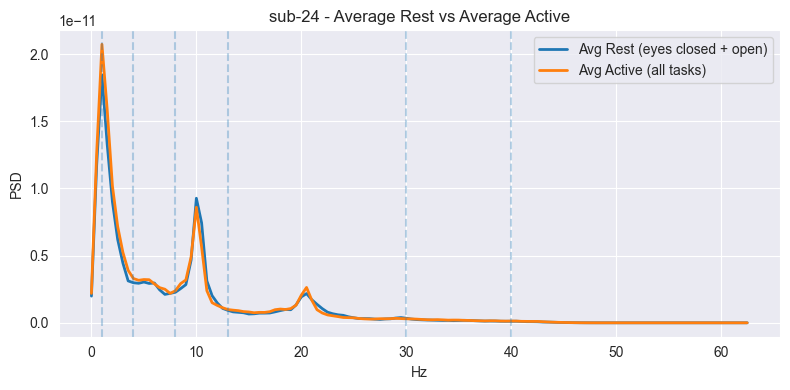

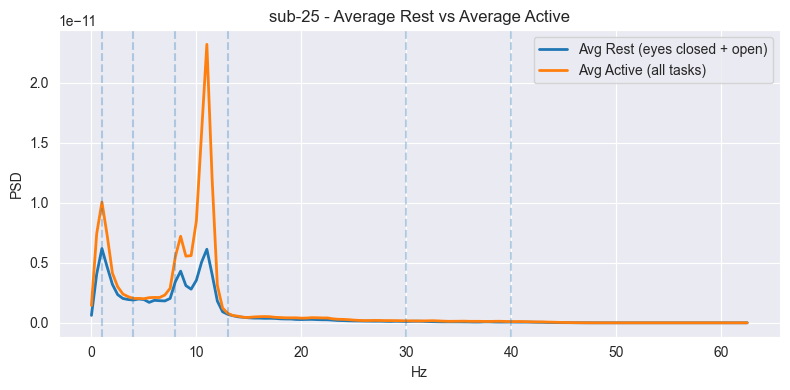

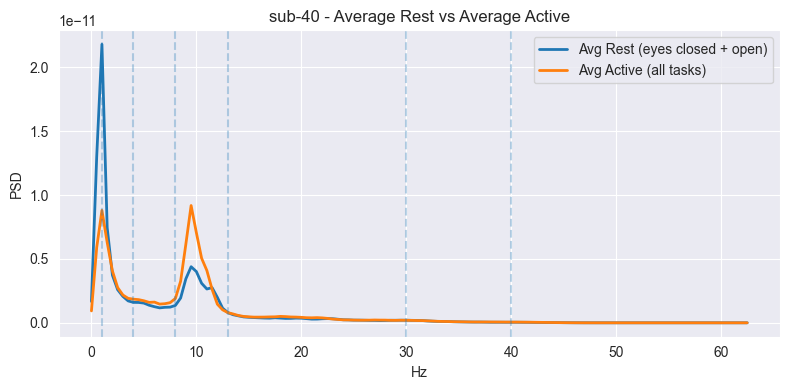

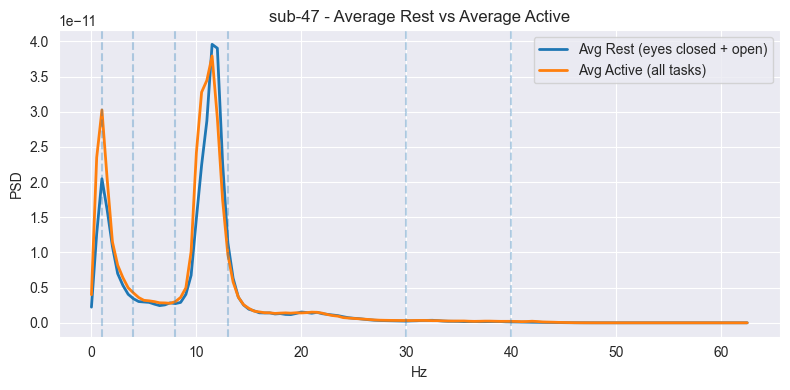

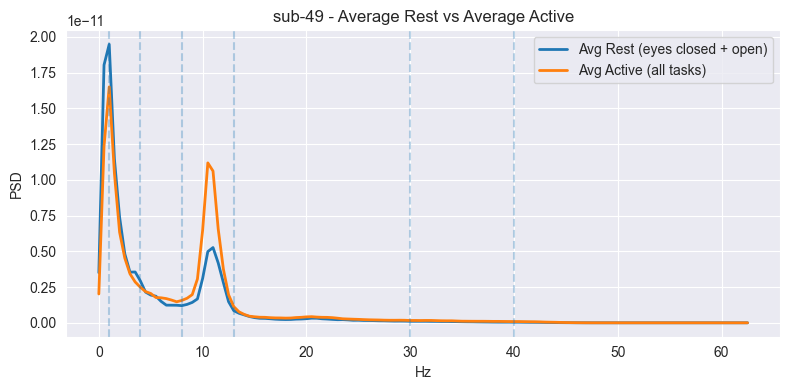

In [31]:
# Visualization 2: Average rest vs average task
# Averaged resting signal (both eyes closed and open) vs averaged active tasks

for subj in rest_stats.keys():
    plt.figure(figsize=(8, 4))

    # Compute average resting PSD
    rest_psds = []
    if subj in rest_files and len(rest_files[subj]) > 0:
        for rest_file in rest_files[subj]:
            x_rest_temp = load_signal(rest_file, CHANNEL)
            if not is_bad_signal(x_rest_temp):
                freqs_rest, psd_temp = welch(x_rest_temp, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                rest_psds.append(psd_temp)

    if rest_psds:
        avg_rest_psd = np.mean(rest_psds, axis=0)
        plt.plot(freqs_rest, avg_rest_psd, label="Avg Rest (eyes closed + open)", linewidth=2)

    # Compute average task PSD
    task_psds = []
    if subj in task_files and len(task_files[subj]) > 0:
        for task_file in task_files[subj]:
            x_task_temp = load_signal(task_file, CHANNEL)
            if not is_bad_signal(x_task_temp):
                freqs_task, psd_temp = welch(x_task_temp, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                task_psds.append(psd_temp)

    if task_psds:
        avg_task_psd = np.mean(task_psds, axis=0)
        plt.plot(freqs_task, avg_task_psd, label="Avg Active (all tasks)", linewidth=2)

    for b in band_edges:
        plt.axvline(b, linestyle="--", alpha=0.3)

    plt.title(f"{subj} - Average Rest vs Average Active")
    plt.xlabel("Hz")
    plt.ylabel("PSD")
    plt.legend()
    plt.tight_layout()
    plt.show()

## eyes open vs closed

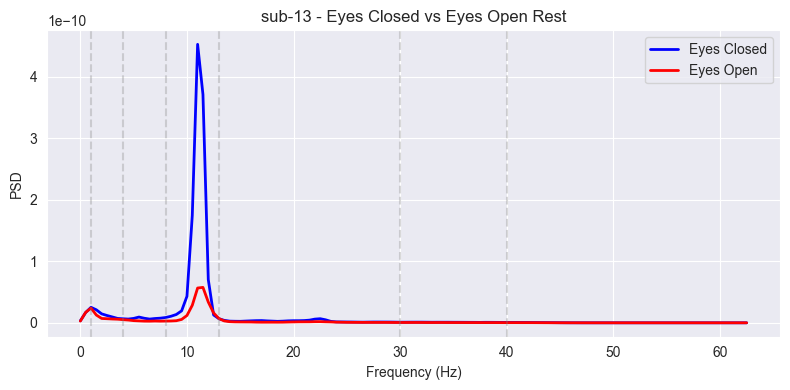

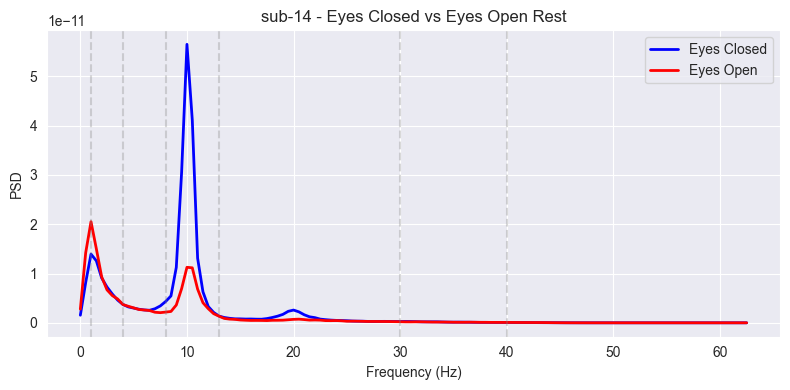

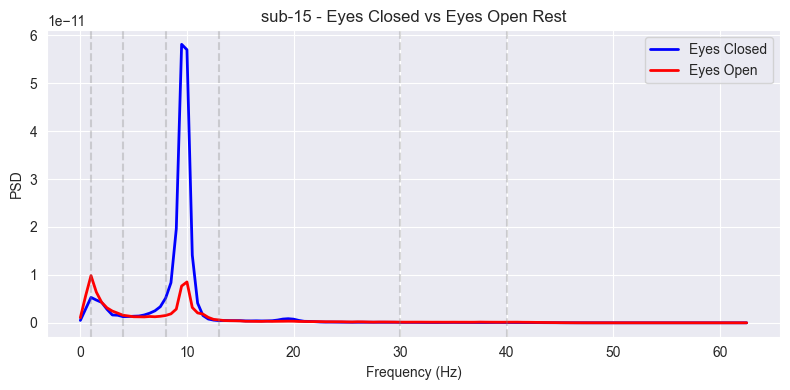

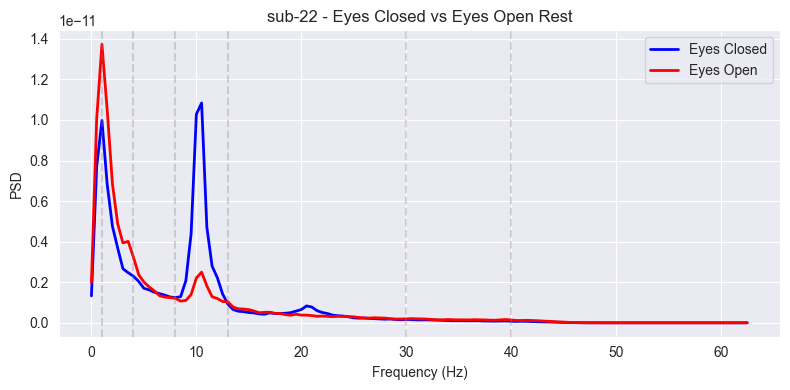

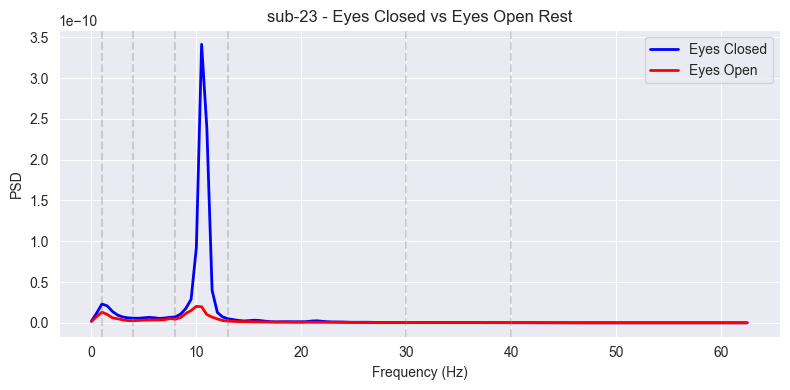

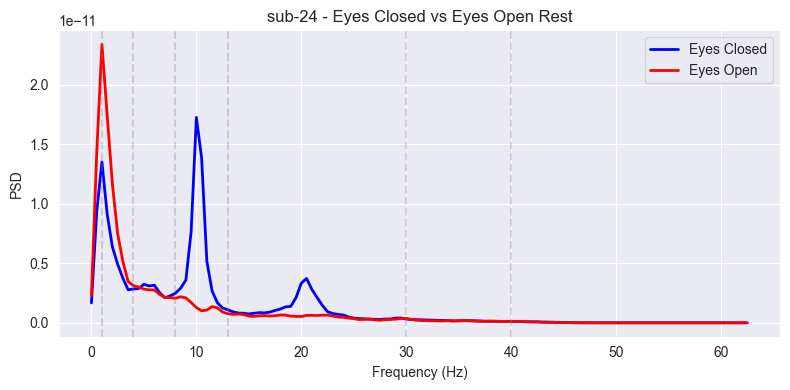

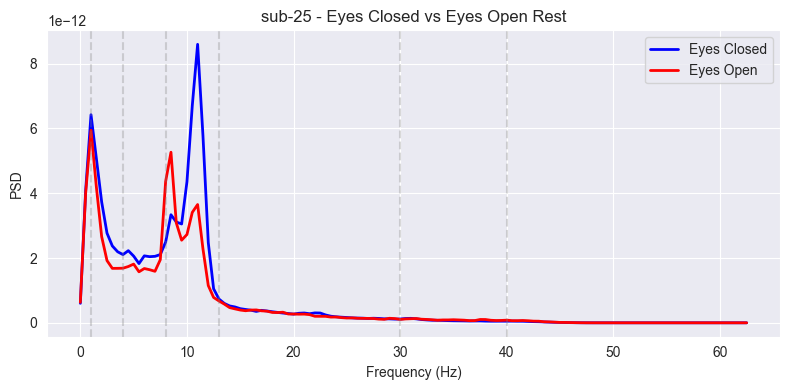

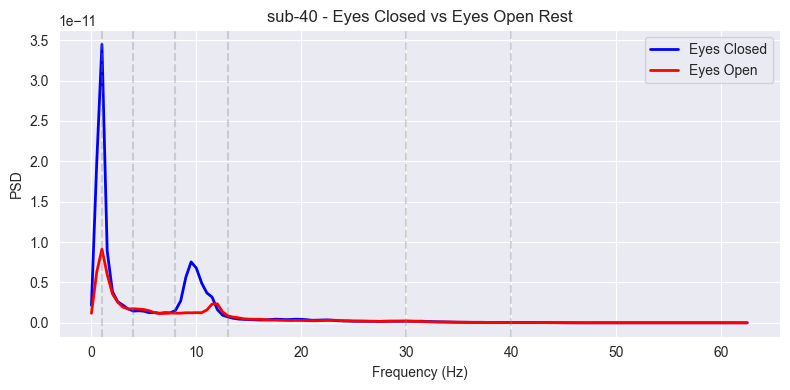

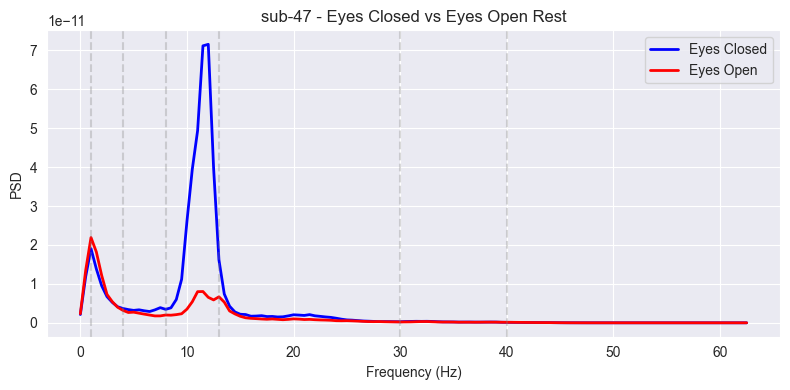

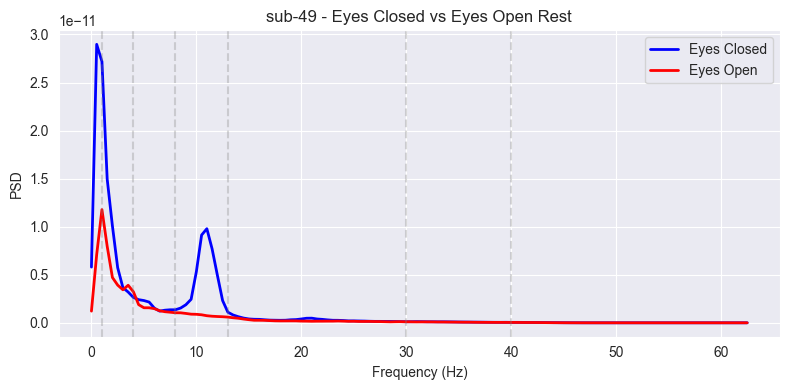

In [53]:
# Visualization: Eyesopen vs Eyesclosed Rest per subject
for subj in rest_stats.keys():
    plt.figure(figsize=(8, 4))

    # Find and plot eyesclosed rest
    if subj in rest_files and len(rest_files[subj]) > 0:
        for rest_file in rest_files[subj]:
            if 'task-eyesclosed' in rest_file:
                x_rest_temp = load_signal(rest_file, CHANNEL)
                if not is_bad_signal(x_rest_temp):
                    freqs_closed, psd_closed = welch(x_rest_temp, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                    plt.plot(freqs_closed, psd_closed, label="Eyes Closed", linewidth=2, color='blue')
                break

    # Find and plot eyesopen rest
    if subj in rest_files and len(rest_files[subj]) > 0:
        for rest_file in rest_files[subj]:
            if 'task-eyesopen' in rest_file:
                x_rest_temp = load_signal(rest_file, CHANNEL)
                if not is_bad_signal(x_rest_temp):
                    freqs_open, psd_open = welch(x_rest_temp, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                    plt.plot(freqs_open, psd_open, label="Eyes Open", linewidth=2, color='red')
                break

    # Add band edges (alpha band highlighted)
    for b in band_edges:
        plt.axvline(b, linestyle="--", alpha=0.3, color='gray')

    # Highlight alpha band (8-13 Hz)
    # plt.axvspan(8, 13, alpha=0.2, color='yellow', label='Alpha band (8-13 Hz)')

    plt.title(f"{subj} - Eyes Closed vs Eyes Open Rest")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("PSD")
    plt.legend()
    plt.tight_layout()
    plt.show()

## eyes open vs closed - only alpha

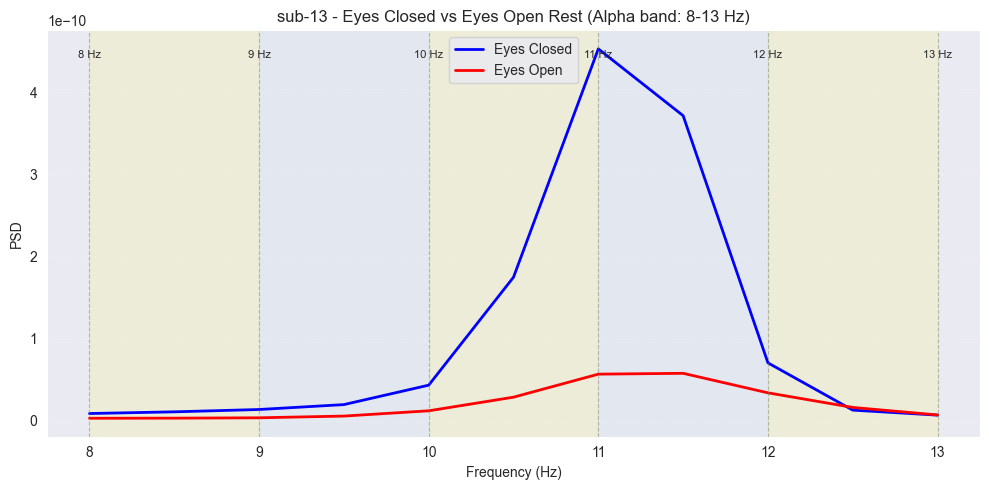

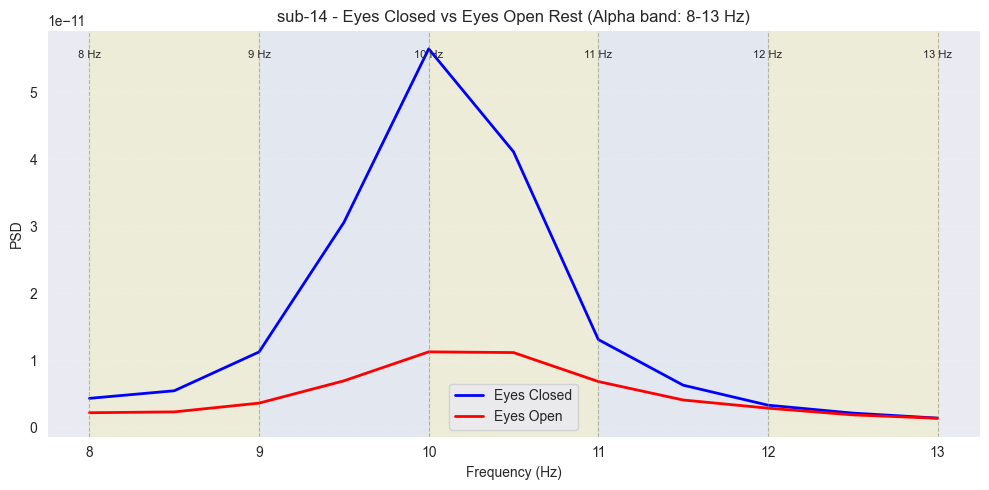

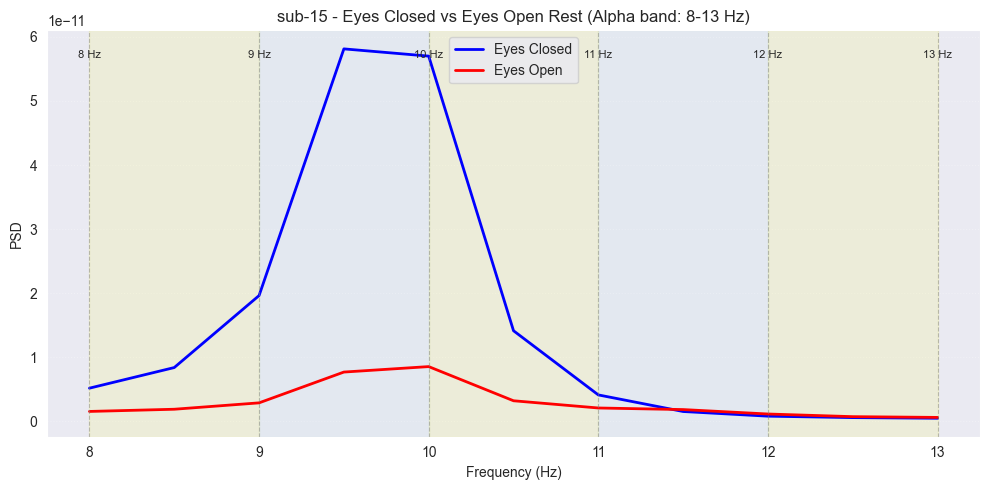

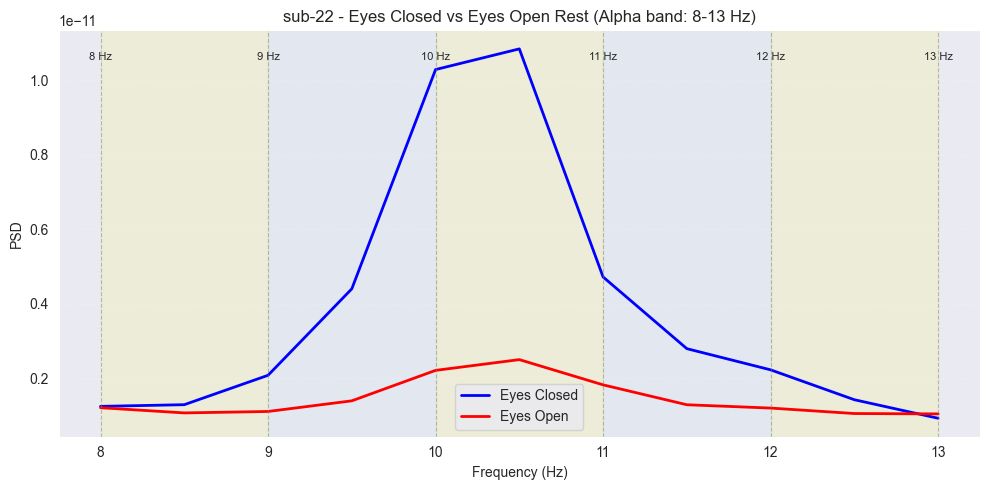

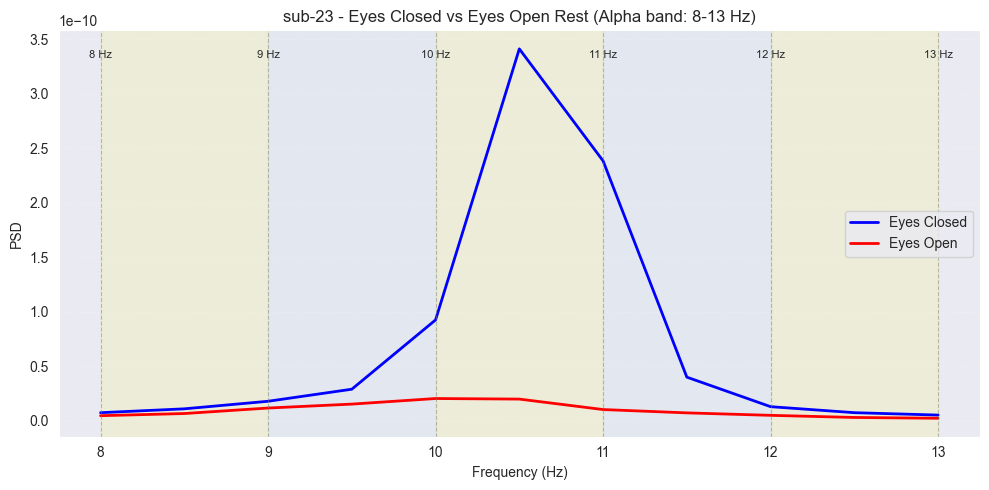

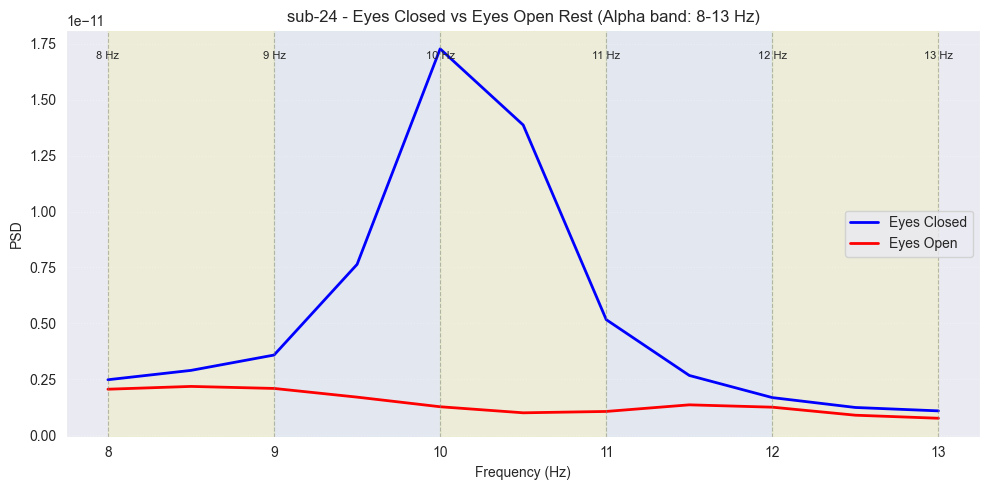

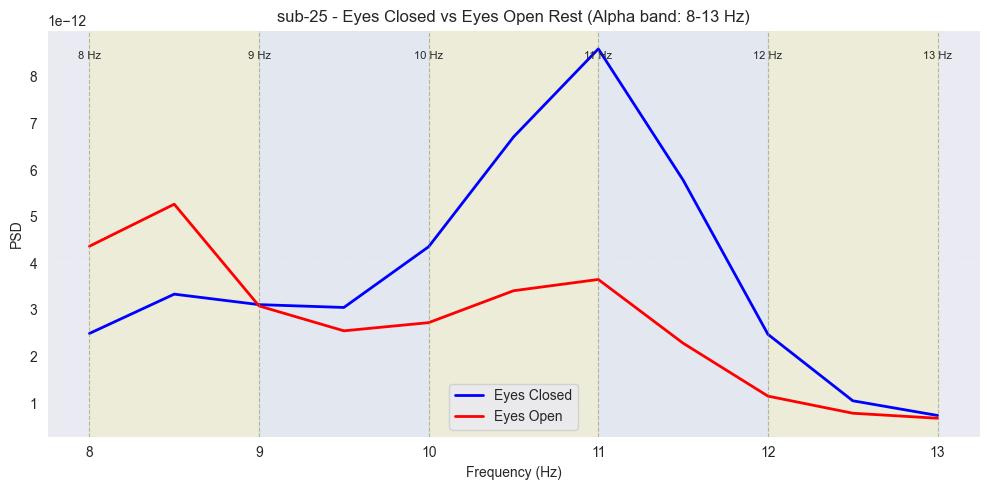

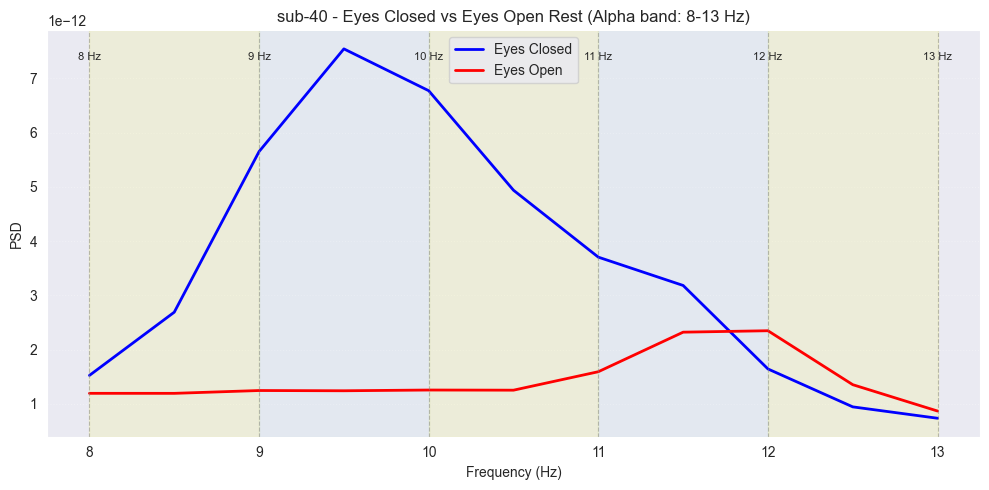

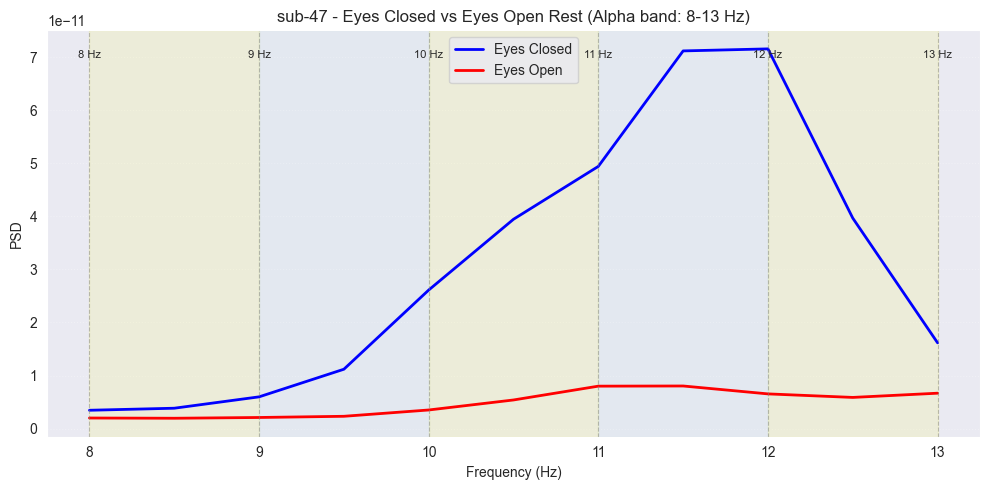

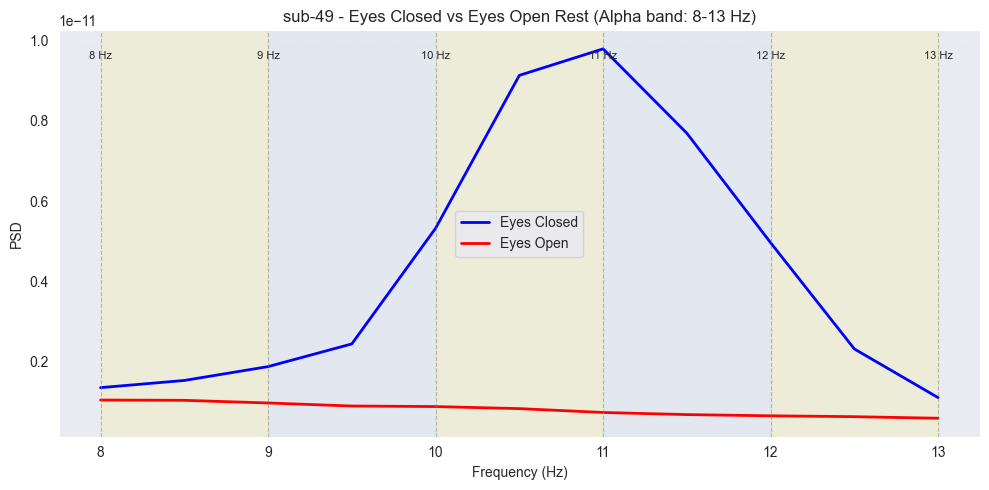

In [54]:
# Visualization: Eyesopen vs Eyesclosed Rest - Alpha band only (8-13 Hz) with integer borders
for subj in rest_stats.keys():
    plt.figure(figsize=(10, 5))

    # Find and plot eyesclosed rest
    if subj in rest_files and len(rest_files[subj]) > 0:
        for rest_file in rest_files[subj]:
            if 'task-eyesclosed' in rest_file:
                x_rest_temp = load_signal(rest_file, CHANNEL)
                if not is_bad_signal(x_rest_temp):
                    freqs, psd_closed = welch(x_rest_temp, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                    # Filter to alpha range only
                    alpha_mask = (freqs >= 8) & (freqs <= 13)
                    freqs_alpha = freqs[alpha_mask]
                    psd_closed_alpha = psd_closed[alpha_mask]
                    plt.plot(freqs_alpha, psd_closed_alpha, label="Eyes Closed", linewidth=2, color='blue')
                break

    # Find and plot eyesopen rest
    if subj in rest_files and len(rest_files[subj]) > 0:
        for rest_file in rest_files[subj]:
            if 'task-eyesopen' in rest_file:
                x_rest_temp = load_signal(rest_file, CHANNEL)
                if not is_bad_signal(x_rest_temp):
                    freqs, psd_open = welch(x_rest_temp, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                    # Filter to alpha range only
                    alpha_mask = (freqs >= 8) & (freqs <= 13)
                    freqs_alpha = freqs[alpha_mask]
                    psd_open_alpha = psd_open[alpha_mask]
                    plt.plot(freqs_alpha, psd_open_alpha, label="Eyes Open", linewidth=2, color='red')
                break

    # Add vertical lines at integer borders (8,9,10,11,12,13 Hz)
    for freq in range(8, 14):
        plt.axvline(x=freq, linestyle='--', alpha=0.5, color='gray', linewidth=0.8)
        plt.text(freq, plt.ylim()[1] * 0.95, f'{freq} Hz',
                 ha='center', va='top', fontsize=8, rotation=0)

    # Add subtle background shading for each 1-Hz sub-band
    for i in range(8, 13):
        plt.axvspan(i, i+1, alpha=0.1, color='yellow' if i % 2 == 0 else 'lightblue')

    plt.title(f"{subj} - Eyes Closed vs Eyes Open Rest (Alpha band: 8-13 Hz)")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("PSD")
    plt.legend()
    plt.grid(True, alpha=0.3, linestyle=':')
    plt.tight_layout()
    plt.show()

## open vs closed - only alpha averaged on subjects

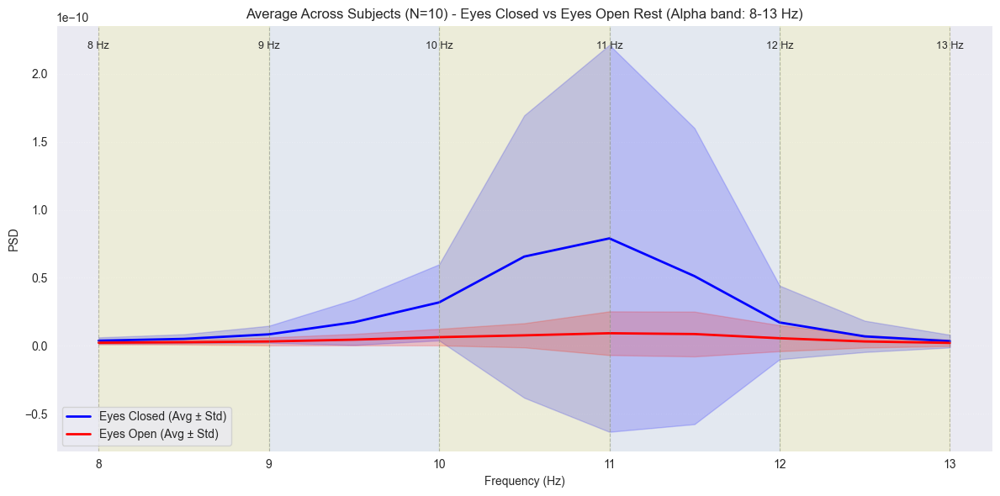

In [55]:
# Average across subjects: Eyesopen vs Eyesclosed Rest - Alpha band only (8-13 Hz) with integer borders
plt.figure(figsize=(12, 6))

all_psd_closed = []
all_psd_open = []
common_freqs = None

for subj in rest_stats.keys():
    psd_closed = None
    psd_open = None

    # Find eyesclosed rest
    if subj in rest_files and len(rest_files[subj]) > 0:
        for rest_file in rest_files[subj]:
            if 'task-eyesclosed' in rest_file:
                x_rest_temp = load_signal(rest_file, CHANNEL)
                if not is_bad_signal(x_rest_temp):
                    freqs, psd = welch(x_rest_temp, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                    # Filter to alpha range only
                    alpha_mask = (freqs >= 8) & (freqs <= 13)
                    common_freqs = freqs[alpha_mask]  # Should be same for all
                    psd_closed = psd[alpha_mask]
                break

    # Find eyesopen rest
    if subj in rest_files and len(rest_files[subj]) > 0:
        for rest_file in rest_files[subj]:
            if 'task-eyesopen' in rest_file:
                x_rest_temp = load_signal(rest_file, CHANNEL)
                if not is_bad_signal(x_rest_temp):
                    freqs, psd = welch(x_rest_temp, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                    # Filter to alpha range only
                    alpha_mask = (freqs >= 8) & (freqs <= 13)
                    psd_open = psd[alpha_mask]
                break

    if psd_closed is not None and psd_open is not None:
        all_psd_closed.append(psd_closed)
        all_psd_open.append(psd_open)

# Calculate average and standard deviation
avg_psd_closed = np.mean(all_psd_closed, axis=0)
std_psd_closed = np.std(all_psd_closed, axis=0)
avg_psd_open = np.mean(all_psd_open, axis=0)
std_psd_open = np.std(all_psd_open, axis=0)

# Plot average with shaded error regions
plt.plot(common_freqs, avg_psd_closed, label="Eyes Closed (Avg ± Std)", linewidth=2, color='blue')
plt.fill_between(common_freqs, avg_psd_closed - std_psd_closed, avg_psd_closed + std_psd_closed,
                 color='blue', alpha=0.2)

plt.plot(common_freqs, avg_psd_open, label="Eyes Open (Avg ± Std)", linewidth=2, color='red')
plt.fill_between(common_freqs, avg_psd_open - std_psd_open, avg_psd_open + std_psd_open,
                 color='red', alpha=0.2)

# Add vertical lines at integer borders (8,9,10,11,12,13 Hz)
for freq in range(8, 14):
    plt.axvline(x=freq, linestyle='--', alpha=0.5, color='gray', linewidth=0.8)
    plt.text(freq, plt.ylim()[1] * 0.95, f'{freq} Hz',
             ha='center', va='top', fontsize=9)

# Add subtle background shading for each 1-Hz sub-band
for i in range(8, 13):
    plt.axvspan(i, i+1, alpha=0.1, color='yellow' if i % 2 == 0 else 'lightblue')

plt.title(f"Average Across Subjects (N={len(all_psd_closed)}) - Eyes Closed vs Eyes Open Rest (Alpha band: 8-13 Hz)")
plt.xlabel("Frequency (Hz)")
plt.ylabel("PSD")
plt.legend()
plt.grid(True, alpha=0.3, linestyle=':')
plt.tight_layout()
plt.show()

# PLOT - bands_norm

## Normalized Band Power Differences: Task vs Rest - per subject

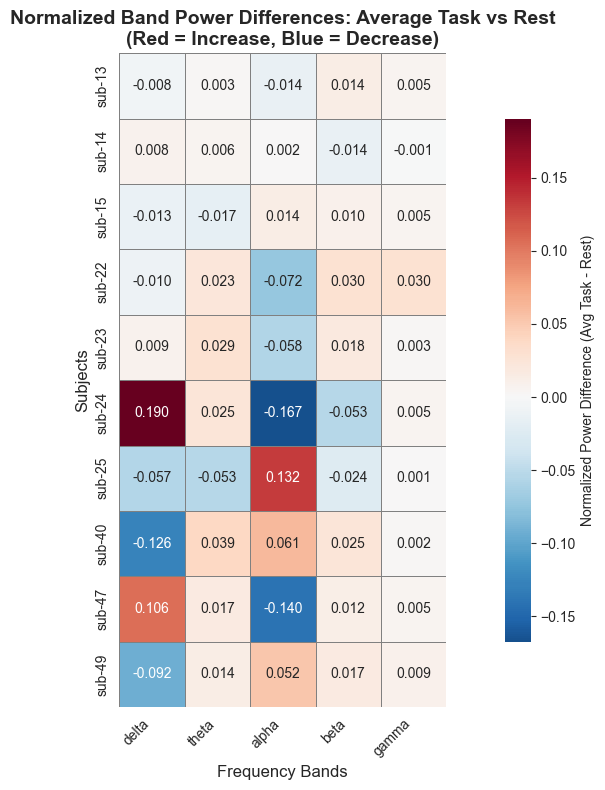

In [43]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

bands_list = list(bands.keys())  # e.g., ['delta', 'theta', 'alpha', 'beta', 'gamma']
diff_matrix = []
subject_names = []

for subj in valid_subjects:
    # Get normalized band powers for rest (use first or average)
    rest_bands = rest_stats[subj]["bands_norm"]

    # Get ALL task bands for this subject and average them
    task_bands_list = []
    task_keys = [k for k in task_stats.keys() if k.startswith(f"{subj}_")]

    for task_key in task_keys:
        task_bands_list.append(task_stats[task_key]["bands_norm"])

    if task_bands_list:
        # Average across all tasks for this subject
        avg_task_bands = {band: np.mean([tb[band] for tb in task_bands_list])
                          for band in bands_list}

        # Calculate difference (Average Task - Rest)
        band_diffs = [avg_task_bands[band] - rest_bands[band] for band in bands_list]
        diff_matrix.append(band_diffs)
        subject_names.append(subj)

# Convert to DataFrame
df_diffs = pd.DataFrame(diff_matrix, columns=bands_list, index=subject_names)

# ============================================
# 1. HEATMAP OF DIFFERENCES (Average Tasks)
# ============================================
fig, ax = plt.subplots(figsize=(12, 8))

# Create heatmap
im = sns.heatmap(df_diffs,
                 annot=True,           # Show values
                 fmt='.3f',            # 3 decimal places
                 cmap='RdBu_r',        # Red-Blue colormap (red=increase, blue=decrease)
                 center=0,             # Center at zero
                 square=True,          # Square cells
                 linewidths=0.5,       # Grid lines
                 linecolor='gray',
                 cbar_kws={'label': 'Normalized Power Difference (Avg Task - Rest)',
                          'shrink': 0.8},
                 ax=ax)

# Customize
ax.set_title('Normalized Band Power Differences: Average Task vs Rest\n(Red = Increase, Blue = Decrease)',
             fontsize=14, fontweight='bold')
ax.set_xlabel('Frequency Bands', fontsize=12)
ax.set_ylabel('Subjects', fontsize=12)

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

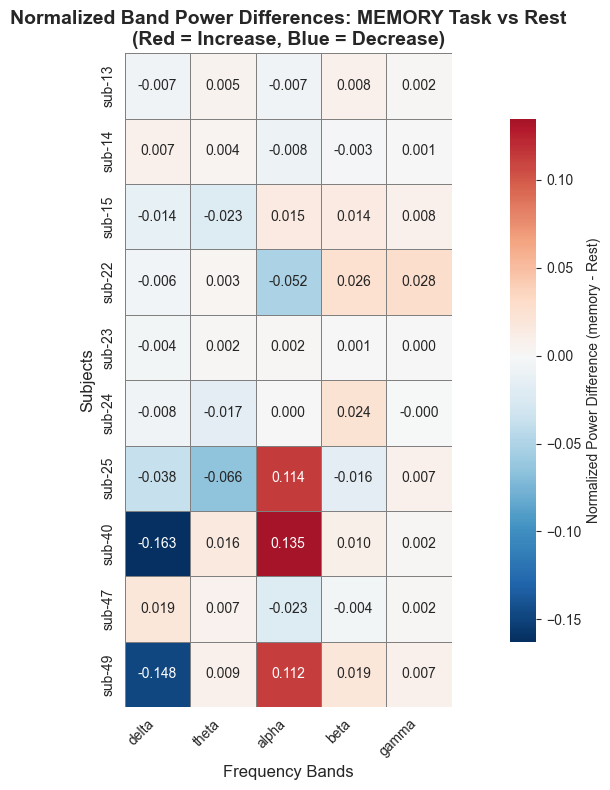

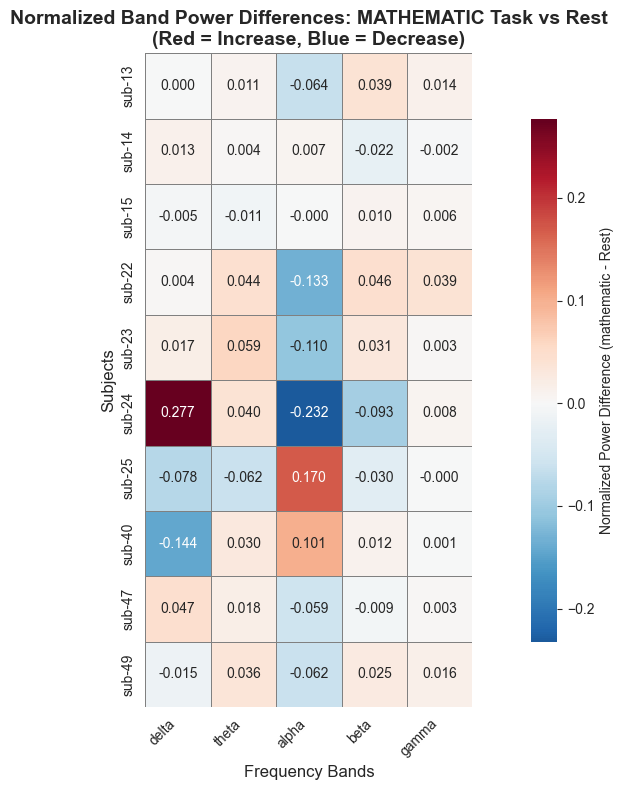

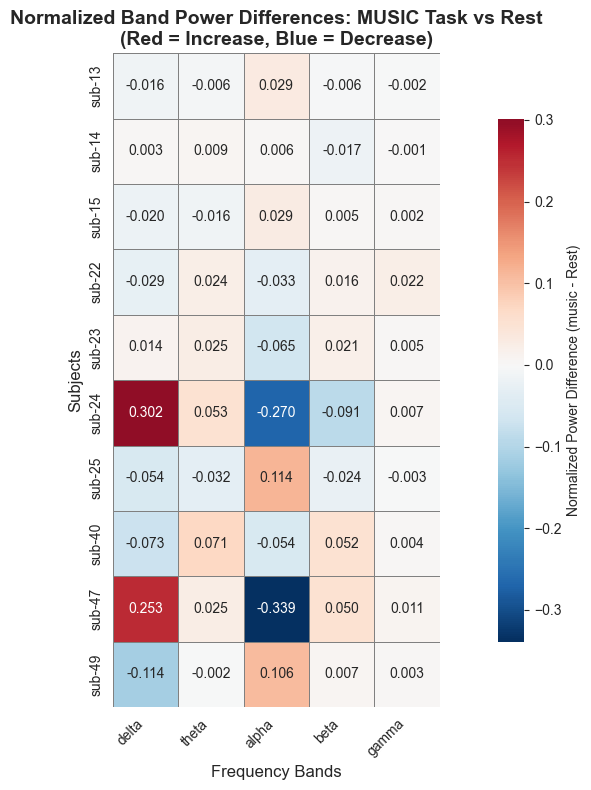

In [45]:
task_conditions = ['memory', 'mathematic', 'music']

for task_cond in task_conditions:
    diff_matrix_task = []
    subject_names_task = []

    for subj in valid_subjects:
        rest_bands = rest_stats[subj]["bands_norm"]

        # Find specific task
        task_key = f"{subj}_{task_cond}"

        if task_key in task_stats:
            task_bands = task_stats[task_key]["bands_norm"]
            band_diffs = [task_bands[band] - rest_bands[band] for band in bands_list]
            diff_matrix_task.append(band_diffs)
            subject_names_task.append(subj)

    if diff_matrix_task:
        df_diffs_task = pd.DataFrame(diff_matrix_task, columns=bands_list, index=subject_names_task)

        fig, ax = plt.subplots(figsize=(12, 8))

        im = sns.heatmap(df_diffs_task,
                         annot=True,
                         fmt='.3f',
                         cmap='RdBu_r',
                         center=0,
                         square=True,
                         linewidths=0.5,
                         linecolor='gray',
                         cbar_kws={'label': f'Normalized Power Difference ({task_cond} - Rest)',
                                  'shrink': 0.8},
                         ax=ax)

        ax.set_title(f'Normalized Band Power Differences: {task_cond.upper()} Task vs Rest\n(Red = Increase, Blue = Decrease)',
                     fontsize=14, fontweight='bold')
        ax.set_xlabel('Frequency Bands', fontsize=12)
        ax.set_ylabel('Subjects', fontsize=12)

        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

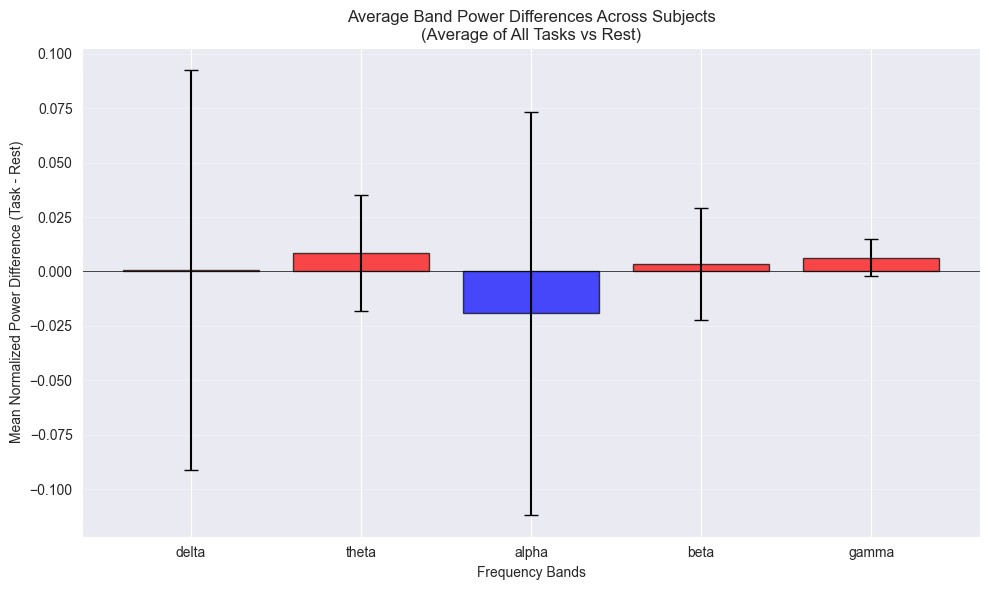

In [44]:
mean_diffs = df_diffs.mean(axis=0)
std_diffs = df_diffs.std(axis=0)

fig, ax = plt.subplots(figsize=(10, 6))
x_pos = np.arange(len(bands_list))

bars = ax.bar(x_pos, mean_diffs, yerr=std_diffs, capsize=5,
              color=['red' if md > 0 else 'blue' for md in mean_diffs],
              alpha=0.7, edgecolor='black')

ax.axhline(y=0, color='black', linestyle='-', linewidth=0.5)
ax.set_xticks(x_pos)
ax.set_xticklabels(bands_list)
ax.set_ylabel('Mean Normalized Power Difference (Task - Rest)')
ax.set_xlabel('Frequency Bands')
ax.set_title('Average Band Power Differences Across Subjects\n(Average of All Tasks vs Rest)')
ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/3440122867.py:36: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return np.trapz(psd[mask], freqs[mask])


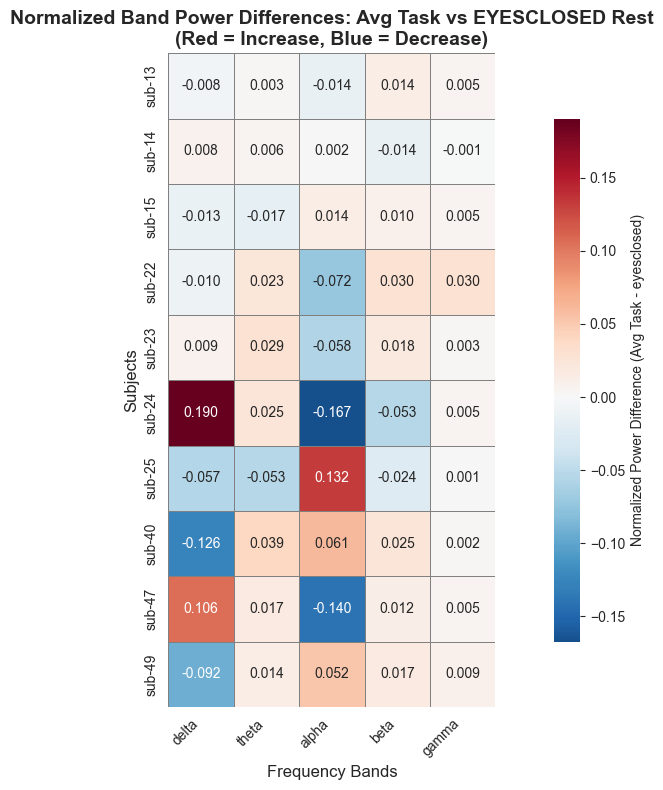

/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/3440122867.py:36: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return np.trapz(psd[mask], freqs[mask])


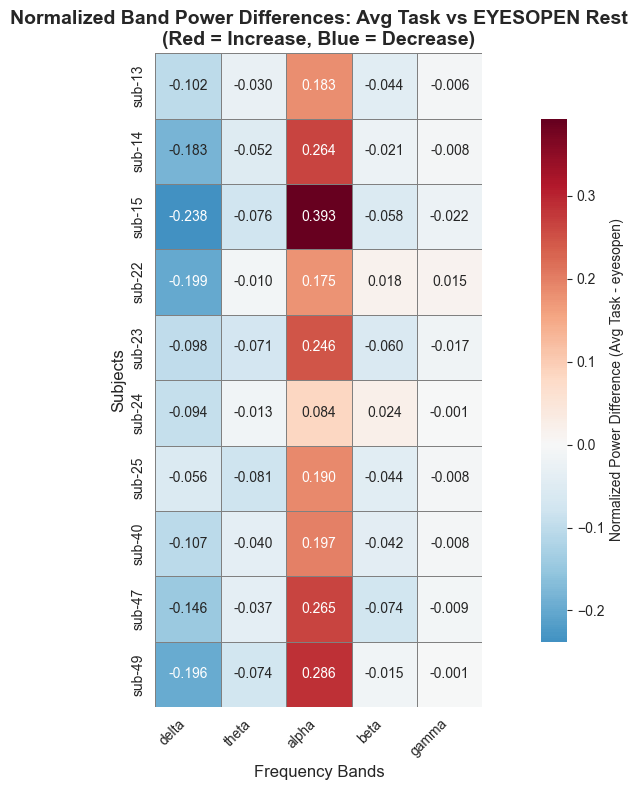

In [46]:
rest_conditions = ['eyesclosed', 'eyesopen']

for rest_cond in rest_conditions:
    diff_matrix_rest = []
    subject_names_rest = []

    for subj in valid_subjects:
        # Find specific rest file for this condition
        rest_file = None
        if subj in rest_files:
            for rf in rest_files[subj]:
                if f'task-{rest_cond}' in rf:
                    rest_file = rf
                    break

        if rest_file:
            # Load and compute rest bands for this specific condition
            x_rest = load_signal(rest_file, CHANNEL)
            if not is_bad_signal(x_rest):
                freqs_r, psd_r = welch(x_rest, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                bands_rest_raw = {k: bandpower(psd_r, freqs_r, v) for k, v in bands.items()}
                total_power_rest = sum(bands_rest_raw.values())
                bands_rest_norm = {k: v / total_power_rest if total_power_rest > 0 else np.nan
                                   for k, v in bands_rest_raw.items()}

                # Get average task bands
                task_keys = [k for k in task_stats.keys() if k.startswith(f"{subj}_")]
                if task_keys:
                    avg_task_bands = {band: np.mean([task_stats[tk]["bands_norm"][band] for tk in task_keys])
                                      for band in bands_list}

                    band_diffs = [avg_task_bands[band] - bands_rest_norm[band] for band in bands_list]
                    diff_matrix_rest.append(band_diffs)
                    subject_names_rest.append(subj)

    if diff_matrix_rest:
        df_diffs_rest = pd.DataFrame(diff_matrix_rest, columns=bands_list, index=subject_names_rest)

        fig, ax = plt.subplots(figsize=(12, 8))

        im = sns.heatmap(df_diffs_rest,
                         annot=True,
                         fmt='.3f',
                         cmap='RdBu_r',
                         center=0,
                         square=True,
                         linewidths=0.5,
                         linecolor='gray',
                         cbar_kws={'label': f'Normalized Power Difference (Avg Task - {rest_cond})',
                                  'shrink': 0.8},
                         ax=ax)

        ax.set_title(f'Normalized Band Power Differences: Avg Task vs {rest_cond.upper()} Rest\n(Red = Increase, Blue = Decrease)',
                     fontsize=14, fontweight='bold')
        ax.set_xlabel('Frequency Bands', fontsize=12)
        ax.set_ylabel('Subjects', fontsize=12)

        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

# PLOT - entropy-complexity plane

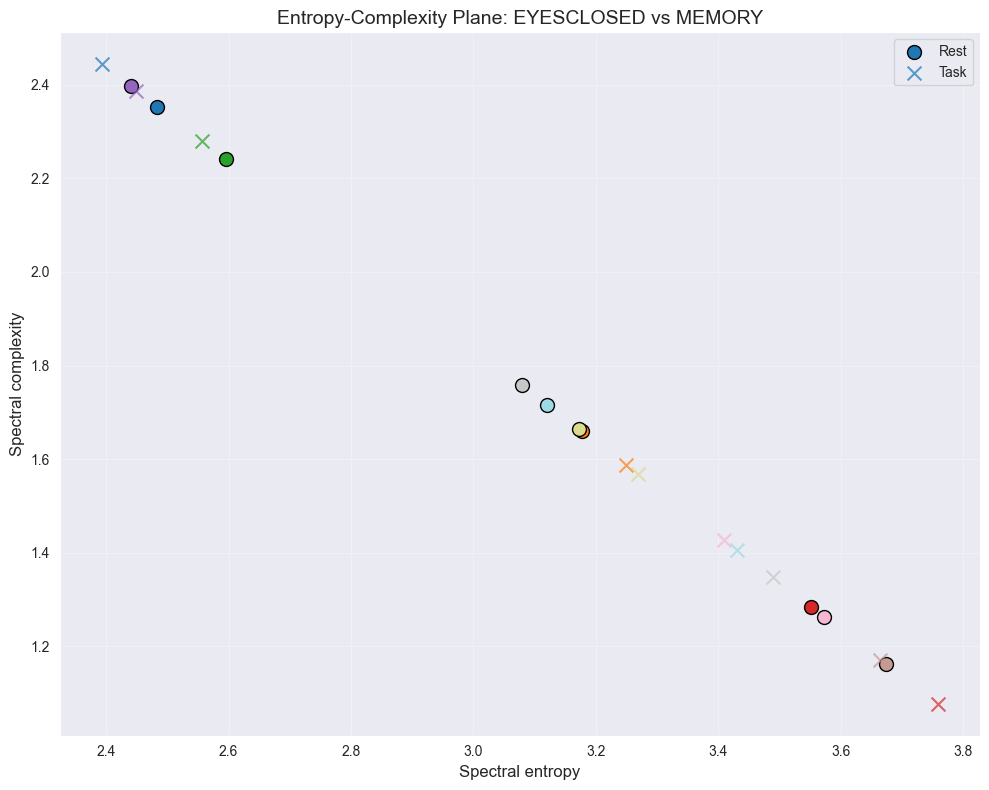

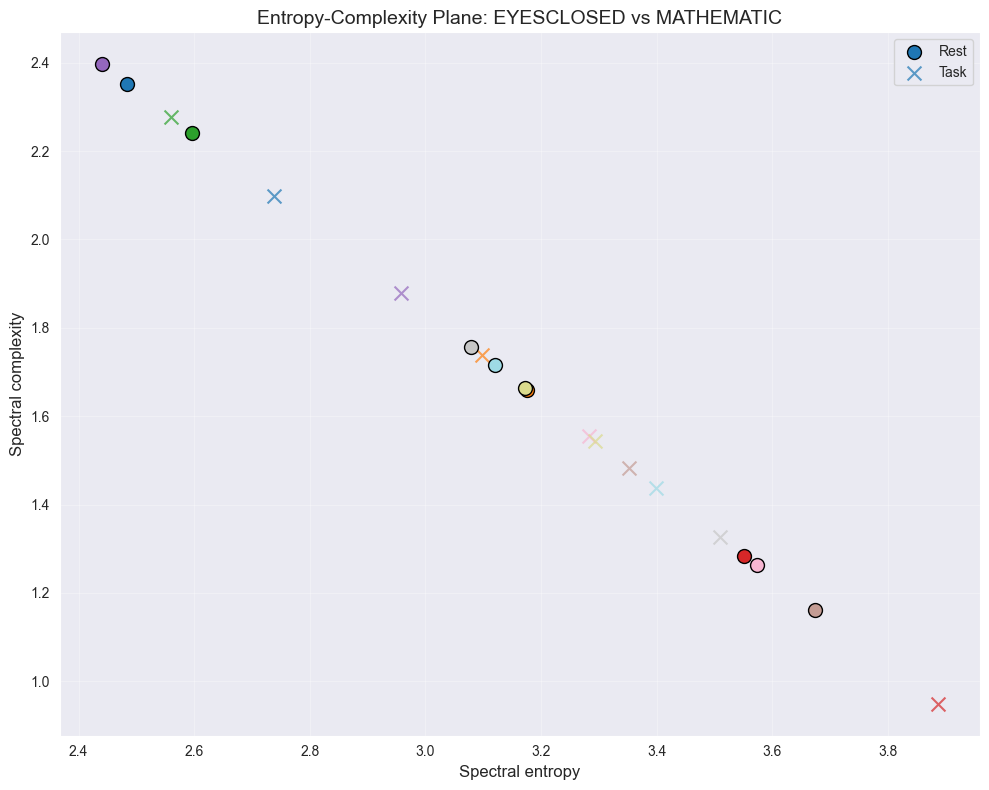

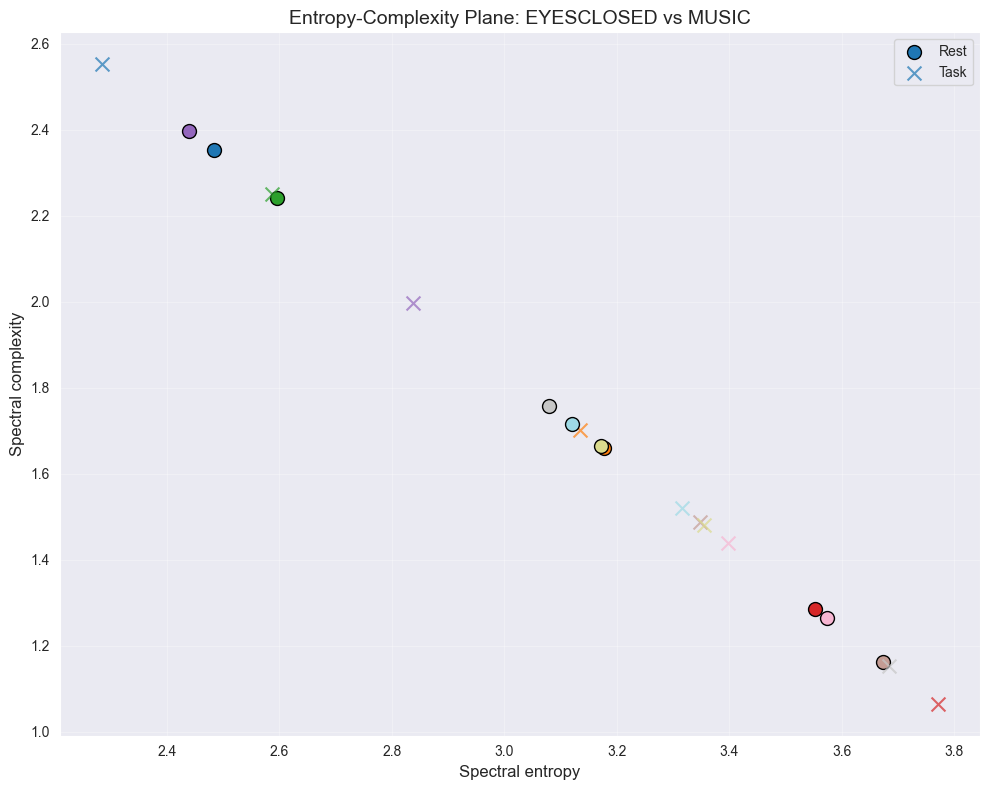

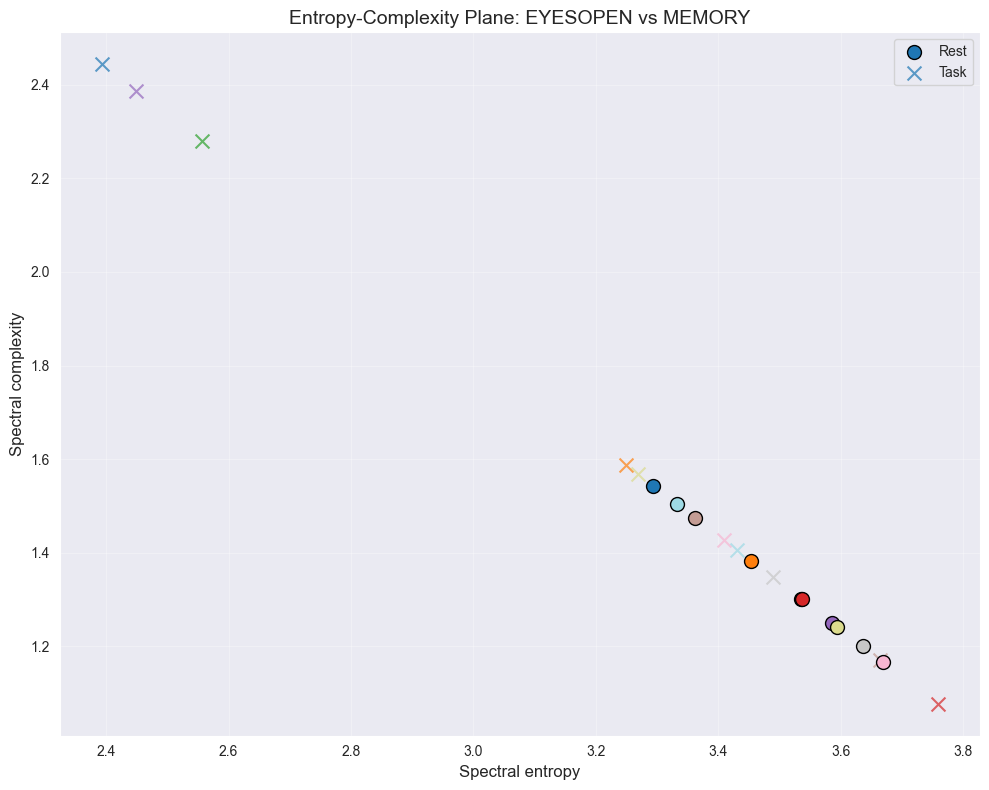

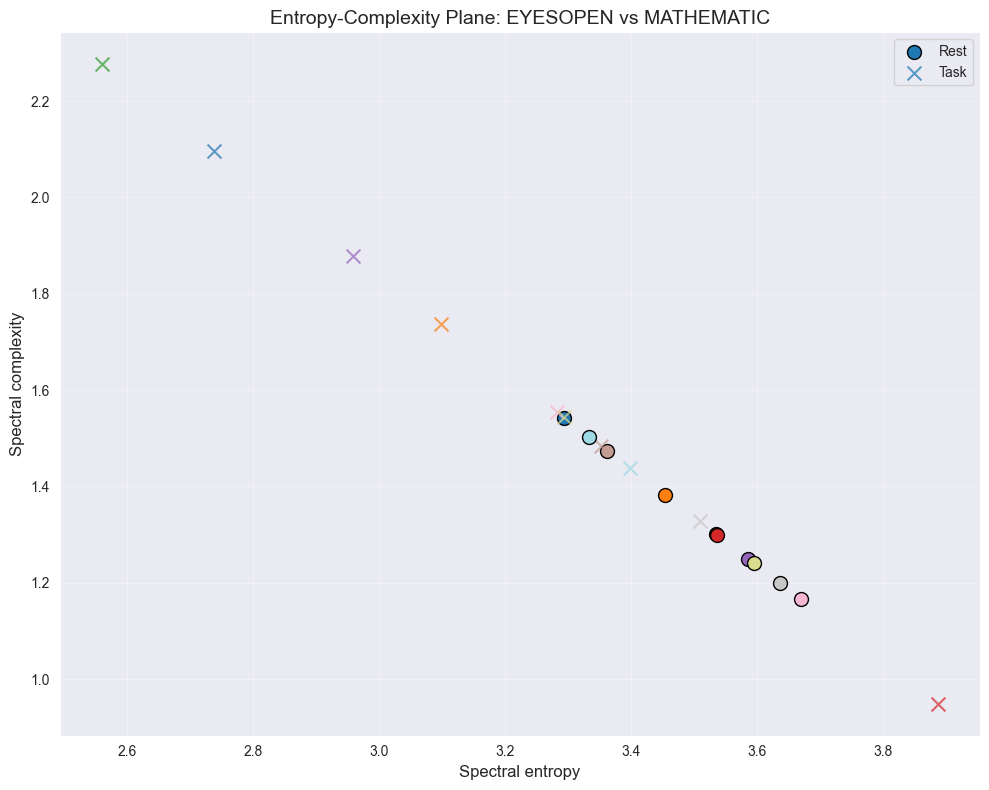

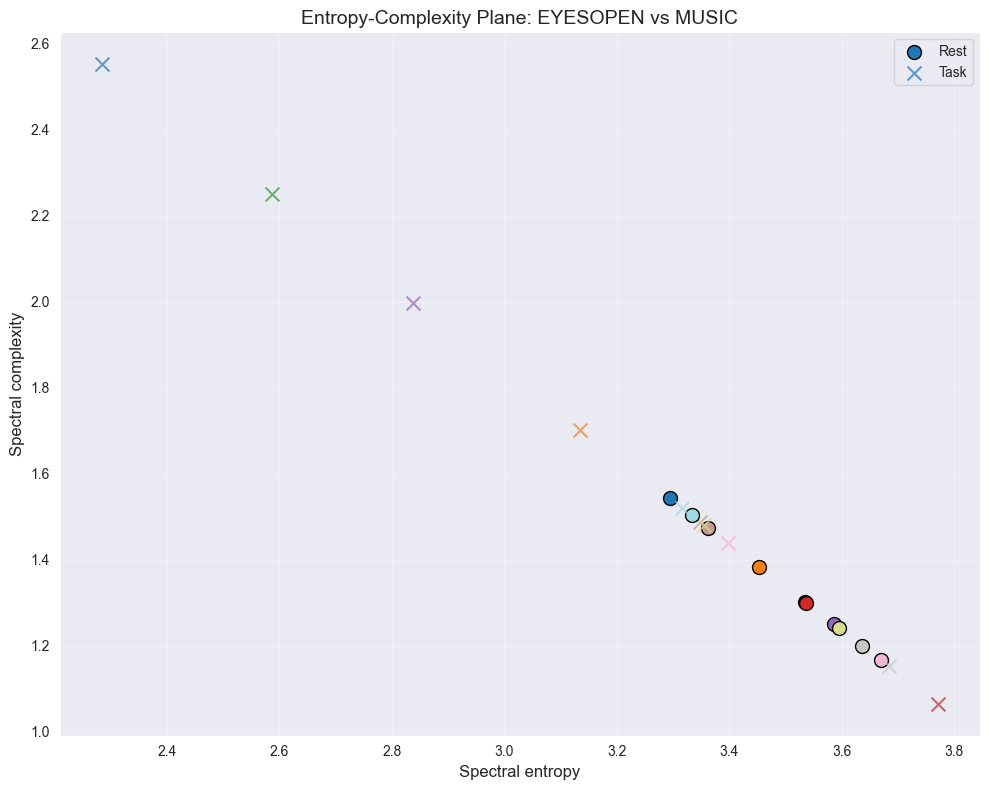

In [36]:
# Define rest and task conditions
rest_conditions = ['eyesclosed', 'eyesopen']
task_conditions = ['memory', 'mathematic', 'music']

# Create a figure for each pair (2 rest × 3 tasks = 6 plots)
for rest_cond in rest_conditions:
    for task_cond in task_conditions:
        plt.figure(figsize=(10, 8))

        # Get unique subjects from rest_stats
        subjects_list = list(rest_stats.keys())
        colors = plt.cm.tab20(np.linspace(0, 1, len(subjects_list)))

        for i, subj in enumerate(subjects_list):
            base = colors[i]

            # Find specific rest file for this condition
            rest_file = None
            if subj in rest_files:
                for rf in rest_files[subj]:
                    if f'task-{rest_cond}' in rf:
                        rest_file = rf
                        break

            if rest_file:
                x_rest = load_signal(rest_file, CHANNEL)
                if not is_bad_signal(x_rest):
                    freqs_r, psd_r = welch(x_rest, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                    entropy_r = spectral_entropy(psd_r)
                    complexity_r = spectral_complexity(psd_r)

                    plt.scatter(
                        entropy_r,
                        complexity_r,
                        color=base,
                        marker="o",
                        s=100,
                        label=f"{subj}_rest" if i == 0 else "",  # Only label first to avoid duplicates
                        edgecolors='black',
                        linewidth=1
                    )

            # Find specific task file for this condition
            task_file = None
            if subj in task_files:
                for tf in task_files[subj]:
                    if f'task-{task_cond}' in tf:
                        task_file = tf
                        break

            if task_file:
                x_task = load_signal(task_file, CHANNEL)
                if not is_bad_signal(x_task):
                    freqs_t, psd_t = welch(x_task, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)
                    entropy_t = spectral_entropy(psd_t)
                    complexity_t = spectral_complexity(psd_t)

                    plt.scatter(
                        entropy_t,
                        complexity_t,
                        color=base,
                        marker="x",
                        s=100,
                        label=f"{subj}_task" if i == 0 else "",  # Only label first
                        alpha=0.7
                    )

        plt.xlabel("Spectral entropy", fontsize=12)
        plt.ylabel("Spectral complexity", fontsize=12)
        plt.title(f"Entropy-Complexity Plane: {rest_cond.upper()} vs {task_cond.upper()}", fontsize=14)
        plt.grid(True, alpha=0.3)
        plt.legend(['Rest', 'Task'])
        plt.tight_layout()
        plt.show()

# PLOT - hjorth complexity, mobility, etc pairings

## mobility - complexity

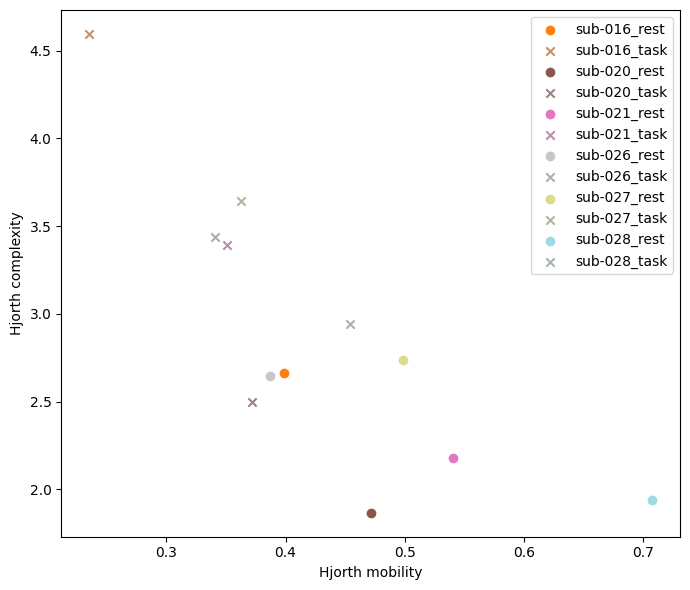

In [60]:
plt.figure(figsize=(7,6))

colors = plt.cm.tab20(np.linspace(0,1,len(subjects)))

for i, subj in enumerate(subjects):

    base = colors[i]

    if subj in rest_stats:
        plt.scatter(
            rest_stats[subj]["hjorth_mobility"],
            rest_stats[subj]["hjorth_complexity"],
            color=base,
            marker="o",
            label=subj + '_rest'
        )

    if subj in task_stats:
        plt.scatter(
            task_stats[subj]["hjorth_mobility"],
            task_stats[subj]["hjorth_complexity"],
            color=base * 0.6,
            marker="x",
            label=subj + '_task'
        )

plt.xlabel("Hjorth mobility")
plt.ylabel("Hjorth complexity")
plt.tight_layout()
plt.legend()
plt.show()

## mobility - activity

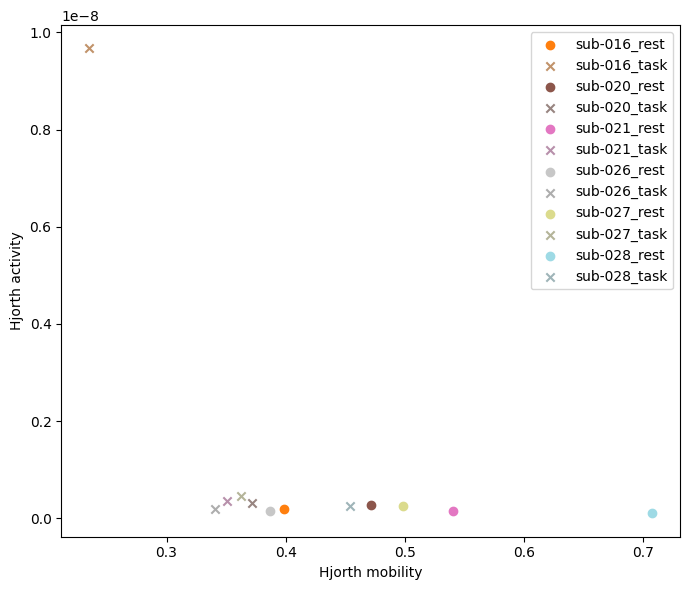

In [65]:
plt.figure(figsize=(7,6))

colors = plt.cm.tab20(np.linspace(0,1,len(subjects)))

for i, subj in enumerate(subjects):

    base = colors[i]

    if subj in rest_stats:
        plt.scatter(
            rest_stats[subj]["hjorth_mobility"],
            rest_stats[subj]["hjorth_activity"],
            color=base,
            marker="o",
            label=subj + '_rest'
        )

    if subj in task_stats:
        plt.scatter(
            task_stats[subj]["hjorth_mobility"],
            task_stats[subj]["hjorth_activity"],
            color=base * 0.6,
            marker="x",
            label=subj + '_task'
        )

plt.xlabel("Hjorth mobility")
plt.ylabel("Hjorth activity")
plt.tight_layout()
plt.legend()
plt.show()

## complexity - activity

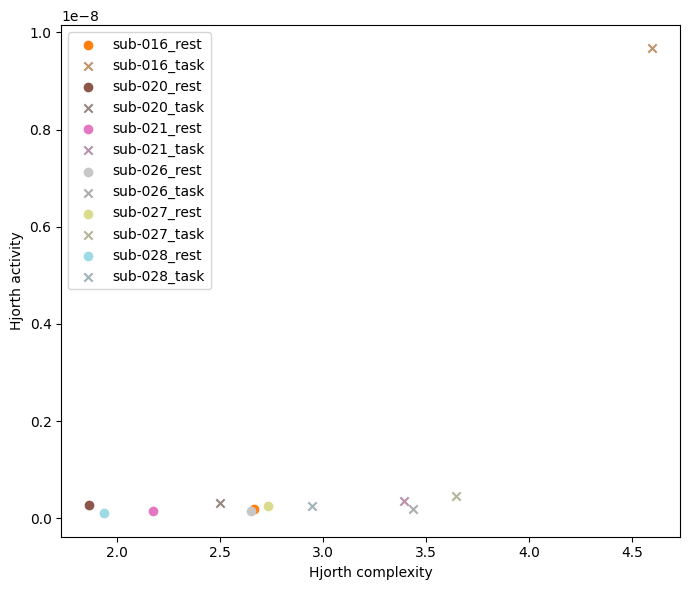

In [64]:
plt.figure(figsize=(7,6))

colors = plt.cm.tab20(np.linspace(0,1,len(subjects)))

for i, subj in enumerate(subjects):

    base = colors[i]

    if subj in rest_stats:
        plt.scatter(
            rest_stats[subj]["hjorth_complexity"],
            rest_stats[subj]["hjorth_activity"],
            color=base,
            marker="o",
            label=subj + '_rest'
        )

    if subj in task_stats:
        plt.scatter(
            task_stats[subj]["hjorth_complexity"],
            task_stats[subj]["hjorth_activity"],
            color=base * 0.6,
            marker="x",
            label=subj + '_task'
        )

plt.xlabel("Hjorth complexity")
plt.ylabel("Hjorth activity")
plt.tight_layout()
plt.legend()
plt.show()

# PLOT - signal visually - nothing special, just signal

## per-task, only rest

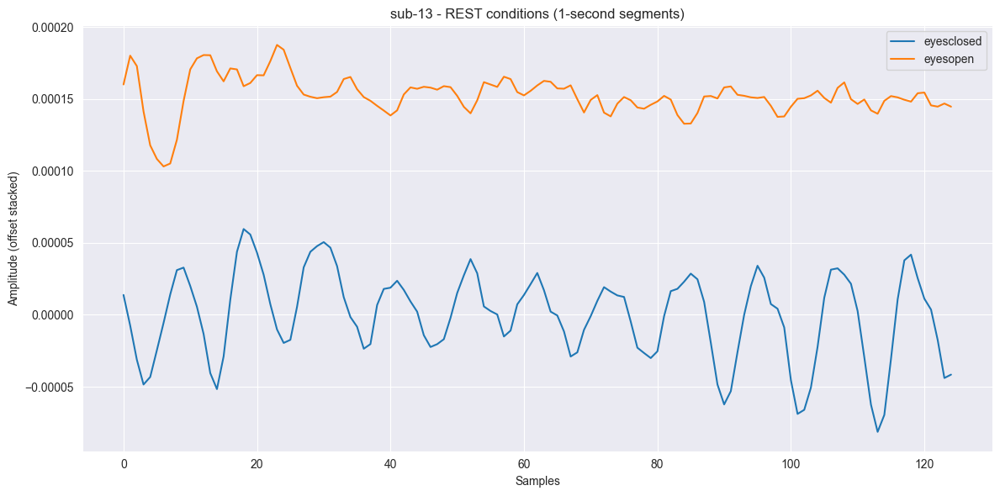

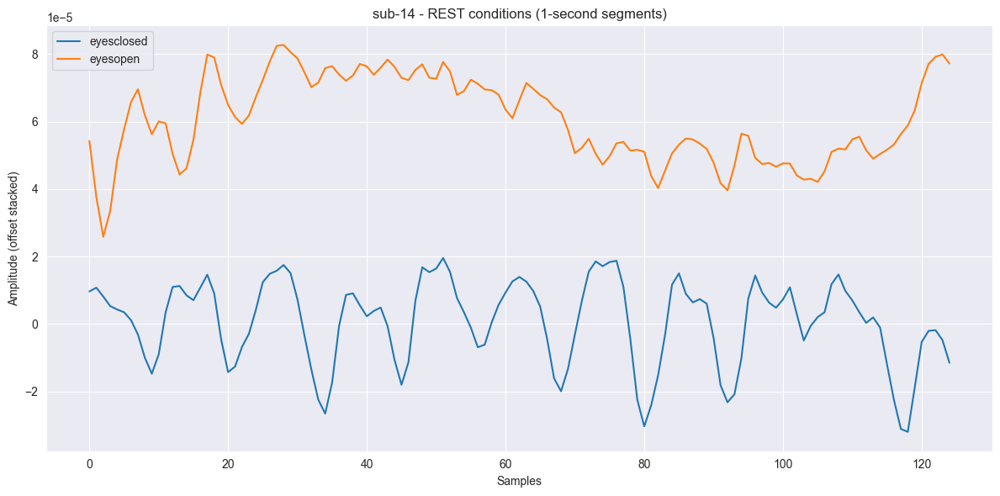

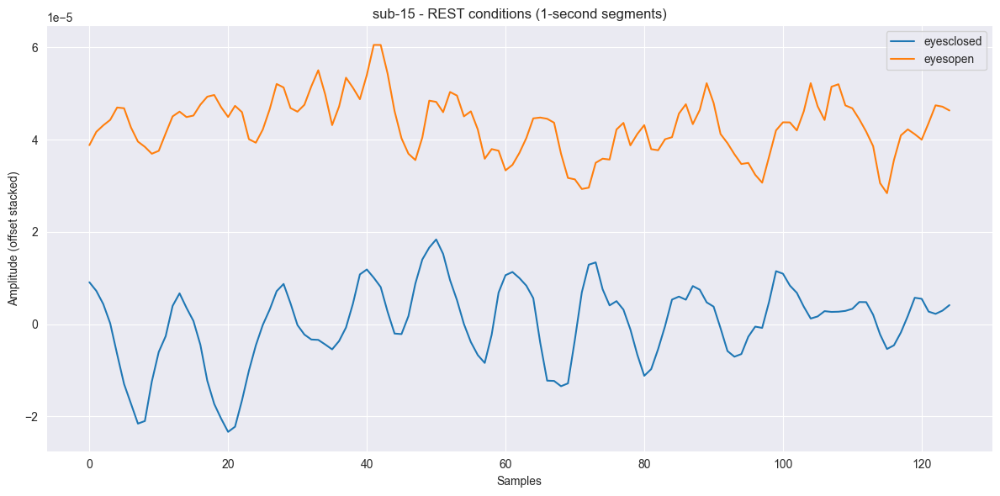

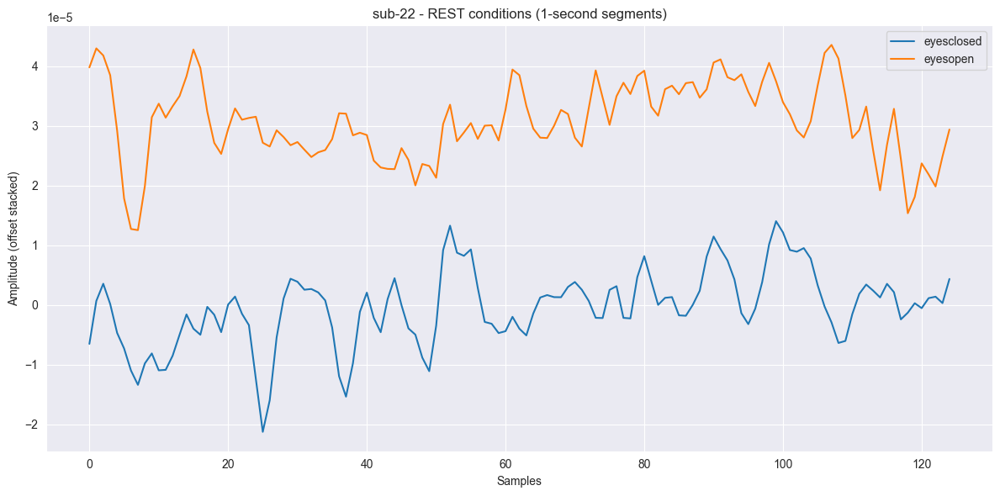

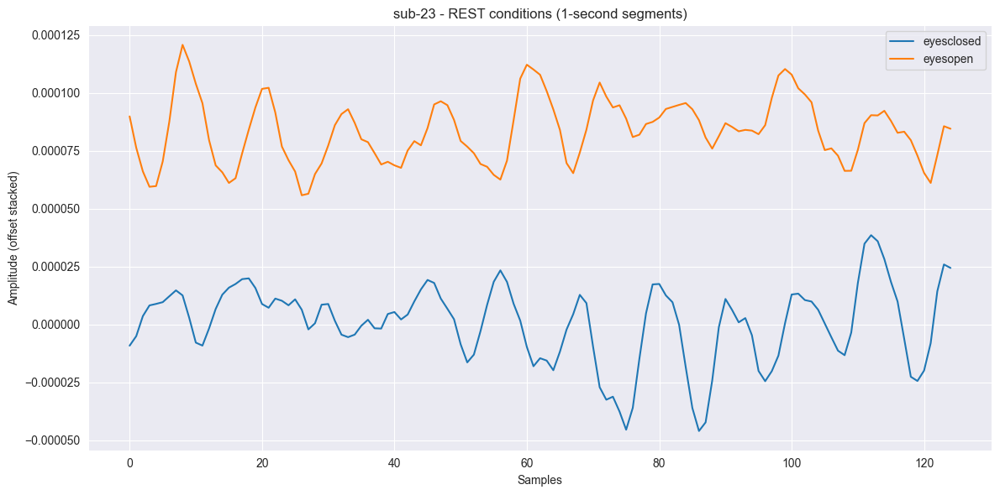

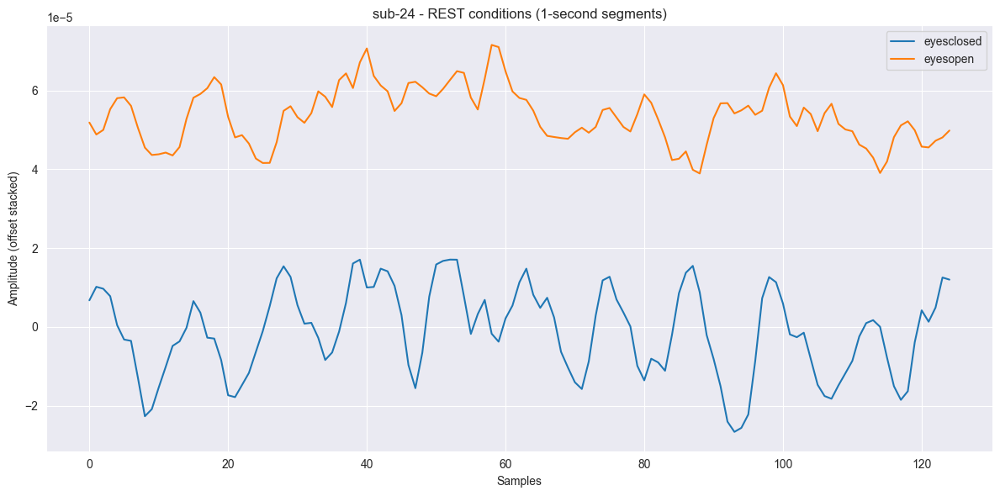

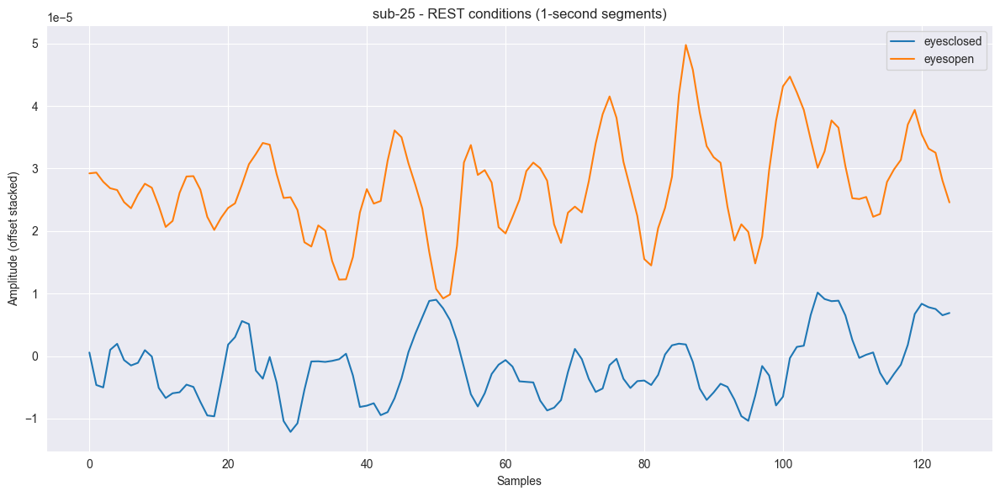

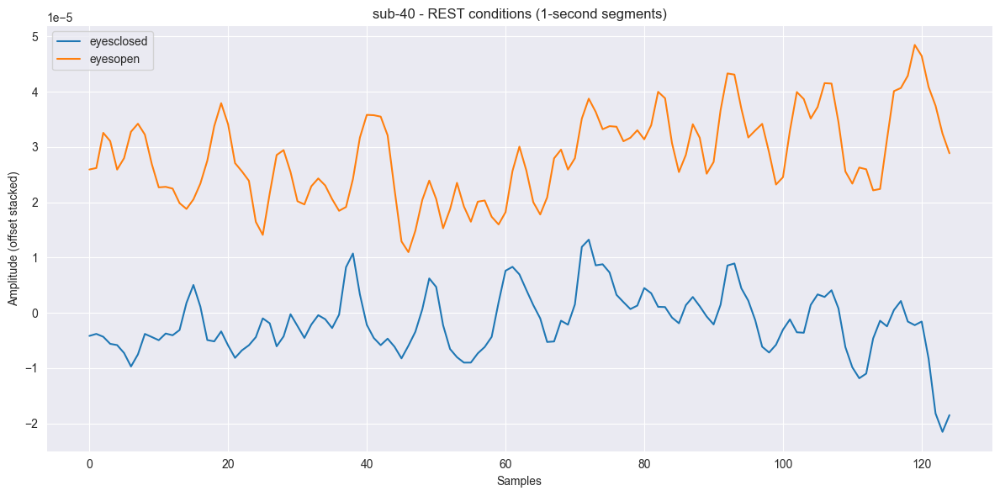

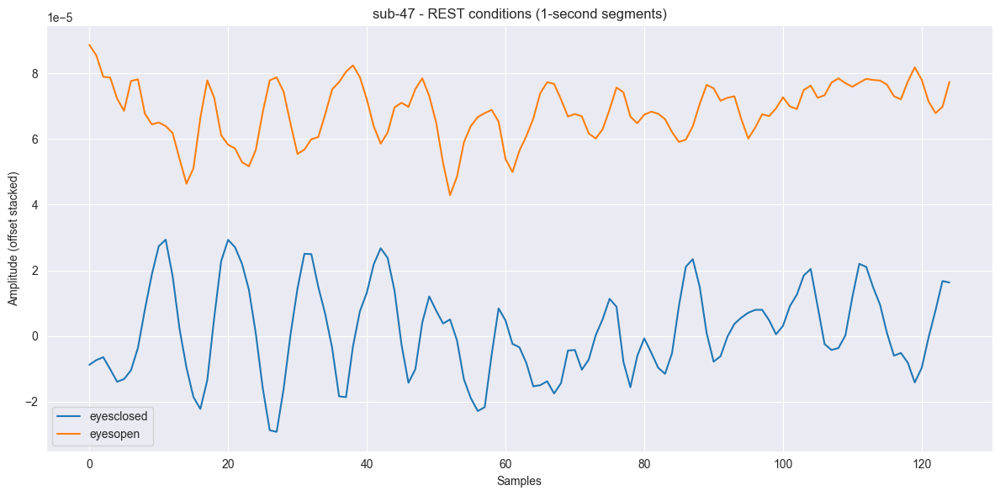

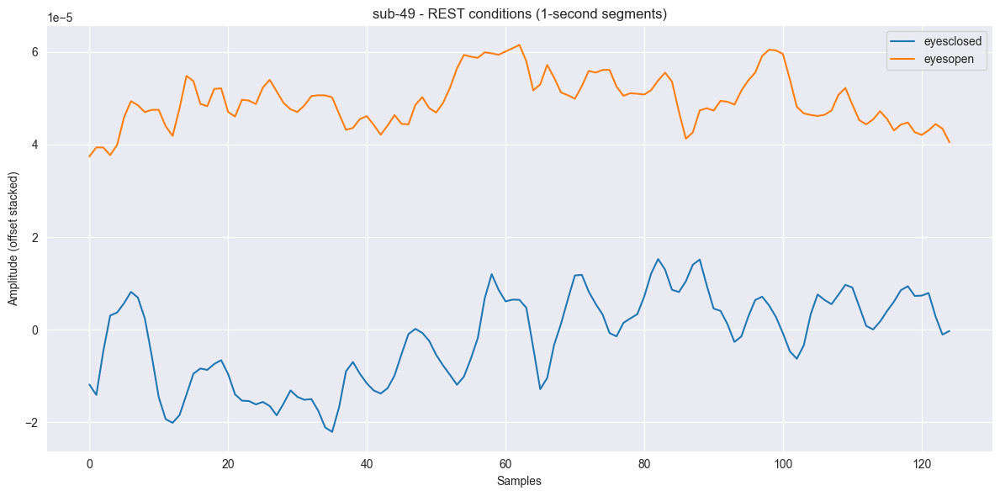

In [37]:
VIS_SEC = 1.0
vis_len = int(VIS_SEC * TARGET_SFREQ)

# ============================================
# PLOT 1: All rest conditions (eyesclosed, eyesopen) per subject
# ============================================
for subj in subjects_list:
    if subj not in rest_files:
        continue

    plt.figure(figsize=(12, 6))
    offset = 0

    for rest_file in rest_files[subj]:
        rest_name = os.path.basename(rest_file).split('_task-')[1].split('_')[0]
        x = load_signal(rest_file, CHANNEL)
        if len(x) > vis_len and not is_bad_signal(x):
            start = np.random.randint(0, len(x)-vis_len)
            seg = x[start:start+vis_len]
            plt.plot(seg + offset, label=rest_name)
            offset += np.std(seg) * 5

    plt.title(f"{subj} - REST conditions (1-second segments)")
    plt.xlabel("Samples")
    plt.ylabel("Amplitude (offset stacked)")
    plt.legend()
    plt.tight_layout()
    plt.show()

## per-task, only active

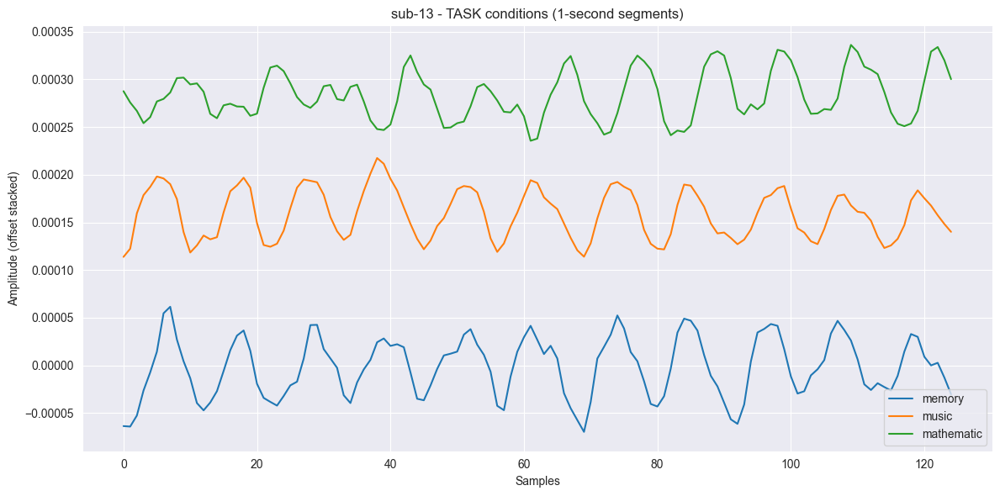

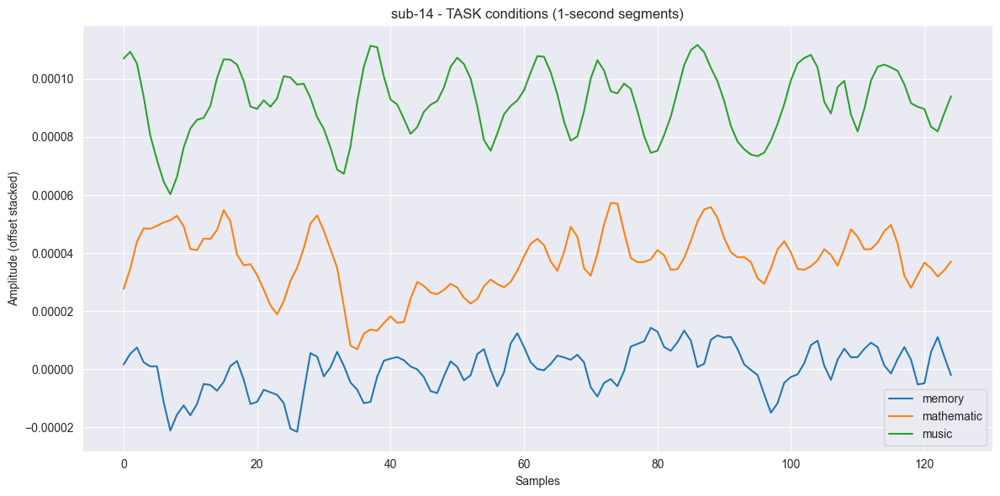

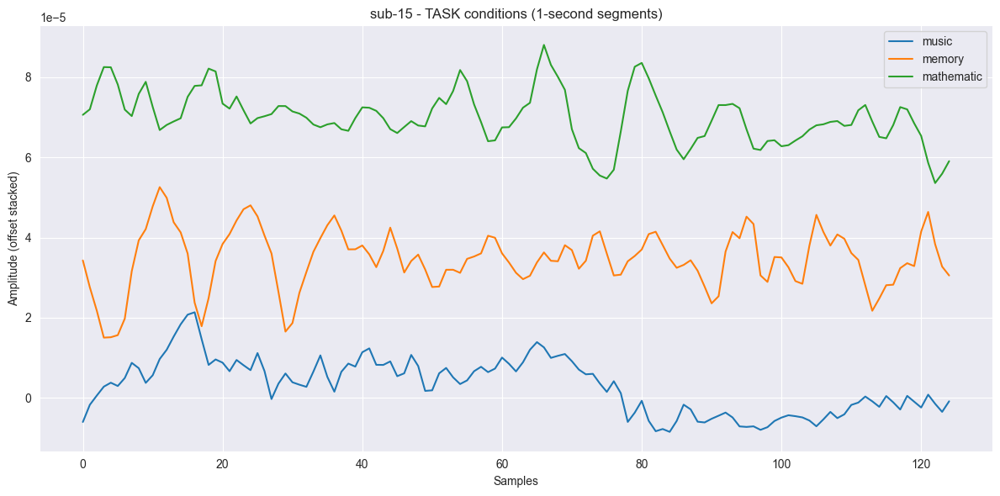

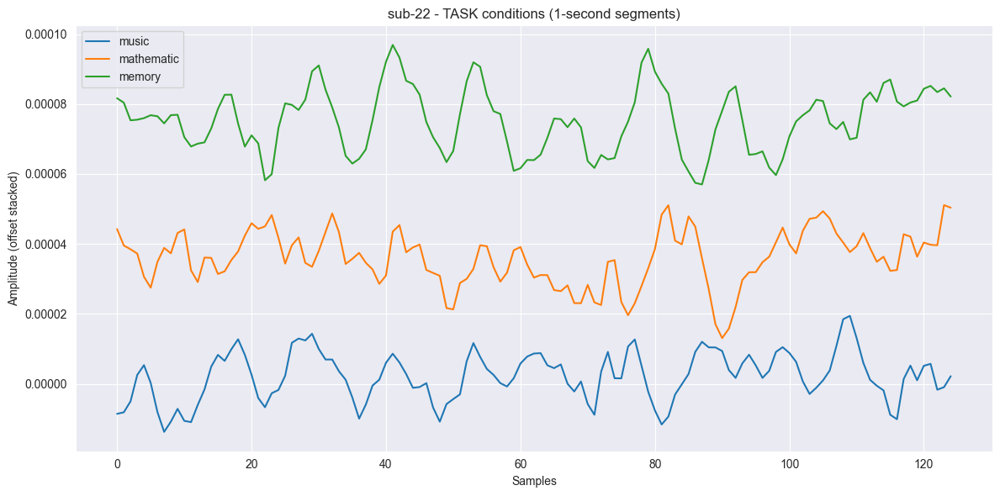

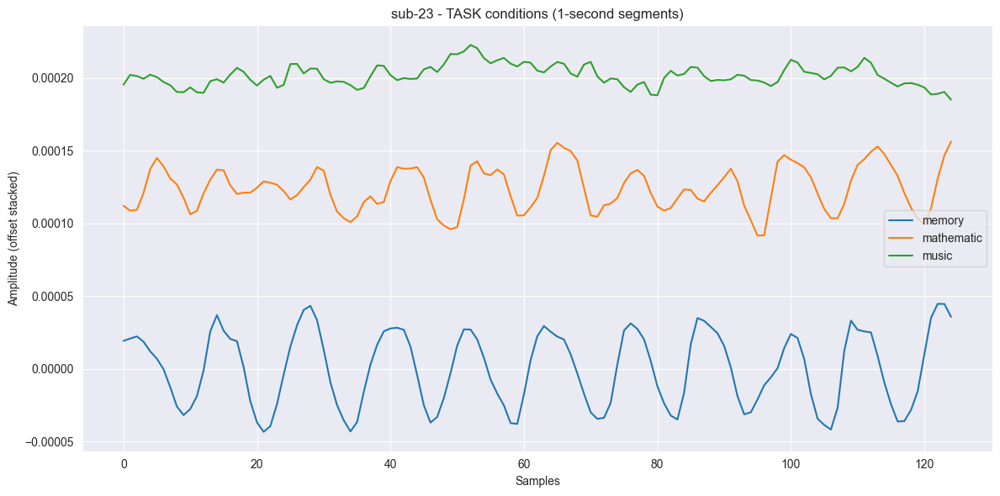

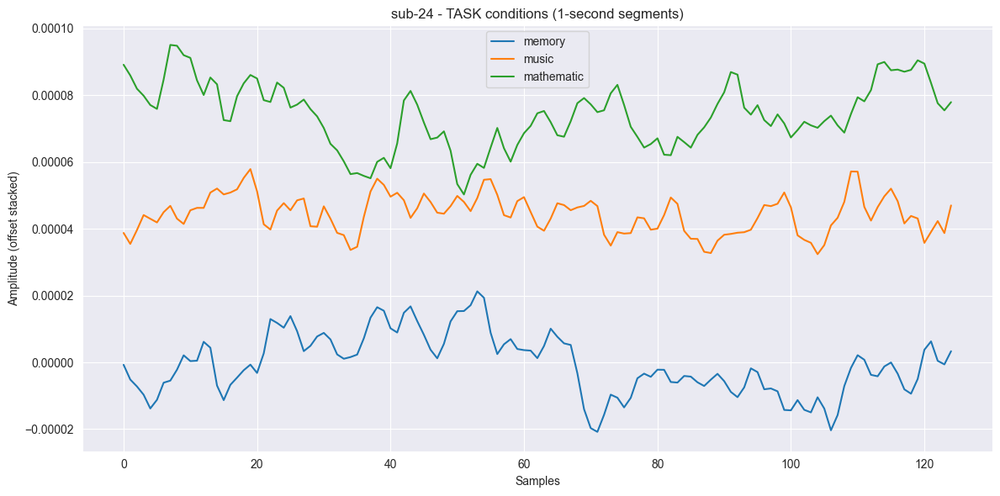

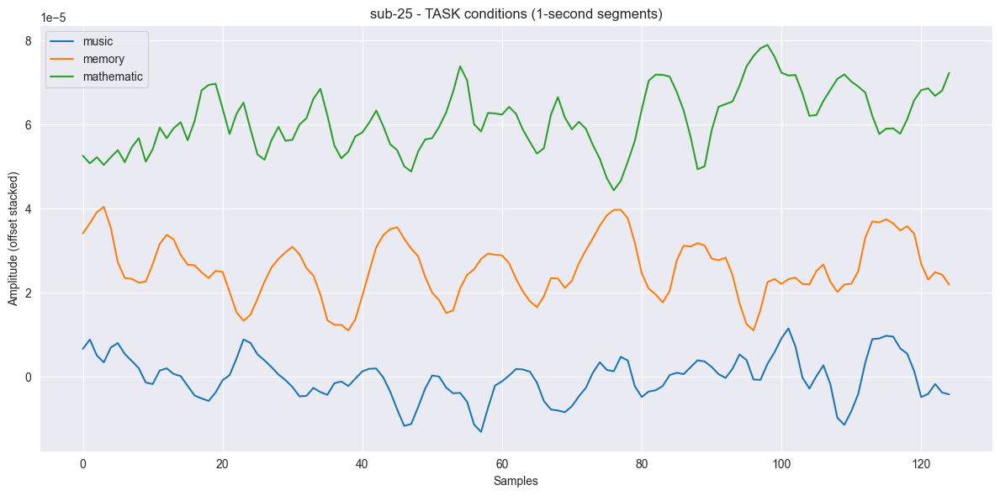

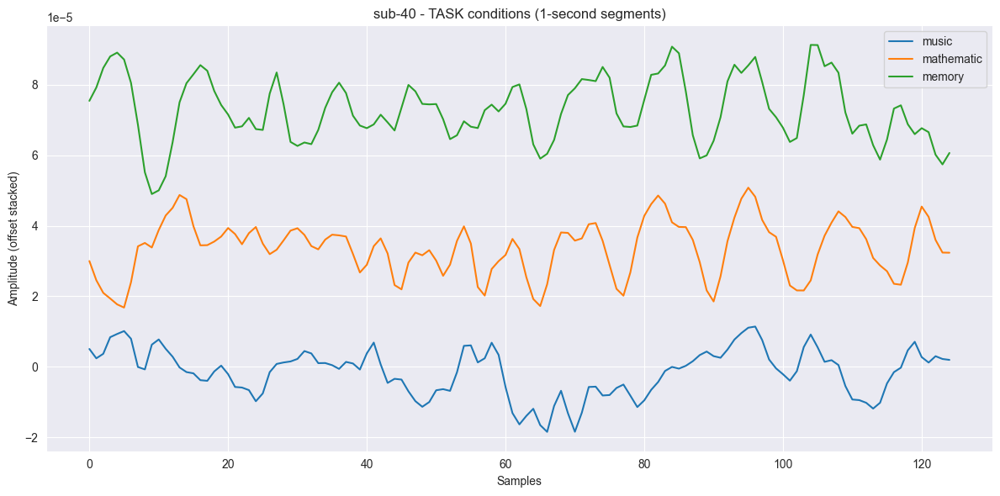

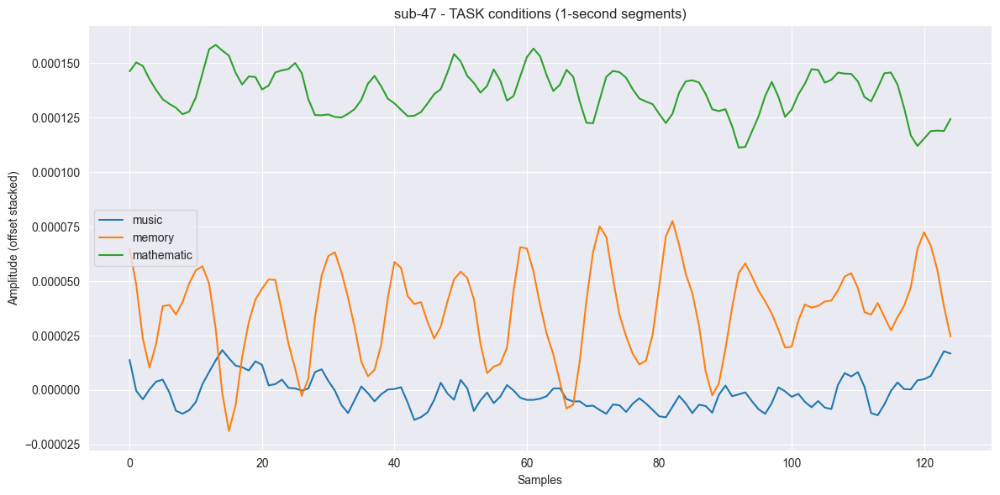

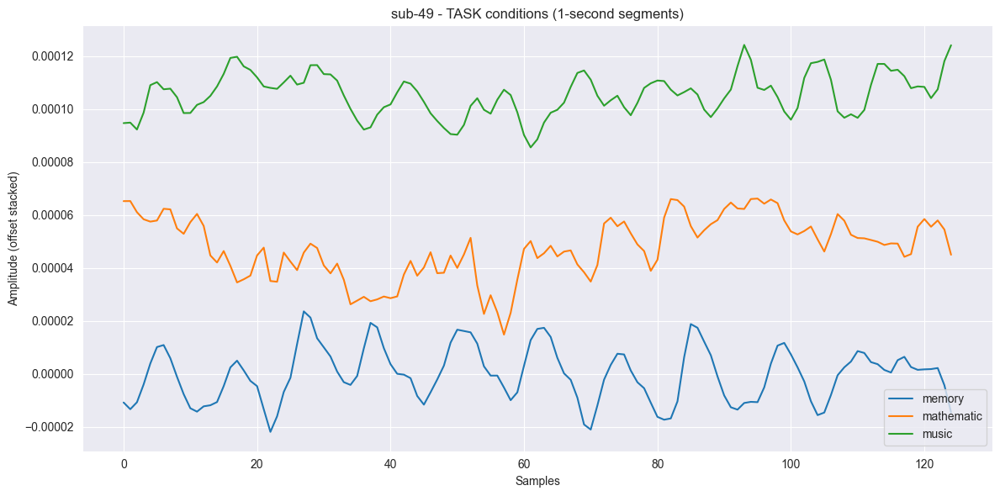

In [38]:
for subj in subjects_list:
    if subj not in task_files:
        continue

    plt.figure(figsize=(12, 6))
    offset = 0

    for task_file in task_files[subj]:
        task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]
        x = load_signal(task_file, CHANNEL)

        if len(x) > vis_len and not is_bad_signal(x):
            start = np.random.randint(0, len(x)-vis_len)
            seg = x[start:start+vis_len]
            plt.plot(seg + offset, label=task_name)
            offset += np.std(seg) * 5

    plt.title(f"{subj} - TASK conditions (1-second segments)")
    plt.xlabel("Samples")
    plt.ylabel("Amplitude (offset stacked)")
    plt.legend()
    plt.tight_layout()
    plt.show()

## avg task vs avg rest - by subject

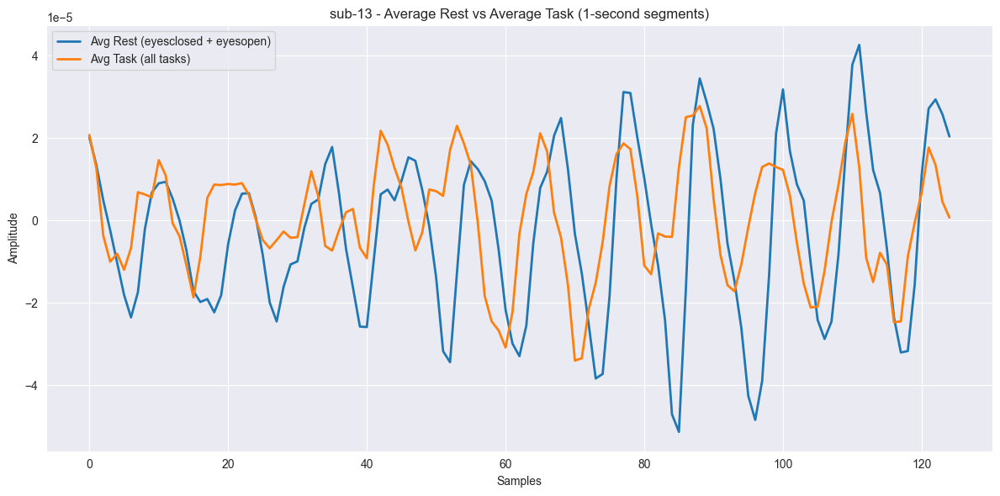

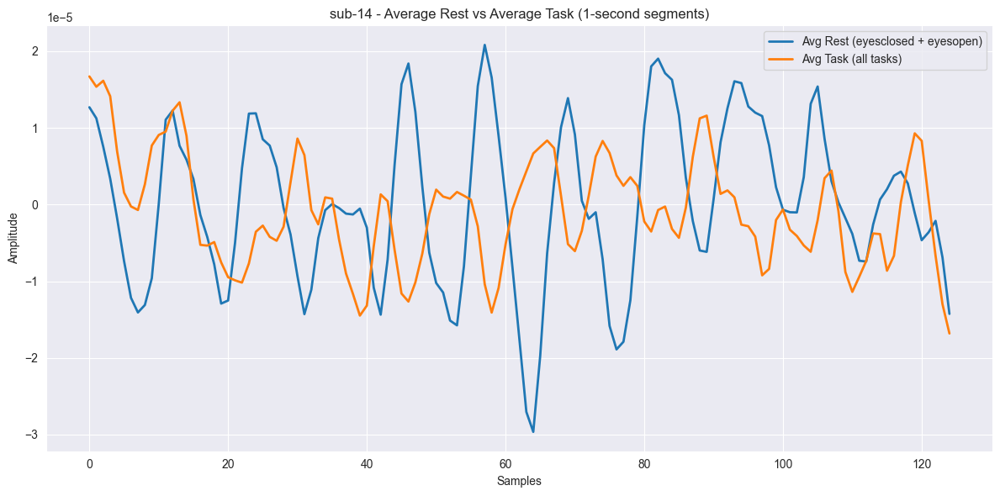

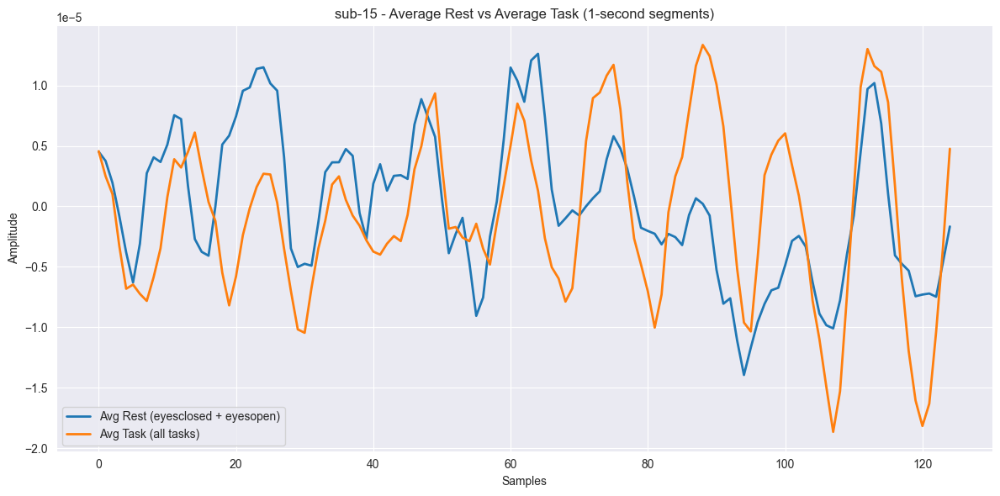

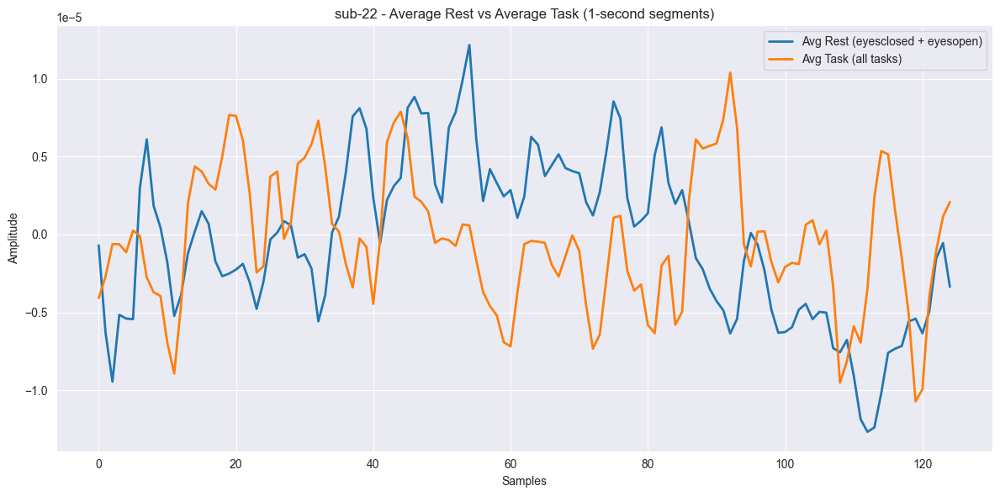

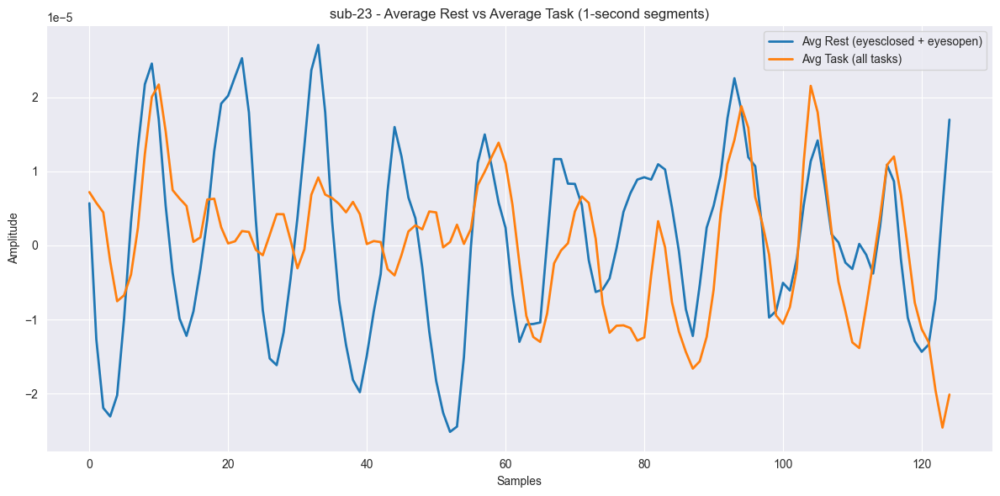

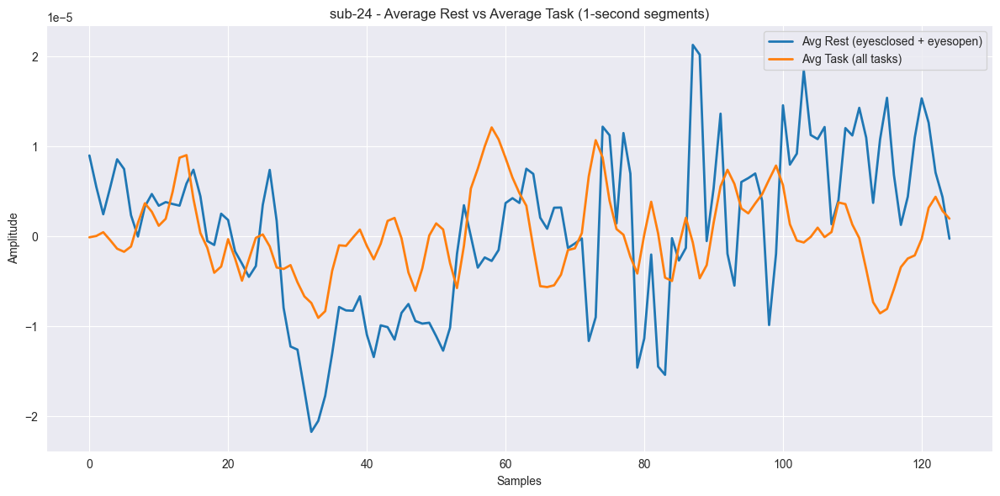

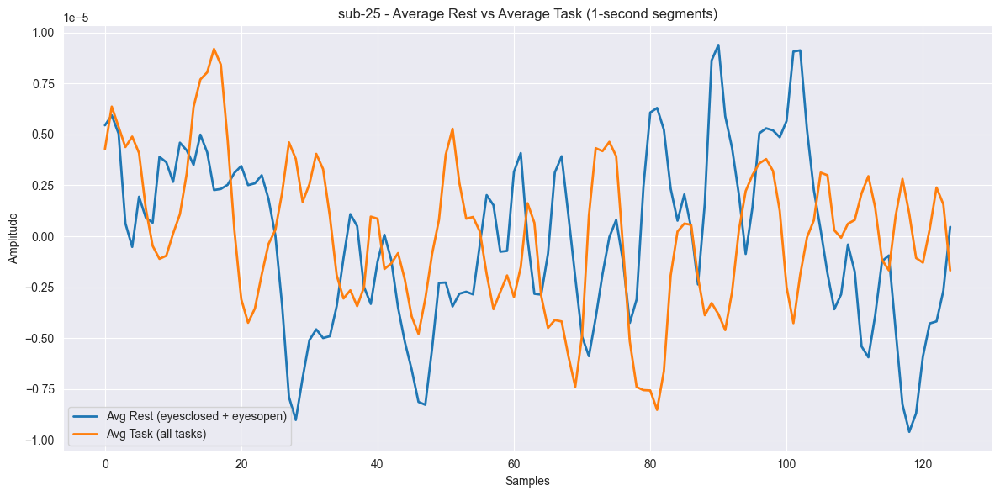

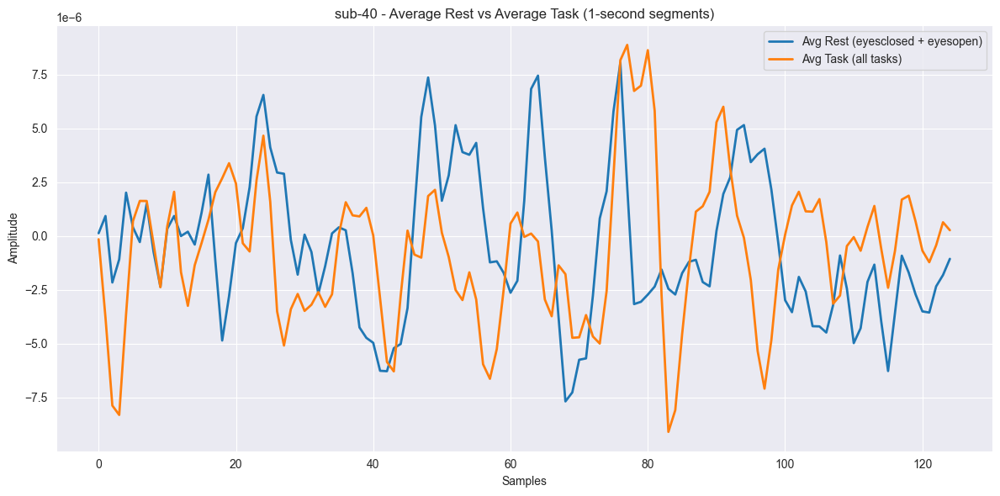

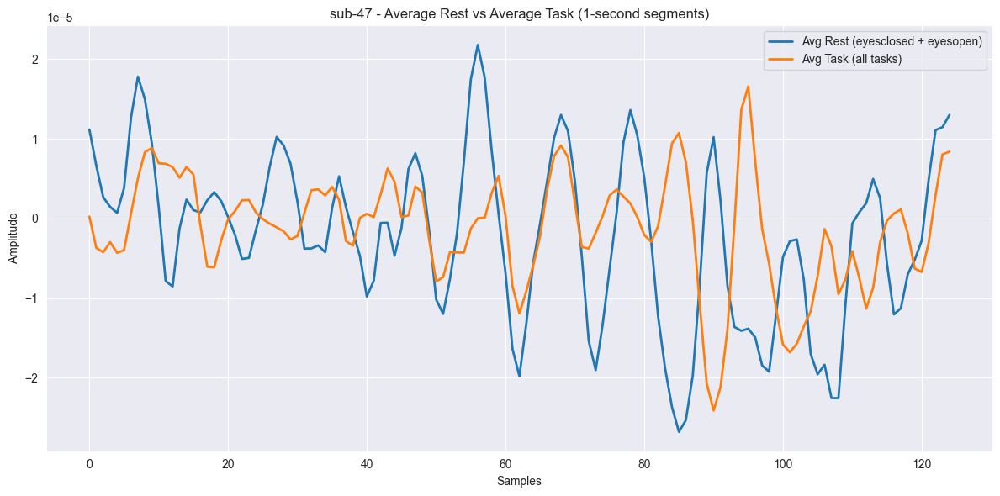

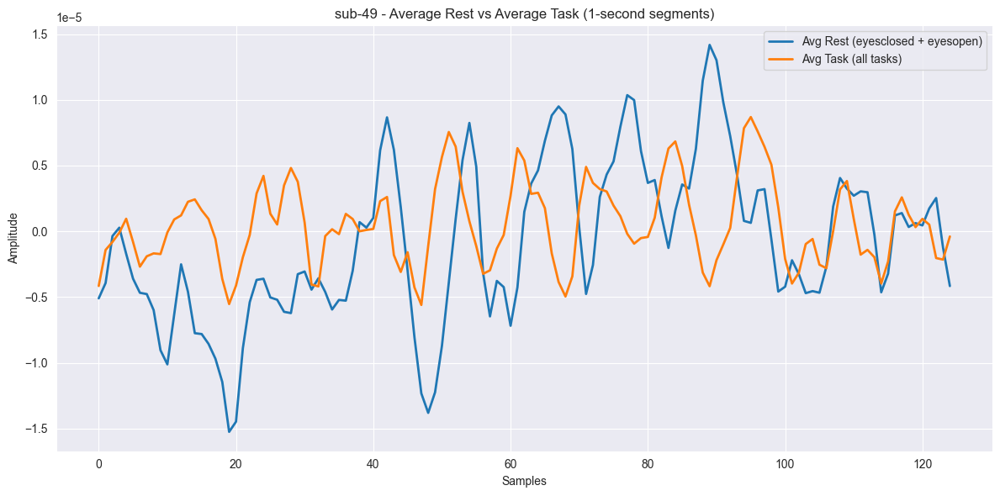

In [39]:
for subj in subjects_list:
    plt.figure(figsize=(12, 6))

    # Average resting signal
    rest_signals_list = []
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            x = load_signal(rest_file, CHANNEL)
            if len(x) > vis_len and not is_bad_signal(x):
                start = np.random.randint(0, len(x)-vis_len)
                seg = x[start:start+vis_len]
                rest_signals_list.append(seg)

    if rest_signals_list:
        # Align all rest signals to same length (min length)
        min_len = min([len(seg) for seg in rest_signals_list])
        rest_signals_aligned = [seg[:min_len] for seg in rest_signals_list]
        avg_rest = np.mean(rest_signals_aligned, axis=0)
        plt.plot(avg_rest, label='Avg Rest (eyesclosed + eyesopen)', linewidth=2)

    # Average task signals
    task_signals_list = []
    if subj in task_files:
        for task_file in task_files[subj]:
            x = load_signal(task_file, CHANNEL)
            if len(x) > vis_len and not is_bad_signal(x):
                start = np.random.randint(0, len(x)-vis_len)
                seg = x[start:start+vis_len]
                task_signals_list.append(seg)

    if task_signals_list:
        min_len = min([len(seg) for seg in task_signals_list])
        task_signals_aligned = [seg[:min_len] for seg in task_signals_list]
        avg_task = np.mean(task_signals_aligned, axis=0)
        plt.plot(avg_task, label='Avg Task (all tasks)', linewidth=2)

    plt.title(f"{subj} - Average Rest vs Average Task (1-second segments)")
    plt.xlabel("Samples")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.tight_layout()
    plt.show()

## avg task vs avg rest - together

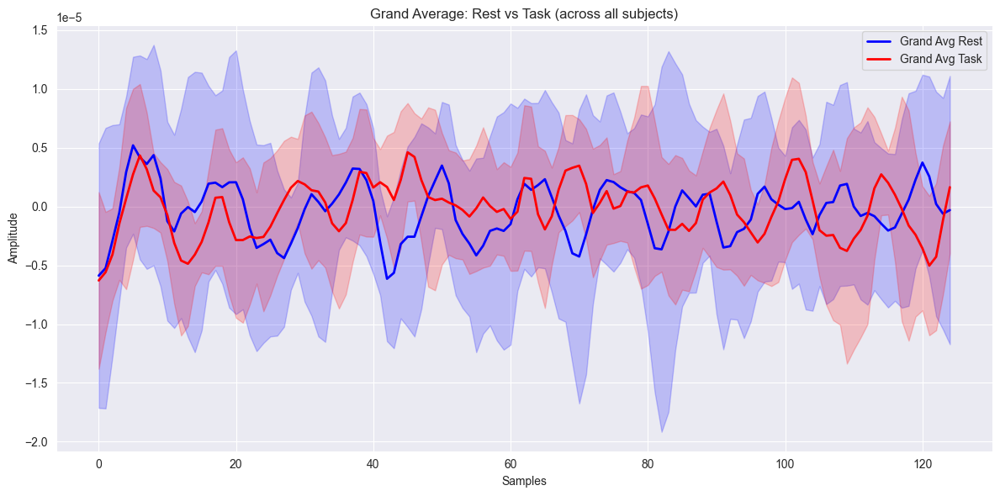

In [40]:
plt.figure(figsize=(12, 6))

all_avg_rest = []
all_avg_task = []

for subj in subjects_list:
    # Average resting for this subject
    rest_signals_list = []
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            x = load_signal(rest_file, CHANNEL)
            if len(x) > vis_len and not is_bad_signal(x):
                start = np.random.randint(0, len(x)-vis_len)
                seg = x[start:start+vis_len]
                rest_signals_list.append(seg)

    if rest_signals_list:
        min_len = min([len(seg) for seg in rest_signals_list])
        rest_signals_aligned = [seg[:min_len] for seg in rest_signals_list]
        avg_rest_subj = np.mean(rest_signals_aligned, axis=0)
        all_avg_rest.append(avg_rest_subj)

    # Average task for this subject
    task_signals_list = []
    if subj in task_files:
        for task_file in task_files[subj]:
            x = load_signal(task_file, CHANNEL)
            if len(x) > vis_len and not is_bad_signal(x):
                start = np.random.randint(0, len(x)-vis_len)
                seg = x[start:start+vis_len]
                task_signals_list.append(seg)

    if task_signals_list:
        min_len = min([len(seg) for seg in task_signals_list])
        task_signals_aligned = [seg[:min_len] for seg in task_signals_list]
        avg_task_subj = np.mean(task_signals_aligned, axis=0)
        all_avg_task.append(avg_task_subj)

# Plot grand averages across subjects
if all_avg_rest:
    grand_avg_rest = np.mean(all_avg_rest, axis=0)
    grand_std_rest = np.std(all_avg_rest, axis=0)
    plt.plot(grand_avg_rest, 'b-', linewidth=2, label='Grand Avg Rest')
    plt.fill_between(range(len(grand_avg_rest)),
                     grand_avg_rest - grand_std_rest,
                     grand_avg_rest + grand_std_rest,
                     color='blue', alpha=0.2)

if all_avg_task:
    grand_avg_task = np.mean(all_avg_task, axis=0)
    grand_std_task = np.std(all_avg_task, axis=0)
    plt.plot(grand_avg_task, 'r-', linewidth=2, label='Grand Avg Task')
    plt.fill_between(range(len(grand_avg_task)),
                     grand_avg_task - grand_std_task,
                     grand_avg_task + grand_std_task,
                     color='red', alpha=0.2)

plt.title("Grand Average: Rest vs Task (across all subjects)")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.legend()
plt.tight_layout()
plt.show()

# PLOT - only alpha

/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/3440122867.py:36: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return np.trapz(psd[mask], freqs[mask])


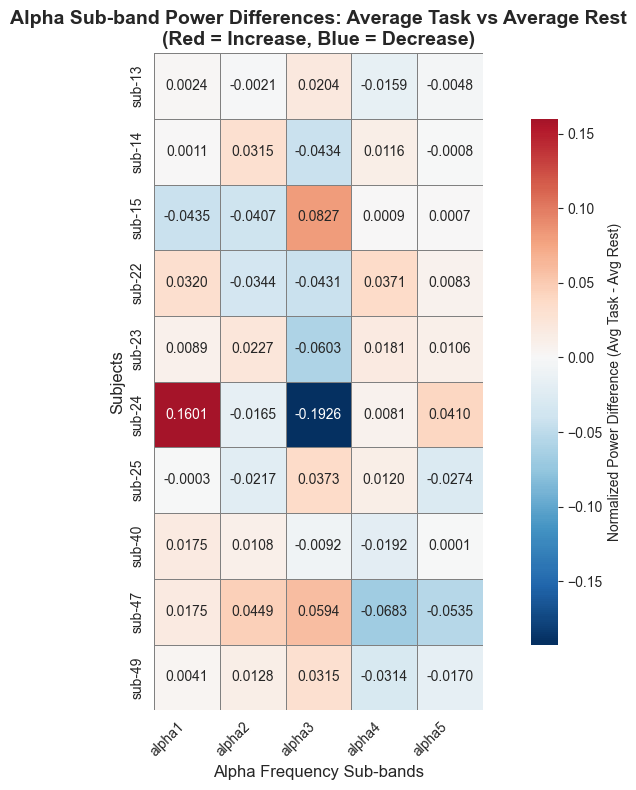

In [48]:
# Define finer alpha sub-bands (include original bands if needed)
alpha_bands = {
    "alpha1": (8, 9),
    "alpha2": (9, 10),
    "alpha3": (10, 11),
    "alpha4": (11, 12),
    "alpha5": (12, 13),
}

# ============================================
# RECOMPUTE band powers with new alpha sub-bands
# ============================================
bands_list = ['alpha1', 'alpha2', 'alpha3', 'alpha4', 'alpha5']

# Store recomputed band powers
rest_bands_sub = {}
task_bands_sub = {}

for subj in valid_subjects:    # Recompute rest band powers
    if subj in rest_signals:
        x_rest = rest_signals[subj]
        freqs_r, psd_r = welch(x_rest, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)

        bands_rest_raw = {k: bandpower(psd_r, freqs_r, v) for k, v in alpha_bands.items()}
        total_power_rest = sum(bands_rest_raw.values())
        bands_rest_norm = {k: v / total_power_rest if total_power_rest > 0 else np.nan
                           for k, v in bands_rest_raw.items()}
        rest_bands_sub[subj] = bands_rest_norm

    # Recompute task band powers for each task
    task_keys = [k for k in task_stats.keys() if k.startswith(f"{subj}_")]
    for task_key in task_keys:
        if task_key in task_signals:
            x_task = task_signals[task_key]
            freqs_t, psd_t = welch(x_task, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)

            bands_task_raw = {k: bandpower(psd_t, freqs_t, v) for k, v in alpha_bands.items()}
            total_power_task = sum(bands_task_raw.values())
            bands_task_norm = {k: v / total_power_task if total_power_task > 0 else np.nan
                               for k, v in bands_task_raw.items()}
            task_bands_sub[task_key] = bands_task_norm

# ============================================
# Prepare data for heatmap (avg task vs avg rest)
# ============================================
diff_matrix = []
subject_names = []

for subj in valid_subjects:
    if subj not in rest_bands_sub:
        continue

    # Get normalized band powers for rest
    rest_bands = rest_bands_sub[subj]

    # Get ALL task bands for this subject and average them
    task_bands_list = []
    task_keys = [k for k in task_bands_sub.keys() if k.startswith(f"{subj}_")]

    for task_key in task_keys:
        task_bands_list.append(task_bands_sub[task_key])

    if task_bands_list:
        # Average across all tasks for this subject
        avg_task_bands = {band: np.mean([tb[band] for tb in task_bands_list])
                          for band in bands_list}

        # Calculate difference (Average Task - Rest)
        band_diffs = [avg_task_bands[band] - rest_bands[band] for band in bands_list]
        diff_matrix.append(band_diffs)
        subject_names.append(subj)

# Convert to DataFrame
df_diffs = pd.DataFrame(diff_matrix, columns=bands_list, index=subject_names)

# ============================================
# HEATMAP OF ALPHA SUB-BAND DIFFERENCES
# ============================================
fig, ax = plt.subplots(figsize=(10, 8))

# Create heatmap
im = sns.heatmap(df_diffs,
                 annot=True,           # Show values
                 fmt='.4f',            # 4 decimal places for small differences
                 cmap='RdBu_r',        # Red-Blue colormap (red=increase, blue=decrease)
                 center=0,             # Center at zero
                 square=True,          # Square cells
                 linewidths=0.5,       # Grid lines
                 linecolor='gray',
                 cbar_kws={'label': 'Normalized Power Difference (Avg Task - Avg Rest)',
                          'shrink': 0.8},
                 ax=ax)

# Customize
ax.set_title('Alpha Sub-band Power Differences: Average Task vs Average Rest\n(Red = Increase, Blue = Decrease)',
             fontsize=14, fontweight='bold')
ax.set_xlabel('Alpha Frequency Sub-bands', fontsize=12)
ax.set_ylabel('Subjects', fontsize=12)

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

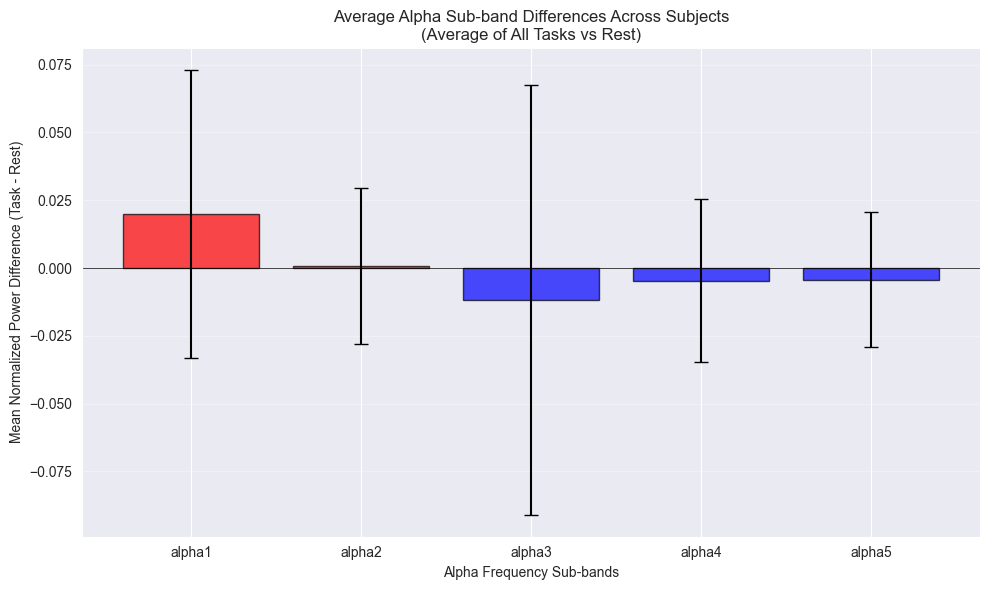

In [50]:
mean_diffs = df_diffs.mean(axis=0)
std_diffs = df_diffs.std(axis=0)

fig, ax = plt.subplots(figsize=(10, 6))
x_pos = np.arange(len(bands_list))

bars = ax.bar(x_pos, mean_diffs, yerr=std_diffs, capsize=5,
              color=['red' if md > 0 else 'blue' for md in mean_diffs],
              alpha=0.7, edgecolor='black')

ax.axhline(y=0, color='black', linestyle='-', linewidth=0.5)
ax.set_xticks(x_pos)
ax.set_xticklabels(bands_list)
ax.set_ylabel('Mean Normalized Power Difference (Task - Rest)')
ax.set_xlabel('Alpha Frequency Sub-bands')
ax.set_title('Average Alpha Sub-band Differences Across Subjects\n(Average of All Tasks vs Rest)')
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/3440122867.py:36: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return np.trapz(psd[mask], freqs[mask])


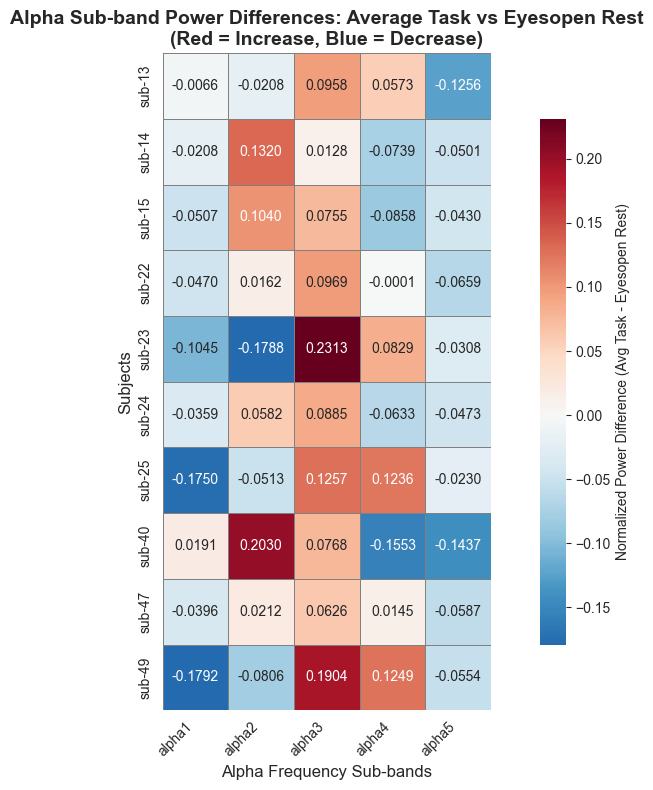

In [51]:
bands_list = ['alpha1', 'alpha2', 'alpha3', 'alpha4', 'alpha5']

# ============================================
# RECOMPUTE band powers for eyesopen rest and all tasks
# ============================================
rest_eyesopen_bands = {}
task_bands_sub = {}

for subj in valid_subjects:
    # Find eyesopen rest file
    eyesopen_file = None
    if subj in rest_files:
        for rf in rest_files[subj]:
            if 'task-eyesopen' in rf:
                eyesopen_file = rf
                break

    if eyesopen_file:
        # Load and compute eyesopen rest bands
        x_rest = load_signal(eyesopen_file, CHANNEL)
        if not is_bad_signal(x_rest):
            freqs_r, psd_r = welch(x_rest, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)

            bands_rest_raw = {k: bandpower(psd_r, freqs_r, v) for k, v in alpha_bands.items()}
            total_power_rest = sum(bands_rest_raw.values())
            bands_rest_norm = {k: v / total_power_rest if total_power_rest > 0 else np.nan
                               for k, v in bands_rest_raw.items()}
            rest_eyesopen_bands[subj] = bands_rest_norm

    # Recompute task band powers for each task
    task_keys = [k for k in task_stats.keys() if k.startswith(f"{subj}_")]
    for task_key in task_keys:
        if task_key in task_signals:
            x_task = task_signals[task_key]
            freqs_t, psd_t = welch(x_task, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)

            bands_task_raw = {k: bandpower(psd_t, freqs_t, v) for k, v in alpha_bands.items()}
            total_power_task = sum(bands_task_raw.values())
            bands_task_norm = {k: v / total_power_task if total_power_task > 0 else np.nan
                               for k, v in bands_task_raw.items()}
            task_bands_sub[task_key] = bands_task_norm

# ============================================
# Prepare data for heatmap (avg task vs eyesopen rest)
# ============================================
diff_matrix = []
subject_names = []

for subj in valid_subjects:
    if subj not in rest_eyesopen_bands:
        continue

    # Get eyesopen rest bands
    rest_bands = rest_eyesopen_bands[subj]

    # Get ALL task bands for this subject and average them
    task_bands_list = []
    task_keys = [k for k in task_bands_sub.keys() if k.startswith(f"{subj}_")]

    for task_key in task_keys:
        task_bands_list.append(task_bands_sub[task_key])

    if task_bands_list:
        # Average across all tasks for this subject
        avg_task_bands = {band: np.mean([tb[band] for tb in task_bands_list])
                          for band in bands_list}

        # Calculate difference (Average Task - Eyesopen Rest)
        band_diffs = [avg_task_bands[band] - rest_bands[band] for band in bands_list]
        diff_matrix.append(band_diffs)
        subject_names.append(subj)

# Convert to DataFrame
df_diffs = pd.DataFrame(diff_matrix, columns=bands_list, index=subject_names)

# ============================================
# HEATMAP OF ALPHA SUB-BAND DIFFERENCES (Avg Task vs Eyesopen)
# ============================================
fig, ax = plt.subplots(figsize=(10, 8))

# Create heatmap
im = sns.heatmap(df_diffs,
                 annot=True,           # Show values
                 fmt='.4f',            # 4 decimal places for small differences
                 cmap='RdBu_r',        # Red-Blue colormap (red=increase, blue=decrease)
                 center=0,             # Center at zero
                 square=True,          # Square cells
                 linewidths=0.5,       # Grid lines
                 linecolor='gray',
                 cbar_kws={'label': 'Normalized Power Difference (Avg Task - Eyesopen Rest)',
                          'shrink': 0.8},
                 ax=ax)

# Customize
ax.set_title('Alpha Sub-band Power Differences: Average Task vs Eyesopen Rest\n(Red = Increase, Blue = Decrease)',
             fontsize=14, fontweight='bold')
ax.set_xlabel('Alpha Frequency Sub-bands', fontsize=12)
ax.set_ylabel('Subjects', fontsize=12)

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

# model

In [56]:
import numpy as np
from scipy.stats import entropy
from scipy.signal import welch, find_peaks
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ============================================
# PARAMETERS
# ============================================
WINDOW_SEC = 0.25
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)
OVERLAP = 0  # No overlap

# Define frequency bands (including fine alpha sub-bands)
bands = {
    "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha1": (8, 9),
    "alpha2": (9, 10),
    "alpha3": (10, 11),
    "alpha4": (11, 12),
    "alpha5": (12, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

# ============================================
# FEATURE EXTRACTION FUNCTIONS
# ============================================
def spectral_entropy(psd):
    """Spectral entropy"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    return entropy(p)

def spectral_complexity(psd):
    """Spectral complexity (KL divergence from uniform)"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    uniform = np.ones_like(p) / len(p)
    return entropy(p, uniform)

def band_power_features(x, fs, bands):
    """Extract band power features (normalized)"""
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))

    # Calculate raw band powers
    band_powers_raw = {}
    for band_name, (low, high) in bands.items():
        mask = (freqs >= low) & (freqs < high)
        if np.any(mask):
            band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])
        else:
            band_powers_raw[band_name] = 0

    # Normalize
    total_power = sum(band_powers_raw.values())
    if total_power > 0:
        band_powers_norm = {k: v / total_power for k, v in band_powers_raw.items()}
    else:
        band_powers_norm = {k: np.nan for k in band_powers_raw.keys()}

    return band_powers_norm, freqs, psd

def extract_features_from_window(x, fs, bands):
    """Extract all features from a single window"""
    # Hjorth features (excluding activity as requested)
    hjorth = hjorth_all(x)

    # Spectral features
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))
    entropy_val = spectral_entropy(psd)
    complexity_val = spectral_complexity(psd)

    # Band power features
    band_powers, _, _ = band_power_features(x, fs, bands)

    # Combine all features
    features = {
        # Hjorth features (activity excluded)
        'hjorth_mobility': hjorth['mobility'],
        'hjorth_complexity': hjorth['complexity'],
        'hjorth_log_activity': hjorth['log_activity'],

        # Spectral features
        'spectral_entropy': entropy_val,
        'spectral_complexity': complexity_val,

        # Band powers (all bands)
        **{f'{band}_power': band_powers[band] for band in bands.keys()}
    }

    return features

In [57]:

# ============================================
# CREATE DATASET
# ============================================
X_data = []
y_data = []
window_info = []  # Store metadata (subject, condition, window_idx)

print("Creating windows...")

# Process rest files (label = 0)
for subj in rest_stats.keys():
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            condition = 'eyesclosed' if 'eyesclosed' in rest_file else 'eyesopen'
            x = load_signal(rest_file, CHANNEL)

            if is_bad_signal(x):
                continue

            # Extract non-overlapping windows
            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    # Check for NaN values
                    if not any(np.isnan(list(features.values()))):
                        X_data.append(list(features.values()))
                        y_data.append(0)  # 0 = rest
                        window_info.append((subj, condition, 'rest', i))

Creating windows...


/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/3635046973.py:62: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])


In [58]:
# Process task files (label = 1)
for subj in rest_stats.keys():
    if subj in task_files:
        for task_file in task_files[subj]:
            # Extract task name
            task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]
            x = load_signal(task_file, CHANNEL)

            if is_bad_signal(x):
                continue

            # Extract non-overlapping windows
            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    # Check for NaN values
                    if not any(np.isnan(list(features.values()))):
                        X_data.append(list(features.values()))
                        y_data.append(1)  # 1 = task
                        window_info.append((subj, task_name, 'task', i))

# Convert to numpy arrays
X = np.array(X_data)
y = np.array(y_data)

/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/3635046973.py:62: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])


In [59]:
# Create feature names
feature_names = ['hjorth_mobility', 'hjorth_complexity', 'hjorth_log_activity',
                 'spectral_entropy', 'spectral_complexity']
feature_names.extend([f'{band}_power' for band in bands.keys()])

print(f"\nDataset created:")
print(f"Total windows: {len(X)}")
print(f"Rest windows (0): {np.sum(y == 0)}")
print(f"Task windows (1): {np.sum(y == 1)}")
print(f"Features: {X.shape[1]}")
print(f"Feature names: {feature_names}")


Dataset created:
Total windows: 60289
Rest windows (0): 24075
Task windows (1): 36214
Features: 14
Feature names: ['hjorth_mobility', 'hjorth_complexity', 'hjorth_log_activity', 'spectral_entropy', 'spectral_complexity', 'delta_power', 'theta_power', 'alpha1_power', 'alpha2_power', 'alpha3_power', 'alpha4_power', 'alpha5_power', 'beta_power', 'gamma_power']


In [60]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Calculate scale_pos_weight for imbalanced data
scale_pos_weight = np.sum(y_train == 0) / np.sum(y_train == 1)
print(y.mean())

0.6006734230124898


In [62]:
model = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    # scale_pos_weight=scale_pos_weight,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]

In [63]:
print("\n" + "="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_test, y_pred, target_names=['Rest (0)', 'Task (1)']))

print(f"\nROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:")
print(cm)


CLASSIFICATION REPORT
              precision    recall  f1-score   support

    Rest (0)       0.58      0.23      0.33      4815
    Task (1)       0.63      0.89      0.74      7243

    accuracy                           0.63     12058
   macro avg       0.61      0.56      0.53     12058
weighted avg       0.61      0.63      0.58     12058


ROC-AUC Score: 0.6216

Confusion Matrix:
[[1093 3722]
 [ 776 6467]]



FEATURE IMPORTANCES
hjorth_log_activity           : 0.3678
hjorth_complexity             : 0.1440
spectral_complexity           : 0.1333
hjorth_mobility               : 0.1063
spectral_entropy              : 0.1008
beta_power                    : 0.0756
gamma_power                   : 0.0721
delta_power                   : 0.0000
theta_power                   : 0.0000
alpha1_power                  : 0.0000
alpha2_power                  : 0.0000
alpha3_power                  : 0.0000
alpha4_power                  : 0.0000
alpha5_power                  : 0.0000


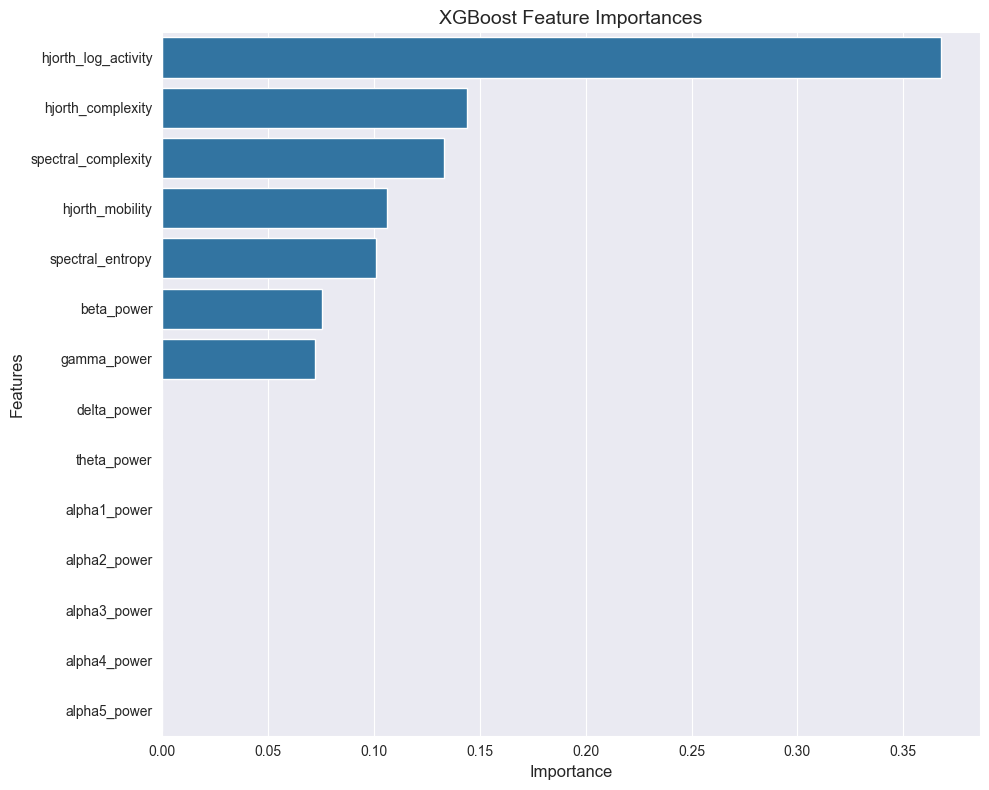

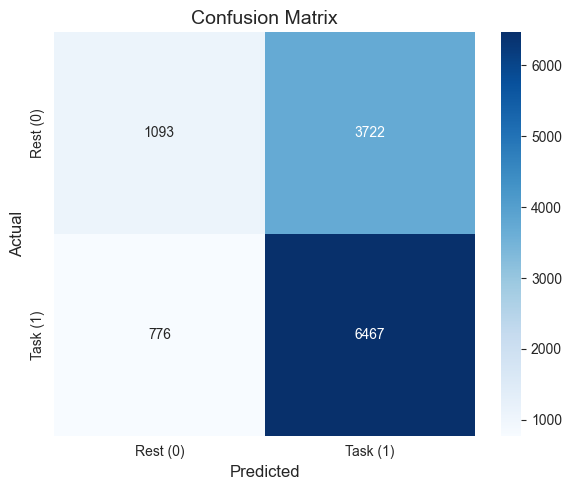


TOP 5 FEATURES MODEL
              precision    recall  f1-score   support

    Rest (0)       0.48      0.58      0.53      4815
    Task (1)       0.68      0.58      0.63      7243

    accuracy                           0.58     12058
   macro avg       0.58      0.58      0.58     12058
weighted avg       0.60      0.58      0.59     12058

ROC-AUC Score: 0.6201

ALPHA SUB-BAND IMPORTANCES
alpha1_power        : 0.0000
alpha2_power        : 0.0000
alpha3_power        : 0.0000
alpha4_power        : 0.0000
alpha5_power        : 0.0000


In [64]:
# ============================================
# FEATURE IMPORTANCES
# ============================================
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

print("\n" + "="*60)
print("FEATURE IMPORTANCES")
print("="*60)
for idx, row in importance_df.iterrows():
    print(f"{row['feature']:30s}: {row['importance']:.4f}")

# Plot feature importances
fig, ax = plt.subplots(figsize=(10, 8))
sns.barplot(data=importance_df, y='feature', x='importance', ax=ax)
ax.set_title('XGBoost Feature Importances', fontsize=14)
ax.set_xlabel('Importance', fontsize=12)
ax.set_ylabel('Features', fontsize=12)
plt.tight_layout()
plt.show()

# ============================================
# VISUALIZE CONFUSION MATRIX
# ============================================
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Rest (0)', 'Task (1)'],
            yticklabels=['Rest (0)', 'Task (1)'])
ax.set_title('Confusion Matrix', fontsize=14)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('Actual', fontsize=12)
plt.tight_layout()
plt.show()

# ============================================
# TOP FEATURES ONLY MODEL (optional)
# ============================================
# Train model with only top 5 features
top5_features = importance_df.head(5)['feature'].values
top5_idx = [feature_names.index(f) for f in top5_features]

X_train_top5 = X_train[:, top5_idx]
X_test_top5 = X_test[:, top5_idx]

model_top5 = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    scale_pos_weight=scale_pos_weight,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model_top5.fit(X_train_top5, y_train)
y_pred_top5 = model_top5.predict(X_test_top5)

print("\n" + "="*60)
print("TOP 5 FEATURES MODEL")
print("="*60)
print(classification_report(y_test, y_pred_top5, target_names=['Rest (0)', 'Task (1)']))
print(f"ROC-AUC Score: {roc_auc_score(y_test, model_top5.predict_proba(X_test_top5)[:, 1]):.4f}")

# ============================================
# ALPHA SUB-BAND IMPORTANCE SUMMARY
# ============================================
alpha_bands = ['alpha1_power', 'alpha2_power', 'alpha3_power', 'alpha4_power', 'alpha5_power']
alpha_importance = importance_df[importance_df['feature'].isin(alpha_bands)]

print("\n" + "="*60)
print("ALPHA SUB-BAND IMPORTANCES")
print("="*60)
for idx, row in alpha_importance.iterrows():
    print(f"{row['feature']:20s}: {row['importance']:.4f}")

# model, trained on different subjects

In [65]:
all_data = []  # Will store (features, label, subject)
feature_names = None

# Process rest files (label = 0)
for subj in rest_stats.keys():
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            condition = 'eyesclosed' if 'eyesclosed' in rest_file else 'eyesopen'
            x = load_signal(rest_file, CHANNEL)

            if is_bad_signal(x):
                continue

            # Extract non-overlapping windows
            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    # Check for NaN values
                    if not any(np.isnan(list(features.values()))):
                        if feature_names is None:
                            feature_names = list(features.keys())
                        all_data.append((list(features.values()), 0, subj))

# Process task files (label = 1)
for subj in rest_stats.keys():
    if subj in task_files:
        for task_file in task_files[subj]:
            # Extract task name
            task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]
            x = load_signal(task_file, CHANNEL)

            if is_bad_signal(x):
                continue

            # Extract non-overlapping windows
            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    # Check for NaN values
                    if not any(np.isnan(list(features.values()))):
                        all_data.append((list(features.values()), 1, subj))

# Convert to structured format
X_all = np.array([d[0] for d in all_data])
y_all = np.array([d[1] for d in all_data])
subjects_all = np.array([d[2] for d in all_data])

print(f"\nTotal windows: {len(X_all)}")
print(f"Rest windows (0): {np.sum(y_all == 0)}")
print(f"Task windows (1): {np.sum(y_all == 1)}")
print(f"Features: {X_all.shape[1]}")
print(f"Unique subjects: {np.unique(subjects_all)}")

/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/3635046973.py:62: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])



Total windows: 60289
Rest windows (0): 24075
Task windows (1): 36214
Features: 14
Unique subjects: ['sub-13' 'sub-14' 'sub-15' 'sub-22' 'sub-23' 'sub-24' 'sub-25' 'sub-40'
 'sub-47' 'sub-49']


In [66]:
unique_subjects = np.unique(subjects_all)
n_subjects = len(unique_subjects)

# Split subjects (e.g., 70% train, 30% test)
np.random.seed(42)
train_subjects = np.random.choice(unique_subjects, size=int(0.7 * n_subjects), replace=False)
test_subjects = np.array([s for s in unique_subjects if s not in train_subjects])

print(f"\nSubject split:")
print(f"Train subjects ({len(train_subjects)}): {train_subjects}")
print(f"Test subjects ({len(test_subjects)}): {test_subjects}")


Subject split:
Train subjects (7): ['sub-47' 'sub-14' 'sub-24' 'sub-13' 'sub-40' 'sub-15' 'sub-49']
Test subjects (3): ['sub-22' 'sub-23' 'sub-25']


In [67]:
train_mask = np.isin(subjects_all, train_subjects)
test_mask = np.isin(subjects_all, test_subjects)

X_train = X_all[train_mask]
y_train = y_all[train_mask]
X_test = X_all[test_mask]
y_test = y_all[test_mask]

print(f"\nTrain set: {len(X_train)} windows from {len(train_subjects)} subjects")
print(f"  - Rest: {np.sum(y_train == 0)}, Task: {np.sum(y_train == 1)}")
print(f"Test set: {len(X_test)} windows from {len(test_subjects)} subjects")
print(f"  - Rest: {np.sum(y_test == 0)}, Task: {np.sum(y_test == 1)}")


Train set: 42198 windows from 7 subjects
  - Rest: 16847, Task: 25351
Test set: 18091 windows from 3 subjects
  - Rest: 7228, Task: 10863


In [68]:
# from sklearn.preprocessing import StandardScaler

# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)

# Calculate scale_pos_weight for imbalanced data
scale_pos_weight = np.sum(y_train == 0) / np.sum(y_train == 1)

# ============================================
# TRAIN XGBOOST MODEL
# ============================================
model = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    # scale_pos_weight=scale_pos_weight,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model.fit(X_train, y_train)

# ============================================
# EVALUATION
# ============================================
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]

In [69]:
print("\n" + "="*60)
print("SUBJECT-WISE CROSS-VALIDATION RESULTS")
print("="*60)
print(f"Train subjects: {len(train_subjects)}")
print(f"Test subjects: {len(test_subjects)}")
print("\n" + "="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_test, y_pred, target_names=['Rest (0)', 'Task (1)']))

print(f"\nROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:")
print(cm)


SUBJECT-WISE CROSS-VALIDATION RESULTS
Train subjects: 7
Test subjects: 3

CLASSIFICATION REPORT
              precision    recall  f1-score   support

    Rest (0)       0.63      0.22      0.33      7228
    Task (1)       0.64      0.91      0.75     10863

    accuracy                           0.64     18091
   macro avg       0.63      0.57      0.54     18091
weighted avg       0.63      0.64      0.58     18091


ROC-AUC Score: 0.6127

Confusion Matrix:
[[1584 5644]
 [ 932 9931]]



FEATURE IMPORTANCES
hjorth_log_activity           : 0.3324
spectral_complexity           : 0.1899
hjorth_complexity             : 0.1290
hjorth_mobility               : 0.1041
gamma_power                   : 0.1032
beta_power                    : 0.0785
spectral_entropy              : 0.0629
delta_power                   : 0.0000
theta_power                   : 0.0000
alpha1_power                  : 0.0000
alpha2_power                  : 0.0000
alpha3_power                  : 0.0000
alpha4_power                  : 0.0000
alpha5_power                  : 0.0000


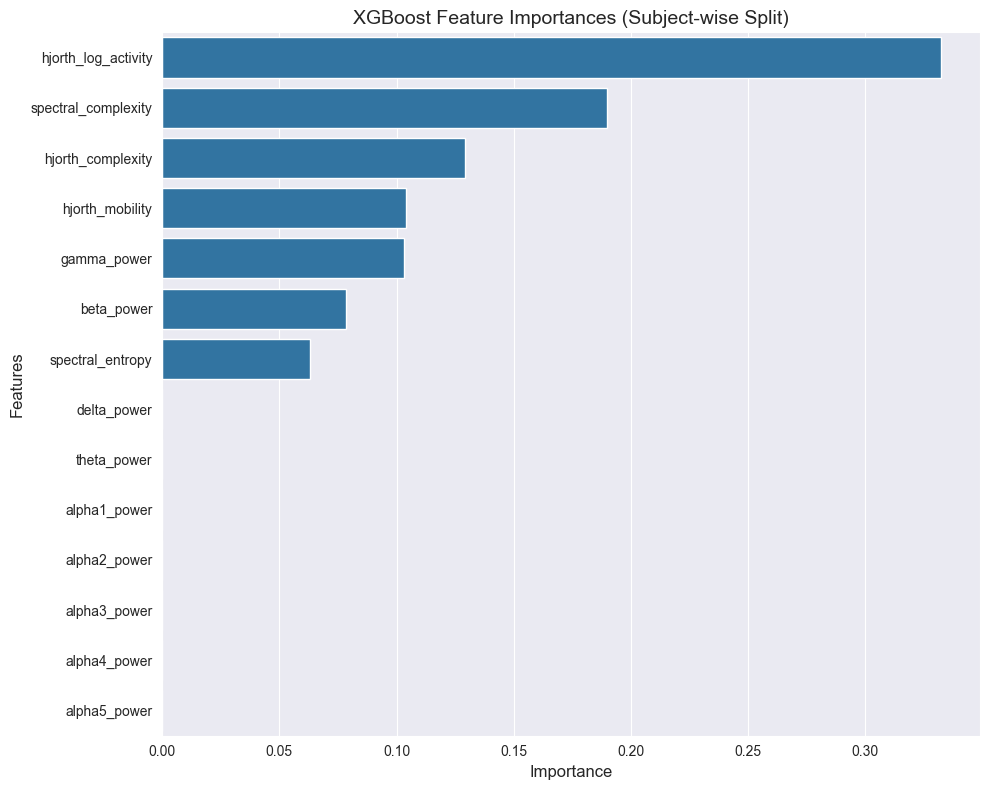

In [70]:
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

print("\n" + "="*60)
print("FEATURE IMPORTANCES")
print("="*60)
for idx, row in importance_df.iterrows():
    print(f"{row['feature']:30s}: {row['importance']:.4f}")

# Plot feature importances
fig, ax = plt.subplots(figsize=(10, 8))
sns.barplot(data=importance_df, y='feature', x='importance', ax=ax)
ax.set_title('XGBoost Feature Importances (Subject-wise Split)', fontsize=14)
ax.set_xlabel('Importance', fontsize=12)
ax.set_ylabel('Features', fontsize=12)
plt.tight_layout()
plt.show()

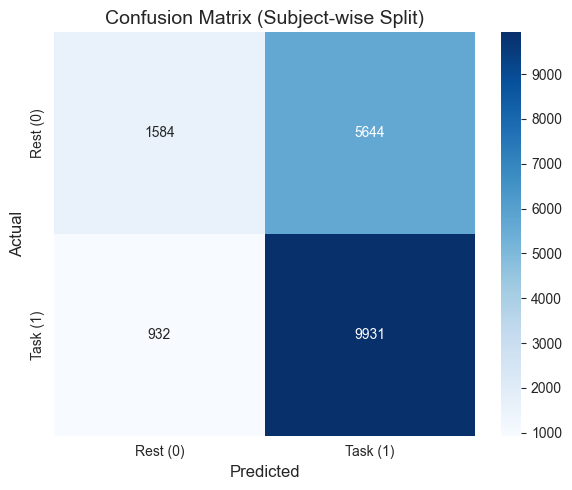

In [71]:
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Rest (0)', 'Task (1)'],
            yticklabels=['Rest (0)', 'Task (1)'])
ax.set_title('Confusion Matrix (Subject-wise Split)', fontsize=14)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('Actual', fontsize=12)
plt.tight_layout()
plt.show()


PER-SUBJECT ACCURACY ON TEST SET
sub-22: 0.631 (n=6031)
sub-23: 0.602 (n=6045)
sub-25: 0.676 (n=6015)

TOP 5 FEATURES MODEL (Subject-wise Split)
              precision    recall  f1-score   support

    Rest (0)       0.62      0.23      0.33      7228
    Task (1)       0.64      0.91      0.75     10863

    accuracy                           0.64     18091
   macro avg       0.63      0.57      0.54     18091
weighted avg       0.63      0.64      0.58     18091

ROC-AUC Score: 0.6128

ALPHA SUB-BAND IMPORTANCES
alpha1_power        : 0.0000
alpha2_power        : 0.0000
alpha3_power        : 0.0000
alpha4_power        : 0.0000
alpha5_power        : 0.0000


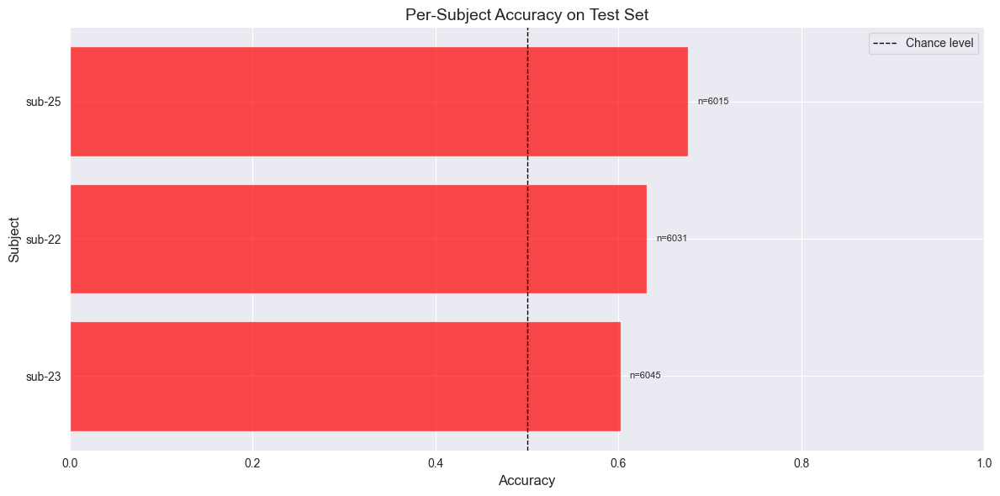

In [72]:
print("\n" + "="*60)
print("PER-SUBJECT ACCURACY ON TEST SET")
print("="*60)

for subj in test_subjects:
    subj_mask = subjects_all == subj
    subj_test_mask = test_mask & subj_mask

    if np.sum(subj_test_mask) > 0:
        X_subj = X_all[subj_test_mask]
        y_subj = y_all[subj_test_mask]

        y_subj_pred = model.predict(X_subj)
        subj_acc = np.mean(y_subj_pred == y_subj)

        print(f"{subj}: {subj_acc:.3f} (n={len(y_subj)})")

# ============================================
# TOP FEATURES ONLY MODEL
# ============================================
# Train model with only top 5 features
top5_features = importance_df.head(5)['feature'].values
top5_idx = [feature_names.index(f) for f in top5_features]

X_train_top5 = X_train[:, top5_idx]
X_test_top5 = X_test[:, top5_idx]

model_top5 = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    # scale_pos_weight=scale_pos_weight,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model_top5.fit(X_train_top5, y_train)
y_pred_top5 = model_top5.predict(X_test_top5)

print("\n" + "="*60)
print("TOP 5 FEATURES MODEL (Subject-wise Split)")
print("="*60)
print(classification_report(y_test, y_pred_top5, target_names=['Rest (0)', 'Task (1)']))
print(f"ROC-AUC Score: {roc_auc_score(y_test, model_top5.predict_proba(X_test_top5)[:, 1]):.4f}")

# ============================================
# ALPHA SUB-BAND IMPORTANCE SUMMARY
# ============================================
alpha_bands = ['alpha1_power', 'alpha2_power', 'alpha3_power', 'alpha4_power', 'alpha5_power']
alpha_importance = importance_df[importance_df['feature'].isin(alpha_bands)]

print("\n" + "="*60)
print("ALPHA SUB-BAND IMPORTANCES")
print("="*60)
for idx, row in alpha_importance.iterrows():
    print(f"{row['feature']:20s}: {row['importance']:.4f}")

# ============================================
# VISUALIZE PREDICTIONS BY SUBJECT
# ============================================
fig, ax = plt.subplots(figsize=(12, 6))

test_subject_list = []
test_accuracy_list = []
test_n_windows = []

for subj in test_subjects:
    subj_mask = subjects_all == subj
    subj_test_mask = test_mask & subj_mask

    if np.sum(subj_test_mask) > 0:
        X_subj = X_all[subj_test_mask]
        y_subj = y_all[subj_test_mask]

        y_subj_pred = model.predict(X_subj)
        subj_acc = np.mean(y_subj_pred == y_subj)

        test_subject_list.append(subj)
        test_accuracy_list.append(subj_acc)
        test_n_windows.append(np.sum(subj_test_mask))

# Sort by accuracy
sorted_idx = np.argsort(test_accuracy_list)
test_subject_list = [test_subject_list[i] for i in sorted_idx]
test_accuracy_list = [test_accuracy_list[i] for i in sorted_idx]
test_n_windows = [test_n_windows[i] for i in sorted_idx]

colors = ['green' if acc >= 0.7 else 'red' for acc in test_accuracy_list]
bars = ax.barh(test_subject_list, test_accuracy_list, color=colors, alpha=0.7)
ax.axvline(x=0.5, color='black', linestyle='--', linewidth=1, label='Chance level')
ax.set_xlabel('Accuracy', fontsize=12)
ax.set_ylabel('Subject', fontsize=12)
ax.set_title('Per-Subject Accuracy on Test Set', fontsize=14)
ax.set_xlim(0, 1)

# Add sample size annotations
for i, (bar, n) in enumerate(zip(bars, test_n_windows)):
    ax.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
            f'n={n}', va='center', fontsize=8)

ax.legend()
plt.tight_layout()
plt.show()

# no hjorth features

In [73]:
import numpy as np
from scipy.stats import entropy
from scipy.signal import welch, find_peaks
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ============================================
# PARAMETERS
# ============================================
WINDOW_SEC = 0.25
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)
OVERLAP = 0  # No overlap

# Define frequency bands (including fine alpha sub-bands)
bands = {
    "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha1": (8, 9),
    "alpha2": (9, 10),
    "alpha3": (10, 11),
    "alpha4": (11, 12),
    "alpha5": (12, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

# ============================================
# FEATURE EXTRACTION FUNCTIONS (No Hjorth)
# ============================================
def spectral_entropy(psd):
    """Spectral entropy"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    return entropy(p)

def spectral_complexity(psd):
    """Spectral complexity (KL divergence from uniform)"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    uniform = np.ones_like(p) / len(p)
    return entropy(p, uniform)

def band_power_features(x, fs, bands):
    """Extract band power features (normalized)"""
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))

    # Calculate raw band powers
    band_powers_raw = {}
    for band_name, (low, high) in bands.items():
        mask = (freqs >= low) & (freqs < high)
        if np.any(mask):
            band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])
        else:
            band_powers_raw[band_name] = 0

    # Normalize
    total_power = sum(band_powers_raw.values())
    if total_power > 0:
        band_powers_norm = {k: v / total_power for k, v in band_powers_raw.items()}
    else:
        band_powers_norm = {k: np.nan for k in band_powers_raw.keys()}

    return band_powers_norm, freqs, psd

def extract_features_from_window(x, fs, bands):
    """Extract all features from a single window (no Hjorth)"""
    # Spectral features
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))
    entropy_val = spectral_entropy(psd)
    complexity_val = spectral_complexity(psd)

    # Band power features
    band_powers, _, _ = band_power_features(x, fs, bands)

    # Combine all features (only spectral and band powers)
    features = {
        # Spectral features
        'spectral_entropy': entropy_val,
        'spectral_complexity': complexity_val,

        # Band powers (all bands)
        **{f'{band}_power': band_powers[band] for band in bands.keys()}
    }

    return features

# ============================================
# CREATE DATASET WITH SUBJECT LABELS
# ============================================
print("Creating windows with subject labels (no Hjorth features)...")

all_data = []  # Will store (features, label, subject)
feature_names = None

# Process rest files (label = 0)
for subj in rest_stats.keys():
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            condition = 'eyesclosed' if 'eyesclosed' in rest_file else 'eyesopen'
            x = load_signal(rest_file, CHANNEL)

            if is_bad_signal(x):
                continue

            # Extract non-overlapping windows
            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    # Check for NaN values
                    if not any(np.isnan(list(features.values()))):
                        if feature_names is None:
                            feature_names = list(features.keys())
                        all_data.append((list(features.values()), 0, subj))

# Process task files (label = 1)
for subj in rest_stats.keys():
    if subj in task_files:
        for task_file in task_files[subj]:
            # Extract task name
            task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]
            x = load_signal(task_file, CHANNEL)

            if is_bad_signal(x):
                continue

            # Extract non-overlapping windows
            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    # Check for NaN values
                    if not any(np.isnan(list(features.values()))):
                        all_data.append((list(features.values()), 1, subj))

# Convert to structured format
X_all = np.array([d[0] for d in all_data])
y_all = np.array([d[1] for d in all_data])
subjects_all = np.array([d[2] for d in all_data])

print(f"\nTotal windows: {len(X_all)}")
print(f"Rest windows (0): {np.sum(y_all == 0)}")
print(f"Task windows (1): {np.sum(y_all == 1)}")
print(f"Features: {X_all.shape[1]}")
print(f"Feature names: {feature_names}")
print(f"Unique subjects: {np.unique(subjects_all)}")

Creating windows with subject labels (no Hjorth features)...


/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/4165874288.py:62: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])



Total windows: 60289
Rest windows (0): 24075
Task windows (1): 36214
Features: 11
Feature names: ['spectral_entropy', 'spectral_complexity', 'delta_power', 'theta_power', 'alpha1_power', 'alpha2_power', 'alpha3_power', 'alpha4_power', 'alpha5_power', 'beta_power', 'gamma_power']
Unique subjects: ['sub-13' 'sub-14' 'sub-15' 'sub-22' 'sub-23' 'sub-24' 'sub-25' 'sub-40'
 'sub-47' 'sub-49']


In [74]:
unique_subjects = np.unique(subjects_all)
n_subjects = len(unique_subjects)

# Split subjects (e.g., 70% train, 30% test)
np.random.seed(42)
train_subjects = np.random.choice(unique_subjects, size=int(0.7 * n_subjects), replace=False)
test_subjects = np.array([s for s in unique_subjects if s not in train_subjects])

print(f"\nSubject split:")
print(f"Train subjects ({len(train_subjects)}): {train_subjects}")
print(f"Test subjects ({len(test_subjects)}): {test_subjects}")


Subject split:
Train subjects (7): ['sub-47' 'sub-14' 'sub-24' 'sub-13' 'sub-40' 'sub-15' 'sub-49']
Test subjects (3): ['sub-22' 'sub-23' 'sub-25']


In [75]:
train_mask = np.isin(subjects_all, train_subjects)
test_mask = np.isin(subjects_all, test_subjects)

X_train = X_all[train_mask]
y_train = y_all[train_mask]
X_test = X_all[test_mask]
y_test = y_all[test_mask]

print(f"\nTrain set: {len(X_train)} windows from {len(train_subjects)} subjects")
print(f"  - Rest: {np.sum(y_train == 0)}, Task: {np.sum(y_train == 1)}")
print(f"Test set: {len(X_test)} windows from {len(test_subjects)} subjects")
print(f"  - Rest: {np.sum(y_test == 0)}, Task: {np.sum(y_test == 1)}")


Train set: 42198 windows from 7 subjects
  - Rest: 16847, Task: 25351
Test set: 18091 windows from 3 subjects
  - Rest: 7228, Task: 10863


In [76]:
scale_pos_weight = np.sum(y_train == 0) / np.sum(y_train == 1)

# ============================================
# TRAIN XGBOOST MODEL (No scaling)
# ============================================
model = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    # scale_pos_weight=scale_pos_weight,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model.fit(X_train, y_train)

# ============================================
# EVALUATION
# ============================================
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]

In [77]:
print("\n" + "="*60)
print("SUBJECT-WISE CROSS-VALIDATION RESULTS (No Hjorth Features)")
print("="*60)
print(f"Train subjects: {len(train_subjects)}")
print(f"Test subjects: {len(test_subjects)}")
print("\n" + "="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_test, y_pred, target_names=['Rest (0)', 'Task (1)']))

print(f"\nROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:")
print(cm)


SUBJECT-WISE CROSS-VALIDATION RESULTS (No Hjorth Features)
Train subjects: 7
Test subjects: 3

CLASSIFICATION REPORT
              precision    recall  f1-score   support

    Rest (0)       0.40      0.01      0.02      7228
    Task (1)       0.60      0.99      0.75     10863

    accuracy                           0.60     18091
   macro avg       0.50      0.50      0.39     18091
weighted avg       0.52      0.60      0.46     18091


ROC-AUC Score: 0.5397

Confusion Matrix:
[[   91  7137]
 [  134 10729]]



FEATURE IMPORTANCES (No Hjorth)
spectral_complexity           : 0.4643
spectral_entropy              : 0.3307
gamma_power                   : 0.1185
beta_power                    : 0.0865
delta_power                   : 0.0000
theta_power                   : 0.0000
alpha1_power                  : 0.0000
alpha2_power                  : 0.0000
alpha3_power                  : 0.0000
alpha4_power                  : 0.0000
alpha5_power                  : 0.0000


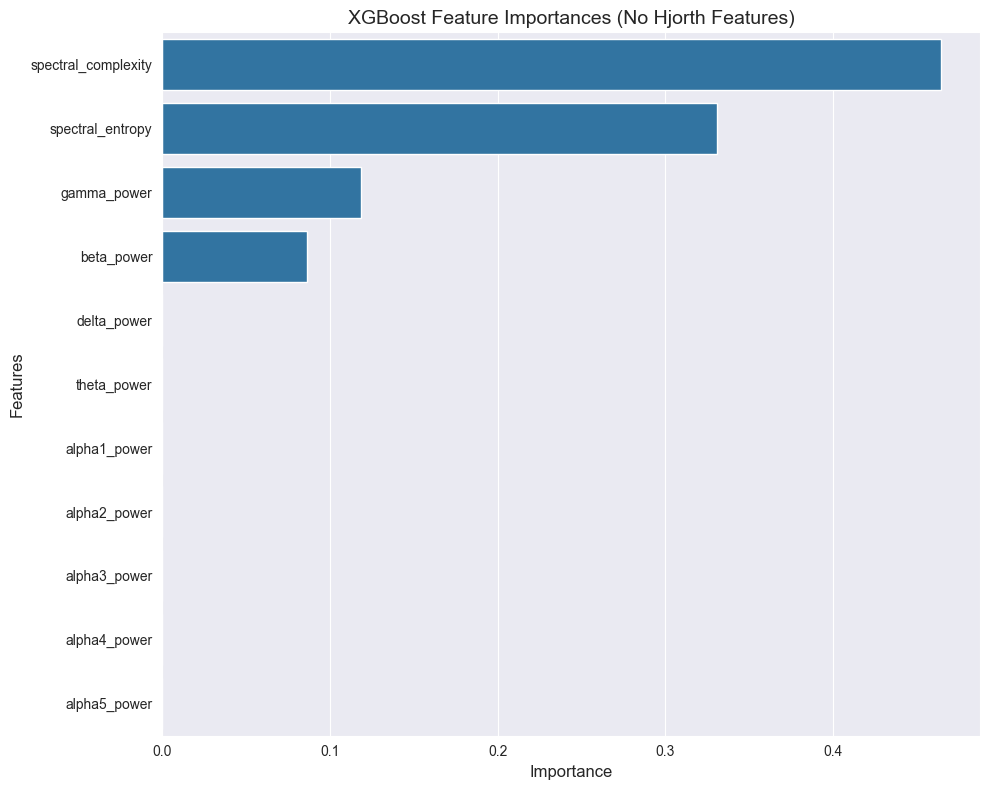

In [78]:
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

print("\n" + "="*60)
print("FEATURE IMPORTANCES (No Hjorth)")
print("="*60)
for idx, row in importance_df.iterrows():
    print(f"{row['feature']:30s}: {row['importance']:.4f}")

# Plot feature importances
fig, ax = plt.subplots(figsize=(10, 8))
sns.barplot(data=importance_df, y='feature', x='importance', ax=ax)
ax.set_title('XGBoost Feature Importances (No Hjorth Features)', fontsize=14)
ax.set_xlabel('Importance', fontsize=12)
ax.set_ylabel('Features', fontsize=12)
plt.tight_layout()
plt.show()

# no hjorth activity

Creating windows with subject labels (Hjorth features without activity)...


/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/2610173831.py:95: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])



Total windows: 60289
Rest windows (0): 24075
Task windows (1): 36214
Features: 13
Feature names: ['hjorth_mobility', 'hjorth_complexity', 'spectral_entropy', 'spectral_complexity', 'delta_power', 'theta_power', 'alpha1_power', 'alpha2_power', 'alpha3_power', 'alpha4_power', 'alpha5_power', 'beta_power', 'gamma_power']
Unique subjects: ['sub-13' 'sub-14' 'sub-15' 'sub-22' 'sub-23' 'sub-24' 'sub-25' 'sub-40'
 'sub-47' 'sub-49']

Subject split:
Train subjects (7): ['sub-47' 'sub-14' 'sub-24' 'sub-13' 'sub-40' 'sub-15' 'sub-49']
Test subjects (3): ['sub-22' 'sub-23' 'sub-25']

Train set: 42198 windows from 7 subjects
  - Rest: 16847, Task: 25351
Test set: 18091 windows from 3 subjects
  - Rest: 7228, Task: 10863

SUBJECT-WISE CROSS-VALIDATION RESULTS (Hjorth without Activity)
Train subjects: 7
Test subjects: 3

CLASSIFICATION REPORT
              precision    recall  f1-score   support

    Rest (0)       0.53      0.01      0.03      7228
    Task (1)       0.60      0.99      0.75     1

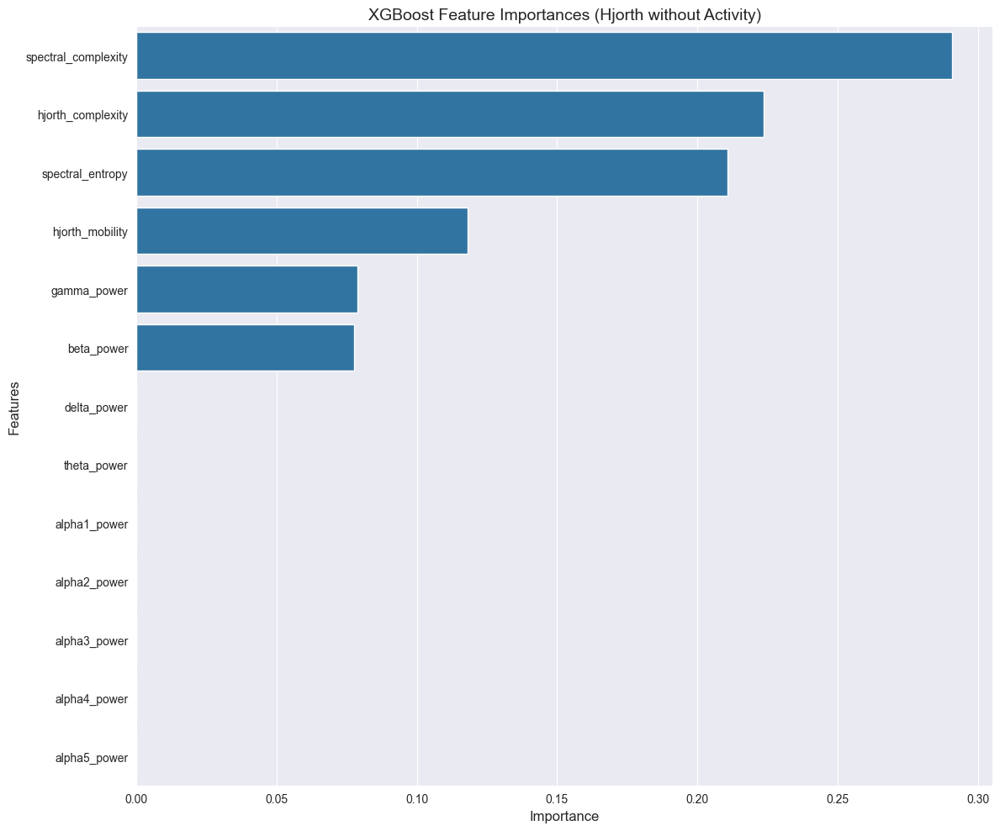

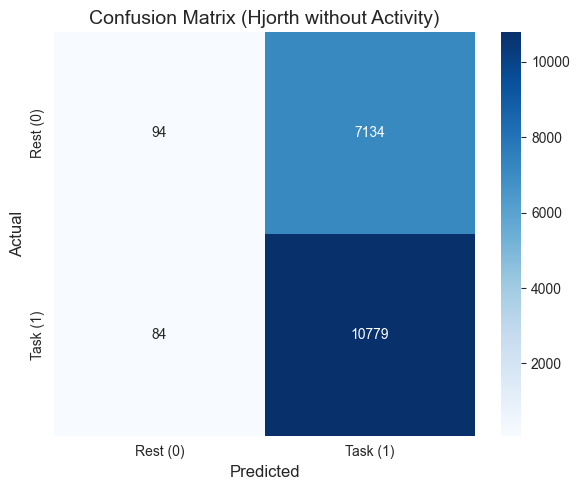


PER-SUBJECT ACCURACY ON TEST SET (Hjorth without Activity)
sub-22: 0.604 (n=6031)
sub-23: 0.600 (n=6045)
sub-25: 0.599 (n=6015)

TOP 5 FEATURES MODEL (Hjorth without Activity)
              precision    recall  f1-score   support

    Rest (0)       0.45      0.59      0.51      7228
    Task (1)       0.66      0.52      0.58     10863

    accuracy                           0.55     18091
   macro avg       0.56      0.56      0.55     18091
weighted avg       0.58      0.55      0.55     18091

ROC-AUC Score: 0.5554

ALPHA SUB-BAND IMPORTANCES (Hjorth without Activity)
alpha1_power        : 0.0000
alpha2_power        : 0.0000
alpha3_power        : 0.0000
alpha4_power        : 0.0000
alpha5_power        : 0.0000


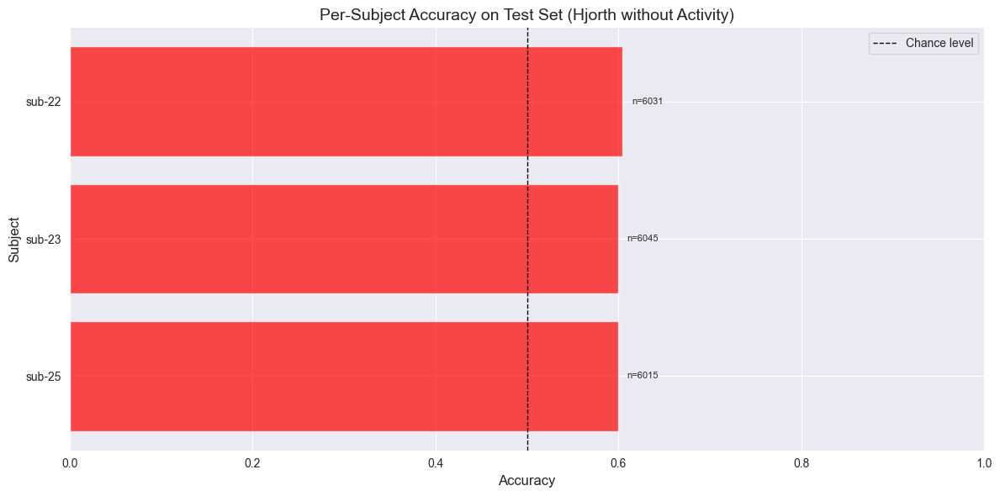


STATISTICAL SIGNIFICANCE (Binomial Test)
Overall accuracy: 0.601
P(accuracy > chance): p=0.000000


In [79]:
import numpy as np
from scipy.stats import entropy
from scipy.signal import welch, find_peaks
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ============================================
# PARAMETERS
# ============================================
WINDOW_SEC = 0.25
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)
OVERLAP = 0  # No overlap

# Define frequency bands (including fine alpha sub-bands)
bands = {
    "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha1": (8, 9),
    "alpha2": (9, 10),
    "alpha3": (10, 11),
    "alpha4": (11, 12),
    "alpha5": (12, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

# ============================================
# FEATURE EXTRACTION FUNCTIONS (With Hjorth, excluding activity)
# ============================================
def hjorth_mobility(x):
    """Hjorth mobility = sqrt(var(diff(signal)) / var(signal))"""
    if len(x) < 2:
        return np.nan
    activity = np.var(x)
    if activity == 0:
        return np.nan
    diff1 = np.diff(x)
    mobility = np.sqrt(np.var(diff1) / activity)
    return mobility

def hjorth_complexity(x):
    """Hjorth complexity = mobility(diff(signal)) / mobility(signal)"""
    if len(x) < 3:
        return np.nan

    mobility_signal = hjorth_mobility(x)
    if np.isnan(mobility_signal) or mobility_signal == 0:
        return np.nan

    diff1 = np.diff(x)
    mobility_diff = hjorth_mobility(diff1)
    if np.isnan(mobility_diff):
        return np.nan

    complexity = mobility_diff / mobility_signal
    return complexity

def hjorth_log_activity(x):
    """Log of Hjorth activity"""
    activity = np.var(x)
    return np.log1p(activity) if activity > 0 else np.nan

def spectral_entropy(psd):
    """Spectral entropy"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    return entropy(p)

def spectral_complexity(psd):
    """Spectral complexity (KL divergence from uniform)"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    uniform = np.ones_like(p) / len(p)
    return entropy(p, uniform)

def band_power_features(x, fs, bands):
    """Extract band power features (normalized)"""
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))

    # Calculate raw band powers
    band_powers_raw = {}
    for band_name, (low, high) in bands.items():
        mask = (freqs >= low) & (freqs < high)
        if np.any(mask):
            band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])
        else:
            band_powers_raw[band_name] = 0

    # Normalize
    total_power = sum(band_powers_raw.values())
    if total_power > 0:
        band_powers_norm = {k: v / total_power for k, v in band_powers_raw.items()}
    else:
        band_powers_norm = {k: np.nan for k in band_powers_raw.keys()}

    return band_powers_norm, freqs, psd

def extract_features_from_window(x, fs, bands):
    """Extract all features from a single window (Hjorth without activity)"""
    # Hjorth features (excluding activity)
    mobility = hjorth_mobility(x)
    complexity = hjorth_complexity(x)
    log_activity = hjorth_log_activity(x)

    # Spectral features
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))
    entropy_val = spectral_entropy(psd)
    spectral_complexity_val = spectral_complexity(psd)

    # Band power features
    band_powers, _, _ = band_power_features(x, fs, bands)

    # Combine all features
    features = {
        # Hjorth features (activity excluded)
        'hjorth_mobility': mobility,
        'hjorth_complexity': complexity,
        # 'hjorth_log_activity': log_activity,

        # Spectral features
        'spectral_entropy': entropy_val,
        'spectral_complexity': spectral_complexity_val,

        # Band powers (all bands)
        **{f'{band}_power': band_powers[band] for band in bands.keys()}
    }

    return features

# ============================================
# CREATE DATASET WITH SUBJECT LABELS
# ============================================
print("Creating windows with subject labels (Hjorth features without activity)...")

all_data = []  # Will store (features, label, subject)
feature_names = None

# Process rest files (label = 0)
for subj in rest_stats.keys():
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            condition = 'eyesclosed' if 'eyesclosed' in rest_file else 'eyesopen'
            x = load_signal(rest_file, CHANNEL)

            if is_bad_signal(x):
                continue

            # Extract non-overlapping windows
            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    # Check for NaN values
                    if not any(np.isnan(list(features.values()))):
                        if feature_names is None:
                            feature_names = list(features.keys())
                        all_data.append((list(features.values()), 0, subj))

# Process task files (label = 1)
for subj in rest_stats.keys():
    if subj in task_files:
        for task_file in task_files[subj]:
            # Extract task name
            task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]
            x = load_signal(task_file, CHANNEL)

            if is_bad_signal(x):
                continue

            # Extract non-overlapping windows
            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    # Check for NaN values
                    if not any(np.isnan(list(features.values()))):
                        all_data.append((list(features.values()), 1, subj))

# Convert to structured format
X_all = np.array([d[0] for d in all_data])
y_all = np.array([d[1] for d in all_data])
subjects_all = np.array([d[2] for d in all_data])

print(f"\nTotal windows: {len(X_all)}")
print(f"Rest windows (0): {np.sum(y_all == 0)}")
print(f"Task windows (1): {np.sum(y_all == 1)}")
print(f"Features: {X_all.shape[1]}")
print(f"Feature names: {feature_names}")
print(f"Unique subjects: {np.unique(subjects_all)}")

# ============================================
# SUBJECT-WISE TRAIN-TEST SPLIT
# ============================================
# Get unique subjects
unique_subjects = np.unique(subjects_all)
n_subjects = len(unique_subjects)

# Split subjects (e.g., 70% train, 30% test)
np.random.seed(42)
train_subjects = np.random.choice(unique_subjects, size=int(0.7 * n_subjects), replace=False)
test_subjects = np.array([s for s in unique_subjects if s not in train_subjects])

print(f"\nSubject split:")
print(f"Train subjects ({len(train_subjects)}): {train_subjects}")
print(f"Test subjects ({len(test_subjects)}): {test_subjects}")

# Create train/test masks
train_mask = np.isin(subjects_all, train_subjects)
test_mask = np.isin(subjects_all, test_subjects)

X_train = X_all[train_mask]
y_train = y_all[train_mask]
X_test = X_all[test_mask]
y_test = y_all[test_mask]

print(f"\nTrain set: {len(X_train)} windows from {len(train_subjects)} subjects")
print(f"  - Rest: {np.sum(y_train == 0)}, Task: {np.sum(y_train == 1)}")
print(f"Test set: {len(X_test)} windows from {len(test_subjects)} subjects")
print(f"  - Rest: {np.sum(y_test == 0)}, Task: {np.sum(y_test == 1)}")

# Calculate scale_pos_weight for imbalanced data
scale_pos_weight = np.sum(y_train == 0) / np.sum(y_train == 1)

# ============================================
# TRAIN XGBOOST MODEL (No scaling)
# ============================================
model = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    # scale_pos_weight=scale_pos_weight,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model.fit(X_train, y_train)

# ============================================
# EVALUATION
# ============================================
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]

print("\n" + "="*60)
print("SUBJECT-WISE CROSS-VALIDATION RESULTS (Hjorth without Activity)")
print("="*60)
print(f"Train subjects: {len(train_subjects)}")
print(f"Test subjects: {len(test_subjects)}")
print("\n" + "="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_test, y_pred, target_names=['Rest (0)', 'Task (1)']))

print(f"\nROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:")
print(cm)

# ============================================
# FEATURE IMPORTANCES
# ============================================
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

print("\n" + "="*60)
print("FEATURE IMPORTANCES (Hjorth without Activity)")
print("="*60)
for idx, row in importance_df.iterrows():
    print(f"{row['feature']:30s}: {row['importance']:.4f}")

# Plot feature importances
fig, ax = plt.subplots(figsize=(12, 10))
sns.barplot(data=importance_df, y='feature', x='importance', ax=ax)
ax.set_title('XGBoost Feature Importances (Hjorth without Activity)', fontsize=14)
ax.set_xlabel('Importance', fontsize=12)
ax.set_ylabel('Features', fontsize=12)
plt.tight_layout()
plt.show()

# ============================================
# VISUALIZE CONFUSION MATRIX
# ============================================
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Rest (0)', 'Task (1)'],
            yticklabels=['Rest (0)', 'Task (1)'])
ax.set_title('Confusion Matrix (Hjorth without Activity)', fontsize=14)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('Actual', fontsize=12)
plt.tight_layout()
plt.show()

# ============================================
# PER-SUBJECT ACCURACY ON TEST SET
# ============================================
print("\n" + "="*60)
print("PER-SUBJECT ACCURACY ON TEST SET (Hjorth without Activity)")
print("="*60)

for subj in test_subjects:
    subj_mask = subjects_all == subj
    subj_test_mask = test_mask & subj_mask

    if np.sum(subj_test_mask) > 0:
        X_subj = X_all[subj_test_mask]
        y_subj = y_all[subj_test_mask]

        y_subj_pred = model.predict(X_subj)
        subj_acc = np.mean(y_subj_pred == y_subj)

        print(f"{subj}: {subj_acc:.3f} (n={len(y_subj)})")

# ============================================
# TOP FEATURES ONLY MODEL
# ============================================
# Train model with only top 5 features
top5_features = importance_df.head(5)['feature'].values
top5_idx = [feature_names.index(f) for f in top5_features]

X_train_top5 = X_train[:, top5_idx]
X_test_top5 = X_test[:, top5_idx]

model_top5 = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    scale_pos_weight=scale_pos_weight,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model_top5.fit(X_train_top5, y_train)
y_pred_top5 = model_top5.predict(X_test_top5)

print("\n" + "="*60)
print("TOP 5 FEATURES MODEL (Hjorth without Activity)")
print("="*60)
print(classification_report(y_test, y_pred_top5, target_names=['Rest (0)', 'Task (1)']))
print(f"ROC-AUC Score: {roc_auc_score(y_test, model_top5.predict_proba(X_test_top5)[:, 1]):.4f}")

# ============================================
# ALPHA SUB-BAND IMPORTANCE SUMMARY
# ============================================
alpha_bands = ['alpha1_power', 'alpha2_power', 'alpha3_power', 'alpha4_power', 'alpha5_power']
alpha_importance = importance_df[importance_df['feature'].isin(alpha_bands)]

print("\n" + "="*60)
print("ALPHA SUB-BAND IMPORTANCES (Hjorth without Activity)")
print("="*60)
for idx, row in alpha_importance.iterrows():
    print(f"{row['feature']:20s}: {row['importance']:.4f}")

# ============================================
# VISUALIZE PREDICTIONS BY SUBJECT
# ============================================
fig, ax = plt.subplots(figsize=(12, 6))

test_subject_list = []
test_accuracy_list = []
test_n_windows = []

for subj in test_subjects:
    subj_mask = subjects_all == subj
    subj_test_mask = test_mask & subj_mask

    if np.sum(subj_test_mask) > 0:
        X_subj = X_all[subj_test_mask]
        y_subj = y_all[subj_test_mask]

        y_subj_pred = model.predict(X_subj)
        subj_acc = np.mean(y_subj_pred == y_subj)

        test_subject_list.append(subj)
        test_accuracy_list.append(subj_acc)
        test_n_windows.append(np.sum(subj_test_mask))

# Sort by accuracy
sorted_idx = np.argsort(test_accuracy_list)
test_subject_list = [test_subject_list[i] for i in sorted_idx]
test_accuracy_list = [test_accuracy_list[i] for i in sorted_idx]
test_n_windows = [test_n_windows[i] for i in sorted_idx]

colors = ['green' if acc >= 0.7 else 'red' for acc in test_accuracy_list]
bars = ax.barh(test_subject_list, test_accuracy_list, color=colors, alpha=0.7)
ax.axvline(x=0.5, color='black', linestyle='--', linewidth=1, label='Chance level')
ax.set_xlabel('Accuracy', fontsize=12)
ax.set_ylabel('Subject', fontsize=12)
ax.set_title('Per-Subject Accuracy on Test Set (Hjorth without Activity)', fontsize=14)
ax.set_xlim(0, 1)

# Add sample size annotations
for i, (bar, n) in enumerate(zip(bars, test_n_windows)):
    ax.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
            f'n={n}', va='center', fontsize=8)

ax.legend()
plt.tight_layout()
plt.show()

# ============================================
# COMPARE WITH RANDOM CHANCE
# ============================================
from scipy.stats import binomtest

print("\n" + "="*60)
print("STATISTICAL SIGNIFICANCE (Binomial Test)")
print("="*60)
overall_acc = np.mean(y_pred == y_test)
n_test = len(y_test)
p_value = binomtest(int(overall_acc * n_test), n_test, 0.5).pvalue
print(f"Overall accuracy: {overall_acc:.3f}")
print(f"P(accuracy > chance): p={p_value:.6f}")

# subjects, all features (I gave up lol)

In [ ]:
def load_signal(file, channel):
    try:
        raw = mne.io.read_raw_brainvision(file, preload=True, verbose=False)

        if channel not in raw.ch_names:
            return None
        if channel in raw.info["bads"]:
            return None

        raw.pick([channel])

        # ------------------------
        # FILTERING STEP (IMPORTANT)
        # ------------------------
        raw.notch_filter(50, verbose=False)   # remove mains noise
        raw.filter(1, 40, verbose=False)      # keep only <= 40 Hz

        raw.resample(TARGET_SFREQ)

        x = raw.get_data()[0]

        if not np.all(np.isfinite(x)):
            return None
        if np.std(x) < 1e-10:
            return None

        return x

    except Exception:
        return None

In [80]:
import numpy as np
from scipy.stats import entropy
from scipy.signal import welch, find_peaks
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ============================================
# PARAMETERS
# ============================================
WINDOW_SEC = 0.25
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)
OVERLAP = 0  # No overlap

# Define frequency bands (original bands only, no alpha sub-bands)
bands = {
    "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

# ============================================
# FEATURE EXTRACTION FUNCTIONS (All Hjorth parameters)
# ============================================
def hjorth_activity(x):
    """Hjorth activity = variance of signal"""
    return np.var(x)

def hjorth_mobility(x):
    """Hjorth mobility = sqrt(var(diff(signal)) / var(signal))"""
    if len(x) < 2:
        return np.nan
    activity = np.var(x)
    if activity == 0:
        return np.nan
    diff1 = np.diff(x)
    mobility = np.sqrt(np.var(diff1) / activity)
    return mobility

def hjorth_complexity(x):
    """Hjorth complexity = mobility(diff(signal)) / mobility(signal)"""
    if len(x) < 3:
        return np.nan

    mobility_signal = hjorth_mobility(x)
    if np.isnan(mobility_signal) or mobility_signal == 0:
        return np.nan

    diff1 = np.diff(x)
    mobility_diff = hjorth_mobility(diff1)
    if np.isnan(mobility_diff):
        return np.nan

    complexity = mobility_diff / mobility_signal
    return complexity

def spectral_entropy(psd):
    """Spectral entropy"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    return entropy(p)

def spectral_complexity(psd):
    """Spectral complexity (KL divergence from uniform)"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    uniform = np.ones_like(p) / len(p)
    return entropy(p, uniform)

def band_power_features(x, fs, bands):
    """Extract band power features (normalized)"""
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))

    # Calculate raw band powers
    band_powers_raw = {}
    for band_name, (low, high) in bands.items():
        mask = (freqs >= low) & (freqs < high)
        if np.any(mask):
            band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])
        else:
            band_powers_raw[band_name] = 0

    # Normalize
    total_power = sum(band_powers_raw.values())
    if total_power > 0:
        band_powers_norm = {k: v / total_power for k, v in band_powers_raw.items()}
    else:
        band_powers_norm = {k: np.nan for k in band_powers_raw.keys()}

    return band_powers_norm, freqs, psd

def extract_features_from_window(x, fs, bands):
    """Extract all features from a single window (all Hjorth parameters)"""
    # Hjorth features (all parameters)
    activity = hjorth_activity(x)
    mobility = hjorth_mobility(x)
    complexity = hjorth_complexity(x)

    # Log versions of Hjorth features
    log_activity = np.log1p(activity) if activity > 0 else np.nan
    log_mobility = np.log1p(mobility) if not np.isnan(mobility) and mobility > 0 else np.nan
    log_complexity = np.log1p(complexity) if not np.isnan(complexity) and complexity > 0 else np.nan

    # Spectral features
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))
    entropy_val = spectral_entropy(psd)
    spectral_complexity_val = spectral_complexity(psd)

    # Band power features
    band_powers, _, _ = band_power_features(x, fs, bands)

    # Combine all features
    features = {
        # Hjorth features (raw)
        'hjorth_activity': activity,
        'hjorth_mobility': mobility,
        'hjorth_complexity': complexity,

        # Hjorth features (log)
        'hjorth_log_activity': log_activity,
        'hjorth_log_mobility': log_mobility,
        'hjorth_log_complexity': log_complexity,

        # Spectral features
        'spectral_entropy': entropy_val,
        'spectral_complexity': spectral_complexity_val,

        # Band powers (all bands)
        **{f'{band}_power': band_powers[band] for band in bands.keys()}
    }

    return features

In [81]:
all_data = []
feature_names = None

# Process rest files (label = 0)
for subj in rest_stats.keys():
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            condition = 'eyesclosed' if 'eyesclosed' in rest_file else 'eyesopen'
            x = load_signal(rest_file, CHANNEL)

            if is_bad_signal(x):
                continue

            # Extract non-overlapping windows
            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    # Check for NaN values
                    if not any(np.isnan(list(features.values()))):
                        if feature_names is None:
                            feature_names = list(features.keys())
                        all_data.append((list(features.values()), 0, subj))

# Process task files (label = 1)
for subj in rest_stats.keys():
    if subj in task_files:
        for task_file in task_files[subj]:
            # Extract task name
            task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]
            x = load_signal(task_file, CHANNEL)

            if is_bad_signal(x):
                continue

            # Extract non-overlapping windows
            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    # Check for NaN values
                    if not any(np.isnan(list(features.values()))):
                        all_data.append((list(features.values()), 1, subj))

# Convert to structured format
X_all = np.array([d[0] for d in all_data])
y_all = np.array([d[1] for d in all_data])
subjects_all = np.array([d[2] for d in all_data])

print(f"\nTotal windows: {len(X_all)}")
print(f"Rest windows (0): {np.sum(y_all == 0)}")
print(f"Task windows (1): {np.sum(y_all == 1)}")
print(f"Features: {X_all.shape[1]}")
print(f"Feature names: {feature_names}")
print(f"Unique subjects: {np.unique(subjects_all)}")

# ============================================
# SUBJECT-WISE TRAIN-TEST SPLIT
# ============================================
# Get unique subjects
unique_subjects = np.unique(subjects_all)
n_subjects = len(unique_subjects)

# Split subjects (e.g., 70% train, 30% test)
np.random.seed(42)
train_subjects = np.random.choice(unique_subjects, size=int(0.7 * n_subjects), replace=False)
test_subjects = np.array([s for s in unique_subjects if s not in train_subjects])

print(f"\nSubject split:")
print(f"Train subjects ({len(train_subjects)}): {train_subjects}")
print(f"Test subjects ({len(test_subjects)}): {test_subjects}")

# Create train/test masks
train_mask = np.isin(subjects_all, train_subjects)
test_mask = np.isin(subjects_all, test_subjects)

X_train = X_all[train_mask]
y_train = y_all[train_mask]
X_test = X_all[test_mask]
y_test = y_all[test_mask]

print(f"\nTrain set: {len(X_train)} windows from {len(train_subjects)} subjects")
print(f"  - Rest: {np.sum(y_train == 0)}, Task: {np.sum(y_train == 1)}")
print(f"Test set: {len(X_test)} windows from {len(test_subjects)} subjects")
print(f"  - Rest: {np.sum(y_test == 0)}, Task: {np.sum(y_test == 1)}")

# Calculate scale_pos_weight for imbalanced data
scale_pos_weight = np.sum(y_train == 0) / np.sum(y_train == 1)

/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/2737212968.py:90: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])



Total windows: 60289
Rest windows (0): 24075
Task windows (1): 36214
Features: 13
Feature names: ['hjorth_activity', 'hjorth_mobility', 'hjorth_complexity', 'hjorth_log_activity', 'hjorth_log_mobility', 'hjorth_log_complexity', 'spectral_entropy', 'spectral_complexity', 'delta_power', 'theta_power', 'alpha_power', 'beta_power', 'gamma_power']
Unique subjects: ['sub-13' 'sub-14' 'sub-15' 'sub-22' 'sub-23' 'sub-24' 'sub-25' 'sub-40'
 'sub-47' 'sub-49']

Subject split:
Train subjects (7): ['sub-47' 'sub-14' 'sub-24' 'sub-13' 'sub-40' 'sub-15' 'sub-49']
Test subjects (3): ['sub-22' 'sub-23' 'sub-25']

Train set: 42198 windows from 7 subjects
  - Rest: 16847, Task: 25351
Test set: 18091 windows from 3 subjects
  - Rest: 7228, Task: 10863


## model

In [82]:
model = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    # scale_pos_weight=scale_pos_weight,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model.fit(X_train, y_train)

# ============================================
# EVALUATION
# ============================================
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]

## results

In [83]:
print("\n" + "="*60)
print("SUBJECT-WISE CROSS-VALIDATION RESULTS (All Hjorth + Logs, No Sub-bands)")
print("="*60)
print(f"Train subjects: {len(train_subjects)}")
print(f"Test subjects: {len(test_subjects)}")
print("\n" + "="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_test, y_pred, target_names=['Rest (0)', 'Task (1)']))

print(f"\nROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")


SUBJECT-WISE CROSS-VALIDATION RESULTS (All Hjorth + Logs, No Sub-bands)
Train subjects: 7
Test subjects: 3

CLASSIFICATION REPORT
              precision    recall  f1-score   support

    Rest (0)       0.63      0.23      0.33      7228
    Task (1)       0.64      0.91      0.75     10863

    accuracy                           0.64     18091
   macro avg       0.64      0.57      0.54     18091
weighted avg       0.64      0.64      0.59     18091


ROC-AUC Score: 0.6158


## FEATURE IMPORTANCES


FEATURE IMPORTANCES (All Hjorth + Logs, No Sub-bands)
hjorth_activity               : 0.2067
hjorth_log_activity           : 0.2056
alpha_power                   : 0.1064
beta_power                    : 0.0988
hjorth_complexity             : 0.0796
hjorth_mobility               : 0.0738
hjorth_log_mobility           : 0.0631
hjorth_log_complexity         : 0.0528
gamma_power                   : 0.0424
spectral_complexity           : 0.0370
spectral_entropy              : 0.0339
delta_power                   : 0.0000
theta_power                   : 0.0000


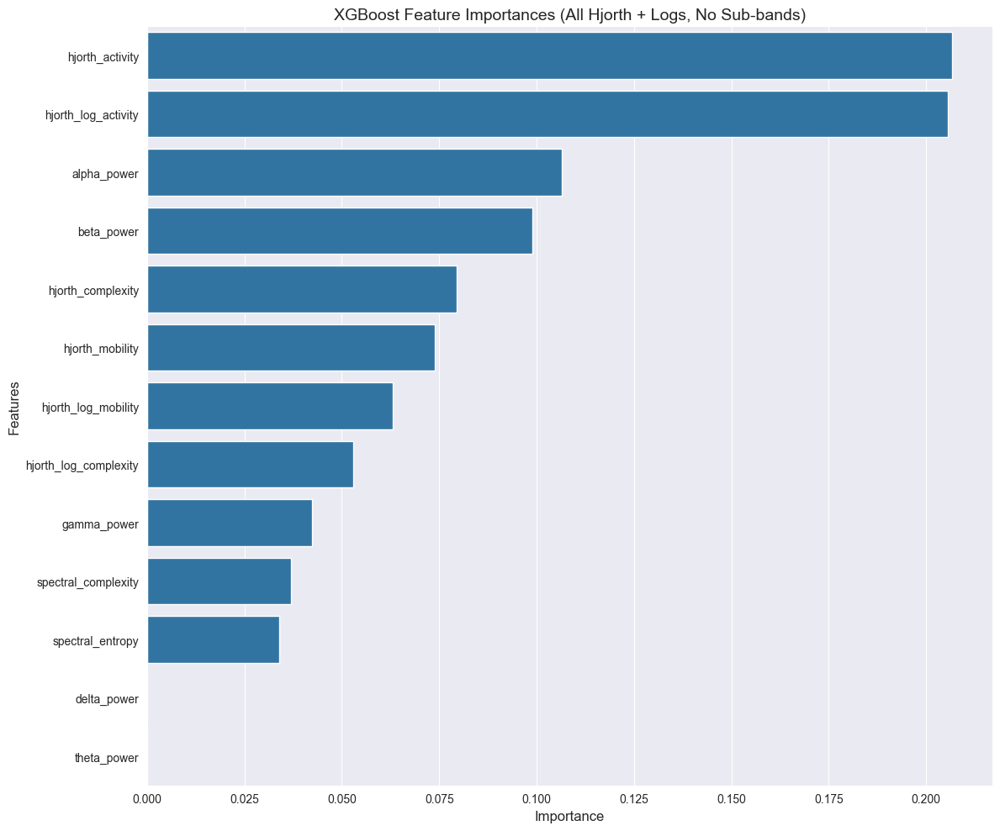

In [84]:
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

print("\n" + "="*60)
print("FEATURE IMPORTANCES (All Hjorth + Logs, No Sub-bands)")
print("="*60)
for idx, row in importance_df.iterrows():
    print(f"{row['feature']:30s}: {row['importance']:.4f}")

# Plot feature importances
fig, ax = plt.subplots(figsize=(12, 10))
sns.barplot(data=importance_df, y='feature', x='importance', ax=ax)
ax.set_title('XGBoost Feature Importances (All Hjorth + Logs, No Sub-bands)', fontsize=14)
ax.set_xlabel('Importance', fontsize=12)
ax.set_ylabel('Features', fontsize=12)
plt.tight_layout()
plt.show()

## cmatrix

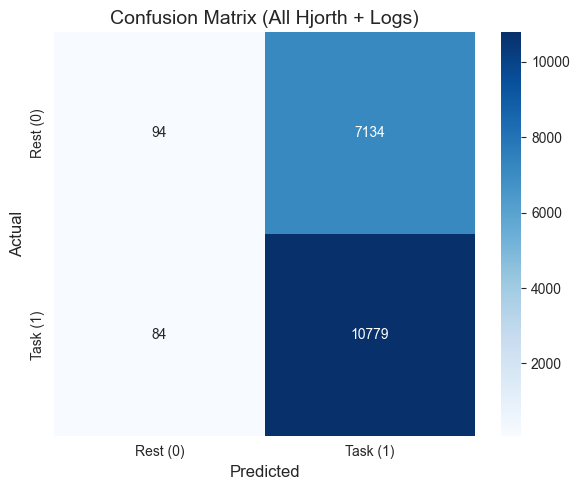

In [85]:
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Rest (0)', 'Task (1)'],
            yticklabels=['Rest (0)', 'Task (1)'])
ax.set_title('Confusion Matrix (All Hjorth + Logs)', fontsize=14)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('Actual', fontsize=12)
plt.tight_layout()
plt.show()

## # PER-SUBJECT ACCURACY ON TEST SET


In [86]:
print("\n" + "="*60)
print("PER-SUBJECT ACCURACY ON TEST SET (All Hjorth + Logs)")
print("="*60)

for subj in test_subjects:
    subj_mask = subjects_all == subj
    subj_test_mask = test_mask & subj_mask

    if np.sum(subj_test_mask) > 0:
        X_subj = X_all[subj_test_mask]
        y_subj = y_all[subj_test_mask]

        y_subj_pred = model.predict(X_subj)
        subj_acc = np.mean(y_subj_pred == y_subj)

        print(f"{subj}: {subj_acc:.3f} (n={len(y_subj)})")


PER-SUBJECT ACCURACY ON TEST SET (All Hjorth + Logs)
sub-22: 0.638 (n=6031)
sub-23: 0.602 (n=6045)
sub-25: 0.677 (n=6015)


In [87]:
top5_features = importance_df.head(5)['feature'].values
top5_idx = [feature_names.index(f) for f in top5_features]

X_train_top5 = X_train[:, top5_idx]
X_test_top5 = X_test[:, top5_idx]

model_top5 = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    # scale_pos_weight=scale_pos_weight,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model_top5.fit(X_train_top5, y_train)
y_pred_top5 = model_top5.predict(X_test_top5)

print("\n" + "="*60)
print("TOP 5 FEATURES MODEL (All Hjorth + Logs)")
print("="*60)
print(classification_report(y_test, y_pred_top5, target_names=['Rest (0)', 'Task (1)']))
print(f"ROC-AUC Score: {roc_auc_score(y_test, model_top5.predict_proba(X_test_top5)[:, 1]):.4f}")

# ============================================
# HJORTH FEATURE IMPORTANCE SUMMARY
# ============================================
hjorth_features = ['hjorth_activity', 'hjorth_mobility', 'hjorth_complexity',
                   'hjorth_log_activity', 'hjorth_log_mobility', 'hjorth_log_complexity']
hjorth_importance = importance_df[importance_df['feature'].isin(hjorth_features)]

print("\n" + "="*60)
print("HJORTH FEATURE IMPORTANCES")
print("="*60)
for idx, row in hjorth_importance.iterrows():
    print(f"{row['feature']:25s}: {row['importance']:.4f}")


TOP 5 FEATURES MODEL (All Hjorth + Logs)
              precision    recall  f1-score   support

    Rest (0)       0.61      0.23      0.33      7228
    Task (1)       0.64      0.90      0.75     10863

    accuracy                           0.63     18091
   macro avg       0.62      0.57      0.54     18091
weighted avg       0.63      0.63      0.58     18091

ROC-AUC Score: 0.6167

HJORTH FEATURE IMPORTANCES
hjorth_activity          : 0.2067
hjorth_log_activity      : 0.2056
hjorth_complexity        : 0.0796
hjorth_mobility          : 0.0738
hjorth_log_mobility      : 0.0631
hjorth_log_complexity    : 0.0528


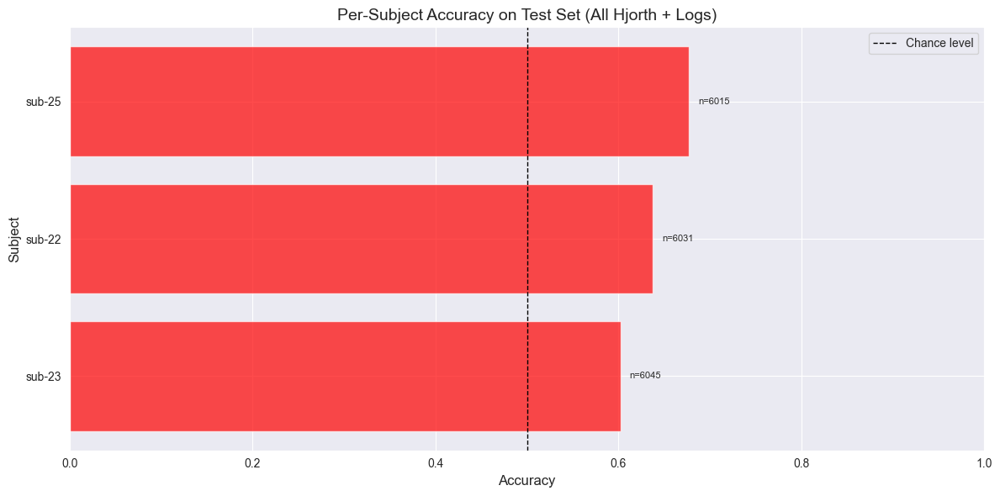

In [88]:
fig, ax = plt.subplots(figsize=(12, 6))

test_subject_list = []
test_accuracy_list = []
test_n_windows = []

for subj in test_subjects:
    subj_mask = subjects_all == subj
    subj_test_mask = test_mask & subj_mask

    if np.sum(subj_test_mask) > 0:
        X_subj = X_all[subj_test_mask]
        y_subj = y_all[subj_test_mask]

        y_subj_pred = model.predict(X_subj)
        subj_acc = np.mean(y_subj_pred == y_subj)

        test_subject_list.append(subj)
        test_accuracy_list.append(subj_acc)
        test_n_windows.append(np.sum(subj_test_mask))

# Sort by accuracy
sorted_idx = np.argsort(test_accuracy_list)
test_subject_list = [test_subject_list[i] for i in sorted_idx]
test_accuracy_list = [test_accuracy_list[i] for i in sorted_idx]
test_n_windows = [test_n_windows[i] for i in sorted_idx]

colors = ['green' if acc >= 0.7 else 'red' for acc in test_accuracy_list]
bars = ax.barh(test_subject_list, test_accuracy_list, color=colors, alpha=0.7)
ax.axvline(x=0.5, color='black', linestyle='--', linewidth=1, label='Chance level')
ax.set_xlabel('Accuracy', fontsize=12)
ax.set_ylabel('Subject', fontsize=12)
ax.set_title('Per-Subject Accuracy on Test Set (All Hjorth + Logs)', fontsize=14)
ax.set_xlim(0, 1)

# Add sample size annotations
for i, (bar, n) in enumerate(zip(bars, test_n_windows)):
    ax.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
            f'n={n}', va='center', fontsize=8)

ax.legend()
plt.tight_layout()
plt.show()

In [89]:
from scipy.stats import binomtest

print("\n" + "="*60)
print("STATISTICAL SIGNIFICANCE (Binomial Test)")
print("="*60)
overall_acc = np.mean(y_pred == y_test)
n_test = len(y_test)
p_value = binomtest(int(overall_acc * n_test), n_test, 0.5).pvalue
print(f"Overall accuracy: {overall_acc:.3f}")
print(f"P(accuracy > chance): p={p_value:.6f}")


STATISTICAL SIGNIFICANCE (Binomial Test)
Overall accuracy: 0.639
P(accuracy > chance): p=0.000000


# apply to independent tasks

Creating complete dataset with all conditions...


/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/3338209780.py:90: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])



Total windows: 60289
Rest windows: 24075
Task windows: 36214
Unique subjects: 10

Windows per task:
  mathematic: 12077 windows
  memory: 12074 windows
  music: 12063 windows

CLASSIFYING: MEMORY vs REST

Selected data:
  memory windows: 12074
  Rest windows: 24075
  Total windows: 36149
  Unique subjects: ['sub-13' 'sub-14' 'sub-15' 'sub-22' 'sub-23' 'sub-24' 'sub-25' 'sub-40'
 'sub-47' 'sub-49']

Subject split:
  Train subjects (7): ['sub-47' 'sub-14' 'sub-24' 'sub-13' 'sub-40' 'sub-15' 'sub-49']
  Test subjects (3): ['sub-22' 'sub-23' 'sub-25']

Train set: 25300 windows
  - Rest: 16847, memory: 8453
Test set: 10849 windows
  - Rest: 7228, memory: 3621

Classification Report for memory vs Rest:
              precision    recall  f1-score   support

        Rest       0.74      0.58      0.65      7228
      memory       0.41      0.59      0.49      3621

    accuracy                           0.58     10849
   macro avg       0.58      0.58      0.57     10849
weighted avg       0.

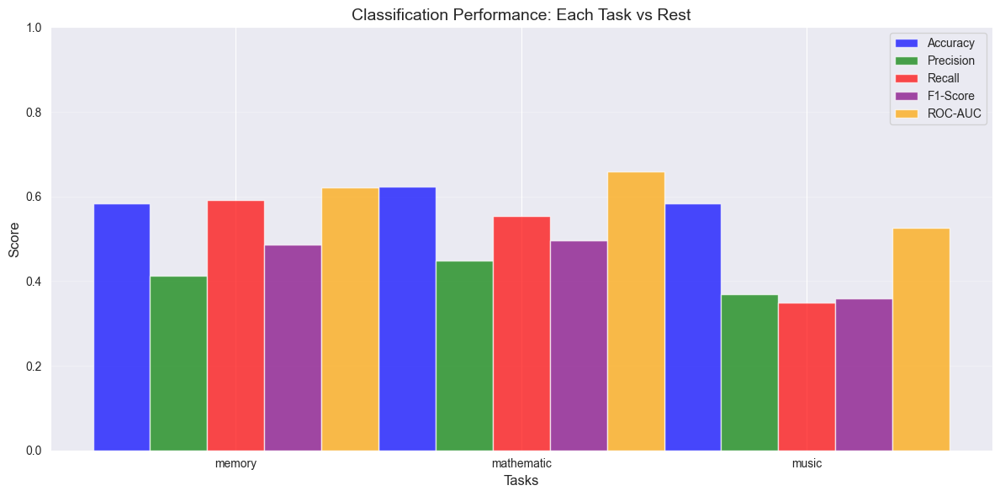

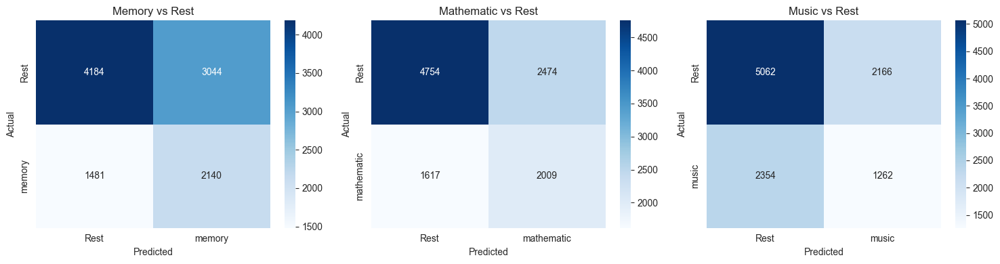

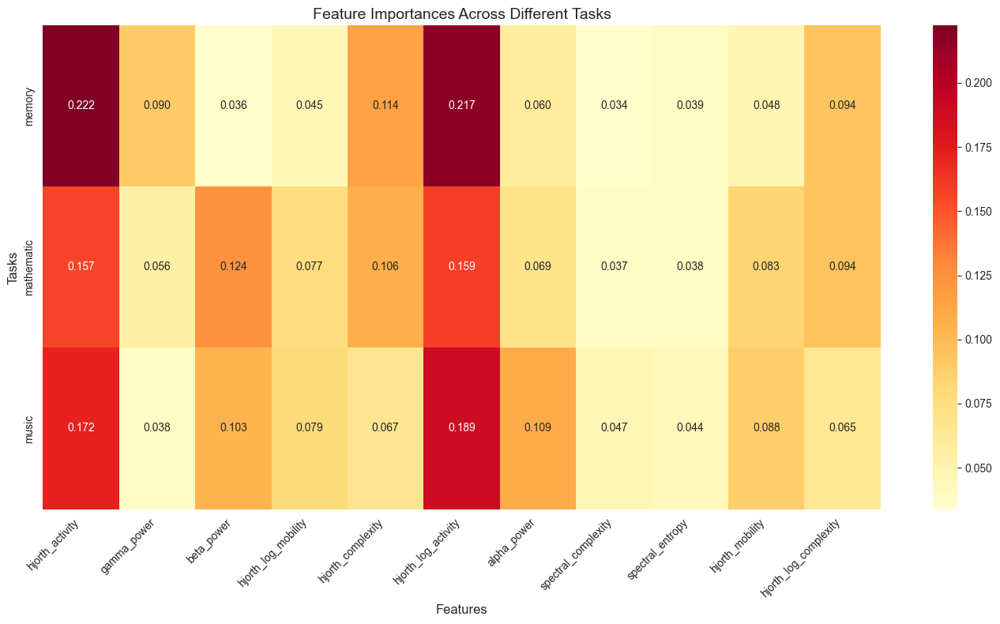

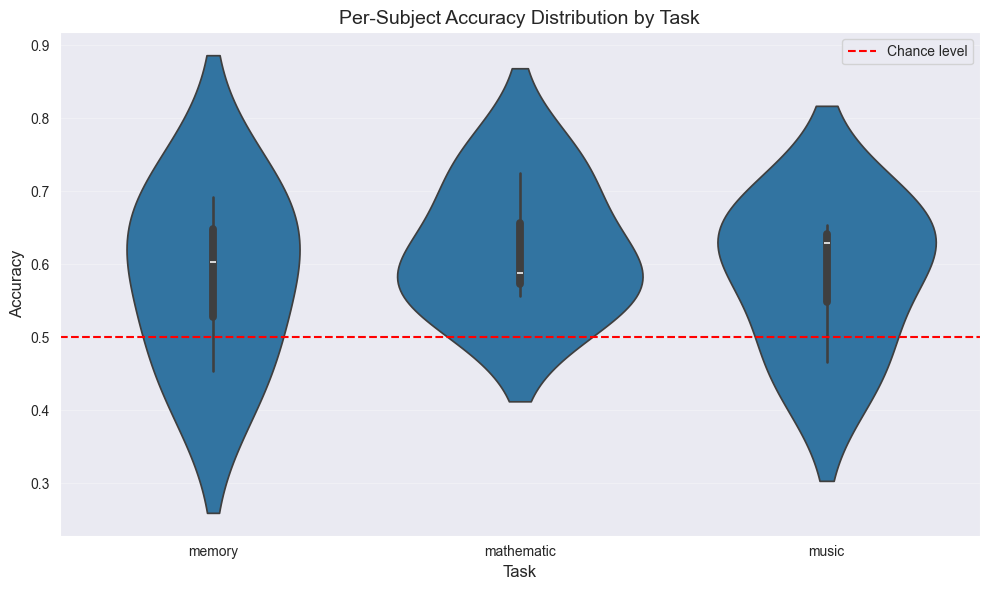

In [90]:
import numpy as np
from scipy.stats import entropy
from scipy.signal import welch, find_peaks
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ============================================
# PARAMETERS
# ============================================
WINDOW_SEC = 0.25
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)
OVERLAP = 0  # No overlap

# Define frequency bands (original bands only, no alpha sub-bands)
bands = {
    "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

# ============================================
# FEATURE EXTRACTION FUNCTIONS (All Hjorth parameters)
# ============================================
def hjorth_activity(x):
    """Hjorth activity = variance of signal"""
    return np.var(x)

def hjorth_mobility(x):
    """Hjorth mobility = sqrt(var(diff(signal)) / var(signal))"""
    if len(x) < 2:
        return np.nan
    activity = np.var(x)
    if activity == 0:
        return np.nan
    diff1 = np.diff(x)
    mobility = np.sqrt(np.var(diff1) / activity)
    return mobility

def hjorth_complexity(x):
    """Hjorth complexity = mobility(diff(signal)) / mobility(signal)"""
    if len(x) < 3:
        return np.nan

    mobility_signal = hjorth_mobility(x)
    if np.isnan(mobility_signal) or mobility_signal == 0:
        return np.nan

    diff1 = np.diff(x)
    mobility_diff = hjorth_mobility(diff1)
    if np.isnan(mobility_diff):
        return np.nan

    complexity = mobility_diff / mobility_signal
    return complexity

def spectral_entropy(psd):
    """Spectral entropy"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    return entropy(p)

def spectral_complexity(psd):
    """Spectral complexity (KL divergence from uniform)"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    uniform = np.ones_like(p) / len(p)
    return entropy(p, uniform)

def band_power_features(x, fs, bands):
    """Extract band power features (normalized)"""
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))

    # Calculate raw band powers
    band_powers_raw = {}
    for band_name, (low, high) in bands.items():
        mask = (freqs >= low) & (freqs < high)
        if np.any(mask):
            band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])
        else:
            band_powers_raw[band_name] = 0

    # Normalize
    total_power = sum(band_powers_raw.values())
    if total_power > 0:
        band_powers_norm = {k: v / total_power for k, v in band_powers_raw.items()}
    else:
        band_powers_norm = {k: np.nan for k in band_powers_raw.keys()}

    return band_powers_norm, freqs, psd

def extract_features_from_window(x, fs, bands):
    """Extract all features from a single window (all Hjorth parameters)"""
    # Hjorth features (all parameters)
    activity = hjorth_activity(x)
    mobility = hjorth_mobility(x)
    complexity = hjorth_complexity(x)

    # Log versions of Hjorth features
    log_activity = np.log1p(activity) if activity > 0 else np.nan
    log_mobility = np.log1p(mobility) if not np.isnan(mobility) and mobility > 0 else np.nan
    log_complexity = np.log1p(complexity) if not np.isnan(complexity) and complexity > 0 else np.nan

    # Spectral features
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))
    entropy_val = spectral_entropy(psd)
    spectral_complexity_val = spectral_complexity(psd)

    # Band power features
    band_powers, _, _ = band_power_features(x, fs, bands)

    # Combine all features
    features = {
        # Hjorth features (raw)
        'hjorth_activity': activity,
        'hjorth_mobility': mobility,
        'hjorth_complexity': complexity,

        # Hjorth features (log)
        'hjorth_log_activity': log_activity,
        'hjorth_log_mobility': log_mobility,
        'hjorth_log_complexity': log_complexity,

        # Spectral features
        'spectral_entropy': entropy_val,
        'spectral_complexity': spectral_complexity_val,

        # Band powers (all bands)
        **{f'{band}_power': band_powers[band] for band in bands.keys()}
    }

    return features

# ============================================
# CREATE COMPLETE DATASET WITH ALL CONDITIONS
# ============================================
print("Creating complete dataset with all conditions...")

all_data = []  # Will store (features, label, subject, condition_type, condition_name)
feature_names = None

# Track all unique subjects
all_subjects = set()

# Process rest files (label = 0, condition_type = 'rest')
for subj in rest_stats.keys():
    all_subjects.add(subj)
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            condition_name = 'eyesclosed' if 'eyesclosed' in rest_file else 'eyesopen'
            x = load_signal(rest_file, CHANNEL)

            if is_bad_signal(x):
                continue

            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    if not any(np.isnan(list(features.values()))):
                        if feature_names is None:
                            feature_names = list(features.keys())
                        all_data.append((list(features.values()), 0, subj, 'rest', condition_name))

# Process task files (label = 1, condition_type = 'task')
for subj in rest_stats.keys():
    all_subjects.add(subj)
    if subj in task_files:
        for task_file in task_files[subj]:
            condition_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]
            x = load_signal(task_file, CHANNEL)

            if is_bad_signal(x):
                continue

            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    if not any(np.isnan(list(features.values()))):
                        if feature_names is None:
                            feature_names = list(features.keys())
                        all_data.append((list(features.values()), 1, subj, 'task', condition_name))

# Convert to structured format
X_all = np.array([d[0] for d in all_data])
y_all = np.array([d[1] for d in all_data])
subjects_all = np.array([d[2] for d in all_data])
condition_types = np.array([d[3] for d in all_data])
condition_names = np.array([d[4] for d in all_data])

print(f"\nTotal windows: {len(X_all)}")
print(f"Rest windows: {np.sum(y_all == 0)}")
print(f"Task windows: {np.sum(y_all == 1)}")
print(f"Unique subjects: {len(all_subjects)}")

# Show distribution per task
print("\nWindows per task:")
task_names = np.unique(condition_names[condition_types == 'task'])
for task in task_names:
    n_task = np.sum((condition_names == task) & (condition_types == 'task'))
    print(f"  {task}: {n_task} windows")

# ============================================
# FUNCTION FOR TASK-SPECIFIC CLASSIFICATION
# ============================================
def classify_task_vs_rest(task_name, X_all, y_all, subjects_all, condition_names, condition_types, feature_names):
    """Classify specific task vs rest with subject-wise split"""

    print(f"\n{'='*60}")
    print(f"CLASSIFYING: {task_name.upper()} vs REST")
    print('='*60)

    # Create binary labels: 1 for specific task, 0 for rest
    task_mask = (condition_names == task_name) & (condition_types == 'task')
    rest_mask = (condition_types == 'rest')

    selected_mask = task_mask | rest_mask

    X_selected = X_all[selected_mask]
    y_selected = np.where(condition_names[selected_mask] == task_name, 1, 0)
    subjects_selected = subjects_all[selected_mask]

    print(f"\nSelected data:")
    print(f"  {task_name} windows: {np.sum(y_selected == 1)}")
    print(f"  Rest windows: {np.sum(y_selected == 0)}")
    print(f"  Total windows: {len(y_selected)}")
    print(f"  Unique subjects: {np.unique(subjects_selected)}")

    # Subject-wise split
    unique_subjects = np.unique(subjects_selected)
    np.random.seed(42)
    train_subjects = np.random.choice(unique_subjects, size=int(0.7 * len(unique_subjects)), replace=False)
    test_subjects = np.array([s for s in unique_subjects if s not in train_subjects])

    print(f"\nSubject split:")
    print(f"  Train subjects ({len(train_subjects)}): {train_subjects}")
    print(f"  Test subjects ({len(test_subjects)}): {test_subjects}")

    train_mask = np.isin(subjects_selected, train_subjects)
    test_mask = np.isin(subjects_selected, test_subjects)

    X_train = X_selected[train_mask]
    y_train = y_selected[train_mask]
    X_test = X_selected[test_mask]
    y_test = y_selected[test_mask]

    print(f"\nTrain set: {len(X_train)} windows")
    print(f"  - Rest: {np.sum(y_train == 0)}, {task_name}: {np.sum(y_train == 1)}")
    print(f"Test set: {len(X_test)} windows")
    print(f"  - Rest: {np.sum(y_test == 0)}, {task_name}: {np.sum(y_test == 1)}")

    # Check if we have enough data
    if np.sum(y_train == 0) == 0 or np.sum(y_train == 1) == 0:
        print(f"WARNING: Not enough data for {task_name} classification!")
        return None

    # Calculate scale_pos_weight
    scale_pos_weight = np.sum(y_train == 0) / np.sum(y_train == 1)

    # Train model
    model = XGBClassifier(
        n_estimators=100,
        max_depth=3,
        learning_rate=0.03,
        subsample=0.8,
        colsample_bytree=0.8,
        scale_pos_weight=scale_pos_weight,
        eval_metric='logloss',
        n_jobs=-1,
        random_state=42
    )

    model.fit(X_train, y_train)

    # Evaluate
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    print(f"\nClassification Report for {task_name} vs Rest:")
    print(classification_report(y_test, y_pred, target_names=['Rest', task_name]))
    print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")

    # Feature importances
    importance_df = pd.DataFrame({
        'feature': feature_names,
        'importance': model.feature_importances_
    }).sort_values('importance', ascending=False)

    print(f"\nTop 10 Features for {task_name} vs Rest:")
    for idx, row in importance_df.head(10).iterrows():
        print(f"  {row['feature']:30s}: {row['importance']:.4f}")

    # Per-subject accuracy on test set
    print(f"\nPer-subject accuracy for {task_name}:")
    for subj in test_subjects:
        subj_mask = subjects_selected == subj
        subj_test_mask = test_mask & subj_mask

        if np.sum(subj_test_mask) > 0:
            X_subj = X_selected[subj_test_mask]
            y_subj = y_selected[subj_test_mask]
            y_subj_pred = model.predict(X_subj)
            subj_acc = np.mean(y_subj_pred == y_subj)
            print(f"  {subj}: {subj_acc:.3f} (n={len(y_subj)})")

    return {
        'task': task_name,
        'model': model,
        'X_test': X_test,
        'y_test': y_test,
        'y_pred': y_pred,
        'y_pred_proba': y_pred_proba,
        'importance_df': importance_df,
        'train_subjects': train_subjects,
        'test_subjects': test_subjects
    }

# ============================================
# RUN CLASSIFICATION FOR EACH TASK
# ============================================
task_names = ['memory', 'mathematic', 'music']
results = {}

for task in task_names:
    result = classify_task_vs_rest(task, X_all, y_all, subjects_all, condition_names, condition_types, feature_names)
    if result is not None:
        results[task] = result

# ============================================
# COMPARE TASK PERFORMANCE
# ============================================
print("\n" + "="*60)
print("SUMMARY: TASK CLASSIFICATION PERFORMANCE")
print("="*60)

comparison_data = []
for task, result in results.items():
    from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

    accuracy = accuracy_score(result['y_test'], result['y_pred'])
    precision = precision_score(result['y_test'], result['y_pred'], zero_division=0)
    recall = recall_score(result['y_test'], result['y_pred'], zero_division=0)
    f1 = f1_score(result['y_test'], result['y_pred'], zero_division=0)
    roc_auc = roc_auc_score(result['y_test'], result['y_pred_proba'])

    comparison_data.append({
        'Task': task,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'ROC-AUC': roc_auc
    })

comparison_df = pd.DataFrame(comparison_data)
print(comparison_df.to_string(index=False))

# ============================================
# PLOT COMPARISON OF TASK PERFORMANCE
# ============================================
fig, ax = plt.subplots(figsize=(12, 6))

x = np.arange(len(task_names))
width = 0.2

metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC']
colors = ['blue', 'green', 'red', 'purple', 'orange']

for i, (metric, color) in enumerate(zip(metrics, colors)):
    values = [comparison_df[metric].values[j] for j in range(len(task_names))]
    ax.bar(x + i*width, values, width, label=metric, color=color, alpha=0.7)

ax.set_xlabel('Tasks', fontsize=12)
ax.set_ylabel('Score', fontsize=12)
ax.set_title('Classification Performance: Each Task vs Rest', fontsize=14)
ax.set_xticks(x + width*2)
ax.set_xticklabels(task_names)
ax.legend()
ax.set_ylim(0, 1)
ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# ============================================
# CONFUSION MATRICES FOR EACH TASK
# ============================================
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for idx, (task, result) in enumerate(results.items()):
    cm = confusion_matrix(result['y_test'], result['y_pred'])
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[idx],
                xticklabels=['Rest', task],
                yticklabels=['Rest', task])
    axes[idx].set_title(f'{task.capitalize()} vs Rest')
    axes[idx].set_xlabel('Predicted')
    axes[idx].set_ylabel('Actual')

plt.tight_layout()
plt.show()

# ============================================
# FEATURE IMPORTANCE COMPARISON ACROSS TASKS
# ============================================
fig, ax = plt.subplots(figsize=(14, 8))

# Get top features across all tasks
all_top_features = set()
for result in results.values():
    all_top_features.update(result['importance_df'].head(10)['feature'].values)
all_top_features = list(all_top_features)

# Create comparison dataframe
feature_importance_matrix = []
for task, result in results.items():
    importance_dict = dict(zip(result['importance_df']['feature'], result['importance_df']['importance']))
    row = [importance_dict.get(f, 0) for f in all_top_features]
    feature_importance_matrix.append(row)

importance_comparison_df = pd.DataFrame(feature_importance_matrix,
                                        index=results.keys(),
                                        columns=all_top_features)

# Plot heatmap
sns.heatmap(importance_comparison_df, annot=True, fmt='.3f', cmap='YlOrRd', ax=ax)
ax.set_title('Feature Importances Across Different Tasks', fontsize=14)
ax.set_xlabel('Features', fontsize=12)
ax.set_ylabel('Tasks', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# ============================================
# PER-TASK SUBJECT ACCURACY VIOLIN PLOT
# ============================================
fig, ax = plt.subplots(figsize=(10, 6))

all_accuracies = []
task_labels = []

for task, result in results.items():
    subject_accuracies = []
    for subj in result['test_subjects']:
        subj_mask = (subjects_all == subj) & ((condition_names == task) | (condition_types == 'rest'))
        if np.sum(subj_mask) > 0:
            X_subj = X_all[subj_mask]
            y_subj = np.where(condition_names[subj_mask] == task, 1, 0)
            y_subj_pred = result['model'].predict(X_subj)
            subj_acc = np.mean(y_subj_pred == y_subj)
            subject_accuracies.append(subj_acc)

    all_accuracies.extend(subject_accuracies)
    task_labels.extend([task] * len(subject_accuracies))

# Create DataFrame for seaborn
plot_df = pd.DataFrame({'Task': task_labels, 'Accuracy': all_accuracies})

sns.violinplot(data=plot_df, x='Task', y='Accuracy', ax=ax)
ax.axhline(y=0.5, color='red', linestyle='--', label='Chance level')
ax.set_ylabel('Accuracy', fontsize=12)
ax.set_xlabel('Task', fontsize=12)
ax.set_title('Per-Subject Accuracy Distribution by Task', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

Creating dataset with 5 classes: eyesclosed, eyesopen, memory, mathematic, music...


/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/2257244222.py:91: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])



Total windows: 60289
Features: 13
Unique subjects: ['sub-13' 'sub-14' 'sub-15' 'sub-22' 'sub-23' 'sub-24' 'sub-25' 'sub-40'
 'sub-47' 'sub-49']

Windows per class:
  eyesclosed: 12064 windows
  eyesopen: 12011 windows
  memory: 12074 windows
  mathematic: 12077 windows
  music: 12063 windows

Subject split:
Train subjects (7): ['sub-47' 'sub-14' 'sub-24' 'sub-13' 'sub-40' 'sub-15' 'sub-49']
Test subjects (3): ['sub-22' 'sub-23' 'sub-25']

Train set: 42198 windows from 7 subjects
  eyesclosed: 8448 windows
  eyesopen: 8399 windows
  memory: 8453 windows
  mathematic: 8451 windows
  music: 8447 windows

Test set: 18091 windows from 3 subjects
  eyesclosed: 3616 windows
  eyesopen: 3612 windows
  memory: 3621 windows
  mathematic: 3626 windows
  music: 3616 windows

5-CLASS CLASSIFICATION RESULTS (Subject-wise Split)
Overall Accuracy: 0.2584
Number of classes: 5
Train subjects: 7
Test subjects: 3

CLASSIFICATION REPORT
              precision    recall  f1-score   support

  eyesclosed  

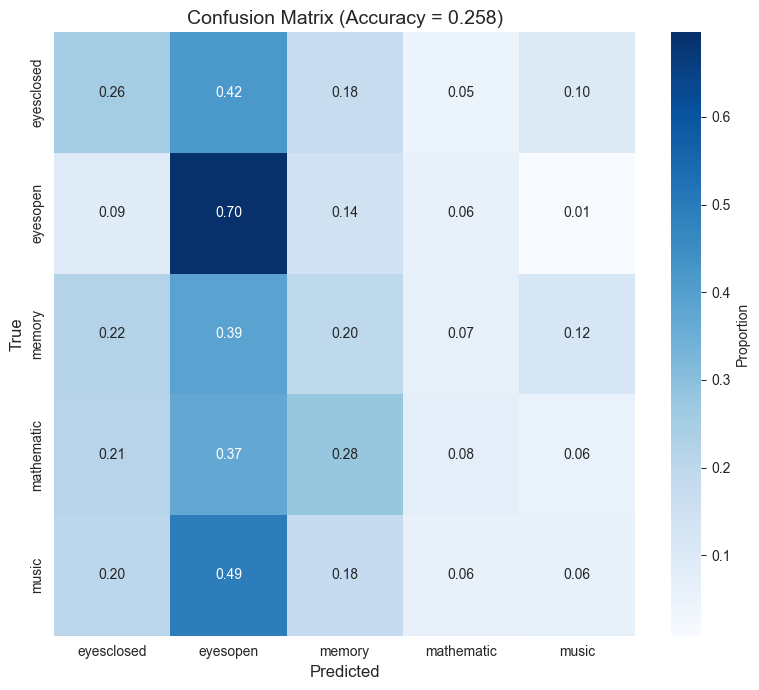


PER-CLASS METRICS
eyesclosed  : Precision=0.260, Recall=0.256, F1=0.258, Support=3616
eyesopen    : Precision=0.294, Recall=0.697, F1=0.413, Support=3612
memory      : Precision=0.203, Recall=0.199, F1=0.201, Support=3621
mathematic  : Precision=0.249, Recall=0.079, F1=0.120, Support=3626
music       : Precision=0.177, Recall=0.063, F1=0.093, Support=3616

ROC-AUC SCORES (One-vs-Rest)
eyesclosed  : 0.5929
eyesopen    : 0.6925
memory      : 0.5463
mathematic  : 0.6161
music       : 0.4856

TOP 15 FEATURE IMPORTANCES
hjorth_log_activity                : 0.2245
hjorth_activity                    : 0.1611
gamma_power                        : 0.1267
hjorth_log_complexity              : 0.1037
hjorth_complexity                  : 0.0966
alpha_power                        : 0.0837
hjorth_mobility                    : 0.0556
hjorth_log_mobility                : 0.0539
beta_power                         : 0.0366
spectral_complexity                : 0.0313
spectral_entropy                   : 0

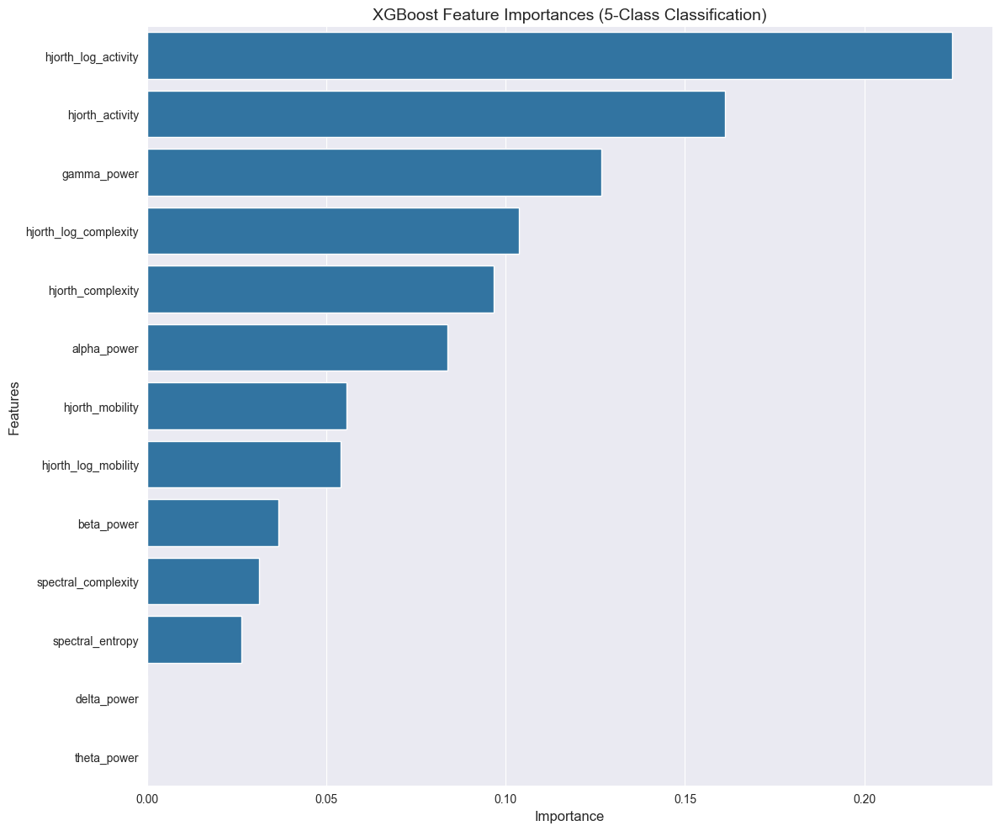


PER-SUBJECT ACCURACY ON TEST SET
sub-22: 0.247 (n=6031)
sub-23: 0.270 (n=6045)
sub-25: 0.258 (n=6015)

Mean subject accuracy: 0.258 ± 0.009


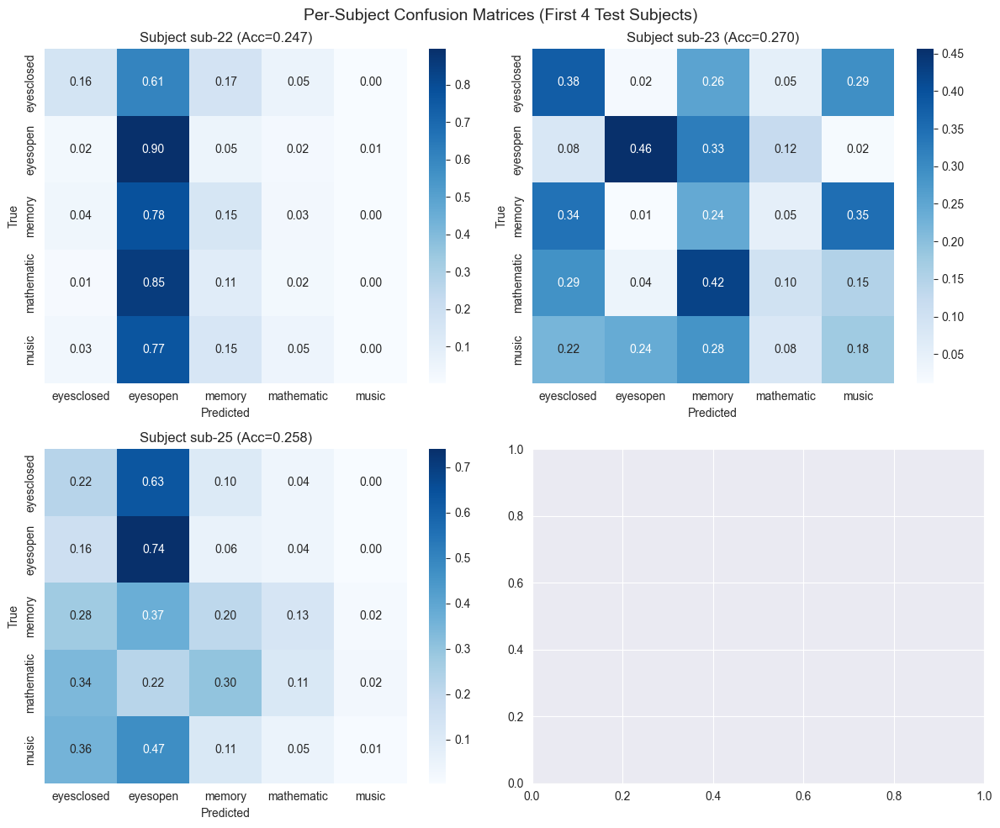

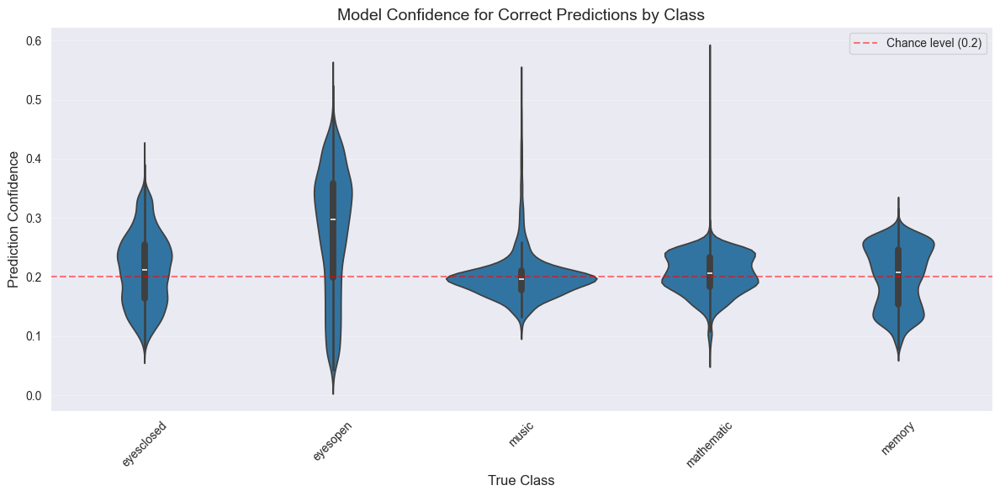

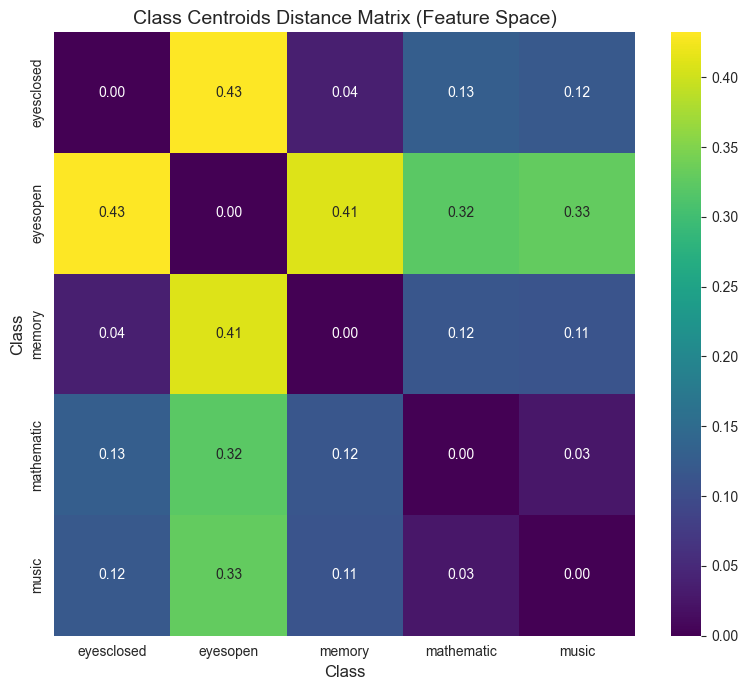


STATISTICAL SIGNIFICANCE (Per-class vs Chance = 0.2)
eyesclosed  : Acc=0.256, n=3616, p=0.000000 ***
eyesopen    : Acc=0.697, n=3612, p=0.000000 ***
memory      : Acc=0.199, n=3621, p=0.917275 ns
mathematic  : Acc=0.079, n=3626, p=0.000000 ***
music       : Acc=0.063, n=3616, p=0.000000 ***


In [91]:
import numpy as np
from scipy.stats import entropy
from scipy.signal import welch, find_peaks
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score
from sklearn.preprocessing import label_binarize
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ============================================
# PARAMETERS
# ============================================
WINDOW_SEC = 0.25
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)
OVERLAP = 0  # No overlap

# Define frequency bands (original bands only, no alpha sub-bands)
bands = {
    "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

# ============================================
# FEATURE EXTRACTION FUNCTIONS (All Hjorth parameters)
# ============================================
def hjorth_activity(x):
    """Hjorth activity = variance of signal"""
    return np.var(x)

def hjorth_mobility(x):
    """Hjorth mobility = sqrt(var(diff(signal)) / var(signal))"""
    if len(x) < 2:
        return np.nan
    activity = np.var(x)
    if activity == 0:
        return np.nan
    diff1 = np.diff(x)
    mobility = np.sqrt(np.var(diff1) / activity)
    return mobility

def hjorth_complexity(x):
    """Hjorth complexity = mobility(diff(signal)) / mobility(signal)"""
    if len(x) < 3:
        return np.nan

    mobility_signal = hjorth_mobility(x)
    if np.isnan(mobility_signal) or mobility_signal == 0:
        return np.nan

    diff1 = np.diff(x)
    mobility_diff = hjorth_mobility(diff1)
    if np.isnan(mobility_diff):
        return np.nan

    complexity = mobility_diff / mobility_signal
    return complexity

def spectral_entropy(psd):
    """Spectral entropy"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    return entropy(p)

def spectral_complexity(psd):
    """Spectral complexity (KL divergence from uniform)"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    uniform = np.ones_like(p) / len(p)
    return entropy(p, uniform)

def band_power_features(x, fs, bands):
    """Extract band power features (normalized)"""
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))

    # Calculate raw band powers
    band_powers_raw = {}
    for band_name, (low, high) in bands.items():
        mask = (freqs >= low) & (freqs < high)
        if np.any(mask):
            band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])
        else:
            band_powers_raw[band_name] = 0

    # Normalize
    total_power = sum(band_powers_raw.values())
    if total_power > 0:
        band_powers_norm = {k: v / total_power for k, v in band_powers_raw.items()}
    else:
        band_powers_norm = {k: np.nan for k in band_powers_raw.keys()}

    return band_powers_norm, freqs, psd

def extract_features_from_window(x, fs, bands):
    """Extract all features from a single window (all Hjorth parameters)"""
    # Hjorth features (all parameters)
    activity = hjorth_activity(x)
    mobility = hjorth_mobility(x)
    complexity = hjorth_complexity(x)

    # Log versions of Hjorth features
    log_activity = np.log1p(activity) if activity > 0 else np.nan
    log_mobility = np.log1p(mobility) if not np.isnan(mobility) and mobility > 0 else np.nan
    log_complexity = np.log1p(complexity) if not np.isnan(complexity) and complexity > 0 else np.nan

    # Spectral features
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))
    entropy_val = spectral_entropy(psd)
    spectral_complexity_val = spectral_complexity(psd)

    # Band power features
    band_powers, _, _ = band_power_features(x, fs, bands)

    # Combine all features
    features = {
        # Hjorth features (raw)
        'hjorth_activity': activity,
        'hjorth_mobility': mobility,
        'hjorth_complexity': complexity,

        # Hjorth features (log)
        'hjorth_log_activity': log_activity,
        'hjorth_log_mobility': log_mobility,
        'hjorth_log_complexity': log_complexity,

        # Spectral features
        'spectral_entropy': entropy_val,
        'spectral_complexity': spectral_complexity_val,

        # Band powers (all bands)
        **{f'{band}_power': band_powers[band] for band in bands.keys()}
    }

    return features

# ============================================
# CREATE DATASET WITH 5 CLASSES
# ============================================
print("Creating dataset with 5 classes: eyesclosed, eyesopen, memory, mathematic, music...")

all_data = []  # Will store (features, label, subject, class_name)
feature_names = None

# Class mapping
class_to_label = {
    'eyesclosed': 0,
    'eyesopen': 1,
    'memory': 2,
    'mathematic': 3,
    'music': 4
}
label_to_class = {v: k for k, v in class_to_label.items()}

# Process rest files (eyesclosed and eyesopen)
for subj in rest_stats.keys():
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            if 'eyesclosed' in rest_file:
                class_name = 'eyesclosed'
            elif 'eyesopen' in rest_file:
                class_name = 'eyesopen'
            else:
                continue

            x = load_signal(rest_file, CHANNEL)

            if is_bad_signal(x):
                continue

            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    if not any(np.isnan(list(features.values()))):
                        if feature_names is None:
                            feature_names = list(features.keys())
                        all_data.append((list(features.values()), class_to_label[class_name], subj, class_name))

# Process task files (memory, mathematic, music)
for subj in rest_stats.keys():
    if subj in task_files:
        for task_file in task_files[subj]:
            class_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]

            # Only include the 3 tasks we want
            if class_name not in ['memory', 'mathematic', 'music']:
                continue

            x = load_signal(task_file, CHANNEL)

            if is_bad_signal(x):
                continue

            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    if not any(np.isnan(list(features.values()))):
                        if feature_names is None:
                            feature_names = list(features.keys())
                        all_data.append((list(features.values()), class_to_label[class_name], subj, class_name))

# Convert to structured format
X_all = np.array([d[0] for d in all_data])
y_all = np.array([d[1] for d in all_data])
subjects_all = np.array([d[2] for d in all_data])
class_names_all = np.array([d[3] for d in all_data])

print(f"\nTotal windows: {len(X_all)}")
print(f"Features: {X_all.shape[1]}")
print(f"Unique subjects: {np.unique(subjects_all)}")
print("\nWindows per class:")
for class_name, label in class_to_label.items():
    count = np.sum(y_all == label)
    print(f"  {class_name}: {count} windows")

# ============================================
# SUBJECT-WISE TRAIN-TEST SPLIT
# ============================================
unique_subjects = np.unique(subjects_all)
n_subjects = len(unique_subjects)

# Split subjects (70% train, 30% test)
np.random.seed(42)
train_subjects = np.random.choice(unique_subjects, size=int(0.7 * n_subjects), replace=False)
test_subjects = np.array([s for s in unique_subjects if s not in train_subjects])

print(f"\nSubject split:")
print(f"Train subjects ({len(train_subjects)}): {train_subjects}")
print(f"Test subjects ({len(test_subjects)}): {test_subjects}")

# Create train/test masks
train_mask = np.isin(subjects_all, train_subjects)
test_mask = np.isin(subjects_all, test_subjects)

X_train = X_all[train_mask]
y_train = y_all[train_mask]
X_test = X_all[test_mask]
y_test = y_all[test_mask]

print(f"\nTrain set: {len(X_train)} windows from {len(train_subjects)} subjects")
for class_name, label in class_to_label.items():
    count = np.sum(y_train == label)
    print(f"  {class_name}: {count} windows")

print(f"\nTest set: {len(X_test)} windows from {len(test_subjects)} subjects")
for class_name, label in class_to_label.items():
    count = np.sum(y_test == label)
    print(f"  {class_name}: {count} windows")

# ============================================
# TRAIN XGBOOST CLASSIFIER (Multi-class)
# ============================================
model = XGBClassifier(
    n_estimators=100,
    max_depth=4,  # Slightly deeper for multi-class
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='mlogloss',  # Multi-class log loss
    n_jobs=-1,
    random_state=42
)

model.fit(X_train, y_train)

# ============================================
# EVALUATION
# ============================================
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)

# Overall accuracy
accuracy = accuracy_score(y_test, y_pred)
print("\n" + "="*60)
print("5-CLASS CLASSIFICATION RESULTS (Subject-wise Split)")
print("="*60)
print(f"Overall Accuracy: {accuracy:.4f}")
print(f"Number of classes: 5")
print(f"Train subjects: {len(train_subjects)}")
print(f"Test subjects: {len(test_subjects)}")

# Classification report
print("\n" + "="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_test, y_pred, target_names=list(class_to_label.keys())))

# ============================================
# CONFUSION MATRIX
# ============================================
fig, ax = plt.subplots(figsize=(8, 7))
cm = confusion_matrix(y_test, y_pred)
# Normalize by row (true class)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=list(class_to_label.keys()),
            yticklabels=list(class_to_label.keys()),
            ax=ax, cbar_kws={'label': 'Proportion'})
ax.set_title(f'Confusion Matrix (Accuracy = {accuracy:.3f})', fontsize=14)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('True', fontsize=12)
plt.tight_layout()
plt.show()

# ============================================
# PER-CLASS METRICS
# ============================================
from sklearn.metrics import precision_recall_fscore_support

precision, recall, f1, support = precision_recall_fscore_support(y_test, y_pred)

print("\n" + "="*60)
print("PER-CLASS METRICS")
print("="*60)
for i, class_name in enumerate(class_to_label.keys()):
    print(f"{class_name:12s}: Precision={precision[i]:.3f}, Recall={recall[i]:.3f}, F1={f1[i]:.3f}, Support={support[i]}")

# ============================================
# ROC-AUC FOR MULTI-CLASS (One-vs-Rest)
# ============================================
y_test_bin = label_binarize(y_test, classes=list(range(len(class_to_label))))
roc_auc = {}
for i in range(len(class_to_label)):
    roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_pred_proba[:, i])

print("\n" + "="*60)
print("ROC-AUC SCORES (One-vs-Rest)")
print("="*60)
for i, class_name in enumerate(class_to_label.keys()):
    print(f"{class_name:12s}: {roc_auc[i]:.4f}")

# ============================================
# FEATURE IMPORTANCES
# ============================================
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

print("\n" + "="*60)
print("TOP 15 FEATURE IMPORTANCES")
print("="*60)
for idx, row in importance_df.head(15).iterrows():
    print(f"{row['feature']:35s}: {row['importance']:.4f}")

# Plot feature importances
fig, ax = plt.subplots(figsize=(12, 10))
sns.barplot(data=importance_df.head(20), y='feature', x='importance', ax=ax)
ax.set_title('XGBoost Feature Importances (5-Class Classification)', fontsize=14)
ax.set_xlabel('Importance', fontsize=12)
ax.set_ylabel('Features', fontsize=12)
plt.tight_layout()
plt.show()

# ============================================
# PER-SUBJECT ACCURACY
# ============================================
print("\n" + "="*60)
print("PER-SUBJECT ACCURACY ON TEST SET")
print("="*60)

subject_accuracies = []
for subj in test_subjects:
    subj_mask = subjects_all == subj
    subj_test_mask = test_mask & subj_mask

    if np.sum(subj_test_mask) > 0:
        X_subj = X_all[subj_test_mask]
        y_subj = y_all[subj_test_mask]

        y_subj_pred = model.predict(X_subj)
        subj_acc = np.mean(y_subj_pred == y_subj)
        subject_accuracies.append(subj_acc)

        print(f"{subj}: {subj_acc:.3f} (n={len(y_subj)})")

print(f"\nMean subject accuracy: {np.mean(subject_accuracies):.3f} ± {np.std(subject_accuracies):.3f}")

# ============================================
# CONFUSION MATRIX PER SUBJECT (Heatmap of errors)
# ============================================
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for idx, subj in enumerate(test_subjects[:4]):  # Show first 4 test subjects
    subj_mask = subjects_all == subj
    subj_test_mask = test_mask & subj_mask

    if np.sum(subj_test_mask) > 0:
        X_subj = X_all[subj_test_mask]
        y_subj = y_all[subj_test_mask]
        y_subj_pred = model.predict(X_subj)

        cm_subj = confusion_matrix(y_subj, y_subj_pred)
        cm_subj_norm = cm_subj.astype('float') / cm_subj.sum(axis=1)[:, np.newaxis]

        sns.heatmap(cm_subj_norm, annot=True, fmt='.2f', cmap='Blues', ax=axes[idx],
                    xticklabels=list(class_to_label.keys()),
                    yticklabels=list(class_to_label.keys()))
        axes[idx].set_title(f'Subject {subj} (Acc={np.mean(y_subj_pred == y_subj):.3f})')
        axes[idx].set_xlabel('Predicted')
        axes[idx].set_ylabel('True')

plt.suptitle('Per-Subject Confusion Matrices (First 4 Test Subjects)', fontsize=14)
plt.tight_layout()
plt.show()

# ============================================
# VIOLIN PLOT OF PER-CLASS CONFIDENCE SCORES
# ============================================
fig, ax = plt.subplots(figsize=(12, 6))

# Get predicted probabilities for true classes
confidence_scores = []
true_classes = []

for i in range(len(y_test)):
    confidence_scores.append(y_pred_proba[i, y_test[i]])
    true_classes.append(label_to_class[y_test[i]])

# Create DataFrame for plotting
confidence_df = pd.DataFrame({'Class': true_classes, 'Confidence': confidence_scores})

sns.violinplot(data=confidence_df, x='Class', y='Confidence', ax=ax)
ax.axhline(y=0.2, color='red', linestyle='--', alpha=0.5, label='Chance level (0.2)')
ax.set_ylabel('Prediction Confidence', fontsize=12)
ax.set_xlabel('True Class', fontsize=12)
ax.set_title('Model Confidence for Correct Predictions by Class', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3, axis='y')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# ============================================
# PAIRWISE CLASS SEPARABILITY
# ============================================
from sklearn.metrics.pairwise import euclidean_distances

# Get class centroids in feature space
class_centroids = {}
for class_name, label in class_to_label.items():
    X_class = X_train[y_train == label]
    class_centroids[class_name] = np.mean(X_class, axis=0)

# Compute pairwise distances between centroids
class_names = list(class_to_label.keys())
n_classes = len(class_names)
distance_matrix = np.zeros((n_classes, n_classes))

for i in range(n_classes):
    for j in range(n_classes):
        distance_matrix[i, j] = euclidean_distances([class_centroids[class_names[i]]],
                                                     [class_centroids[class_names[j]]])[0, 0]

# Plot distance matrix
fig, ax = plt.subplots(figsize=(8, 7))
sns.heatmap(distance_matrix, annot=True, fmt='.2f', cmap='viridis',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_title('Class Centroids Distance Matrix (Feature Space)', fontsize=14)
ax.set_xlabel('Class', fontsize=12)
ax.set_ylabel('Class', fontsize=12)
plt.tight_layout()
plt.show()

# ============================================
# STATISTICAL TEST: PER-CLASS ACCURACY VS CHANCE
# ============================================
from scipy.stats import binomtest

print("\n" + "="*60)
print("STATISTICAL SIGNIFICANCE (Per-class vs Chance = 0.2)")
print("="*60)

for class_name, label in class_to_label.items():
    class_mask = y_test == label
    if np.sum(class_mask) > 0:
        class_acc = np.mean(y_pred[class_mask] == y_test[class_mask])
        n_class = np.sum(class_mask)
        p_value = binomtest(int(class_acc * n_class), n_class, 0.2).pvalue
        print(f"{class_name:12s}: Acc={class_acc:.3f}, n={n_class}, p={p_value:.6f} {'***' if p_value < 0.001 else '**' if p_value < 0.01 else '*' if p_value < 0.05 else 'ns'}")

# template

# avg task vs avg rest - without 0.5-4 Hz features

In [95]:
import numpy as np
from scipy.stats import entropy
from scipy.signal import welch, find_peaks
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ============================================
# PARAMETERS
# ============================================
WINDOW_SEC = 0.25
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)
OVERLAP = 0  # No overlap

# Define frequency bands (original bands only, no alpha sub-bands)
bands = {
    # "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

# ============================================
# FEATURE EXTRACTION FUNCTIONS (All Hjorth parameters)
# ============================================
def hjorth_activity(x):
    """Hjorth activity = variance of signal"""
    return np.var(x)

def hjorth_mobility(x):
    """Hjorth mobility = sqrt(var(diff(signal)) / var(signal))"""
    if len(x) < 2:
        return np.nan
    activity = np.var(x)
    if activity == 0:
        return np.nan
    diff1 = np.diff(x)
    mobility = np.sqrt(np.var(diff1) / activity)
    return mobility

def hjorth_complexity(x):
    """Hjorth complexity = mobility(diff(signal)) / mobility(signal)"""
    if len(x) < 3:
        return np.nan

    mobility_signal = hjorth_mobility(x)
    if np.isnan(mobility_signal) or mobility_signal == 0:
        return np.nan

    diff1 = np.diff(x)
    mobility_diff = hjorth_mobility(diff1)
    if np.isnan(mobility_diff):
        return np.nan

    complexity = mobility_diff / mobility_signal
    return complexity

def spectral_entropy(psd):
    """Spectral entropy"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    return entropy(p)

def spectral_complexity(psd):
    """Spectral complexity (KL divergence from uniform)"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    uniform = np.ones_like(p) / len(p)
    return entropy(p, uniform)

def band_power_features(x, fs, bands):
    """Extract band power features (normalized)"""
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))

    # Calculate raw band powers
    band_powers_raw = {}
    for band_name, (low, high) in bands.items():
        mask = (freqs >= low) & (freqs < high)
        if np.any(mask):
            band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])
        else:
            band_powers_raw[band_name] = 0

    # Normalize
    total_power = sum(band_powers_raw.values())
    if total_power > 0:
        band_powers_norm = {k: v / total_power for k, v in band_powers_raw.items()}
    else:
        band_powers_norm = {k: np.nan for k in band_powers_raw.keys()}

    return band_powers_norm, freqs, psd

def extract_features_from_window(x, fs, bands):
    """Extract all features from a single window (all Hjorth parameters)"""
    # Hjorth features (all parameters)
    activity = hjorth_activity(x)
    mobility = hjorth_mobility(x)
    complexity = hjorth_complexity(x)

    # Log versions of Hjorth features
    log_activity = np.log1p(activity) if activity > 0 else np.nan
    log_mobility = np.log1p(mobility) if not np.isnan(mobility) and mobility > 0 else np.nan
    log_complexity = np.log1p(complexity) if not np.isnan(complexity) and complexity > 0 else np.nan

    # Spectral features
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))
    entropy_val = spectral_entropy(psd)
    spectral_complexity_val = spectral_complexity(psd)

    # Band power features
    band_powers, _, _ = band_power_features(x, fs, bands)

    # Combine all features
    features = {
        # Hjorth features (raw)
        'hjorth_activity': activity,
        'hjorth_mobility': mobility,
        'hjorth_complexity': complexity,

        # Hjorth features (log)
        'hjorth_log_activity': log_activity,
        'hjorth_log_mobility': log_mobility,
        'hjorth_log_complexity': log_complexity,

        # Spectral features
        'spectral_entropy': entropy_val,
        'spectral_complexity': spectral_complexity_val,

        # Band powers (all bands)
        **{f'{band}_power': band_powers[band] for band in bands.keys()}
    }

    return features

In [96]:
all_data = []
feature_names = None

# Process rest files (label = 0)
for subj in rest_stats.keys():
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            condition = 'eyesclosed' if 'eyesclosed' in rest_file else 'eyesopen'
            x = load_signal(rest_file, CHANNEL)

            if is_bad_signal(x):
                continue

            # Extract non-overlapping windows
            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    # Check for NaN values
                    if not any(np.isnan(list(features.values()))):
                        if feature_names is None:
                            feature_names = list(features.keys())
                        all_data.append((list(features.values()), 0, subj))

# Process task files (label = 1)
for subj in rest_stats.keys():
    if subj in task_files:
        for task_file in task_files[subj]:
            # Extract task name
            task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]
            x = load_signal(task_file, CHANNEL)

            if is_bad_signal(x):
                continue

            # Extract non-overlapping windows
            n_windows = len(x) // WINDOW_LEN
            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window = x[start:end]

                if len(window) == WINDOW_LEN and not is_bad_signal(window):
                    features = extract_features_from_window(window, TARGET_SFREQ, bands)

                    # Check for NaN values
                    if not any(np.isnan(list(features.values()))):
                        all_data.append((list(features.values()), 1, subj))

# Convert to structured format
X_all = np.array([d[0] for d in all_data])
y_all = np.array([d[1] for d in all_data])
subjects_all = np.array([d[2] for d in all_data])

print(f"\nTotal windows: {len(X_all)}")
print(f"Rest windows (0): {np.sum(y_all == 0)}")
print(f"Task windows (1): {np.sum(y_all == 1)}")
print(f"Features: {X_all.shape[1]}")
print(f"Feature names: {feature_names}")
print(f"Unique subjects: {np.unique(subjects_all)}")

# ============================================
# SUBJECT-WISE TRAIN-TEST SPLIT
# ============================================
# Get unique subjects
unique_subjects = np.unique(subjects_all)
n_subjects = len(unique_subjects)

# Split subjects (e.g., 70% train, 30% test)
np.random.seed(42)
train_subjects = np.random.choice(unique_subjects, size=int(0.7 * n_subjects), replace=False)
test_subjects = np.array([s for s in unique_subjects if s not in train_subjects])

print(f"\nSubject split:")
print(f"Train subjects ({len(train_subjects)}): {train_subjects}")
print(f"Test subjects ({len(test_subjects)}): {test_subjects}")

# Create train/test masks
train_mask = np.isin(subjects_all, train_subjects)
test_mask = np.isin(subjects_all, test_subjects)

X_train = X_all[train_mask]
y_train = y_all[train_mask]
X_test = X_all[test_mask]
y_test = y_all[test_mask]

print(f"\nTrain set: {len(X_train)} windows from {len(train_subjects)} subjects")
print(f"  - Rest: {np.sum(y_train == 0)}, Task: {np.sum(y_train == 1)}")
print(f"Test set: {len(X_test)} windows from {len(test_subjects)} subjects")
print(f"  - Rest: {np.sum(y_test == 0)}, Task: {np.sum(y_test == 1)}")

# Calculate scale_pos_weight for imbalanced data
scale_pos_weight = np.sum(y_train == 0) / np.sum(y_train == 1)

/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/3890250201.py:90: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])



Total windows: 60289
Rest windows (0): 24075
Task windows (1): 36214
Features: 12
Feature names: ['hjorth_activity', 'hjorth_mobility', 'hjorth_complexity', 'hjorth_log_activity', 'hjorth_log_mobility', 'hjorth_log_complexity', 'spectral_entropy', 'spectral_complexity', 'theta_power', 'alpha_power', 'beta_power', 'gamma_power']
Unique subjects: ['sub-13' 'sub-14' 'sub-15' 'sub-22' 'sub-23' 'sub-24' 'sub-25' 'sub-40'
 'sub-47' 'sub-49']

Subject split:
Train subjects (7): ['sub-47' 'sub-14' 'sub-24' 'sub-13' 'sub-40' 'sub-15' 'sub-49']
Test subjects (3): ['sub-22' 'sub-23' 'sub-25']

Train set: 42198 windows from 7 subjects
  - Rest: 16847, Task: 25351
Test set: 18091 windows from 3 subjects
  - Rest: 7228, Task: 10863


In [97]:
model = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    # scale_pos_weight=scale_pos_weight,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model.fit(X_train, y_train)

# ============================================
# EVALUATION
# ============================================
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]

## results

In [98]:
print("\n" + "="*60)
print("SUBJECT-WISE CROSS-VALIDATION RESULTS (All Hjorth + Logs, No Sub-bands)")
print("="*60)
print(f"Train subjects: {len(train_subjects)}")
print(f"Test subjects: {len(test_subjects)}")
print("\n" + "="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_test, y_pred, target_names=['Rest (0)', 'Task (1)']))

print(f"\nROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")


SUBJECT-WISE CROSS-VALIDATION RESULTS (All Hjorth + Logs, No Sub-bands)
Train subjects: 7
Test subjects: 3

CLASSIFICATION REPORT
              precision    recall  f1-score   support

    Rest (0)       0.63      0.22      0.33      7228
    Task (1)       0.64      0.91      0.75     10863

    accuracy                           0.64     18091
   macro avg       0.63      0.57      0.54     18091
weighted avg       0.63      0.64      0.58     18091


ROC-AUC Score: 0.6158


## feat importances


FEATURE IMPORTANCES (All Hjorth + Logs, No Sub-bands)
hjorth_activity               : 0.2108
hjorth_log_activity           : 0.2094
beta_power                    : 0.0883
alpha_power                   : 0.0823
hjorth_log_complexity         : 0.0812
hjorth_log_mobility           : 0.0790
hjorth_complexity             : 0.0720
hjorth_mobility               : 0.0669
gamma_power                   : 0.0424
spectral_complexity           : 0.0355
spectral_entropy              : 0.0320
theta_power                   : 0.0000


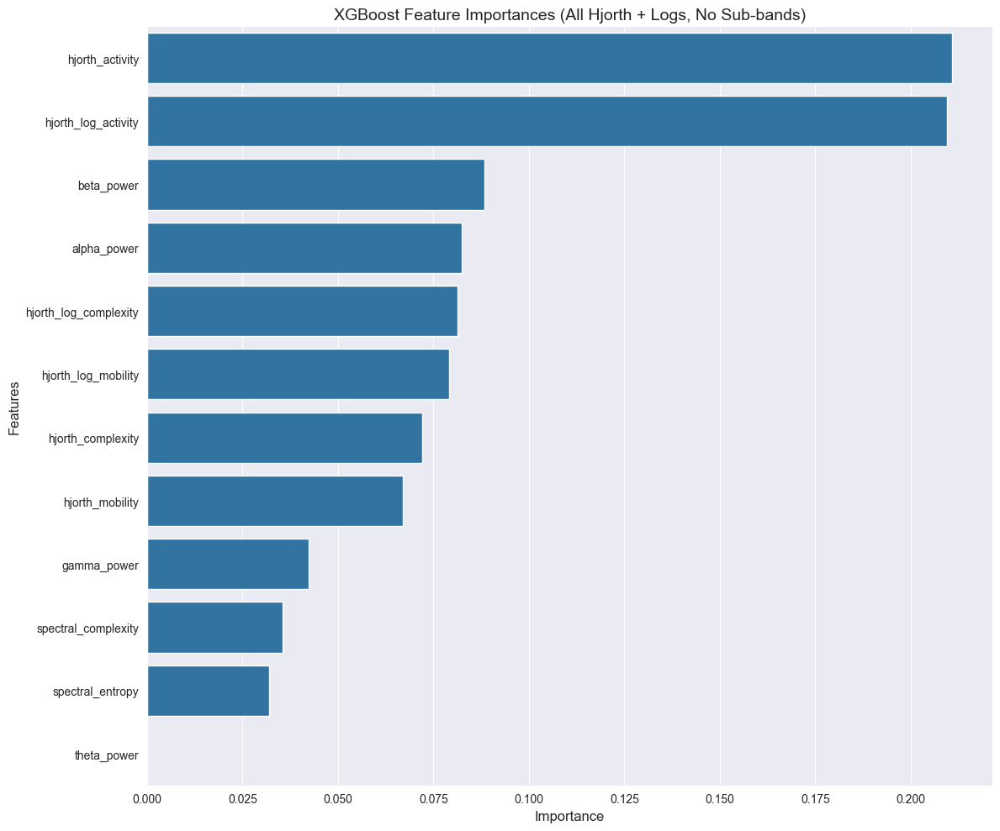

In [99]:
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

print("\n" + "="*60)
print("FEATURE IMPORTANCES (All Hjorth + Logs, No Sub-bands)")
print("="*60)
for idx, row in importance_df.iterrows():
    print(f"{row['feature']:30s}: {row['importance']:.4f}")

# Plot feature importances
fig, ax = plt.subplots(figsize=(12, 10))
sns.barplot(data=importance_df, y='feature', x='importance', ax=ax)
ax.set_title('XGBoost Feature Importances (All Hjorth + Logs, No Sub-bands)', fontsize=14)
ax.set_xlabel('Importance', fontsize=12)
ax.set_ylabel('Features', fontsize=12)
plt.tight_layout()
plt.show()

# avg task vs avg rest, using all channels and connectivity features

Creating dataset with all channels and coherence features...
Processing sub-13 - eyesclosed...
  Channels: 61, Windows: 1209


/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/744176653.py:179: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  band_powers[band_name] = np.trapz(psd[mask], freqs[mask])


Processing sub-13 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-14 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-14 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-15 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-15 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-22 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-22 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-23 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-23 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-24 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-24 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-25 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-25 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-40 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-40 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-47 - eyesclosed...
  Channels: 61, Window

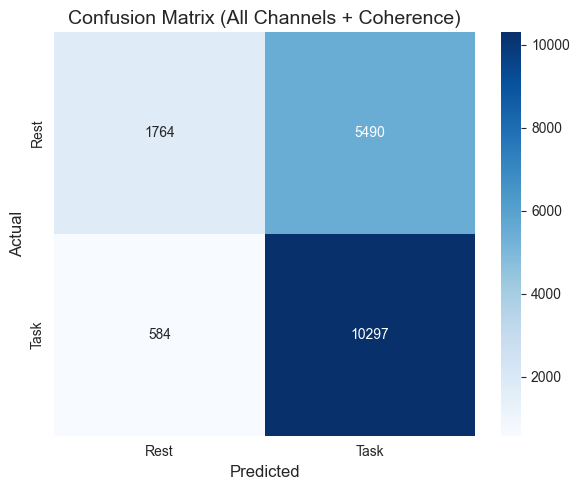


TOP 20 FEATURE IMPORTANCES
Oz_hjorth_log_activity                            : 0.0357
O1_hjorth_log_activity                            : 0.0260
T8_hjorth_log_mobility                            : 0.0243
Oz_hjorth_activity                                : 0.0239
Fp1_hjorth_log_mobility                           : 0.0185
O1_hjorth_activity                                : 0.0173
T8_hjorth_mobility                                : 0.0152
FT8_hjorth_log_mobility                           : 0.0128
Fpz_hjorth_log_mobility                           : 0.0118
Fpz_hjorth_mobility                               : 0.0110
TP10_hjorth_mobility                              : 0.0098
Fp2_hjorth_log_activity                           : 0.0098
FT8_hjorth_mobility                               : 0.0095
Fpz_hjorth_log_activity                           : 0.0091
PO4_hjorth_log_mobility                           : 0.0088
T8_gamma_power                                    : 0.0086
AF7_hjorth_log_mobility     

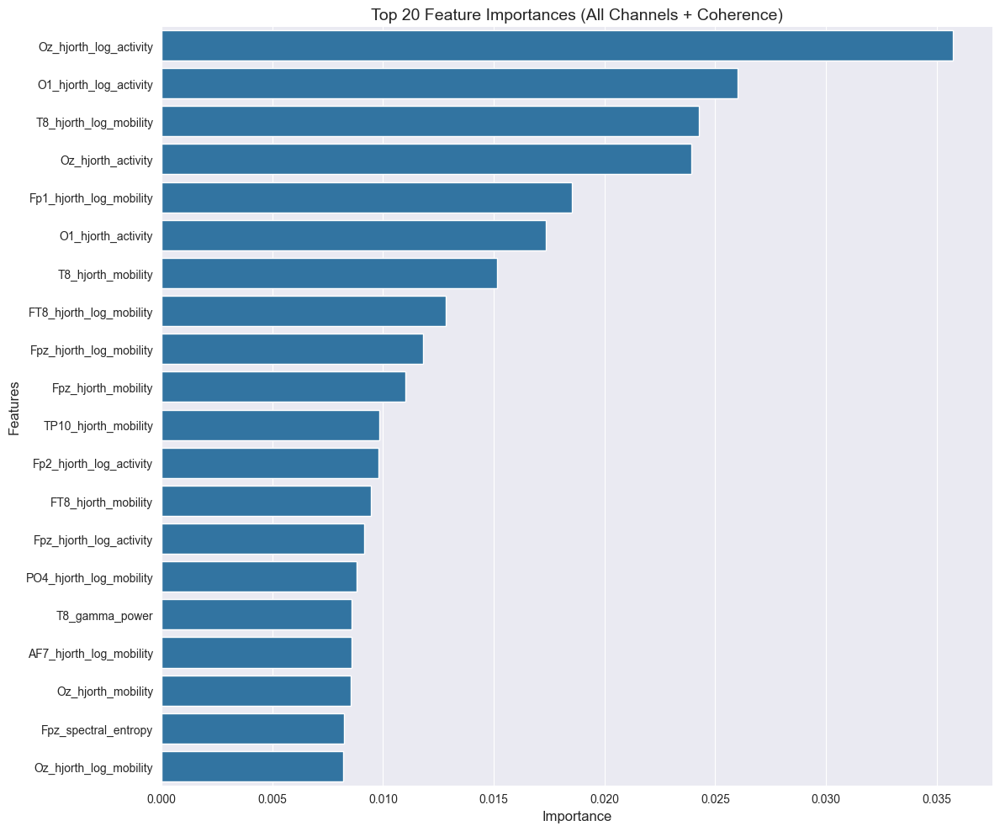


COHERENCE FEATURE IMPORTANCES
Total coherence features: 112
Total coherence importance: 0.0000

Top 10 coherence features:
  coh_AF7_F7_theta: 0.0000
  coh_Fz_F3_gamma: 0.0000
  coh_AF7_F7_alpha: 0.0000
  coh_Fz_F5_theta: 0.0000
  coh_Fz_F5_alpha: 0.0000
  coh_AF7_F3_beta: 0.0000
  coh_AF7_F3_alpha: 0.0000
  coh_Fz_F3_alpha: 0.0000
  coh_Fz_F5_beta: 0.0000
  coh_Fz_F5_gamma: 0.0000

PER-SUBJECT ACCURACY ON TEST SET
sub-22: 0.680 (n=6045)
sub-23: 0.609 (n=6045)
sub-25: 0.706 (n=6045)

Mean subject accuracy: 0.665 ± 0.041


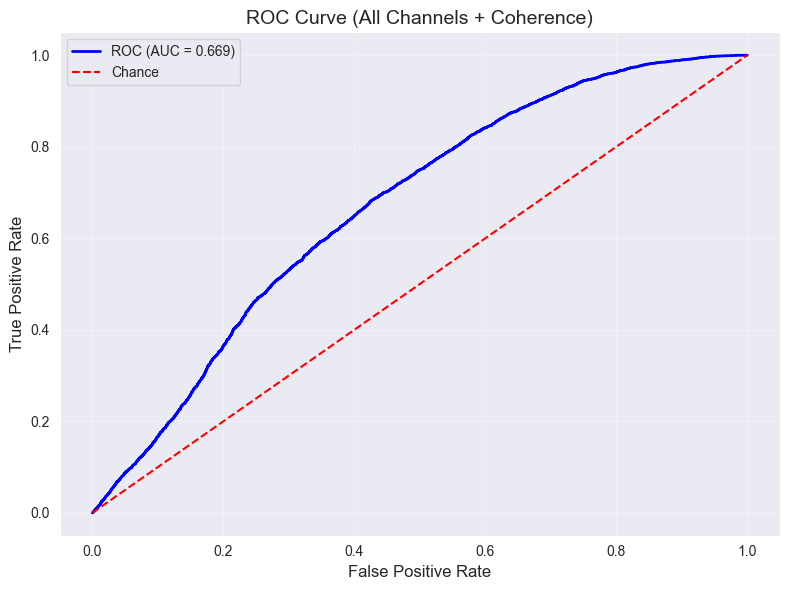

In [102]:
import numpy as np
from scipy.stats import entropy
from scipy.signal import welch, coherence
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from itertools import combinations
import mne

# ============================================
# PARAMETERS
# ============================================
WINDOW_SEC = 0.25
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)
OVERLAP = 0  # No overlap

# Define frequency bands
bands = {
    "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

# ============================================
# MODIFIED LOAD SIGNAL - LOADS ALL CHANNELS
# ============================================
def load_signal_all_channels(file, verbose=False):
    """Load all channels from a BrainVision file"""
    try:
        raw = mne.io.read_raw_brainvision(file, preload=True, verbose=verbose)

        # Remove bad channels if any
        if raw.info["bads"]:
            raw.drop_channels(raw.info["bads"])

        # Filtering
        raw.notch_filter(50, verbose=verbose)
        raw.filter(1, 40, verbose=verbose)

        # Resample
        raw.resample(TARGET_SFREQ, verbose=verbose)

        # Get data as (n_channels, n_samples)
        data = raw.get_data()

        # Check for bad signals (any channel flat)
        if np.any(np.std(data, axis=1) < 1e-10):
            return None, None

        # Get channel names
        ch_names = raw.ch_names

        return data, ch_names

    except Exception as e:
        if verbose:
            print(f"Error loading {file}: {e}")
        return None, None

# ============================================
# FEATURE EXTRACTION FUNCTIONS (Updated for all channels)
# ============================================
def hjorth_activity(x):
    """Hjorth activity = variance of signal"""
    return np.var(x)

def hjorth_mobility(x):
    """Hjorth mobility = sqrt(var(diff(signal)) / var(signal))"""
    if len(x) < 2:
        return np.nan
    activity = np.var(x)
    if activity == 0:
        return np.nan
    diff1 = np.diff(x)
    mobility = np.sqrt(np.var(diff1) / activity)
    return mobility

def hjorth_complexity(x):
    """Hjorth complexity = mobility(diff(signal)) / mobility(signal)"""
    if len(x) < 3:
        return np.nan

    mobility_signal = hjorth_mobility(x)
    if np.isnan(mobility_signal) or mobility_signal == 0:
        return np.nan

    diff1 = np.diff(x)
    mobility_diff = hjorth_mobility(diff1)
    if np.isnan(mobility_diff):
        return np.nan

    complexity = mobility_diff / mobility_signal
    return complexity

def spectral_entropy(psd):
    """Spectral entropy"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    return entropy(p)

def spectral_complexity(psd):
    """Spectral complexity (KL divergence from uniform)"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    uniform = np.ones_like(p) / len(p)
    return entropy(p, uniform)

def band_power_features(x, fs, bands):
    """Extract band power features (normalized) for a single channel"""
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))

    band_powers_raw = {}
    for band_name, (low, high) in bands.items():
        mask = (freqs >= low) & (freqs < high)
        if np.any(mask):
            band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])
        else:
            band_powers_raw[band_name] = 0

    total_power = sum(band_powers_raw.values())
    if total_power > 0:
        band_powers_norm = {k: v / total_power for k, v in band_powers_raw.items()}
    else:
        band_powers_norm = {k: np.nan for k in band_powers_raw.keys()}

    return band_powers_norm, freqs

def spectral_coherence_pair(x, y, fs, bands):
    """Compute spectral coherence between two signals for each frequency band"""
    freqs, Cxy = coherence(x, y, fs=fs, nperseg=min(len(x), fs*2))

    coherence_by_band = {}
    for band_name, (low, high) in bands.items():
        mask = (freqs >= low) & (freqs <= high)
        if np.any(mask):
            coherence_by_band[band_name] = np.mean(Cxy[mask])
        else:
            coherence_by_band[band_name] = np.nan

    return coherence_by_band

def extract_features_from_window_multi_channel(data_chunk, ch_names, fs, bands):
    """Extract features from a window across all channels + pairwise coherence"""
    n_channels = len(ch_names)
    features = {}

    # Per-channel features
    for ch_idx, ch_name in enumerate(ch_names):
        x = data_chunk[ch_idx]

        # Hjorth features
        activity = hjorth_activity(x)
        mobility = hjorth_mobility(x)
        complexity = hjorth_complexity(x)

        log_activity = np.log1p(activity) if activity > 0 else np.nan
        log_mobility = np.log1p(mobility) if not np.isnan(mobility) and mobility > 0 else np.nan
        log_complexity = np.log1p(complexity) if not np.isnan(complexity) and complexity > 0 else np.nan

        # Compute PSD for this channel
        freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))

        # Band powers from PSD
        band_powers = {}
        for band_name, (low, high) in bands.items():
            mask = (freqs >= low) & (freqs < high)
            if np.any(mask):
                band_powers[band_name] = np.trapz(psd[mask], freqs[mask])
            else:
                band_powers[band_name] = 0

        # Normalize band powers
        total_power = sum(band_powers.values())
        if total_power > 0:
            for band_name in band_powers:
                band_powers[band_name] /= total_power

        # Spectral entropy and complexity from PSD (not band powers)
        entropy_val = spectral_entropy(psd)
        complexity_val = spectral_complexity(psd)

        # Store per-channel features
        features[f'{ch_name}_hjorth_activity'] = activity
        features[f'{ch_name}_hjorth_mobility'] = mobility
        features[f'{ch_name}_hjorth_complexity'] = complexity
        features[f'{ch_name}_hjorth_log_activity'] = log_activity
        features[f'{ch_name}_hjorth_log_mobility'] = log_mobility
        features[f'{ch_name}_hjorth_log_complexity'] = log_complexity
        features[f'{ch_name}_spectral_entropy'] = entropy_val
        features[f'{ch_name}_spectral_complexity'] = complexity_val

        for band_name, power in band_powers.items():
            features[f'{ch_name}_{band_name}_power'] = power

    # Pairwise spectral coherence features (only for first N channels to avoid explosion)
    # Limit to first 8 channels or all if less
    n_coherence_channels = min(n_channels, 8)
    coherence_ch_names = ch_names[:n_coherence_channels]

    for ch1_idx, ch2_idx in combinations(range(n_coherence_channels), 2):
        ch1_name = coherence_ch_names[ch1_idx]
        ch2_name = coherence_ch_names[ch2_idx]

        x = data_chunk[ch1_idx]
        y = data_chunk[ch2_idx]

        coherence_bands = spectral_coherence_pair(x, y, fs, bands)

        for band_name, coh_val in coherence_bands.items():
            if not np.isnan(coh_val):
                features[f'coh_{ch1_name}_{ch2_name}_{band_name}'] = coh_val

    return features

# ============================================
# CREATE DATASET WITH ALL CHANNELS
# ============================================
print("Creating dataset with all channels and coherence features...")

all_data = []
feature_names = None
all_subjects = set()

# Process rest files (label = 0)
for subj in rest_stats.keys():
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            condition = 'eyesclosed' if 'eyesclosed' in rest_file else 'eyesopen'
            print(f"Processing {subj} - {condition}...")

            data, ch_names = load_signal_all_channels(rest_file)

            if data is None or len(data) == 0:
                print(f"  Failed to load {rest_file}")
                continue

            all_subjects.add(subj)
            n_channels = len(ch_names)
            n_samples = data.shape[1]
            n_windows = n_samples // WINDOW_LEN

            print(f"  Channels: {n_channels}, Windows: {n_windows}")

            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window_data = data[:, start:end]

                # Check for bad channels in this window
                if np.any(np.std(window_data, axis=1) < 1e-10):
                    continue

                features = extract_features_from_window_multi_channel(window_data, ch_names, TARGET_SFREQ, bands)

                # Check for NaN values
                if not any(np.isnan(list(features.values()))):
                    if feature_names is None:
                        feature_names = list(features.keys())
                    all_data.append((list(features.values()), 0, subj))

# Process task files (label = 1)
for subj in rest_stats.keys():
    if subj in task_files:
        for task_file in task_files[subj]:
            task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]
            print(f"Processing {subj} - {task_name}...")

            data, ch_names = load_signal_all_channels(task_file)

            if data is None or len(data) == 0:
                print(f"  Failed to load {task_file}")
                continue

            all_subjects.add(subj)
            n_channels = len(ch_names)
            n_samples = data.shape[1]
            n_windows = n_samples // WINDOW_LEN

            print(f"  Channels: {n_channels}, Windows: {n_windows}")

            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window_data = data[:, start:end]

                if np.any(np.std(window_data, axis=1) < 1e-10):
                    continue

                features = extract_features_from_window_multi_channel(window_data, ch_names, TARGET_SFREQ, bands)

                if not any(np.isnan(list(features.values()))):
                    all_data.append((list(features.values()), 1, subj))

# Convert to structured format
X_all = np.array([d[0] for d in all_data])
y_all = np.array([d[1] for d in all_data])
subjects_all = np.array([d[2] for d in all_data])

print(f"\n" + "="*60)
print("DATASET CREATED")
print("="*60)
print(f"Total windows: {len(X_all)}")
print(f"Rest windows (0): {np.sum(y_all == 0)}")
print(f"Task windows (1): {np.sum(y_all == 1)}")
print(f"Features: {X_all.shape[1]}")
print(f"Unique subjects: {len(all_subjects)}")

# Show feature types
n_per_channel = 0
n_coherence = 0
for fname in feature_names:
    if 'coh_' in fname:
        n_coherence += 1
    else:
        n_per_channel += 1

print(f"\nFeature breakdown:")
print(f"  Per-channel features: {n_per_channel}")
print(f"  Coherence features: {n_coherence}")

# ============================================
# SUBJECT-WISE TRAIN-TEST SPLIT
# ============================================
unique_subjects = np.unique(subjects_all)
n_subjects = len(unique_subjects)

np.random.seed(42)
train_subjects = np.random.choice(unique_subjects, size=int(0.7 * n_subjects), replace=False)
test_subjects = np.array([s for s in unique_subjects if s not in train_subjects])

print(f"\nSubject split:")
print(f"Train subjects ({len(train_subjects)}): {train_subjects}")
print(f"Test subjects ({len(test_subjects)}): {test_subjects}")

# Create train/test masks
train_mask = np.isin(subjects_all, train_subjects)
test_mask = np.isin(subjects_all, test_subjects)

X_train = X_all[train_mask]
y_train = y_all[train_mask]
X_test = X_all[test_mask]
y_test = y_all[test_mask]

print(f"\nTrain set: {len(X_train)} windows from {len(train_subjects)} subjects")
print(f"  - Rest: {np.sum(y_train == 0)}, Task: {np.sum(y_train == 1)}")
print(f"Test set: {len(X_test)} windows from {len(test_subjects)} subjects")
print(f"  - Rest: {np.sum(y_test == 0)}, Task: {np.sum(y_test == 1)}")

# ============================================
# TRAIN MODEL
# ============================================
scale_pos_weight = np.sum(y_train == 0) / np.sum(y_train == 1)

model = XGBClassifier(
    n_estimators=100,
    max_depth=4,  # Slightly deeper for more complex features
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    # scale_pos_weight=scale_pos_weight,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

print("\nTraining model...")
model.fit(X_train, y_train)

# ============================================
# EVALUATION
# ============================================
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]

print("\n" + "="*60)
print("CLASSIFICATION RESULTS (All Channels + Coherence)")
print("="*60)
print(f"Train subjects: {len(train_subjects)}")
print(f"Test subjects: {len(test_subjects)}")
print("\n" + "="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_test, y_pred, target_names=['Rest (0)', 'Task (1)']))

print(f"\nROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")

# ============================================
# CONFUSION MATRIX
# ============================================
cm = confusion_matrix(y_test, y_pred)
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Rest', 'Task'],
            yticklabels=['Rest', 'Task'],
            ax=ax)
ax.set_title('Confusion Matrix (All Channels + Coherence)', fontsize=14)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('Actual', fontsize=12)
plt.tight_layout()
plt.show()

# ============================================
# FEATURE IMPORTANCES (Top 20)
# ============================================
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

print("\n" + "="*60)
print("TOP 20 FEATURE IMPORTANCES")
print("="*60)
for idx, row in importance_df.head(20).iterrows():
    print(f"{row['feature'][:50]:50s}: {row['importance']:.4f}")

# Plot top features
fig, ax = plt.subplots(figsize=(12, 10))
sns.barplot(data=importance_df.head(20), y='feature', x='importance', ax=ax)
ax.set_title('Top 20 Feature Importances (All Channels + Coherence)', fontsize=14)
ax.set_xlabel('Importance', fontsize=12)
ax.set_ylabel('Features', fontsize=12)
plt.tight_layout()
plt.show()

# ============================================
# COHERENCE FEATURE IMPORTANCE SUMMARY
# ============================================
coh_features = [f for f in feature_names if 'coh_' in f]
coh_importance = importance_df[importance_df['feature'].isin(coh_features)]

print("\n" + "="*60)
print("COHERENCE FEATURE IMPORTANCES")
print("="*60)
print(f"Total coherence features: {len(coh_features)}")
print(f"Total coherence importance: {coh_importance['importance'].sum():.4f}")
print("\nTop 10 coherence features:")
for idx, row in coh_importance.head(10).iterrows():
    print(f"  {row['feature'][:50]}: {row['importance']:.4f}")

# ============================================
# PER-SUBJECT ACCURACY
# ============================================
print("\n" + "="*60)
print("PER-SUBJECT ACCURACY ON TEST SET")
print("="*60)

subject_accuracies = []
for subj in test_subjects:
    subj_mask = subjects_all == subj
    subj_test_mask = test_mask & subj_mask

    if np.sum(subj_test_mask) > 0:
        X_subj = X_all[subj_test_mask]
        y_subj = y_all[subj_test_mask]
        y_subj_pred = model.predict(X_subj)
        subj_acc = np.mean(y_subj_pred == y_subj)
        subject_accuracies.append(subj_acc)
        print(f"{subj}: {subj_acc:.3f} (n={len(y_subj)})")

print(f"\nMean subject accuracy: {np.mean(subject_accuracies):.3f} ± {np.std(subject_accuracies):.3f}")

# ============================================
# ROC CURVE
# ============================================
from sklearn.metrics import roc_curve

fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(fpr, tpr, color='blue', lw=2, label=f'ROC (AUC = {roc_auc:.3f})')
ax.plot([0, 1], [0, 1], 'r--', label='Chance')
ax.set_xlabel('False Positive Rate', fontsize=12)
ax.set_ylabel('True Positive Rate', fontsize=12)
ax.set_title('ROC Curve (All Channels + Coherence)', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## brain heatmap

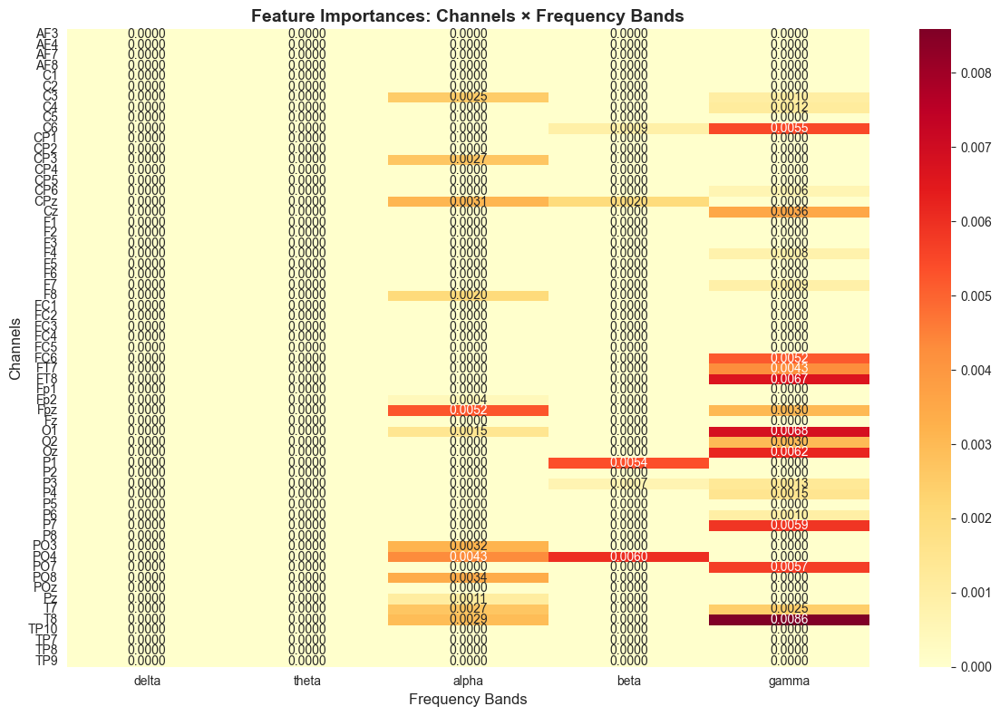

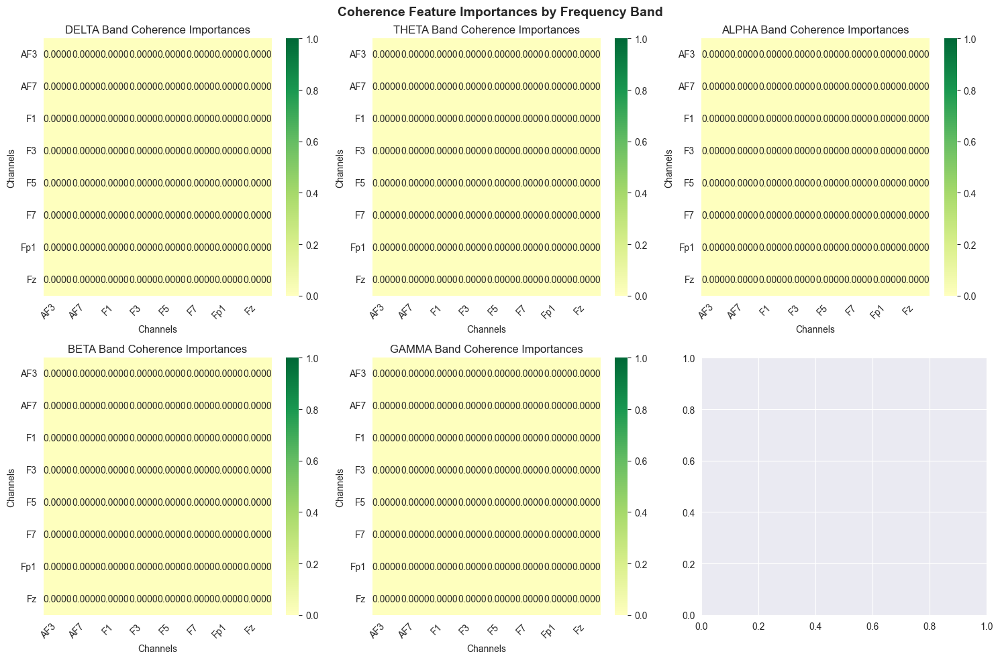

Rest windows collected: 7254
Task windows collected: 10881


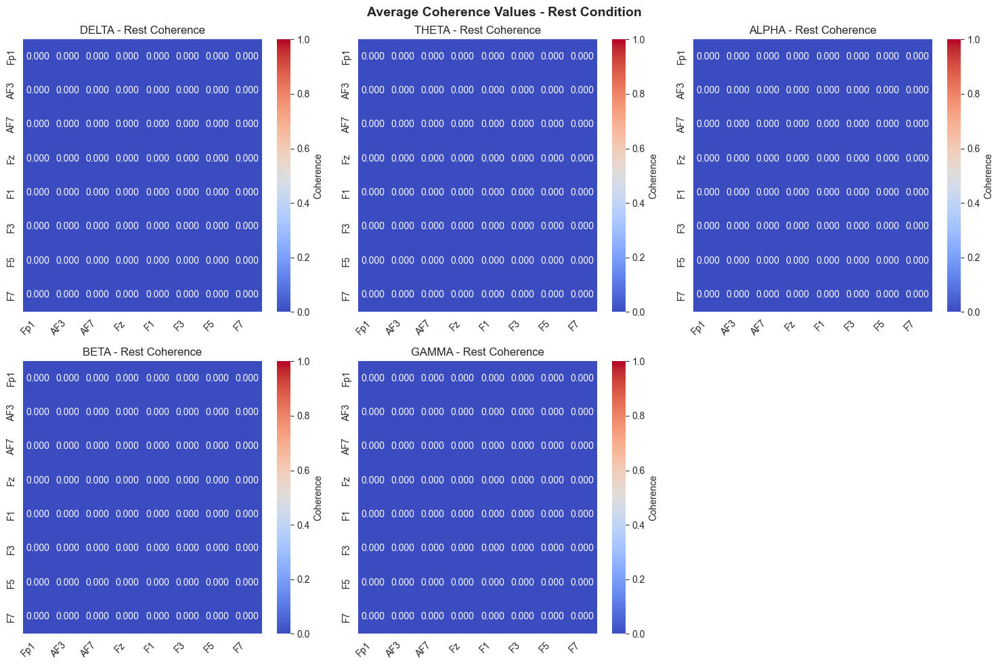

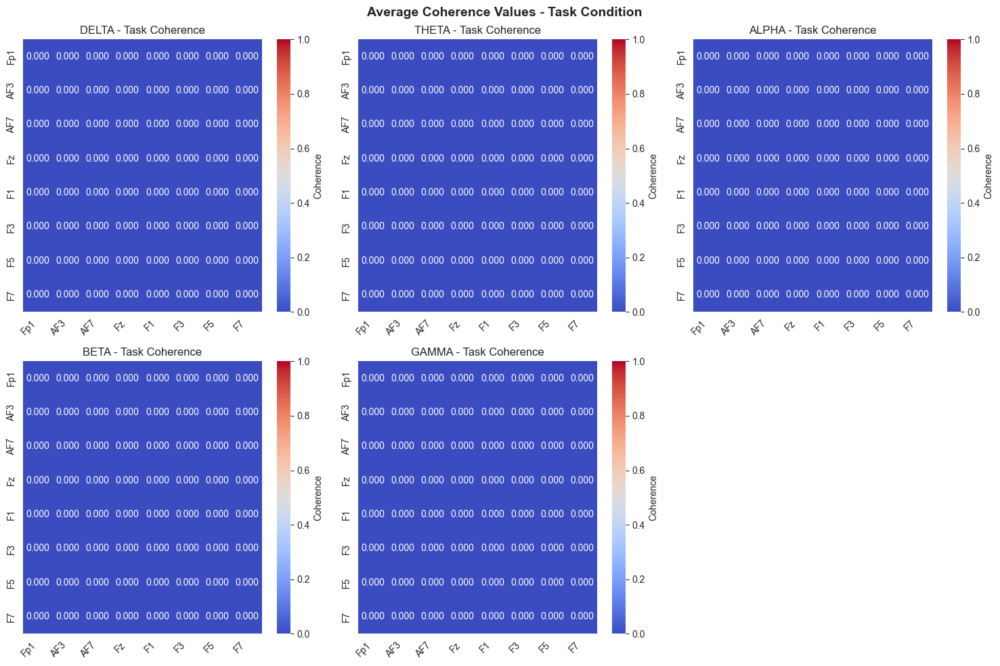

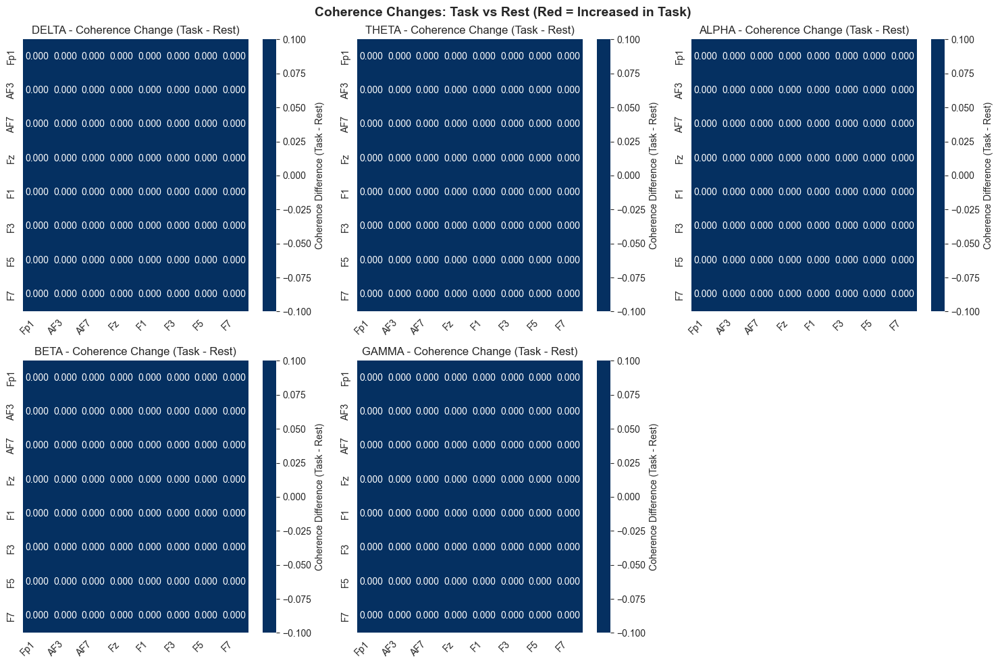


TOP COHERENCE CHANGES (Task - Rest) - Sorted by effect size

Top 10 INCREASES (Task > Rest):
  DELTA  | Fp1 - AF3       | +0.0000
  BETA   | AF3 - F7        | +0.0000
  BETA   | Fp1 - F7        | +0.0000
  BETA   | AF3 - AF7       | +0.0000
  BETA   | AF3 - Fz        | +0.0000
  BETA   | AF3 - F1        | +0.0000
  BETA   | AF3 - F3        | +0.0000
  BETA   | AF3 - F5        | +0.0000
  BETA   | AF7 - Fz        | +0.0000
  BETA   | Fp1 - F3        | +0.0000

Top 10 DECREASES (Task < Rest):
  GAMMA  | F5 - F7         | +0.0000
  THETA  | AF3 - F1        | +0.0000
  THETA  | AF3 - F3        | +0.0000
  THETA  | AF3 - F5        | +0.0000
  THETA  | AF3 - F7        | +0.0000
  THETA  | AF7 - Fz        | +0.0000
  THETA  | AF7 - F1        | +0.0000
  THETA  | AF7 - F3        | +0.0000
  THETA  | AF7 - F5        | +0.0000
  THETA  | AF7 - F7        | +0.0000


/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/2119721174.py:283: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=channel_imp_df, y='Channel', x='Total Importance', ax=ax, palette='viridis')


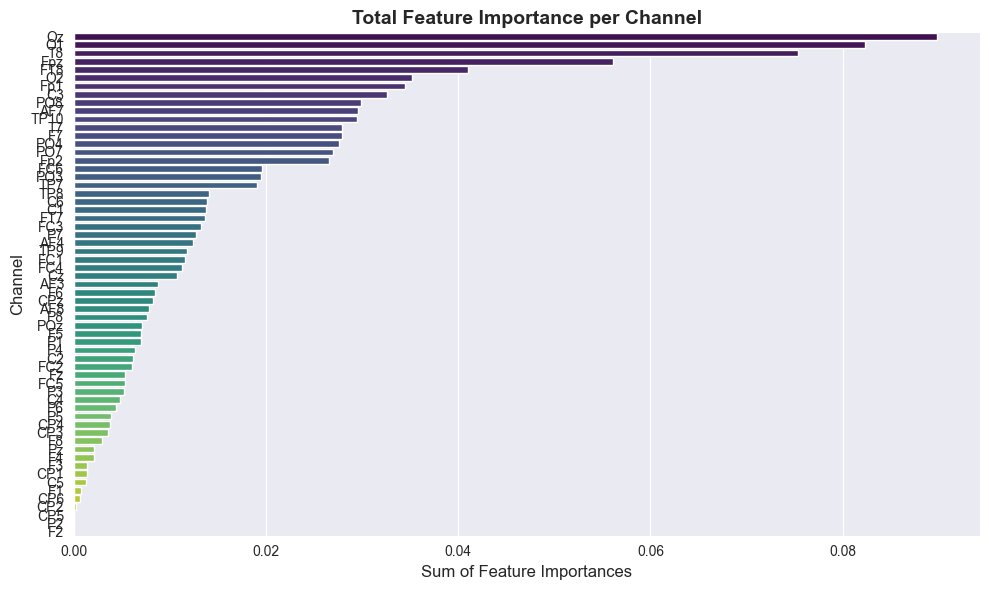

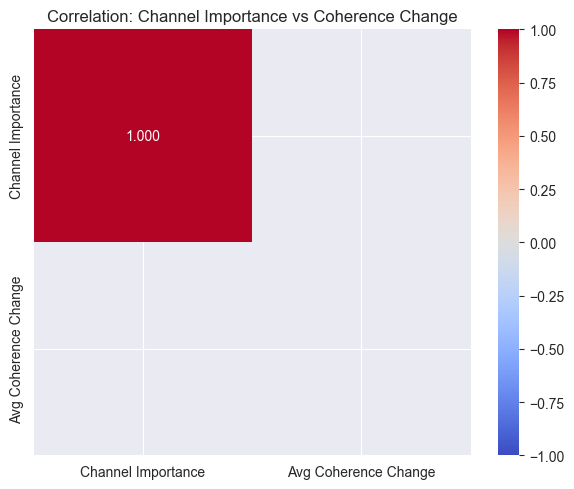

In [103]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from itertools import combinations

# ============================================
# HEATMAP 1: FEATURE IMPORTANCE MATRIX (Channels x Bands)
# ============================================

# Extract channel names from feature importances
all_channels = set()
for feat in feature_names:
    if '_power' in feat and not feat.startswith('coh_'):
        ch = feat.split('_')[0]
        all_channels.add(ch)
all_channels = sorted(list(all_channels))

# Create importance matrix for band powers per channel
band_names = ['delta', 'theta', 'alpha', 'beta', 'gamma']
importance_matrix = np.zeros((len(all_channels), len(band_names)))

for i, ch in enumerate(all_channels):
    for j, band in enumerate(band_names):
        feature_name = f'{ch}_{band}_power'
        if feature_name in importance_df['feature'].values:
            importance = importance_df[importance_df['feature'] == feature_name]['importance'].values[0]
            importance_matrix[i, j] = importance

# Plot channel x band importance heatmap
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(importance_matrix, annot=True, fmt='.4f', cmap='YlOrRd',
            xticklabels=band_names, yticklabels=all_channels, ax=ax)
ax.set_title('Feature Importances: Channels × Frequency Bands', fontsize=14, fontweight='bold')
ax.set_xlabel('Frequency Bands', fontsize=12)
ax.set_ylabel('Channels', fontsize=12)
plt.tight_layout()
plt.show()

# ============================================
# HEATMAP 2: CHANNEL PAIR IMPORTANCE (Coherence Features)
# ============================================

# Extract coherence feature importances
coh_features = importance_df[importance_df['feature'].str.contains('coh_', na=False)]

# Parse channel pairs and bands from coherence features
coh_data = []
for _, row in coh_features.iterrows():
    feat_name = row['feature']
    importance = row['importance']

    # Parse: coh_{ch1}_{ch2}_{band}
    parts = feat_name.split('_')
    if len(parts) >= 4:
        ch1 = parts[1]
        ch2 = parts[2]
        band = parts[3]
        coh_data.append({'ch1': ch1, 'ch2': ch2, 'band': band, 'importance': importance})

coh_df = pd.DataFrame(coh_data)

# Get unique channels from coherence features
coh_channels = sorted(list(set(coh_df['ch1'].unique()) | set(coh_df['ch2'].unique())))
n_coh_channels = len(coh_channels)

# Create separate matrices for each band
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for idx, band in enumerate(band_names):
    band_coh = coh_df[coh_df['band'] == band]

    # Create adjacency matrix
    adj_matrix = np.zeros((n_coh_channels, n_coh_channels))
    for _, row in band_coh.iterrows():
        i = coh_channels.index(row['ch1'])
        j = coh_channels.index(row['ch2'])
        adj_matrix[i, j] = row['importance']
        adj_matrix[j, i] = row['importance']  # Symmetric

    # Plot heatmap
    sns.heatmap(adj_matrix, annot=True, fmt='.4f', cmap='RdYlGn',
                xticklabels=coh_channels, yticklabels=coh_channels,
                ax=axes[idx], center=0, vmin=0, vmax=np.max(adj_matrix) if np.max(adj_matrix) > 0 else 1)
    axes[idx].set_title(f'{band.upper()} Band Coherence Importances', fontsize=12)
    axes[idx].set_xlabel('Channels', fontsize=10)
    axes[idx].set_ylabel('Channels', fontsize=10)
    plt.setp(axes[idx].xaxis.get_majorticklabels(), rotation=45, ha='right')
    plt.setp(axes[idx].yaxis.get_majorticklabels(), rotation=0)

plt.suptitle('Coherence Feature Importances by Frequency Band', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ============================================
# HEATMAP 3: AVERAGE COHERENCE VALUES (Task vs Rest)
# ============================================

def compute_average_coherence(data_windows, ch_names, fs, bands, n_coherence_channels=8):
    """Compute average coherence values from windows"""
    n_channels = min(len(ch_names), n_coherence_channels)
    coherence_bands = {band: np.zeros((n_channels, n_channels)) for band in bands.keys()}
    count = 0

    for window_data in data_windows:
        if window_data.shape[1] < fs:
            continue

        window_ch_names = ch_names[:n_channels]
        window_data = window_data[:n_channels, :]

        for band_name in bands.keys():
            band_matrix = np.zeros((n_channels, n_channels))

            for i, j in combinations(range(n_channels), 2):
                x = window_data[i, :]
                y = window_data[j, :]

                freqs, Cxy = coherence(x, y, fs=fs, nperseg=min(len(x), fs*2))
                mask = (freqs >= bands[band_name][0]) & (freqs <= bands[band_name][1])
                if np.any(mask):
                    coh_val = np.mean(Cxy[mask])
                    band_matrix[i, j] = coh_val
                    band_matrix[j, i] = coh_val

            coherence_bands[band_name] += band_matrix
        count += 1

    # Average
    if count > 0:
        for band_name in coherence_bands.keys():
            coherence_bands[band_name] /= count

    return coherence_bands, ch_names[:n_coherence_channels]

# Collect rest and task windows from test subjects
rest_windows = []
task_windows = []
ch_names_global = None

for subj in test_subjects:
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            data, ch_names = load_signal_all_channels(rest_file)
            if data is not None and ch_names is not None:
                ch_names_global = ch_names
                n_windows = data.shape[1] // WINDOW_LEN
                for i in range(n_windows):
                    start = i * WINDOW_LEN
                    end = start + WINDOW_LEN
                    window = data[:, start:end]
                    if np.all(np.std(window, axis=1) > 1e-10):
                        rest_windows.append(window)

    if subj in task_files:
        for task_file in task_files[subj]:
            data, ch_names = load_signal_all_channels(task_file)
            if data is not None and ch_names is not None:
                ch_names_global = ch_names
                n_windows = data.shape[1] // WINDOW_LEN
                for i in range(n_windows):
                    start = i * WINDOW_LEN
                    end = start + WINDOW_LEN
                    window = data[:, start:end]
                    if np.all(np.std(window, axis=1) > 1e-10):
                        task_windows.append(window)

print(f"Rest windows collected: {len(rest_windows)}")
print(f"Task windows collected: {len(task_windows)}")

if len(rest_windows) > 0 and len(task_windows) > 0:
    # Compute coherence for rest and task
    rest_coherence, coherence_channels = compute_average_coherence(rest_windows, ch_names_global, TARGET_SFREQ, bands)
    task_coherence, _ = compute_average_coherence(task_windows, ch_names_global, TARGET_SFREQ, bands)

    # Compute difference (Task - Rest)
    diff_coherence = {}
    for band in bands.keys():
        diff_coherence[band] = task_coherence[band] - rest_coherence[band]

    # Plot coherence heatmaps
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    for idx, band in enumerate(bands.keys()):
        ax = axes[idx // 3, idx % 3]

        # Plot rest coherence
        sns.heatmap(rest_coherence[band], annot=True, fmt='.3f', cmap='coolwarm',
                    xticklabels=coherence_channels, yticklabels=coherence_channels,
                    ax=ax, vmin=0, vmax=1, cbar_kws={'label': 'Coherence'})
        ax.set_title(f'{band.upper()} - Rest Coherence', fontsize=12)
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

    axes[1, 2].axis('off')  # Hide extra subplot
    plt.suptitle('Average Coherence Values - Rest Condition', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # Plot task coherence
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    for idx, band in enumerate(bands.keys()):
        ax = axes[idx // 3, idx % 3]

        sns.heatmap(task_coherence[band], annot=True, fmt='.3f', cmap='coolwarm',
                    xticklabels=coherence_channels, yticklabels=coherence_channels,
                    ax=ax, vmin=0, vmax=1, cbar_kws={'label': 'Coherence'})
        ax.set_title(f'{band.upper()} - Task Coherence', fontsize=12)
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

    axes[1, 2].axis('off')
    plt.suptitle('Average Coherence Values - Task Condition', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # Plot difference (Task - Rest)
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    for idx, band in enumerate(bands.keys()):
        ax = axes[idx // 3, idx % 3]

        # Find symmetric color limits
        max_abs = np.max(np.abs(diff_coherence[band]))
        sns.heatmap(diff_coherence[band], annot=True, fmt='.3f', cmap='RdBu_r',
                    xticklabels=coherence_channels, yticklabels=coherence_channels,
                    ax=ax, center=0, vmin=-max_abs, vmax=max_abs,
                    cbar_kws={'label': 'Coherence Difference (Task - Rest)'})
        ax.set_title(f'{band.upper()} - Coherence Change (Task - Rest)', fontsize=12)
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

    axes[1, 2].axis('off')
    plt.suptitle('Coherence Changes: Task vs Rest (Red = Increased in Task)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # ============================================
    # SUMMARY: Top coherence connections
    # ============================================
    print("\n" + "="*60)
    print("TOP COHERENCE CHANGES (Task - Rest) - Sorted by effect size")
    print("="*60)

    all_diffs = []
    for band in bands.keys():
        mat = diff_coherence[band]
        n_ch = len(coherence_channels)
        for i in range(n_ch):
            for j in range(i+1, n_ch):
                all_diffs.append({
                    'Band': band.upper(),
                    'Connection': f"{coherence_channels[i]} - {coherence_channels[j]}",
                    'Diff': mat[i, j]
                })

    diff_df = pd.DataFrame(all_diffs)
    diff_df = diff_df.sort_values('Diff', ascending=False)

    print("\nTop 10 INCREASES (Task > Rest):")
    for _, row in diff_df.head(10).iterrows():
        print(f"  {row['Band']:6s} | {row['Connection']:15s} | {row['Diff']:+.4f}")

    print("\nTop 10 DECREASES (Task < Rest):")
    for _, row in diff_df.tail(10).iloc[::-1].iterrows():
        print(f"  {row['Band']:6s} | {row['Connection']:15s} | {row['Diff']:+.4f}")

# ============================================
# HEATMAP 4: SUMMARY - Total Importance per Channel
# ============================================

# Calculate total importance per channel (sum across all features)
channel_total_importance = {}
for ch in all_channels:
    ch_features = [f for f in feature_names if f.startswith(ch) and not f.startswith('coh_')]
    total_imp = importance_df[importance_df['feature'].isin(ch_features)]['importance'].sum()
    channel_total_importance[ch] = total_imp

# Create DataFrame and plot
channel_imp_df = pd.DataFrame(list(channel_total_importance.items()), columns=['Channel', 'Total Importance'])
channel_imp_df = channel_imp_df.sort_values('Total Importance', ascending=False)

fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(data=channel_imp_df, y='Channel', x='Total Importance', ax=ax, palette='viridis')
ax.set_title('Total Feature Importance per Channel', fontsize=14, fontweight='bold')
ax.set_xlabel('Sum of Feature Importances', fontsize=12)
ax.set_ylabel('Channel', fontsize=12)
plt.tight_layout()
plt.show()

# ============================================
# HEATMAP 5: Correlation between channel importances and coherence changes
# ============================================
if len(rest_windows) > 0 and len(task_windows) > 0:
    # Get channel importance values
    channel_imp_values = [channel_total_importance.get(ch, 0) for ch in coherence_channels[:len(coherence_channels)]]

    # Get average coherence change per channel (mean of all connections)
    avg_coherence_change = np.zeros(len(coherence_channels))
    for band in bands.keys():
        mat = diff_coherence[band]
        for i in range(len(coherence_channels)):
            # Average across all connections for this channel (excluding self)
            connections = [mat[i, j] for j in range(len(coherence_channels)) if j != i]
            avg_coherence_change[i] += np.mean(connections) if connections else 0
    avg_coherence_change /= len(bands.keys())

    # Create correlation matrix
    corr_matrix = np.array([channel_imp_values[:len(coherence_channels)], avg_coherence_change])
    corr_matrix = np.corrcoef(corr_matrix)

    fig, ax = plt.subplots(figsize=(6, 5))
    sns.heatmap(corr_matrix, annot=True, fmt='.3f', cmap='coolwarm',
                xticklabels=['Channel Importance', 'Avg Coherence Change'],
                yticklabels=['Channel Importance', 'Avg Coherence Change'],
                ax=ax, center=0, vmin=-1, vmax=1)
    ax.set_title('Correlation: Channel Importance vs Coherence Change', fontsize=12)
    plt.tight_layout()
    plt.show()

# added PLI features

Creating dataset with all channels, coherence, and PLI features...
Processing sub-13 - eyesclosed...
  Channels: 61, Windows: 1209


/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/2101926695.py:222: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  band_powers[band_name] = np.trapz(psd[mask], freqs[mask])


Processing sub-13 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-14 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-14 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-15 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-15 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-22 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-22 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-23 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-23 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-24 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-24 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-25 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-25 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-40 - eyesclosed...
  Channels: 61, Windows: 1209
Processing sub-40 - eyesopen...
  Channels: 61, Windows: 1209
Processing sub-47 - eyesclosed...
  Channels: 61, Window

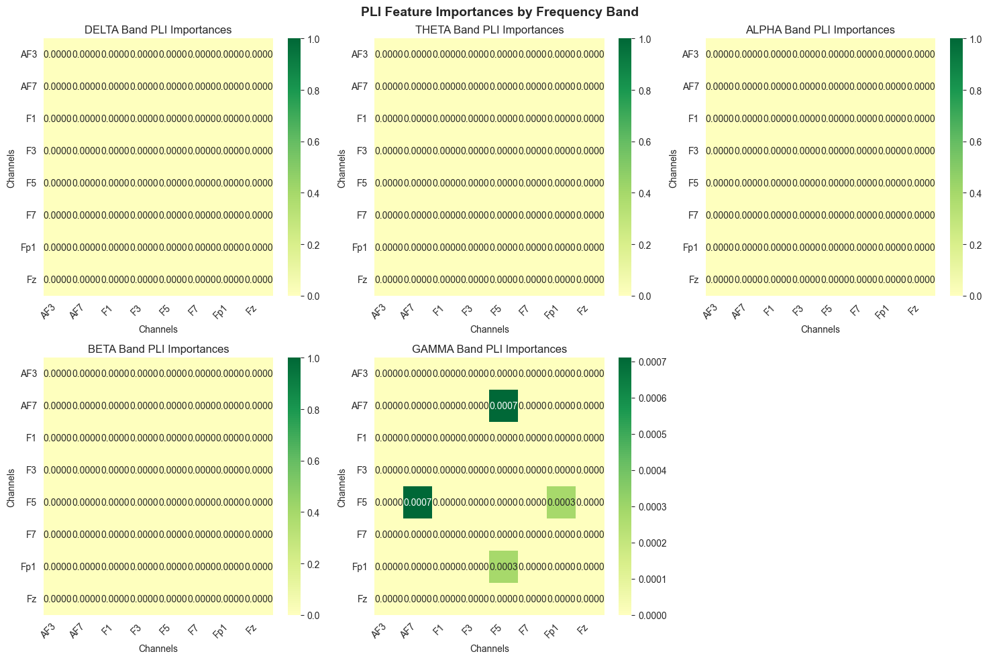

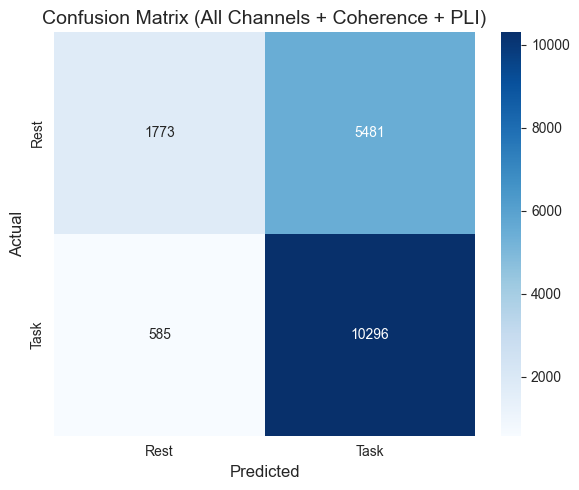


PER-SUBJECT ACCURACY ON TEST SET
sub-22: 0.679 (n=6045)
sub-23: 0.608 (n=6045)
sub-25: 0.709 (n=6045)

Mean subject accuracy: 0.666 ± 0.042


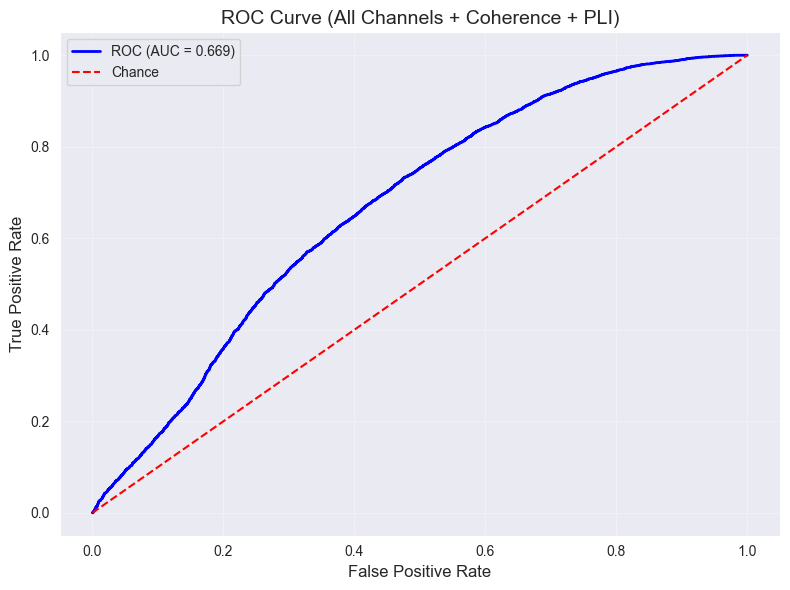

In [105]:
import numpy as np
from scipy.stats import entropy
from scipy.signal import welch, coherence
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from itertools import combinations
import mne

# ============================================
# PARAMETERS
# ============================================
WINDOW_SEC = 0.25
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)
OVERLAP = 0  # No overlap

# Define frequency bands
bands = {
    "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

# ============================================
# MODIFIED LOAD SIGNAL - LOADS ALL CHANNELS
# ============================================
def load_signal_all_channels(file, verbose=False):
    """Load all channels from a BrainVision file"""
    try:
        raw = mne.io.read_raw_brainvision(file, preload=True, verbose=verbose)

        # Remove bad channels if any
        if raw.info["bads"]:
            raw.drop_channels(raw.info["bads"])

        # Filtering
        raw.notch_filter(50, verbose=verbose)
        raw.filter(1, 40, verbose=verbose)

        # Resample
        raw.resample(TARGET_SFREQ, verbose=verbose)

        # Get data as (n_channels, n_samples)
        data = raw.get_data()

        # Check for bad signals (any channel flat)
        if np.any(np.std(data, axis=1) < 1e-10):
            return None, None

        # Get channel names
        ch_names = raw.ch_names

        return data, ch_names

    except Exception as e:
        if verbose:
            print(f"Error loading {file}: {e}")
        return None, None

# ============================================
# FEATURE EXTRACTION FUNCTIONS
# ============================================
def hjorth_activity(x):
    """Hjorth activity = variance of signal"""
    return np.var(x)

def hjorth_mobility(x):
    """Hjorth mobility = sqrt(var(diff(signal)) / var(signal))"""
    if len(x) < 2:
        return np.nan
    activity = np.var(x)
    if activity == 0:
        return np.nan
    diff1 = np.diff(x)
    mobility = np.sqrt(np.var(diff1) / activity)
    return mobility

def hjorth_complexity(x):
    """Hjorth complexity = mobility(diff(signal)) / mobility(signal)"""
    if len(x) < 3:
        return np.nan

    mobility_signal = hjorth_mobility(x)
    if np.isnan(mobility_signal) or mobility_signal == 0:
        return np.nan

    diff1 = np.diff(x)
    mobility_diff = hjorth_mobility(diff1)
    if np.isnan(mobility_diff):
        return np.nan

    complexity = mobility_diff / mobility_signal
    return complexity

def spectral_entropy(psd):
    """Spectral entropy"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    return entropy(p)

def spectral_complexity(psd):
    """Spectral complexity (KL divergence from uniform)"""
    psd = np.nan_to_num(psd)
    total = np.sum(psd)
    if total == 0:
        return np.nan
    p = psd / total
    uniform = np.ones_like(p) / len(p)
    return entropy(p, uniform)

def band_power_features(x, fs, bands):
    """Extract band power features (normalized) for a single channel"""
    freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))

    band_powers_raw = {}
    for band_name, (low, high) in bands.items():
        mask = (freqs >= low) & (freqs < high)
        if np.any(mask):
            band_powers_raw[band_name] = np.trapz(psd[mask], freqs[mask])
        else:
            band_powers_raw[band_name] = 0

    total_power = sum(band_powers_raw.values())
    if total_power > 0:
        band_powers_norm = {k: v / total_power for k, v in band_powers_raw.items()}
    else:
        band_powers_norm = {k: np.nan for k in band_powers_raw.keys()}

    return band_powers_norm, freqs, psd

def spectral_coherence_pair(x, y, fs, bands):
    """Compute spectral coherence between two signals for each frequency band"""
    freqs, Cxy = coherence(x, y, fs=fs, nperseg=min(len(x), fs*2))

    coherence_by_band = {}
    for band_name, (low, high) in bands.items():
        mask = (freqs >= low) & (freqs <= high)
        if np.any(mask):
            coherence_by_band[band_name] = np.mean(Cxy[mask])
        else:
            coherence_by_band[band_name] = np.nan

    return coherence_by_band

def phase_lag_index(x, y):
    """
    Compute Phase Lag Index (PLI) between two signals.
    PLI measures the asymmetry of the phase difference distribution.
    Range: [0, 1], where 0 = no coupling, 1 = perfect phase locking.
    """
    from scipy.signal import hilbert

    # Compute Hilbert transform to get instantaneous phase
    x_phase = np.angle(hilbert(x))
    y_phase = np.angle(hilbert(y))

    # Compute phase difference
    phase_diff = x_phase - y_phase

    # PLI = |E(sign(sin(phase_diff)))|
    pli = np.abs(np.mean(np.sign(np.sin(phase_diff))))

    return pli

def spectral_pli_pair(x, y, fs, bands):
    """
    Compute Phase Lag Index filtered by frequency band.
    First filters signals to specific bands, then computes PLI.
    """
    from scipy.signal import butter, filtfilt

    pli_by_band = {}

    for band_name, (low, high) in bands.items():
        # Bandpass filter
        nyquist = fs / 2
        b, a = butter(4, [low/nyquist, high/nyquist], btype='band')

        x_filtered = filtfilt(b, a, x)
        y_filtered = filtfilt(b, a, y)

        # Compute PLI on filtered signals
        pli_val = phase_lag_index(x_filtered, y_filtered)
        pli_by_band[band_name] = pli_val

    return pli_by_band

def extract_features_from_window_multi_channel(data_chunk, ch_names, fs, bands):
    """Extract features from a window across all channels + pairwise coherence + PLI"""
    n_channels = len(ch_names)
    features = {}

    # Per-channel features
    for ch_idx, ch_name in enumerate(ch_names):
        x = data_chunk[ch_idx]

        # Hjorth features
        activity = hjorth_activity(x)
        mobility = hjorth_mobility(x)
        complexity = hjorth_complexity(x)

        log_activity = np.log1p(activity) if activity > 0 else np.nan
        log_mobility = np.log1p(mobility) if not np.isnan(mobility) and mobility > 0 else np.nan
        log_complexity = np.log1p(complexity) if not np.isnan(complexity) and complexity > 0 else np.nan

        # Compute PSD for this channel
        freqs, psd = welch(x, fs=fs, nperseg=min(len(x), fs*2))

        # Band powers from PSD
        band_powers = {}
        for band_name, (low, high) in bands.items():
            mask = (freqs >= low) & (freqs < high)
            if np.any(mask):
                band_powers[band_name] = np.trapz(psd[mask], freqs[mask])
            else:
                band_powers[band_name] = 0

        # Normalize band powers
        total_power = sum(band_powers.values())
        if total_power > 0:
            for band_name in band_powers:
                band_powers[band_name] /= total_power

        # Spectral entropy and complexity from PSD
        entropy_val = spectral_entropy(psd)
        complexity_val = spectral_complexity(psd)

        # Store per-channel features
        features[f'{ch_name}_hjorth_activity'] = activity
        features[f'{ch_name}_hjorth_mobility'] = mobility
        features[f'{ch_name}_hjorth_complexity'] = complexity
        features[f'{ch_name}_hjorth_log_activity'] = log_activity
        features[f'{ch_name}_hjorth_log_mobility'] = log_mobility
        features[f'{ch_name}_hjorth_log_complexity'] = log_complexity
        features[f'{ch_name}_spectral_entropy'] = entropy_val
        features[f'{ch_name}_spectral_complexity'] = complexity_val

        for band_name, power in band_powers.items():
            features[f'{ch_name}_{band_name}_power'] = power

    # Pairwise connectivity features (Coherence and PLI)
    # Limit to first N channels to avoid feature explosion
    n_connectivity_channels = min(n_channels, 8)
    connectivity_ch_names = ch_names[:n_connectivity_channels]

    for ch1_idx, ch2_idx in combinations(range(n_connectivity_channels), 2):
        ch1_name = connectivity_ch_names[ch1_idx]
        ch2_name = connectivity_ch_names[ch2_idx]

        x = data_chunk[ch1_idx]
        y = data_chunk[ch2_idx]

        # Spectral Coherence
        coherence_bands = spectral_coherence_pair(x, y, fs, bands)
        for band_name, coh_val in coherence_bands.items():
            if not np.isnan(coh_val):
                features[f'coh_{ch1_name}_{ch2_name}_{band_name}'] = coh_val

        # Phase Lag Index (PLI)
        pli_bands = spectral_pli_pair(x, y, fs, bands)
        for band_name, pli_val in pli_bands.items():
            if not np.isnan(pli_val):
                features[f'pli_{ch1_name}_{ch2_name}_{band_name}'] = pli_val

    return features

# ============================================
# CREATE DATASET WITH ALL CHANNELS
# ============================================
print("Creating dataset with all channels, coherence, and PLI features...")

all_data = []
feature_names = None
all_subjects = set()

# Process rest files (label = 0)
for subj in rest_stats.keys():
    if subj in rest_files:
        for rest_file in rest_files[subj]:
            condition = 'eyesclosed' if 'eyesclosed' in rest_file else 'eyesopen'
            print(f"Processing {subj} - {condition}...")

            data, ch_names = load_signal_all_channels(rest_file)

            if data is None or len(data) == 0:
                print(f"  Failed to load {rest_file}")
                continue

            all_subjects.add(subj)
            n_channels = len(ch_names)
            n_samples = data.shape[1]
            n_windows = n_samples // WINDOW_LEN

            print(f"  Channels: {n_channels}, Windows: {n_windows}")

            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window_data = data[:, start:end]

                # Check for bad channels in this window
                if np.any(np.std(window_data, axis=1) < 1e-10):
                    continue

                features = extract_features_from_window_multi_channel(window_data, ch_names, TARGET_SFREQ, bands)

                # Check for NaN values
                if not any(np.isnan(list(features.values()))):
                    if feature_names is None:
                        feature_names = list(features.keys())
                    all_data.append((list(features.values()), 0, subj))

# Process task files (label = 1)
for subj in rest_stats.keys():
    if subj in task_files:
        for task_file in task_files[subj]:
            task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]
            print(f"Processing {subj} - {task_name}...")

            data, ch_names = load_signal_all_channels(task_file)

            if data is None or len(data) == 0:
                print(f"  Failed to load {task_file}")
                continue

            all_subjects.add(subj)
            n_channels = len(ch_names)
            n_samples = data.shape[1]
            n_windows = n_samples // WINDOW_LEN

            print(f"  Channels: {n_channels}, Windows: {n_windows}")

            for i in range(n_windows):
                start = i * WINDOW_LEN
                end = start + WINDOW_LEN
                window_data = data[:, start:end]

                if np.any(np.std(window_data, axis=1) < 1e-10):
                    continue

                features = extract_features_from_window_multi_channel(window_data, ch_names, TARGET_SFREQ, bands)

                if not any(np.isnan(list(features.values()))):
                    all_data.append((list(features.values()), 1, subj))

# Convert to structured format
X_all = np.array([d[0] for d in all_data])
y_all = np.array([d[1] for d in all_data])
subjects_all = np.array([d[2] for d in all_data])

print(f"\n" + "="*60)
print("DATASET CREATED")
print("="*60)
print(f"Total windows: {len(X_all)}")
print(f"Rest windows (0): {np.sum(y_all == 0)}")
print(f"Task windows (1): {np.sum(y_all == 1)}")
print(f"Features: {X_all.shape[1]}")
print(f"Unique subjects: {len(all_subjects)}")

# Show feature types
n_per_channel = 0
n_coherence = 0
n_pli = 0
for fname in feature_names:
    if 'coh_' in fname:
        n_coherence += 1
    elif 'pli_' in fname:
        n_pli += 1
    else:
        n_per_channel += 1

print(f"\nFeature breakdown:")
print(f"  Per-channel features: {n_per_channel}")
print(f"  Coherence features: {n_coherence}")
print(f"  PLI features: {n_pli}")

# ============================================
# SUBJECT-WISE TRAIN-TEST SPLIT
# ============================================
unique_subjects = np.unique(subjects_all)
n_subjects = len(unique_subjects)

np.random.seed(42)
train_subjects = np.random.choice(unique_subjects, size=int(0.7 * n_subjects), replace=False)
test_subjects = np.array([s for s in unique_subjects if s not in train_subjects])

print(f"\nSubject split:")
print(f"Train subjects ({len(train_subjects)}): {train_subjects}")
print(f"Test subjects ({len(test_subjects)}): {test_subjects}")

# Create train/test masks
train_mask = np.isin(subjects_all, train_subjects)
test_mask = np.isin(subjects_all, test_subjects)

X_train = X_all[train_mask]
y_train = y_all[train_mask]
X_test = X_all[test_mask]
y_test = y_all[test_mask]

print(f"\nTrain set: {len(X_train)} windows from {len(train_subjects)} subjects")
print(f"  - Rest: {np.sum(y_train == 0)}, Task: {np.sum(y_train == 1)}")
print(f"Test set: {len(X_test)} windows from {len(test_subjects)} subjects")
print(f"  - Rest: {np.sum(y_test == 0)}, Task: {np.sum(y_test == 1)}")

# ============================================
# TRAIN MODEL
# ============================================
scale_pos_weight = np.sum(y_train == 0) / np.sum(y_train == 1)

model = XGBClassifier(
    n_estimators=100,
    max_depth=4,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    # scale_pos_weight=scale_pos_weight,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

print("\nTraining model...")
model.fit(X_train, y_train)

# ============================================
# EVALUATION
# ============================================
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]

print("\n" + "="*60)
print("CLASSIFICATION RESULTS (All Channels + Coherence + PLI)")
print("="*60)
print(f"Train subjects: {len(train_subjects)}")
print(f"Test subjects: {len(test_subjects)}")
print("\n" + "="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_test, y_pred, target_names=['Rest (0)', 'Task (1)']))

print(f"\nROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")

# ============================================
# FEATURE IMPORTANCES
# ============================================
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

print("\n" + "="*60)
print("TOP 20 FEATURE IMPORTANCES")
print("="*60)
for idx, row in importance_df.head(20).iterrows():
    print(f"{row['feature'][:55]:55s}: {row['importance']:.4f}")

# Summary of feature type importances
coh_importance = importance_df[importance_df['feature'].str.contains('coh_', na=False)]['importance'].sum()
pli_importance = importance_df[importance_df['feature'].str.contains('pli_', na=False)]['importance'].sum()
per_channel_importance = importance_df[~importance_df['feature'].str.contains('coh_|pli_', na=False)]['importance'].sum()

print("\n" + "="*60)
print("FEATURE TYPE IMPORTANCE SUMMARY")
print("="*60)
print(f"Per-channel features total importance: {per_channel_importance:.4f}")
print(f"Coherence features total importance: {coh_importance:.4f}")
print(f"PLI features total importance: {pli_importance:.4f}")

# ============================================
# PLI FEATURE IMPORTANCE HEATMAP
# ============================================
# Extract PLI feature importances
pli_features = importance_df[importance_df['feature'].str.contains('pli_', na=False)]

# Parse channel pairs and bands from PLI features
pli_data = []
for _, row in pli_features.iterrows():
    feat_name = row['feature']
    importance = row['importance']

    # Parse: pli_{ch1}_{ch2}_{band}
    parts = feat_name.split('_')
    if len(parts) >= 4:
        ch1 = parts[1]
        ch2 = parts[2]
        band = parts[3]
        pli_data.append({'ch1': ch1, 'ch2': ch2, 'band': band, 'importance': importance})

if pli_data:
    pli_df = pd.DataFrame(pli_data)

    # Get unique channels
    pli_channels = sorted(list(set(pli_df['ch1'].unique()) | set(pli_df['ch2'].unique())))
    n_pli_channels = len(pli_channels)

    # Create matrices for each band
    band_names = list(bands.keys())
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()

    for idx, band in enumerate(band_names):
        band_pli = pli_df[pli_df['band'] == band]

        if len(band_pli) > 0:
            # Create adjacency matrix
            adj_matrix = np.zeros((n_pli_channels, n_pli_channels))
            for _, row in band_pli.iterrows():
                i = pli_channels.index(row['ch1'])
                j = pli_channels.index(row['ch2'])
                adj_matrix[i, j] = row['importance']
                adj_matrix[j, i] = row['importance']

            sns.heatmap(adj_matrix, annot=True, fmt='.4f', cmap='RdYlGn',
                        xticklabels=pli_channels, yticklabels=pli_channels,
                        ax=axes[idx], center=0, vmin=0, vmax=np.max(adj_matrix) if np.max(adj_matrix) > 0 else 1)
            axes[idx].set_title(f'{band.upper()} Band PLI Importances', fontsize=12)
        else:
            axes[idx].text(0.5, 0.5, f'No PLI features\nfor {band}',
                          ha='center', va='center', transform=axes[idx].transAxes)
            axes[idx].set_title(f'{band.upper()} Band', fontsize=12)

        axes[idx].set_xlabel('Channels', fontsize=10)
        axes[idx].set_ylabel('Channels', fontsize=10)
        plt.setp(axes[idx].xaxis.get_majorticklabels(), rotation=45, ha='right')
        plt.setp(axes[idx].yaxis.get_majorticklabels(), rotation=0)

    axes[5].axis('off') if len(band_names) == 5 else None
    plt.suptitle('PLI Feature Importances by Frequency Band', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
else:
    print("\nNo PLI features found in importance analysis")

# ============================================
# CONFUSION MATRIX
# ============================================
cm = confusion_matrix(y_test, y_pred)
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Rest', 'Task'],
            yticklabels=['Rest', 'Task'],
            ax=ax)
ax.set_title('Confusion Matrix (All Channels + Coherence + PLI)', fontsize=14)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('Actual', fontsize=12)
plt.tight_layout()
plt.show()

# ============================================
# PER-SUBJECT ACCURACY
# ============================================
print("\n" + "="*60)
print("PER-SUBJECT ACCURACY ON TEST SET")
print("="*60)

subject_accuracies = []
for subj in test_subjects:
    subj_mask = subjects_all == subj
    subj_test_mask = test_mask & subj_mask

    if np.sum(subj_test_mask) > 0:
        X_subj = X_all[subj_test_mask]
        y_subj = y_all[subj_test_mask]
        y_subj_pred = model.predict(X_subj)
        subj_acc = np.mean(y_subj_pred == y_subj)
        subject_accuracies.append(subj_acc)
        print(f"{subj}: {subj_acc:.3f} (n={len(y_subj)})")

print(f"\nMean subject accuracy: {np.mean(subject_accuracies):.3f} ± {np.std(subject_accuracies):.3f}")

# ============================================
# ROC CURVE
# ============================================
from sklearn.metrics import roc_curve

fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(fpr, tpr, color='blue', lw=2, label=f'ROC (AUC = {roc_auc:.3f})')
ax.plot([0, 1], [0, 1], 'r--', label='Chance')
ax.set_xlabel('False Positive Rate', fontsize=12)
ax.set_ylabel('True Positive Rate', fontsize=12)
ax.set_title('ROC Curve (All Channels + Coherence + PLI)', fontsize=14)
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## PLI feature importance visualization


PLI FEATURE IMPORTANCES (Total: 140 features)


/var/folders/xx/gr06b4bj2cz8c5ht9dyhgzlr0000gn/T/ipykernel_53092/922634660.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


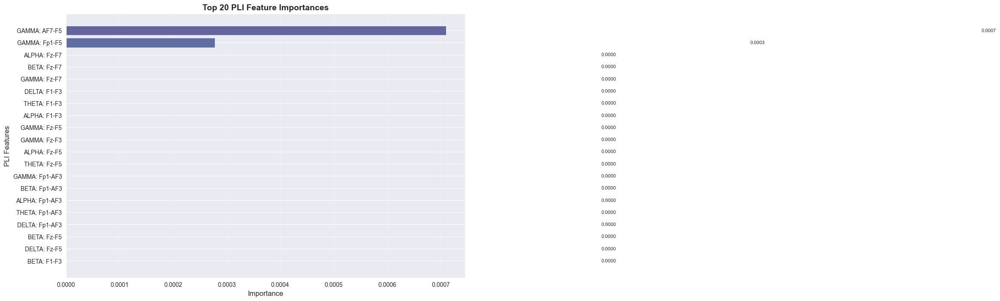


PLI Channels found: ['AF3', 'AF7', 'F1', 'F3', 'F5', 'F7', 'Fp1', 'Fz']
Number of channels: 8


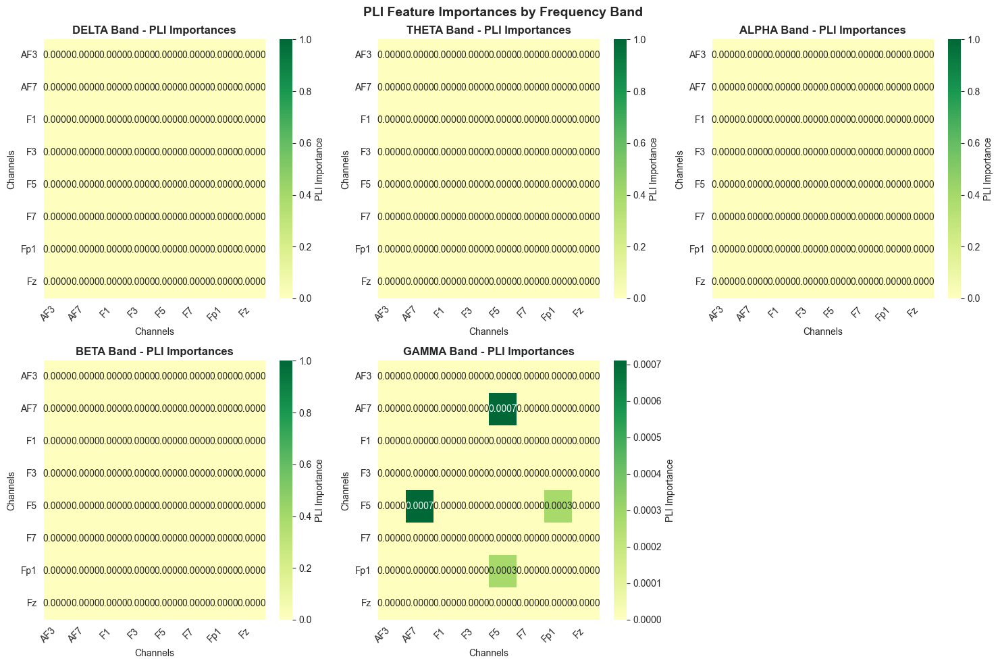

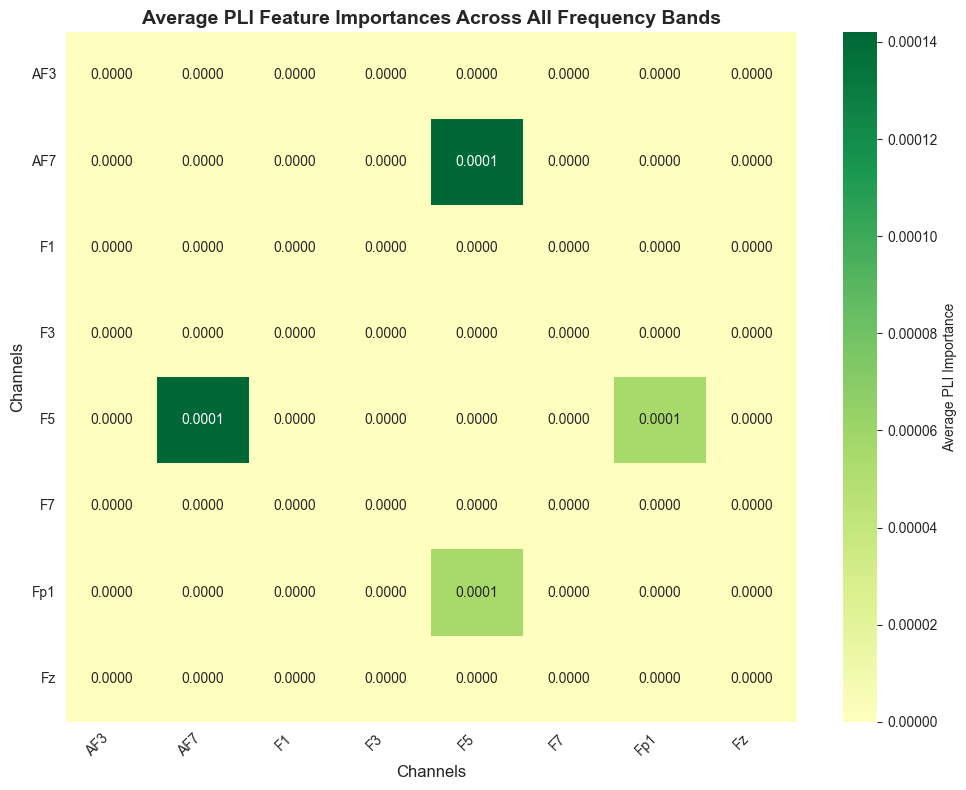

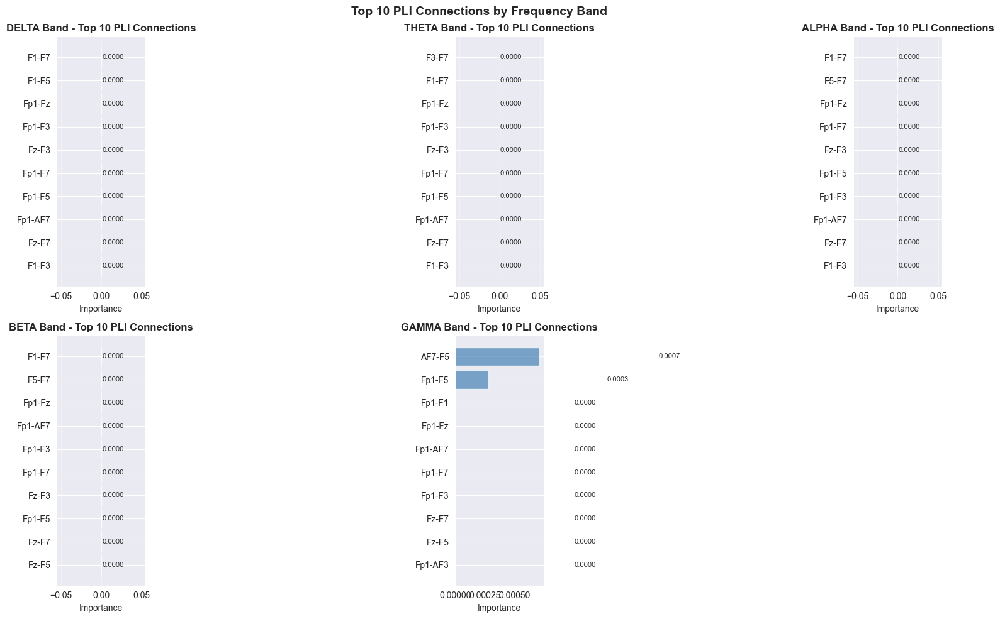

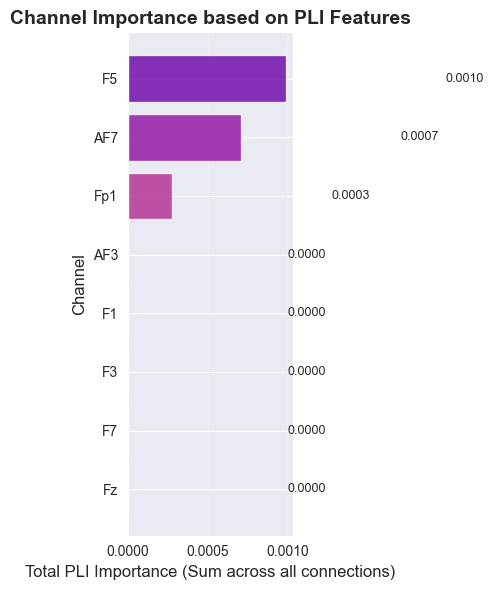

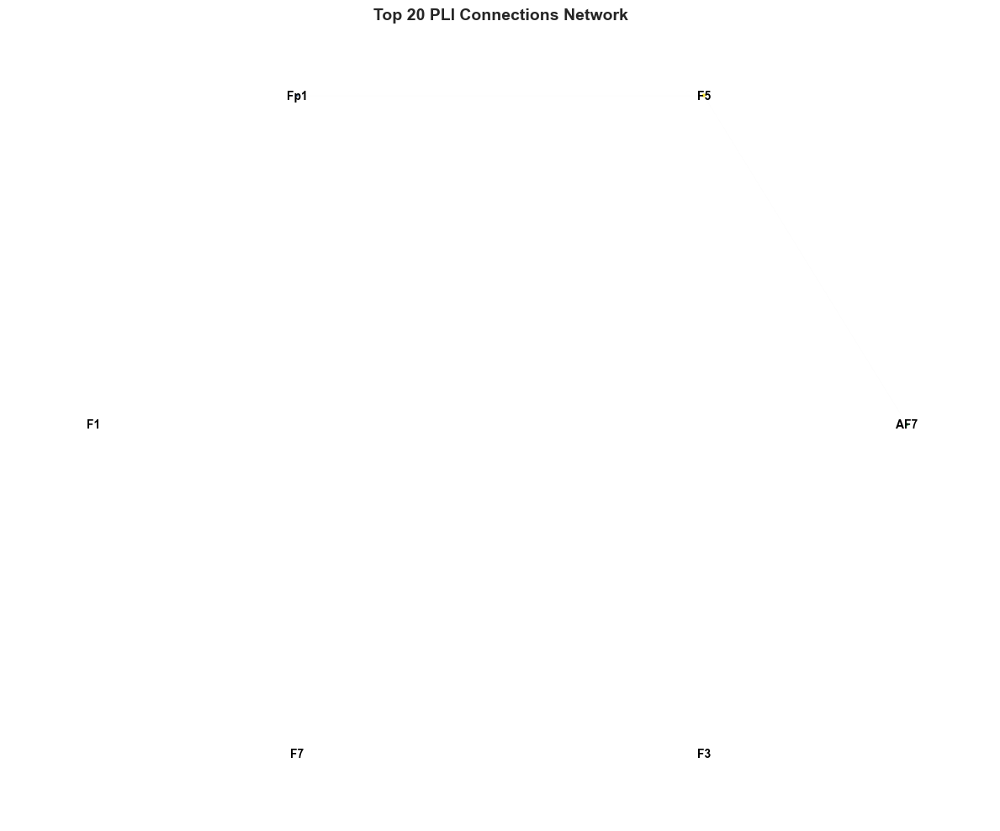


PLI FEATURE SUMMARY STATISTICS
Total PLI features: 140
Total PLI importance: 0.0010
Mean PLI importance: 0.0000
Std PLI importance: 0.0001
Max PLI importance: 0.0007
Min PLI importance: 0.0000

PLI importance by band:
  DELTA: 0.0000 (n=28)
  THETA: 0.0000 (n=28)
  ALPHA: 0.0000 (n=28)
  BETA: 0.0000 (n=28)
  GAMMA: 0.0010 (n=28)

Top 10 PLI connections overall:
  GAMMA  | AF7-F5              | 0.0007
  GAMMA  | Fp1-F5              | 0.0003
  BETA   | F1-F7              | 0.0000
  THETA  | F3-F7              | 0.0000
  ALPHA  | F1-F7              | 0.0000
  THETA  | F1-F7              | 0.0000
  GAMMA  | F1-F7              | 0.0000
  DELTA  | F1-F7              | 0.0000
  BETA   | F5-F7              | 0.0000
  THETA  | F1-F5              | 0.0000


In [106]:
# ============================================
# PLI FEATURE IMPORTANCE VISUALIZATIONS
# ============================================

# Extract PLI feature importances
pli_features = importance_df[importance_df['feature'].str.contains('pli_', na=False)]

if len(pli_features) > 0:
    print("\n" + "="*60)
    print(f"PLI FEATURE IMPORTANCES (Total: {len(pli_features)} features)")
    print("="*60)

    # Parse PLI features
    pli_data = []
    for _, row in pli_features.iterrows():
        feat_name = row['feature']
        importance = row['importance']

        # Parse: pli_{ch1}_{ch2}_{band}
        parts = feat_name.split('_')
        if len(parts) >= 4:
            ch1 = parts[1]
            ch2 = parts[2]
            band = parts[3]
            pli_data.append({
                'ch1': ch1,
                'ch2': ch2,
                'band': band,
                'importance': importance,
                'pair': f"{ch1}-{ch2}"
            })

    pli_df = pd.DataFrame(pli_data)

    # ============================================
    # 1. HORIZONTAL BARPLOT - Top PLI Features
    # ============================================
    fig, ax = plt.subplots(figsize=(12, 8))

    top_pli = pli_df.sort_values('importance', ascending=False).head(20)

    # Create labels
    top_pli['label'] = top_pli.apply(lambda x: f"{x['band'].upper()}: {x['ch1']}-{x['ch2']}", axis=1)

    colors = plt.cm.viridis(np.linspace(0.2, 0.9, len(top_pli)))
    bars = ax.barh(range(len(top_pli)), top_pli['importance'].values, color=colors, alpha=0.8)

    ax.set_yticks(range(len(top_pli)))
    ax.set_yticklabels(top_pli['label'].values)
    ax.set_xlabel('Importance', fontsize=12)
    ax.set_ylabel('PLI Features', fontsize=12)
    ax.set_title('Top 20 PLI Feature Importances', fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, axis='x')

    # Add value labels
    for i, (bar, val) in enumerate(zip(bars, top_pli['importance'].values)):
        ax.text(val + 0.001, bar.get_y() + bar.get_height()/2,
                f'{val:.4f}', va='center', fontsize=8)

    plt.tight_layout()
    plt.show()

    # ============================================
    # 2. HEATMAPS - PLI Importance by Band
    # ============================================
    # Get all unique channels from PLI features
    pli_channels = sorted(list(set(pli_df['ch1'].unique()) | set(pli_df['ch2'].unique())))
    n_pli_channels = len(pli_channels)
    band_names = list(bands.keys())

    print(f"\nPLI Channels found: {pli_channels}")
    print(f"Number of channels: {n_pli_channels}")

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()

    for idx, band in enumerate(band_names):
        band_pli = pli_df[pli_df['band'] == band]

        if len(band_pli) > 0:
            # Create adjacency matrix
            adj_matrix = np.zeros((n_pli_channels, n_pli_channels))
            for _, row in band_pli.iterrows():
                i = pli_channels.index(row['ch1'])
                j = pli_channels.index(row['ch2'])
                adj_matrix[i, j] = row['importance']
                adj_matrix[j, i] = row['importance']

            # Plot heatmap
            im = sns.heatmap(adj_matrix, annot=True, fmt='.4f', cmap='RdYlGn',
                            xticklabels=pli_channels, yticklabels=pli_channels,
                            ax=axes[idx], center=0, vmin=0, vmax=np.max(adj_matrix) if np.max(adj_matrix) > 0 else 1,
                            cbar_kws={'label': 'PLI Importance'})
            axes[idx].set_title(f'{band.upper()} Band - PLI Importances', fontsize=12, fontweight='bold')
        else:
            axes[idx].text(0.5, 0.5, f'No PLI features\nfor {band} band',
                          ha='center', va='center', transform=axes[idx].transAxes, fontsize=12)
            axes[idx].set_title(f'{band.upper()} Band', fontsize=12)

        axes[idx].set_xlabel('Channels', fontsize=10)
        axes[idx].set_ylabel('Channels', fontsize=10)
        plt.setp(axes[idx].xaxis.get_majorticklabels(), rotation=45, ha='right')
        plt.setp(axes[idx].yaxis.get_majorticklabels(), rotation=0)

    # Hide unused subplot (if 5 bands, we have 6 subplots)
    if len(band_names) < 6:
        axes[5].axis('off')

    plt.suptitle('PLI Feature Importances by Frequency Band', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # ============================================
    # 3. SUMMARY HEATMAP - Average PLI Importance Across Bands
    # ============================================
    fig, ax = plt.subplots(figsize=(10, 8))

    # Create average importance matrix across bands
    avg_matrix = np.zeros((n_pli_channels, n_pli_channels))
    count_matrix = np.zeros((n_pli_channels, n_pli_channels))

    for band in band_names:
        band_pli = pli_df[pli_df['band'] == band]
        for _, row in band_pli.iterrows():
            i = pli_channels.index(row['ch1'])
            j = pli_channels.index(row['ch2'])
            avg_matrix[i, j] += row['importance']
            avg_matrix[j, i] += row['importance']
            count_matrix[i, j] += 1
            count_matrix[j, i] += 1

    # Average (avoid division by zero)
    mask = count_matrix > 0
    avg_matrix[mask] /= count_matrix[mask]

    # Plot
    im = sns.heatmap(avg_matrix, annot=True, fmt='.4f', cmap='RdYlGn',
                    xticklabels=pli_channels, yticklabels=pli_channels,
                    ax=ax, center=0, vmin=0, vmax=np.max(avg_matrix) if np.max(avg_matrix) > 0 else 1,
                    cbar_kws={'label': 'Average PLI Importance'})
    ax.set_title('Average PLI Feature Importances Across All Frequency Bands', fontsize=14, fontweight='bold')
    ax.set_xlabel('Channels', fontsize=12)
    ax.set_ylabel('Channels', fontsize=12)
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')
    plt.setp(ax.yaxis.get_majorticklabels(), rotation=0)
    plt.tight_layout()
    plt.show()

    # ============================================
    # 4. BAND-SPECIFIC BARPLOTS - Top Connections per Band
    # ============================================
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()

    for idx, band in enumerate(band_names):
        band_pli = pli_df[pli_df['band'] == band].sort_values('importance', ascending=False).head(10)

        if len(band_pli) > 0:
            y_pos = range(len(band_pli))
            ax = axes[idx]

            bars = ax.barh(y_pos, band_pli['importance'].values, color='steelblue', alpha=0.7)
            ax.set_yticks(y_pos)
            ax.set_yticklabels(band_pli['pair'].values)
            ax.set_xlabel('Importance', fontsize=10)
            ax.set_title(f'{band.upper()} Band - Top 10 PLI Connections', fontsize=12, fontweight='bold')
            ax.invert_yaxis()
            ax.grid(True, alpha=0.3, axis='x')

            # Add value labels
            for i, (bar, val) in enumerate(zip(bars, band_pli['importance'].values)):
                ax.text(val + 0.001, bar.get_y() + bar.get_height()/2,
                       f'{val:.4f}', va='center', fontsize=8)
        else:
            axes[idx].text(0.5, 0.5, f'No PLI features\nfor {band} band',
                          ha='center', va='center', transform=axes[idx].transAxes, fontsize=12)
            axes[idx].set_title(f'{band.upper()} Band', fontsize=12)

    if len(band_names) < 6:
        axes[5].axis('off')

    plt.suptitle('Top 10 PLI Connections by Frequency Band', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # ============================================
    # 5. CHANNEL IMPORTANCE SUMMARY (PLI only)
    # ============================================
    # Calculate total PLI importance per channel
    channel_pli_importance = {}
    for ch in pli_channels:
        # Connections where this channel is involved
        ch_connections = pli_df[(pli_df['ch1'] == ch) | (pli_df['ch2'] == ch)]
        total_imp = ch_connections['importance'].sum()
        channel_pli_importance[ch] = total_imp

    channel_pli_df = pd.DataFrame(list(channel_pli_importance.items()),
                                   columns=['Channel', 'Total PLI Importance'])
    channel_pli_df = channel_pli_df.sort_values('Total PLI Importance', ascending=False)

    fig, ax = plt.subplots(figsize=(10, 6))
    colors = plt.cm.plasma(np.linspace(0.2, 0.9, len(channel_pli_df)))
    bars = ax.barh(range(len(channel_pli_df)), channel_pli_df['Total PLI Importance'].values, color=colors, alpha=0.8)
    ax.set_yticks(range(len(channel_pli_df)))
    ax.set_yticklabels(channel_pli_df['Channel'].values)
    ax.set_xlabel('Total PLI Importance (Sum across all connections)', fontsize=12)
    ax.set_ylabel('Channel', fontsize=12)
    ax.set_title('Channel Importance based on PLI Features', fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(True, alpha=0.3, axis='x')

    # Add value labels
    for i, (bar, val) in enumerate(zip(bars, channel_pli_df['Total PLI Importance'].values)):
        ax.text(val + 0.001, bar.get_y() + bar.get_height()/2,
               f'{val:.4f}', va='center', fontsize=9)

    plt.tight_layout()
    plt.show()

    # ============================================
    # 6. CIRCULAR/SPIDER PLOT OF TOP CONNECTIONS (Optional)
    # ============================================
    try:
        import networkx as nx

        # Create graph for top 20 PLI connections across all bands
        top_20_pli = pli_df.nlargest(20, 'importance')

        G = nx.Graph()
        for _, row in top_20_pli.iterrows():
            G.add_edge(row['ch1'], row['ch2'], weight=row['importance'], band=row['band'])

        if len(G.nodes()) > 0:
            fig, ax = plt.subplots(figsize=(12, 10))

            # Layout
            pos = nx.circular_layout(G)

            # Node sizes based on importance
            node_importance = {}
            for ch in G.nodes():
                ch_connections = top_20_pli[(top_20_pli['ch1'] == ch) | (top_20_pli['ch2'] == ch)]
                node_importance[ch] = ch_connections['importance'].sum()

            node_sizes = [node_importance.get(node, 0) * 5000 for node in G.nodes()]
            node_colors = [plt.cm.viridis(node_importance.get(node, 0) / max(node_importance.values()))
                          for node in G.nodes()]

            # Edge widths based on importance
            edge_widths = [G[u][v]['weight'] * 20 for u, v in G.edges()]

            # Draw
            nx.draw_networkx_nodes(G, pos, ax=ax, node_size=node_sizes, node_color=node_colors, alpha=0.8)
            nx.draw_networkx_edges(G, pos, ax=ax, width=edge_widths, alpha=0.5, edge_color='gray')
            nx.draw_networkx_labels(G, pos, ax=ax, font_size=10, font_weight='bold')

            ax.set_title('Top 20 PLI Connections Network', fontsize=14, fontweight='bold')
            ax.axis('off')
            plt.tight_layout()
            plt.show()
        else:
            print("\nNot enough nodes for network visualization")

    except ImportError:
        print("\nNetworkX not available for circular plot visualization")

    # ============================================
    # 7. PRINT SUMMARY STATISTICS
    # ============================================
    print("\n" + "="*60)
    print("PLI FEATURE SUMMARY STATISTICS")
    print("="*60)
    print(f"Total PLI features: {len(pli_features)}")
    print(f"Total PLI importance: {pli_features['importance'].sum():.4f}")
    print(f"Mean PLI importance: {pli_features['importance'].mean():.4f}")
    print(f"Std PLI importance: {pli_features['importance'].std():.4f}")
    print(f"Max PLI importance: {pli_features['importance'].max():.4f}")
    print(f"Min PLI importance: {pli_features['importance'].min():.4f}")

    print(f"\nPLI importance by band:")
    for band in band_names:
        band_sum = pli_df[pli_df['band'] == band]['importance'].sum()
        band_count = len(pli_df[pli_df['band'] == band])
        print(f"  {band.upper()}: {band_sum:.4f} (n={band_count})")

    print(f"\nTop 10 PLI connections overall:")
    for idx, row in pli_df.nlargest(10, 'importance').iterrows():
        print(f"  {row['band'].upper():6s} | {row['ch1']}-{row['ch2']:15s} | {row['importance']:.4f}")

else:
    print("\nNo PLI features found in the model. Check if PLI computation is working correctly.")

# some new feature visualizations

In [111]:
import numpy as np
from scipy.stats import entropy
from scipy.signal import welch, coherence, hilbert, filtfilt, butter
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from itertools import combinations
import mne
from scipy.linalg import svd
import warnings
warnings.filterwarnings('ignore')

# ============================================
# PARAMETERS
# ============================================
WINDOW_SEC = 0.25
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)
OVERLAP = 0

# For connectivity features, use longer windows
CONN_WINDOW_SEC = 1.0
CONN_WINDOW_LEN = int(CONN_WINDOW_SEC * TARGET_SFREQ)

# Define frequency bands
bands = {
    "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

# ============================================
# ADVANCED CONNECTIVITY AND COMPLEXITY FEATURES
# ============================================

def lempel_ziv_complexity(x):
    """
    Lempel-Ziv complexity - measures signal complexity/irregularity
    Higher values = more complex/random signal
    """
    # Binarize the signal
    threshold = np.mean(x)
    binary = (x > threshold).astype(int)

    n = len(binary)
    complexity = 1
    sub_strings = set()

    i = 0
    while i < n:
        found = False
        for j in range(i + 1, n + 1):
            substring = tuple(binary[i:j])
            if substring in sub_strings:
                found = True
            else:
                if found:
                    sub_strings.add(tuple(binary[i:j-1]))
                    complexity += 1
                    i = j - 1
                    break
                else:
                    sub_strings.add(substring)
                    i = j
                    break
        else:
            if not found:
                sub_strings.add(tuple(binary[i:]))
                if len(sub_strings) > 1:
                    complexity += 1
            break

    # Normalize
    max_complexity = n / np.log2(n) if n > 1 else 1
    return complexity / max_complexity if max_complexity > 0 else 0

def weighted_phase_lag_index(x, y):
    """
    Weighted Phase Lag Index (wPLI)
    Less sensitive to noise than PLI, weights by magnitude of imaginary component
    """
    # Hilbert transform for phase
    x_phase = np.angle(hilbert(x))
    y_phase = np.angle(hilbert(y))

    # Phase difference
    phase_diff = x_phase - y_phase

    # Cross-spectrum
    x_fft = np.fft.fft(x)
    y_fft = np.fft.fft(y)
    cross_spec = x_fft * np.conj(y_fft)

    # Imaginary part
    imag_cross = np.imag(cross_spec)

    # wPLI = |E(|imag| * sign(imag))| / E(|imag|)
    abs_imag = np.abs(imag_cross)
    sign_imag = np.sign(imag_cross)
    numerator = np.abs(np.mean(abs_imag * sign_imag))
    denominator = np.mean(abs_imag)

    if denominator == 0:
        return 0
    return numerator / denominator

def phase_locking_value(x, y):
    """
    Phase Locking Value (PLV) - captures both zero-lag and non-zero-lag synchronization
    More sensitive to task-related changes than PLI
    """
    x_phase = np.angle(hilbert(x))
    y_phase = np.angle(hilbert(y))

    phase_diff = x_phase - y_phase
    plv = np.abs(np.mean(np.exp(1j * phase_diff)))

    return plv

def imaginary_coherence(x, y, fs):
    """
    Imaginary Coherence (iCoh) - completely immune to volume conduction
    Computed from cross-spectral density
    """
    # Compute cross-spectral density
    freqs, Pxy = coherence(x, y, fs=fs, nperseg=min(len(x), fs))

    # Imaginary part only
    imag_coherence = np.imag(Pxy)

    # Average across frequencies
    return np.mean(np.abs(imag_coherence))

def partial_directed_coherence(x, y, z=None, fs=250):
    """
    Partial Directed Coherence (PDC) - directional connectivity
    Simplified bivariate version
    """
    from scipy.signal import periodogram

    # Compute autoregressive model (order 5)
    order = min(5, len(x) // 10)

    # Build AR coefficient matrix (simplified)
    x_corr = np.correlate(x, x, mode='full') / len(x)
    y_corr = np.correlate(y, y, mode='full') / len(x)
    xy_corr = np.correlate(x, y, mode='full') / len(x)

    # Frequency domain
    freqs = np.fft.fftfreq(len(x), 1/fs)
    positive_idx = freqs > 0

    # AIC for order selection (simplified)
    # For now, compute PDC in theta/alpha bands
    pdc_values = {}

    for band_name, (low, high) in bands.items():
        # Filter to band
        nyquist = fs / 2
        b, a = butter(4, [low/nyquist, high/nyquist], btype='band')
        x_filtered = filtfilt(b, a, x)
        y_filtered = filtfilt(b, a, y)

        # Compute cross-spectrum
        f, Pxx = periodogram(x_filtered, fs)
        f, Pyy = periodogram(y_filtered, fs)
        f, Pxy = periodogram(x_filtered + 1j*y_filtered, fs)

        # Simplified PDC in band
        band_mask = (f >= low) & (f <= high)
        if np.any(band_mask):
            pdc_val = np.mean(np.abs(Pxy[band_mask]) / (np.abs(Pxx[band_mask]) + np.abs(Pyy[band_mask]) + 1e-10))
            pdc_values[band_name] = pdc_val
        else:
            pdc_values[band_name] = np.nan

    return pdc_values

def granger_causality(x, y, max_lag=5):
    """
    Granger Causality (GC) - predictive information flow
    Tests whether past values of y help predict future values of x
    """
    from scipy.linalg import lstsq

    n = min(len(x), len(y))
    x = x[:n]
    y = y[:n]

    # Build lag matrices
    X_lags = np.zeros((n - max_lag, max_lag))
    Y_lags = np.zeros((n - max_lag, max_lag))

    for lag in range(1, max_lag + 1):
        X_lags[:, lag-1] = x[max_lag - lag:n - lag]
        Y_lags[:, lag-1] = y[max_lag - lag:n - lag]

    # Current values
    X_current = x[max_lag:]

    # Model 1: X predicted from past X only
    coeffs1, _, _, _ = lstsq(X_lags, X_current)
    resid1 = X_current - X_lags @ coeffs1
    var1 = np.var(resid1)

    # Model 2: X predicted from past X and past Y
    combined_lags = np.hstack([X_lags, Y_lags])
    coeffs2, _, _, _ = lstsq(combined_lags, X_current)
    resid2 = X_current - combined_lags @ coeffs2
    var2 = np.var(resid2)

    # Granger causality statistic
    if var2 > 0:
        gc = np.log(var1 / var2)
    else:
        gc = 0

    return max(0, gc)

def mutual_information(x, y, bins=10):
    """
    Mutual Information (MI) - non-linear dependencies
    Measures shared information between signals
    """
    # Discretize
    x_discrete = np.digitize(x, np.percentile(x, np.linspace(0, 100, bins+1)[1:-1]))
    y_discrete = np.digitize(y, np.percentile(y, np.linspace(0, 100, bins+1)[1:-1]))

    # Joint distribution
    joint = np.histogram2d(x_discrete, y_discrete, bins=bins)[0]
    joint = joint / joint.sum()

    # Marginal distributions
    px = joint.sum(axis=1)
    py = joint.sum(axis=0)

    # Mutual information
    mi = 0
    for i in range(bins):
        for j in range(bins):
            if joint[i, j] > 0:
                mi += joint[i, j] * np.log2(joint[i, j] / (px[i] * py[j] + 1e-10))

    return mi

def cross_frequency_coupling(x, fs, low_band='theta', high_band='gamma'):
    """
    Cross-Frequency Coupling (CFC) - phase-amplitude coupling
    Modulatory influence of low-frequency phase on high-frequency amplitude
    """
    # Get band ranges
    low_range = bands[low_band]
    high_range = bands[high_band]

    # Filter low frequency (phase)
    nyquist = fs / 2
    b_low, a_low = butter(4, [low_range[0]/nyquist, low_range[1]/nyquist], btype='band')
    low_filtered = filtfilt(b_low, a_low, x)
    phase = np.angle(hilbert(low_filtered))

    # Filter high frequency (amplitude)
    b_high, a_high = butter(4, [high_range[0]/nyquist, high_range[1]/nyquist], btype='band')
    high_filtered = filtfilt(b_high, a_high, x)
    amplitude = np.abs(hilbert(high_filtered))

    # Modulation index (Tort method)
    n_bins = 18
    phase_bins = np.linspace(-np.pi, np.pi, n_bins + 1)
    mean_amp = np.zeros(n_bins)

    for i in range(n_bins):
        mask = (phase >= phase_bins[i]) & (phase < phase_bins[i+1])
        if np.any(mask):
            mean_amp[i] = np.mean(amplitude[mask])

    # Normalize
    mean_amp = mean_amp / (np.sum(mean_amp) + 1e-10)

    # KL divergence from uniform
    uniform = np.ones(n_bins) / n_bins
    mi = entropy(mean_amp + 1e-10, uniform + 1e-10)

    # Modulation index
    mi = mi / np.log(n_bins)

    return mi

def band_specific_plv(x, y, fs, bands):
    """Band-specific Phase Locking Value"""
    plv_by_band = {}

    for band_name, (low, high) in bands.items():
        nyquist = fs / 2
        b, a = butter(4, [low/nyquist, high/nyquist], btype='band')

        x_filtered = filtfilt(b, a, x)
        y_filtered = filtfilt(b, a, y)

        plv_val = phase_locking_value(x_filtered, y_filtered)
        plv_by_band[band_name] = plv_val

    return plv_by_band

def band_specific_wpli(x, y, fs, bands):
    """Band-specific Weighted Phase Lag Index"""
    wpli_by_band = {}

    for band_name, (low, high) in bands.items():
        nyquist = fs / 2
        b, a = butter(4, [low/nyquist, high/nyquist], btype='band')

        x_filtered = filtfilt(b, a, x)
        y_filtered = filtfilt(b, a, y)

        wpli_val = weighted_phase_lag_index(x_filtered, y_filtered)
        wpli_by_band[band_name] = wpli_val

    return wpli_by_band

def extract_advanced_features_from_window(data_chunk, ch_names, fs, bands):
    """Extract all advanced features including wPLI, PLV, iCoh, PDC, GC, MI, LZC, CFC"""
    n_channels = len(ch_names)
    features = {}

    # Per-channel features (keep existing)
    for ch_idx, ch_name in enumerate(ch_names):
        x = data_chunk[ch_idx]

        # Lempel-Ziv complexity
        lzc = lempel_ziv_complexity(x)
        features[f'{ch_name}_lempel_ziv_complexity'] = lzc

        # Cross-frequency coupling (for each channel)
        if len(x) >= fs * 2:  # Need at least 2 seconds
            try:
                cfc_tg = cross_frequency_coupling(x, fs, 'theta', 'gamma')
                cfc_ag = cross_frequency_coupling(x, fs, 'alpha', 'gamma')
                features[f'{ch_name}_cfc_theta_gamma'] = cfc_tg
                features[f'{ch_name}_cfc_alpha_gamma'] = cfc_ag
            except:
                features[f'{ch_name}_cfc_theta_gamma'] = np.nan
                features[f'{ch_name}_cfc_alpha_gamma'] = np.nan

    # Pairwise connectivity features (limit to first 8 channels)
    n_connectivity_channels = min(n_channels, 8)
    connectivity_ch_names = ch_names[:n_connectivity_channels]

    for ch1_idx, ch2_idx in combinations(range(n_connectivity_channels), 2):
        ch1_name = connectivity_ch_names[ch1_idx]
        ch2_name = connectivity_ch_names[ch2_idx]

        x = data_chunk[ch1_idx]
        y = data_chunk[ch2_idx]

        # Use full signal (not filtered) for some metrics
        # wPLI (band-specific)
        wpli_bands = band_specific_wpli(x, y, fs, bands)
        for band_name, val in wpli_bands.items():
            features[f'wpli_{ch1_name}_{ch2_name}_{band_name}'] = val

        # PLV (band-specific)
        plv_bands = band_specific_plv(x, y, fs, bands)
        for band_name, val in plv_bands.items():
            features[f'plv_{ch1_name}_{ch2_name}_{band_name}'] = val

        # Imaginary Coherence (single value per pair)
        icoh_val = imaginary_coherence(x, y, fs)
        features[f'icoh_{ch1_name}_{ch2_name}'] = icoh_val

        # Partial Directed Coherence (band-specific)
        try:
            pdc_bands = partial_directed_coherence(x, y, None, fs)
            for band_name, val in pdc_bands.items():
                if not np.isnan(val):
                    features[f'pdc_{ch1_name}_{ch2_name}_{band_name}'] = val
        except:
            pass

        # Granger Causality (bidirectional)
        gc_xy = granger_causality(x, y)
        gc_yx = granger_causality(y, x)
        features[f'gc_{ch1_name}_to_{ch2_name}'] = gc_xy
        features[f'gc_{ch2_name}_to_{ch1_name}'] = gc_yx

        # Mutual Information
        mi_val = mutual_information(x, y)
        features[f'mi_{ch1_name}_{ch2_name}'] = mi_val

    return features

# ============================================
# MODIFIED FEATURE EXTRACTION PIPELINE
# ============================================

def load_signal_all_channels(file, verbose=False):
    """Load all channels from a BrainVision file"""
    try:
        raw = mne.io.read_raw_brainvision(file, preload=True, verbose=verbose)

        if raw.info["bads"]:
            raw.drop_channels(raw.info["bads"])

        raw.notch_filter(50, verbose=verbose)
        raw.filter(1, 40, verbose=verbose)
        raw.resample(TARGET_SFREQ, verbose=verbose)

        data = raw.get_data()

        if np.any(np.std(data, axis=1) < 1e-10):
            return None, None

        ch_names = raw.ch_names

        return data, ch_names

    except Exception as e:
        if verbose:
            print(f"Error loading {file}: {e}")
        return None, None

In [112]:
rest_stats = {}
task_stats = {}

rest_signals = {}
task_signals = {}

FLAT_STD_THRESH = 1e-6
FLAT_RANGE_THRESH = 1e-5


def is_bad_signal(x):
    if x is None:
        return True
    if not np.all(np.isfinite(x)):
        return True
    if np.std(x) < FLAT_STD_THRESH:
        return True
    if (np.max(x) - np.min(x)) < FLAT_RANGE_THRESH:
        return True
    return False


valid_subjects = []

for subj in subjects:

    # --------------------
    # LOAD REST (take all rest files)
    # --------------------
    if subj not in rest_files or len(rest_files[subj]) == 0:
        continue

    # Process each rest file separately or combine? Here taking first
    x_rest = load_signal(rest_files[subj][0], CHANNEL)  # CHANGED: [0] added

    if is_bad_signal(x_rest):
        continue

    freqs_r, psd_r = welch(x_rest, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)

    if np.sum(psd_r) <= 0 or not np.all(np.isfinite(psd_r)):
        continue

    # --------------------
    # LOAD ALL TASK FILES
    # --------------------
    if subj not in task_files or len(task_files[subj]) == 0:  # CHANGED: check length
        continue

    # NEW: Loop through all task files
    for task_idx, task_file in enumerate(task_files[subj]):  # CHANGED: added loop
        x_task = load_signal(task_file, CHANNEL)

        if is_bad_signal(x_task):
            continue

        freqs_t, psd_t = welch(x_task, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)

        if np.sum(psd_t) <= 0 or not np.all(np.isfinite(psd_t)):
            continue

        # --------------------
        # Compute Hjorth features
        # --------------------
        hjorth_rest = hjorth_all(x_rest)
        hjorth_task = hjorth_all(x_task)

        # --------------------
        # Compute band powers (normalized and unnormalized)
        # --------------------
        bands_rest_raw = {k: bandpower(psd_r, freqs_r, v) for k, v in bands.items()}
        total_power_rest = sum(bands_rest_raw.values())
        bands_rest_norm = {k: v / total_power_rest if total_power_rest > 0 else np.nan
                           for k, v in bands_rest_raw.items()}

        bands_task_raw = {k: bandpower(psd_t, freqs_t, v) for k, v in bands.items()}
        total_power_task = sum(bands_task_raw.values())
        bands_task_norm = {k: v / total_power_task if total_power_task > 0 else np.nan
                           for k, v in bands_task_raw.items()}

        # --------------------
        # Store task with unique key (NEW)
        # --------------------
        task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]  # NEW
        task_key = f"{subj}_{task_name}"  # NEW

        task_stats[task_key] = {  # CHANGED: task_key instead of subj
            "freqs": freqs_t,
            "psd": psd_t,

            # Spectral features
            "entropy": spectral_entropy(psd_t),
            "complexity": spectral_complexity(psd_t),
            "complexity_alt": spectral_complexity_alternative(psd_t, freqs_t),

            # Hjorth features (raw + log activity)
            "hjorth_activity": hjorth_task["activity"],
            "hjorth_log_activity": hjorth_task["log_activity"],
            "hjorth_mobility": hjorth_task["mobility"],
            "hjorth_complexity": hjorth_task["complexity"],

            # Band powers (raw and normalized)
            "bands_raw": bands_task_raw,
            "bands_norm": bands_task_norm,
            "total_power": total_power_task,
        }

        task_signals[task_key] = x_task  # CHANGED: task_key instead of subj

    # --------------------
    # Store rest (once per subject)
    # --------------------
    rest_stats[subj] = {
        "freqs": freqs_r,
        "psd": psd_r,

        # Spectral features
        "entropy": spectral_entropy(psd_r),
        "complexity": spectral_complexity(psd_r),
        "complexity_alt": spectral_complexity_alternative(psd_r, freqs_r),

        # Hjorth features (raw + log activity)
        "hjorth_activity": hjorth_rest["activity"],
        "hjorth_log_activity": hjorth_rest["log_activity"],
        "hjorth_mobility": hjorth_rest["mobility"],
        "hjorth_complexity": hjorth_rest["complexity"],

        # Band powers (raw and normalized)
        "bands_raw": bands_rest_raw,
        "bands_norm": bands_rest_norm,
        "total_power": total_power_rest,
    }

    rest_signals[subj] = x_rest
    valid_subjects.append(subj)


print("VALID subjects:", len(valid_subjects))
print("REST kept:", len(rest_stats))
print("TASK kept:", len(task_stats))

VALID subjects: 10
REST kept: 10
TASK kept: 30


Using channel: Pz
Number of subjects with rest: 10
Number of task conditions: 30

Rest samples: 10
Task samples: 30
Unique subjects in rest: 10
Unique subjects in task: 10
Common subjects: 10


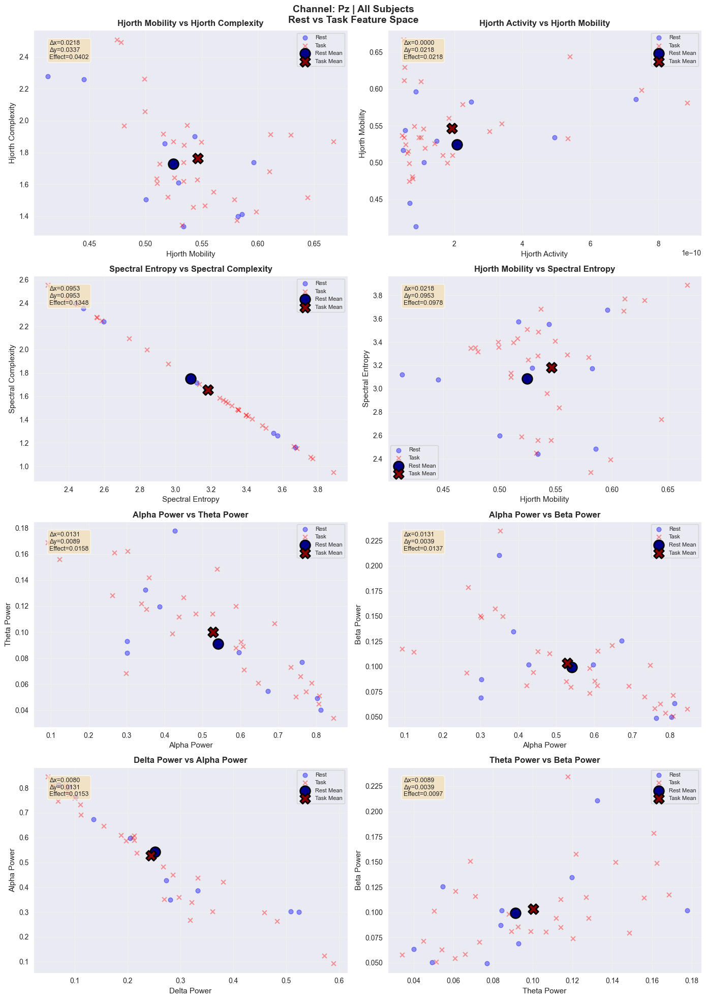

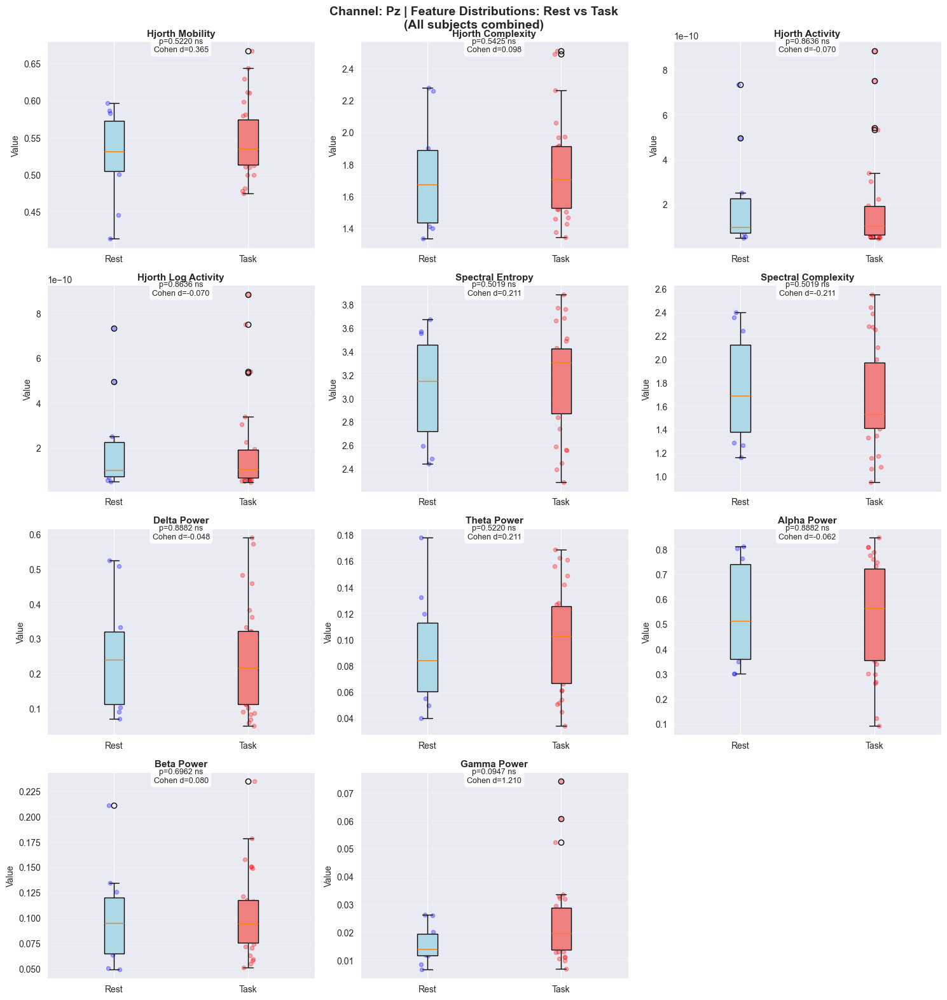

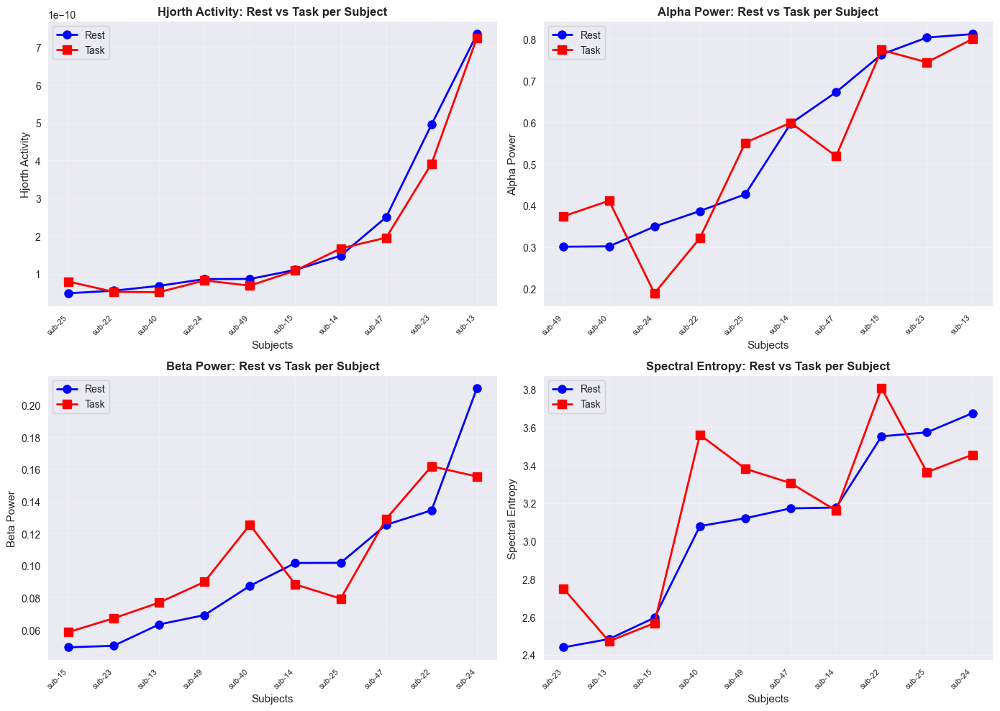

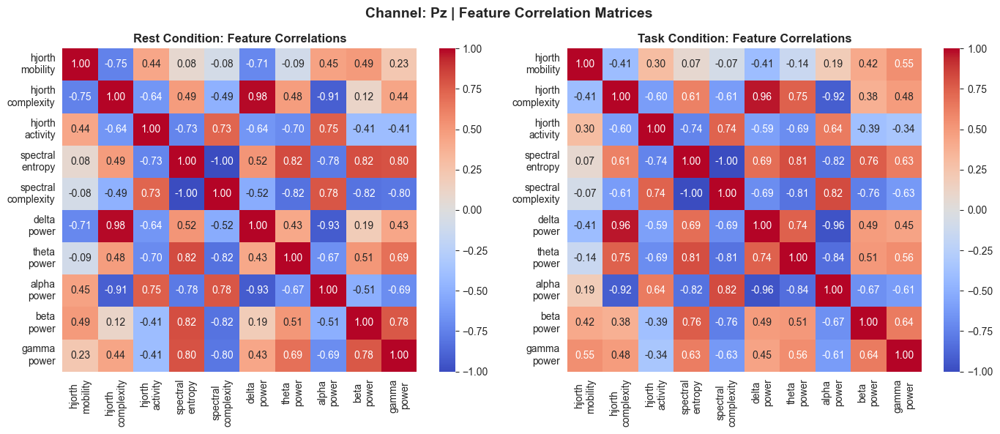


FEATURE STATISTICS FOR CHANNEL: Pz (All subjects combined)
Feature                           Rest Mean    Task Mean   Difference      p-value     Effect
--------------------------------------------------------------------------------
Hjorth Mobility                      0.5247       0.5465      +0.0218       0.5220     0.399
Hjorth Complexity                    1.7293       1.7630      +0.0337       0.5425     0.105
Hjorth Activity                      0.0000       0.0000      -0.0000       0.8636    -0.072
Hjorth Log Activity                  0.0000       0.0000      -0.0000       0.8636    -0.072
Spectral Entropy                     3.0866       3.1820      +0.0953       0.5019     0.213
Spectral Complexity                  1.7497       1.6543      -0.0953       0.5019    -0.213
Delta Power                          0.2524       0.2444      -0.0080       0.8882    -0.051
Theta Power                          0.0912       0.1001      +0.0089       0.5220     0.219
Alpha Power          

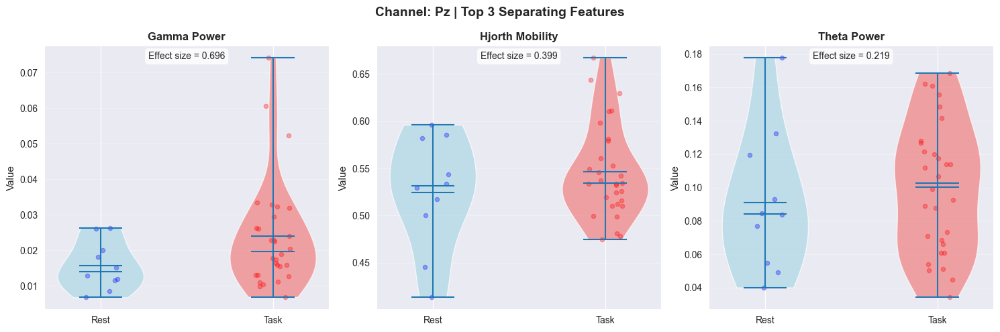

In [114]:
# ============================================
# SINGLE SUBJECT, SINGLE CHANNEL FEATURE SPACE VISUALIZATION
# Using existing rest_stats and task_stats with Pz channel
# ============================================

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import mannwhitneyu, entropy
from scipy.signal import welch

# ============================================
# USE EXISTING DATA STRUCTURES
# ============================================

# Define channel to use
TARGET_CHANNEL = "Pz"  # Change to your channel of interest

print(f"Using channel: {TARGET_CHANNEL}")
print(f"Number of subjects with rest: {len(rest_stats)}")
print(f"Number of task conditions: {len(task_stats)}")

# ============================================
# COLLECT FEATURES FOR EACH SUBJECT
# ============================================

# Store features per condition
all_rest_features = []
all_task_features = []
subject_rest_features = {}
subject_task_features = {}

# Process rest data
for subj in rest_stats.keys():
    # Get existing features from rest_stats
    rest_data = rest_stats[subj]

    features = {
        'subject': subj,
        'hjorth_mobility': rest_data['hjorth_mobility'],
        'hjorth_complexity': rest_data['hjorth_complexity'],
        'hjorth_activity': rest_data['hjorth_activity'],
        'hjorth_log_activity': rest_data['hjorth_log_activity'],
        'spectral_entropy': rest_data['entropy'],
        'spectral_complexity': rest_data['complexity'],
    }

    # Add band powers
    for band_name, power in rest_data['bands_norm'].items():
        features[f'{band_name}_power'] = power

    all_rest_features.append(features)
    subject_rest_features[subj] = features

# Process task data
for task_key in task_stats.keys():
    task_data = task_stats[task_key]
    subj = task_key.split('_')[0]

    features = {
        'subject': subj,
        'task_name': '_'.join(task_key.split('_')[1:]),
        'hjorth_mobility': task_data['hjorth_mobility'],
        'hjorth_complexity': task_data['hjorth_complexity'],
        'hjorth_activity': task_data['hjorth_activity'],
        'hjorth_log_activity': task_data['hjorth_log_activity'],
        'spectral_entropy': task_data['entropy'],
        'spectral_complexity': task_data['complexity'],
    }

    # Add band powers
    for band_name, power in task_data['bands_norm'].items():
        features[f'{band_name}_power'] = power

    all_task_features.append(features)

    if subj not in subject_task_features:
        subject_task_features[subj] = []
    subject_task_features[subj].append(features)

# Convert to DataFrames for easy manipulation
rest_df = pd.DataFrame(all_rest_features)
task_df = pd.DataFrame(all_task_features)

print(f"\nRest samples: {len(rest_df)}")
print(f"Task samples: {len(task_df)}")
print(f"Unique subjects in rest: {rest_df['subject'].nunique()}")
print(f"Unique subjects in task: {task_df['subject'].nunique()}")

# Find common subjects
common_subjects = set(rest_df['subject'].unique()) & set(task_df['subject'].unique())
print(f"Common subjects: {len(common_subjects)}")

# ============================================
# VISUALIZATION 1: SCATTER PLOTS (All subjects)
# ============================================

# Define feature pairs to visualize
feature_pairs = [
    ('hjorth_mobility', 'hjorth_complexity', 'Hjorth Mobility', 'Hjorth Complexity'),
    ('hjorth_activity', 'hjorth_mobility', 'Hjorth Activity', 'Hjorth Mobility'),
    ('spectral_entropy', 'spectral_complexity', 'Spectral Entropy', 'Spectral Complexity'),
    ('hjorth_mobility', 'spectral_entropy', 'Hjorth Mobility', 'Spectral Entropy'),
    ('alpha_power', 'theta_power', 'Alpha Power', 'Theta Power'),
    ('alpha_power', 'beta_power', 'Alpha Power', 'Beta Power'),
    ('delta_power', 'alpha_power', 'Delta Power', 'Alpha Power'),
    ('theta_power', 'beta_power', 'Theta Power', 'Beta Power'),
]

n_plots = len(feature_pairs)
n_cols = 2
n_rows = (n_plots + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows))
axes = axes.flatten()

colors = plt.cm.tab10(np.linspace(0, 1, len(common_subjects)))

for idx, (x_feat, y_feat, x_label, y_label) in enumerate(feature_pairs):
    ax = axes[idx]

    # Plot all rest points (blue)
    ax.scatter(rest_df[x_feat], rest_df[y_feat],
               color='blue', marker='o', alpha=0.4, s=40, label='Rest')

    # Plot all task points (red)
    ax.scatter(task_df[x_feat], task_df[y_feat],
               color='red', marker='x', alpha=0.4, s=40, label='Task')

    # Plot means
    rest_mean_x = rest_df[x_feat].mean()
    rest_mean_y = rest_df[y_feat].mean()
    task_mean_x = task_df[x_feat].mean()
    task_mean_y = task_df[y_feat].mean()

    ax.scatter(rest_mean_x, rest_mean_y, color='darkblue', marker='o', s=200,
               edgecolor='black', linewidth=2, zorder=5, label='Rest Mean')
    ax.scatter(task_mean_x, task_mean_y, color='darkred', marker='X', s=200,
               edgecolor='black', linewidth=2, zorder=5, label='Task Mean')

    # Add separation info
    x_diff = abs(rest_mean_x - task_mean_x)
    y_diff = abs(rest_mean_y - task_mean_y)
    effect_size = np.sqrt(x_diff**2 + y_diff**2)

    ax.text(0.05, 0.95, f'Δx={x_diff:.4f}\nΔy={y_diff:.4f}\nEffect={effect_size:.4f}',
            transform=ax.transAxes, fontsize=9, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))

    ax.set_xlabel(x_label, fontsize=11)
    ax.set_ylabel(y_label, fontsize=11)
    ax.set_title(f'{x_label} vs {y_label}', fontsize=12, fontweight='bold')
    ax.legend(loc='best', fontsize=8)
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(len(feature_pairs), len(axes)):
    axes[idx].axis('off')

plt.suptitle(f'Channel: {TARGET_CHANNEL} | All Subjects\nRest vs Task Feature Space',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ============================================
# VISUALIZATION 2: BOXPLOTS FOR INDIVIDUAL FEATURES
# ============================================

# Select features to visualize
individual_features = [
    'hjorth_mobility', 'hjorth_complexity', 'hjorth_activity', 'hjorth_log_activity',
    'spectral_entropy', 'spectral_complexity',
    'delta_power', 'theta_power', 'alpha_power', 'beta_power', 'gamma_power'
]

n_features = len(individual_features)
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
axes = axes.flatten()

for idx, feat_name in enumerate(individual_features):
    ax = axes[idx]

    rest_vals = rest_df[feat_name].dropna()
    task_vals = task_df[feat_name].dropna()

    # Create boxplot
    bp = ax.boxplot([rest_vals, task_vals], labels=['Rest', 'Task'], patch_artist=True)
    bp['boxes'][0].set_facecolor('lightblue')
    bp['boxes'][1].set_facecolor('lightcoral')

    # Add individual points (jittered)
    jitter = 0.05
    x_rest = np.ones(len(rest_vals)) + np.random.uniform(-jitter, jitter, len(rest_vals))
    x_task = np.ones(len(task_vals)) * 2 + np.random.uniform(-jitter, jitter, len(task_vals))

    ax.scatter(x_rest, rest_vals, color='blue', alpha=0.3, s=20)
    ax.scatter(x_task, task_vals, color='red', alpha=0.3, s=20)

    ax.set_ylabel('Value', fontsize=10)
    ax.set_title(feat_name.replace('_', ' ').title(), fontsize=11, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='y')

    # Add p-value and effect size
    try:
        stat, p_val = mannwhitneyu(rest_vals, task_vals)
        effect = (task_vals.mean() - rest_vals.mean()) / rest_vals.std() if rest_vals.std() > 0 else 0

        p_text = f'p={p_val:.4f}' if p_val >= 0.0001 else 'p<0.0001'
        sig = '***' if p_val < 0.001 else '**' if p_val < 0.01 else '*' if p_val < 0.05 else 'ns'

        ax.text(0.5, 0.95, f'{p_text} {sig}\nCohen d={effect:.3f}',
                transform=ax.transAxes, ha='center', fontsize=9,
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    except:
        pass

# Hide unused subplots
for idx in range(len(individual_features), len(axes)):
    axes[idx].axis('off')

plt.suptitle(f'Channel: {TARGET_CHANNEL} | Feature Distributions: Rest vs Task\n(All subjects combined)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ============================================
# VISUALIZATION 3: PER-SUBJECT LINE PLOTS
# ============================================

# Select top features that show separation
top_features = ['hjorth_activity', 'alpha_power', 'beta_power', 'spectral_entropy']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for idx, feat_name in enumerate(top_features):
    ax = axes[idx]

    # Collect per-subject means
    subjects = []
    rest_means = []
    task_means = []

    for subj in common_subjects:
        # Get rest value for this subject
        rest_val = rest_df[rest_df['subject'] == subj][feat_name].values
        if len(rest_val) > 0:
            # Get task values for this subject (average if multiple tasks)
            task_vals = task_df[task_df['subject'] == subj][feat_name].values
            if len(task_vals) > 0:
                subjects.append(subj)
                rest_means.append(rest_val[0])
                task_means.append(np.mean(task_vals))

    # Sort by rest value
    sorted_idx = np.argsort(rest_means)
    subjects_sorted = [subjects[i] for i in sorted_idx]
    rest_sorted = [rest_means[i] for i in sorted_idx]
    task_sorted = [task_means[i] for i in sorted_idx]

    # Plot
    x_pos = range(len(subjects_sorted))
    ax.plot(x_pos, rest_sorted, 'o-', color='blue', label='Rest', linewidth=2, markersize=8)
    ax.plot(x_pos, task_sorted, 's-', color='red', label='Task', linewidth=2, markersize=8)

    ax.set_xlabel('Subjects', fontsize=11)
    ax.set_ylabel(feat_name.replace('_', ' ').title(), fontsize=11)
    ax.set_title(f'{feat_name.replace("_", " ").title()}: Rest vs Task per Subject', fontsize=12, fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Add subject labels for extreme values
    ax.set_xticks(x_pos[::max(1, len(x_pos)//10)])
    ax.set_xticklabels([subjects_sorted[i] for i in range(0, len(subjects_sorted), max(1, len(subjects_sorted)//10))],
                       rotation=45, ha='right', fontsize=8)

plt.tight_layout()
plt.show()

# ============================================
# VISUALIZATION 4: CORRELATION HEATMAPS
# ============================================

# Features for correlation
corr_features = ['hjorth_mobility', 'hjorth_complexity', 'hjorth_activity',
                 'spectral_entropy', 'spectral_complexity',
                 'delta_power', 'theta_power', 'alpha_power', 'beta_power', 'gamma_power']

# Rest correlation
rest_corr = rest_df[corr_features].corr()

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Rest correlation
sns.heatmap(rest_corr, annot=True, fmt='.2f', cmap='coolwarm', center=0,
            xticklabels=[f.replace('_', '\n') for f in corr_features],
            yticklabels=[f.replace('_', '\n') for f in corr_features],
            ax=axes[0])
axes[0].set_title('Rest Condition: Feature Correlations', fontsize=12, fontweight='bold')

# Task correlation
task_corr = task_df[corr_features].corr()
sns.heatmap(task_corr, annot=True, fmt='.2f', cmap='coolwarm', center=0,
            xticklabels=[f.replace('_', '\n') for f in corr_features],
            yticklabels=[f.replace('_', '\n') for f in corr_features],
            ax=axes[1])
axes[1].set_title('Task Condition: Feature Correlations', fontsize=12, fontweight='bold')

plt.suptitle(f'Channel: {TARGET_CHANNEL} | Feature Correlation Matrices', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ============================================
# STATISTICAL SUMMARY TABLE
# ============================================

print("\n" + "="*80)
print(f"FEATURE STATISTICS FOR CHANNEL: {TARGET_CHANNEL} (All subjects combined)")
print("="*80)
print(f"{'Feature':<30s} {'Rest Mean':>12s} {'Task Mean':>12s} {'Difference':>12s} {'p-value':>12s} {'Effect':>10s}")
print("-"*80)

results = []
for feat_name in individual_features:
    rest_vals = rest_df[feat_name].dropna()
    task_vals = task_df[feat_name].dropna()

    if len(rest_vals) > 0 and len(task_vals) > 0:
        rest_mean = rest_vals.mean()
        task_mean = task_vals.mean()
        diff = task_mean - rest_mean

        # Cohen's d effect size
        pooled_std = np.sqrt((rest_vals.std()**2 + task_vals.std()**2) / 2)
        effect = diff / pooled_std if pooled_std > 0 else 0

        try:
            stat, p_val = mannwhitneyu(rest_vals, task_vals)
            p_str = f'{p_val:.4f}' if p_val >= 0.0001 else '<0.0001'
            sig = '***' if p_val < 0.001 else '**' if p_val < 0.01 else '*' if p_val < 0.05 else ''
        except:
            p_str = 'N/A'
            sig = ''

        print(f"{feat_name.replace('_', ' ').title():<30s} {rest_mean:12.4f} {task_mean:12.4f} {diff:+12.4f} {p_str:>12s} {effect:>9.3f}{sig}")
        results.append({'feature': feat_name, 'effect': abs(effect), 'p': p_val if p_str != 'N/A' else 1})

print("="*80)

# Best separating features
print("\n" + "="*80)
print("BEST SEPARATING FEATURES (largest effect size)")
print("="*80)

results_sorted = sorted(results, key=lambda x: x['effect'], reverse=True)
for r in results_sorted[:10]:
    sig_star = ''
    if r['p'] < 0.001:
        sig_star = ' ***'
    elif r['p'] < 0.01:
        sig_star = ' **'
    elif r['p'] < 0.05:
        sig_star = ' *'
    print(f"  {r['feature'].replace('_', ' ').title():30s}: effect size = {r['effect']:.4f}{sig_star}")

# ============================================
# VIOLIN PLOT FOR TOP 3 FEATURES
# ============================================

top3_features = [r['feature'] for r in results_sorted[:3]]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for idx, feat_name in enumerate(top3_features):
    ax = axes[idx]

    rest_vals = rest_df[feat_name].dropna()
    task_vals = task_df[feat_name].dropna()

    # Create violin plot
    data_to_plot = [rest_vals, task_vals]
    parts = ax.violinplot(data_to_plot, positions=[1, 2], showmeans=True, showmedians=True)

    # Customize colors
    parts['bodies'][0].set_facecolor('lightblue')
    parts['bodies'][0].set_alpha(0.7)
    parts['bodies'][1].set_facecolor('lightcoral')
    parts['bodies'][1].set_alpha(0.7)

    # Add individual points
    x_rest = np.ones(len(rest_vals)) + np.random.uniform(-0.1, 0.1, len(rest_vals))
    x_task = np.ones(len(task_vals)) * 2 + np.random.uniform(-0.1, 0.1, len(task_vals))

    ax.scatter(x_rest, rest_vals, color='blue', alpha=0.3, s=20)
    ax.scatter(x_task, task_vals, color='red', alpha=0.3, s=20)

    ax.set_xticks([1, 2])
    ax.set_xticklabels(['Rest', 'Task'])
    ax.set_ylabel('Value', fontsize=11)
    ax.set_title(feat_name.replace('_', ' ').title(), fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='y')

    # Add effect size
    effect = results_sorted[idx]['effect']
    ax.text(0.5, 0.95, f"Effect size = {effect:.3f}", transform=ax.transAxes,
            ha='center', fontsize=10, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.suptitle(f'Channel: {TARGET_CHANNEL} | Top 3 Separating Features', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## better features

Using channel: Pz
Number of rest samples: 10
Number of task samples: 30

NOTE: If new features (wPLI, PLV, etc.) are not in your dataframes,
they will be computed on-the-fly using the existing signals.

Computing additional single-channel features (LZC, CFC)...

NOTE: wPLI, PLV, iCoh, PDC, GC, MI are pairwise connectivity features
that require two channels. Since we're using single channel (Pz),
these are not included. Only single-channel features are shown.

GENERATING INDIVIDUAL PLOTS FOR EACH FEATURE...


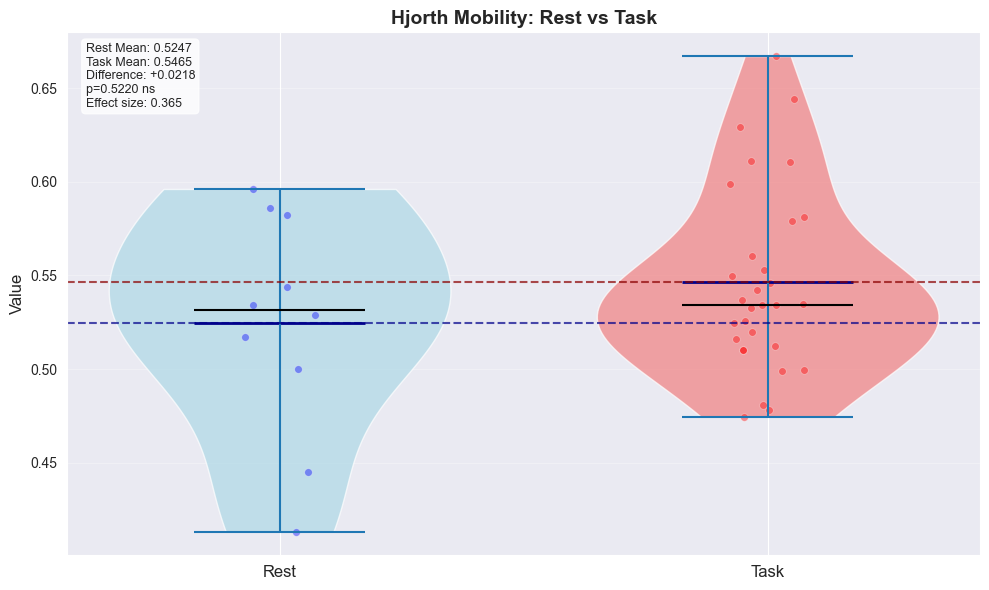

✓ Plotted hjorth_mobility


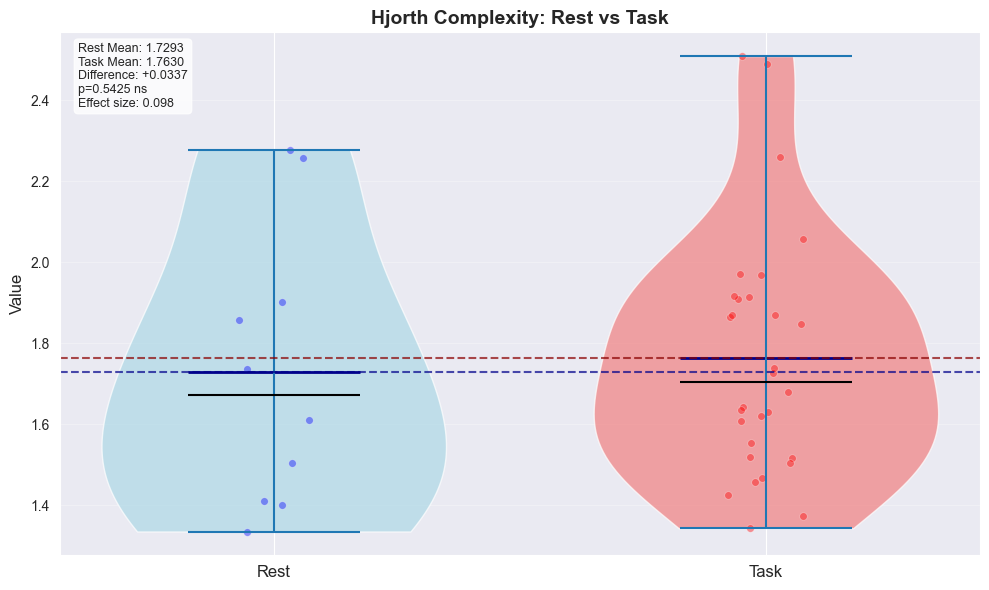

✓ Plotted hjorth_complexity


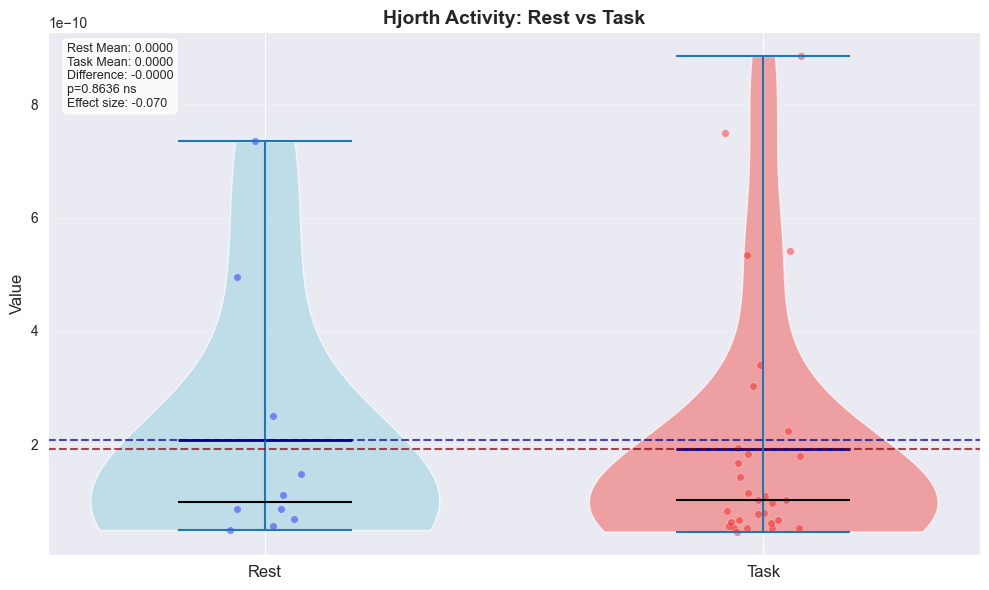

✓ Plotted hjorth_activity


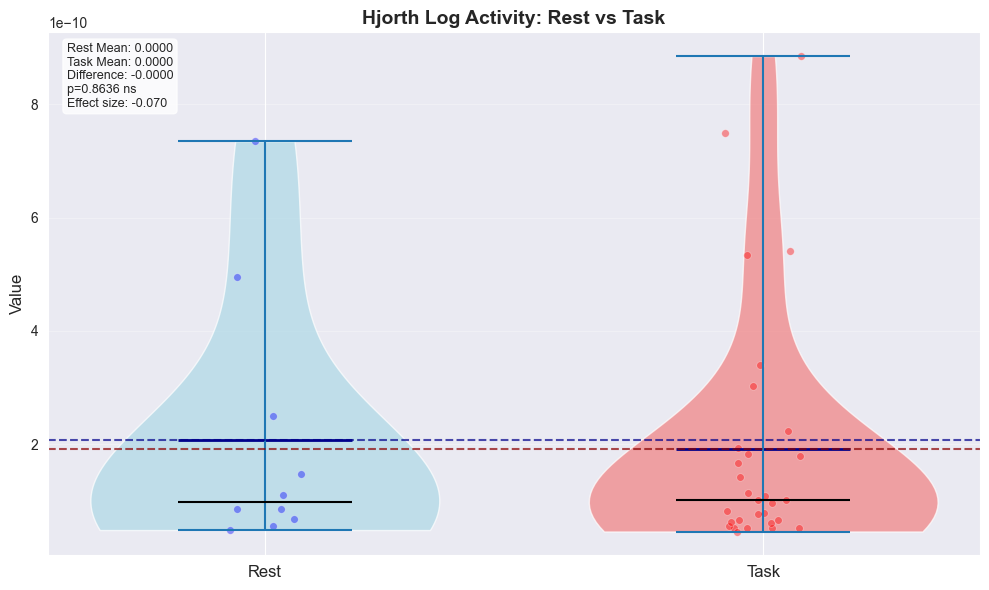

✓ Plotted hjorth_log_activity


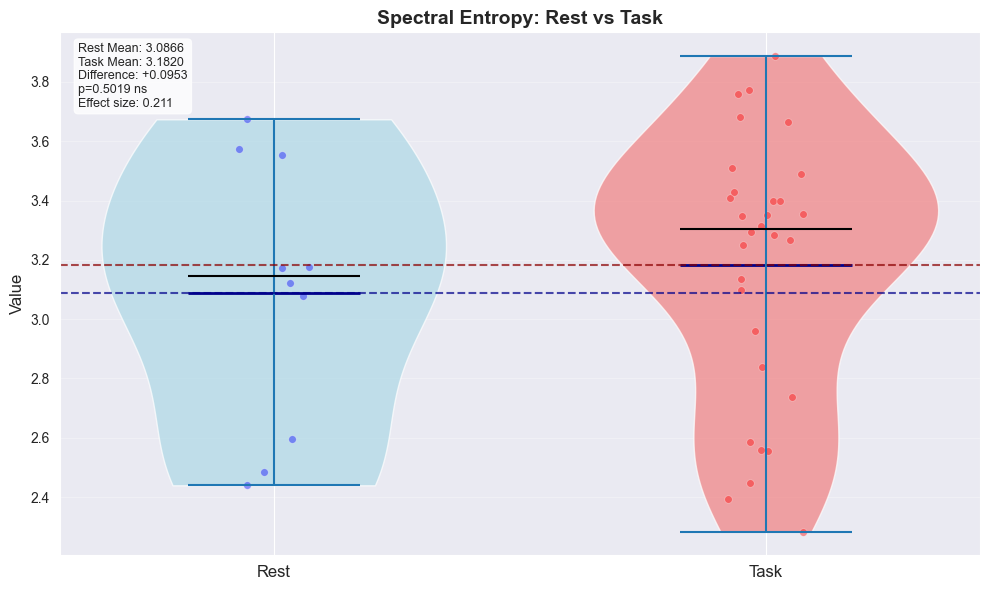

✓ Plotted spectral_entropy


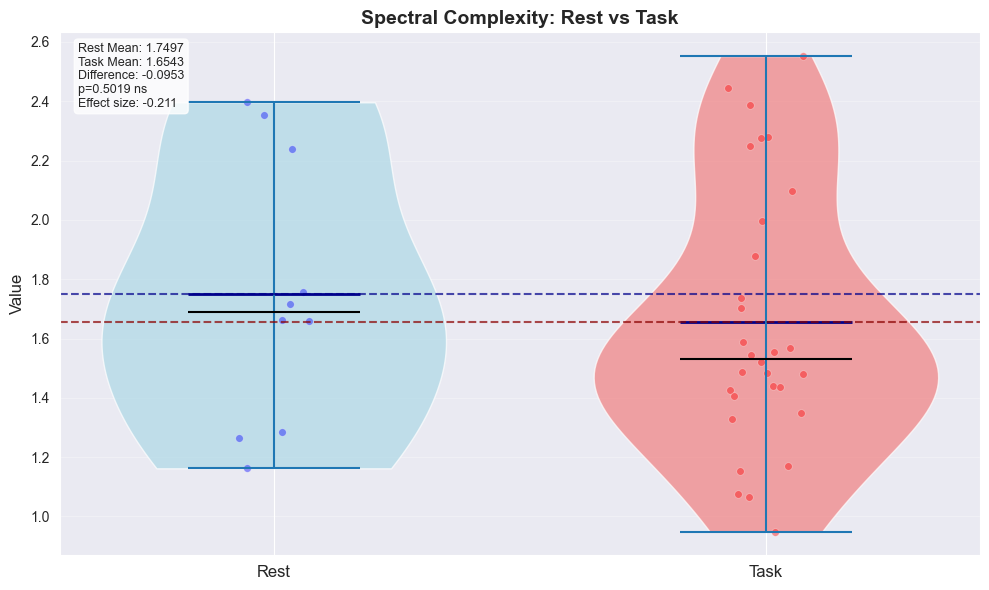

✓ Plotted spectral_complexity


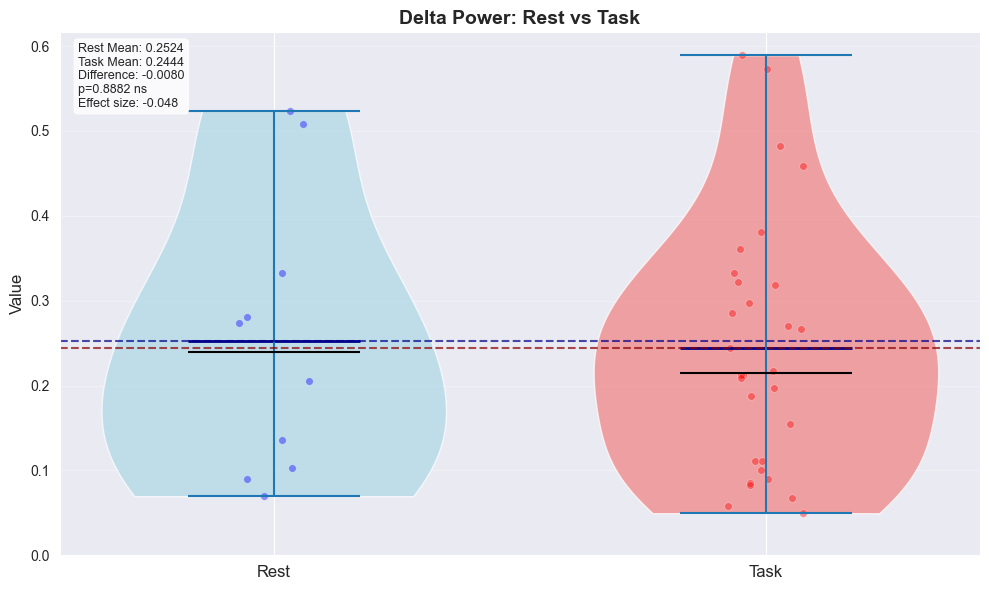

✓ Plotted delta_power


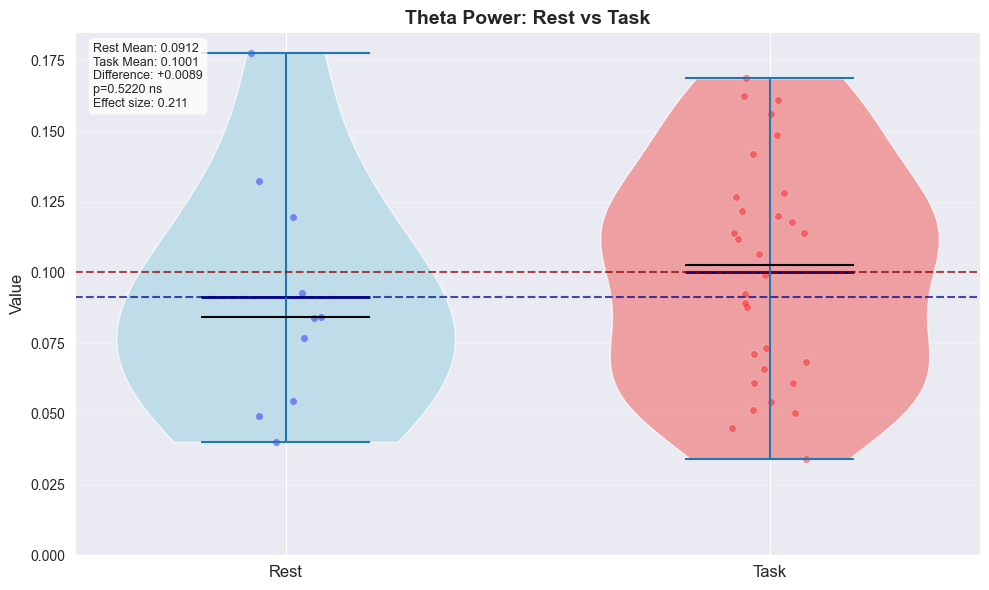

✓ Plotted theta_power


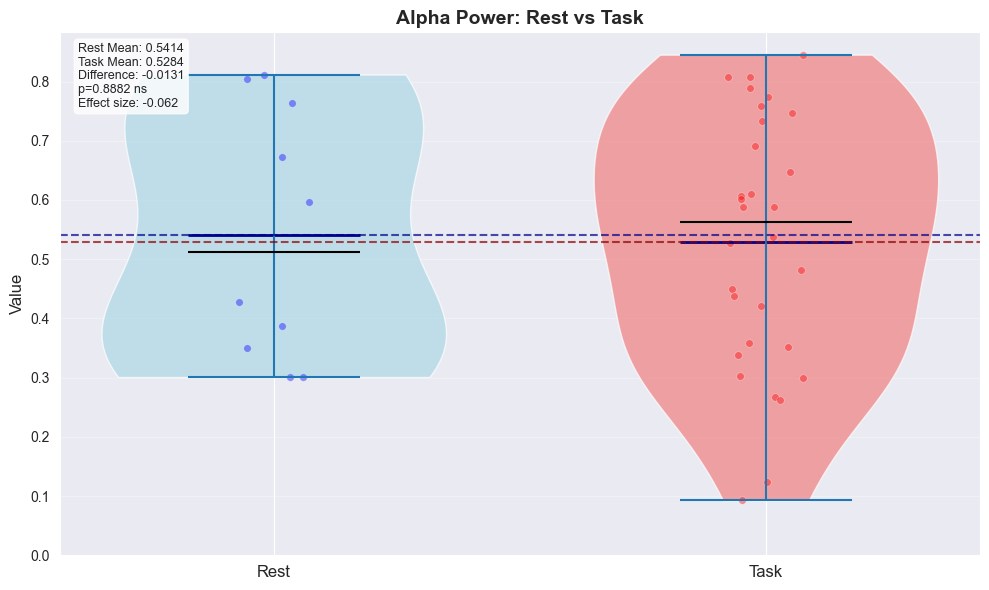

✓ Plotted alpha_power


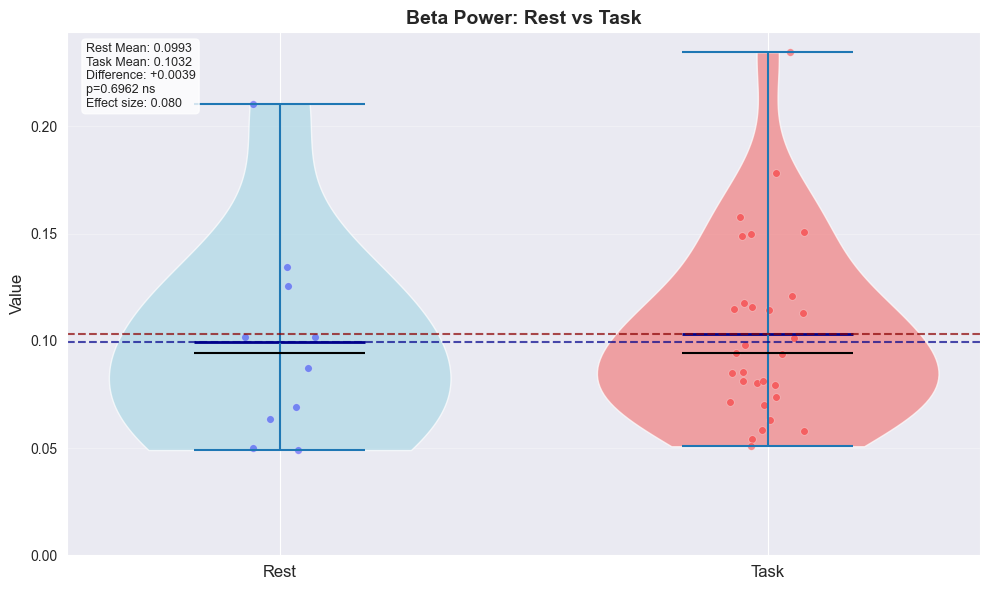

✓ Plotted beta_power


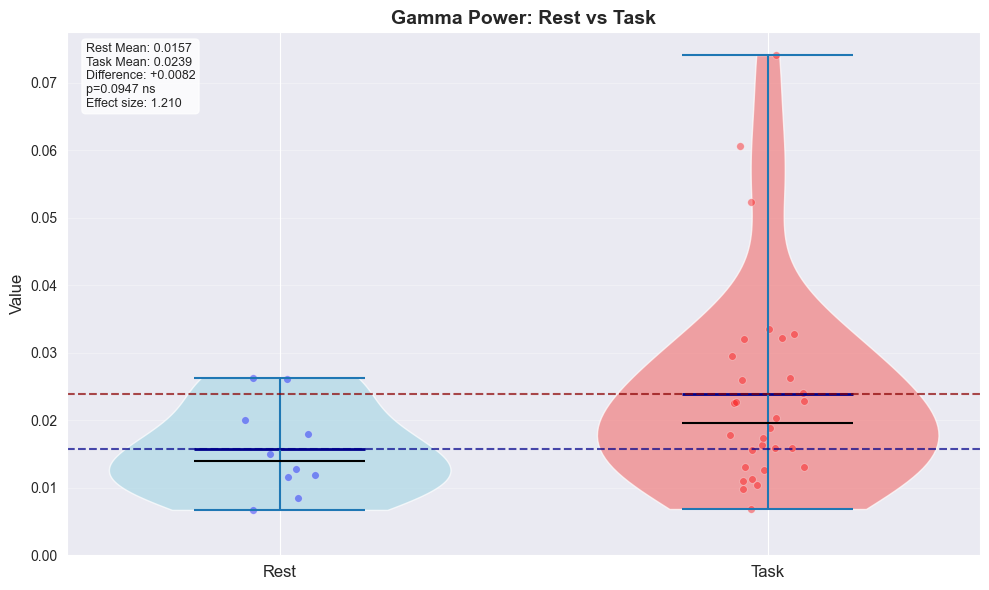

✓ Plotted gamma_power


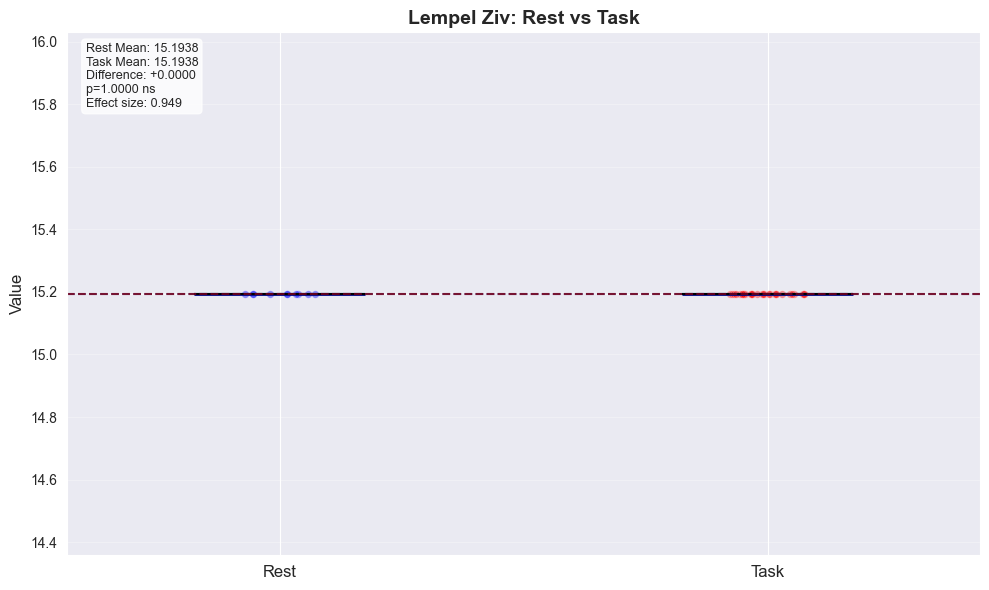

✓ Plotted lempel_ziv


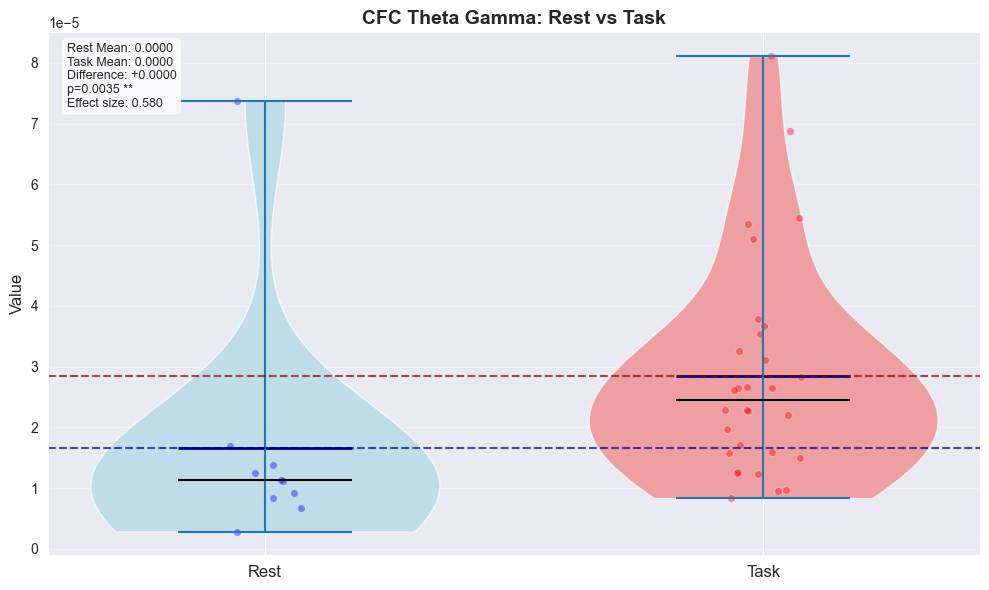

✓ Plotted cfc_theta_gamma


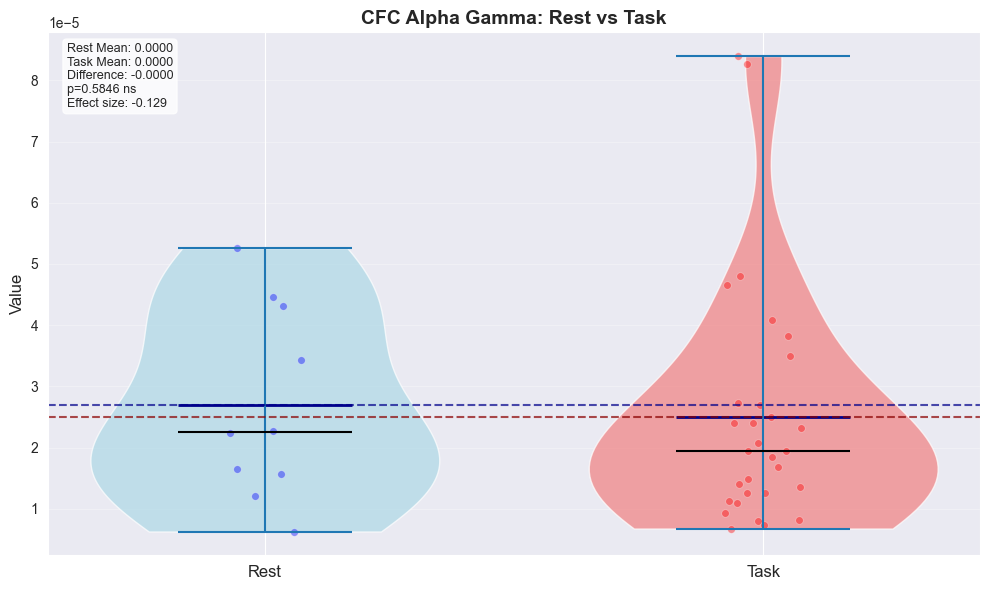

✓ Plotted cfc_alpha_gamma

SUMMARY TABLE: ALL FEATURES (Rest vs Task)
Feature                           Rest Mean    Task Mean   Difference      p-value     Effect
--------------------------------------------------------------------------------
Hjorth Mobility                      0.5247       0.5465      +0.0218       0.5220     0.399
Hjorth Complexity                    1.7293       1.7630      +0.0337       0.5425     0.105
Hjorth Activity                      0.0000       0.0000      -0.0000       0.8636    -0.072
Hjorth Log Activity                  0.0000       0.0000      -0.0000       0.8636    -0.072
Spectral Entropy                     3.0866       3.1820      +0.0953       0.5019     0.213
Spectral Complexity                  1.7497       1.6543      -0.0953       0.5019    -0.213
Delta Power                          0.2524       0.2444      -0.0080       0.8882    -0.051
Theta Power                          0.0912       0.1001      +0.0089       0.5220     0.219
Alpha Power

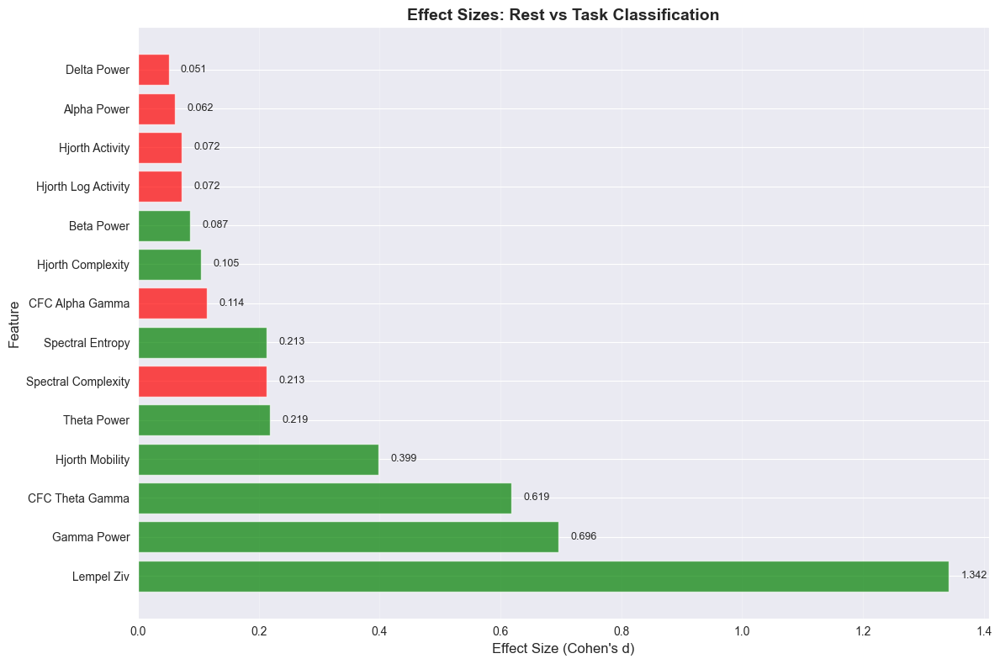


SUMMARY:
Total features analyzed: 14
Features with p < 0.05: 1
Features with |effect| > 0.5: 3


In [115]:
# ============================================
# INDIVIDUAL PLOTS FOR EACH FEATURE (Rest vs Task)
# Using existing data structures
# ============================================

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import mannwhitneyu

# ============================================
# USE EXISTING DATA STRUCTURES
# ============================================

TARGET_CHANNEL = "Pz"

print(f"Using channel: {TARGET_CHANNEL}")
print(f"Number of rest samples: {len(rest_df)}")
print(f"Number of task samples: {len(task_df)}")

# ============================================
# DEFINE ALL FEATURES TO PLOT
# ============================================

# Basic features (already in rest_df/task_df)
basic_features = [
    'hjorth_mobility', 'hjorth_complexity', 'hjorth_activity', 'hjorth_log_activity',
    'spectral_entropy', 'spectral_complexity',
    'delta_power', 'theta_power', 'alpha_power', 'beta_power', 'gamma_power'
]

# Note: wPLI, PLV, iCoh, PDC, GC, MI, LZC, CFC need to be computed first
# If they're not in your dataframes, we need to compute them

print("\n" + "="*60)
print("NOTE: If new features (wPLI, PLV, etc.) are not in your dataframes,")
print("they will be computed on-the-fly using the existing signals.")
print("="*60)

# ============================================
# FUNCTIONS TO COMPUTE ADDITIONAL FEATURES (if needed)
# ============================================

def lempel_ziv_complexity(x):
    """Lempel-Ziv complexity - measures signal complexity"""
    # Binarize the signal
    threshold = np.mean(x)
    binary = (x > threshold).astype(int)

    n = len(binary)
    complexity = 1
    sub_strings = set()

    i = 0
    while i < n:
        found = False
        for j in range(i + 1, n + 1):
            substring = tuple(binary[i:j])
            if substring in sub_strings:
                found = True
            else:
                if found:
                    sub_strings.add(tuple(binary[i:j-1]))
                    complexity += 1
                    i = j - 1
                    break
                else:
                    sub_strings.add(substring)
                    i = j
                    break
        else:
            if not found:
                sub_strings.add(tuple(binary[i:]))
                if len(sub_strings) > 1:
                    complexity += 1
            break

    # Normalize
    max_complexity = n / np.log2(n) if n > 1 else 1
    return complexity / max_complexity if max_complexity > 0 else 0

def cross_frequency_coupling(x, fs, low_band='theta', high_band='gamma'):
    """Cross-Frequency Coupling (phase-amplitude)"""
    from scipy.signal import butter, filtfilt, hilbert

    bands_cfc = {
        "theta": (4, 8),
        "alpha": (8, 13),
        "gamma": (30, 45)
    }

    low_range = bands_cfc[low_band]
    high_range = bands_cfc[high_band]

    nyquist = fs / 2

    # Filter low frequency (phase)
    b_low, a_low = butter(4, [low_range[0]/nyquist, low_range[1]/nyquist], btype='band')
    low_filtered = filtfilt(b_low, a_low, x)
    phase = np.angle(hilbert(low_filtered))

    # Filter high frequency (amplitude)
    b_high, a_high = butter(4, [high_range[0]/nyquist, high_range[1]/nyquist], btype='band')
    high_filtered = filtfilt(b_high, a_high, x)
    amplitude = np.abs(hilbert(high_filtered))

    # Modulation index (Tort method)
    n_bins = 18
    phase_bins = np.linspace(-np.pi, np.pi, n_bins + 1)
    mean_amp = np.zeros(n_bins)

    for i in range(n_bins):
        mask = (phase >= phase_bins[i]) & (phase < phase_bins[i+1])
        if np.any(mask):
            mean_amp[i] = np.mean(amplitude[mask])

    # Normalize
    mean_amp = mean_amp / (np.sum(mean_amp) + 1e-10)

    # KL divergence from uniform
    from scipy.stats import entropy
    uniform = np.ones(n_bins) / n_bins
    mi = entropy(mean_amp + 1e-10, uniform + 1e-10)

    # Modulation index
    mi = mi / np.log(n_bins)
    return mi

# For connectivity features (wPLI, PLV, etc.), we need channel pairs
# Since we're focusing on single channel, we'll skip those for now
# But we can compute LZC and CFC which are single-channel

print("\n" + "="*60)
print("Computing additional single-channel features (LZC, CFC)...")
print("="*60)

# Compute additional features for rest data
rest_additional_features = []
for idx, row in rest_df.iterrows():
    subj = row['subject']

    # Get the signal for this subject from rest_signals
    if subj in rest_signals:
        x = rest_signals[subj]

        if x is not None and len(x) > 0:
            features = {}

            # Lempel-Ziv Complexity
            try:
                features['lempel_ziv'] = lempel_ziv_complexity(x)
            except:
                features['lempel_ziv'] = np.nan

            # Cross-frequency coupling
            try:
                if len(x) >= TARGET_SFREQ * 2:
                    features['cfc_theta_gamma'] = cross_frequency_coupling(x, TARGET_SFREQ, 'theta', 'gamma')
                    features['cfc_alpha_gamma'] = cross_frequency_coupling(x, TARGET_SFREQ, 'alpha', 'gamma')
                else:
                    features['cfc_theta_gamma'] = np.nan
                    features['cfc_alpha_gamma'] = np.nan
            except:
                features['cfc_theta_gamma'] = np.nan
                features['cfc_alpha_gamma'] = np.nan

            rest_additional_features.append(features)
        else:
            rest_additional_features.append({'lempel_ziv': np.nan, 'cfc_theta_gamma': np.nan, 'cfc_alpha_gamma': np.nan})
    else:
        rest_additional_features.append({'lempel_ziv': np.nan, 'cfc_theta_gamma': np.nan, 'cfc_alpha_gamma': np.nan})

# Compute additional features for task data
task_additional_features = []
for idx, row in task_df.iterrows():
    subj = row['subject']
    task_name = row.get('task_name', '')

    # Find the task signal for this subject and task
    task_key = f"{subj}_{task_name}" if task_name else None
    x = None

    if task_key and task_key in task_signals:
        x = task_signals[task_key]
    elif subj in task_signals:
        # Fallback to first task signal
        task_keys = [k for k in task_signals.keys() if k.startswith(subj)]
        if task_keys:
            x = task_signals[task_keys[0]]

    if x is not None and len(x) > 0:
        features = {}

        try:
            features['lempel_ziv'] = lempel_ziv_complexity(x)
        except:
            features['lempel_ziv'] = np.nan

        try:
            if len(x) >= TARGET_SFREQ * 2:
                features['cfc_theta_gamma'] = cross_frequency_coupling(x, TARGET_SFREQ, 'theta', 'gamma')
                features['cfc_alpha_gamma'] = cross_frequency_coupling(x, TARGET_SFREQ, 'alpha', 'gamma')
            else:
                features['cfc_theta_gamma'] = np.nan
                features['cfc_alpha_gamma'] = np.nan
        except:
            features['cfc_theta_gamma'] = np.nan
            features['cfc_alpha_gamma'] = np.nan

        task_additional_features.append(features)
    else:
        task_additional_features.append({'lempel_ziv': np.nan, 'cfc_theta_gamma': np.nan, 'cfc_alpha_gamma': np.nan})

# Add to dataframes
for i, feat_dict in enumerate(rest_additional_features):
    for k, v in feat_dict.items():
        rest_df.at[i, k] = v

for i, feat_dict in enumerate(task_additional_features):
    for k, v in feat_dict.items():
        task_df.at[i, k] = v

# ============================================
# ALL FEATURES TO PLOT (including new ones)
# ============================================

all_features = [
    # Hjorth features
    'hjorth_mobility', 'hjorth_complexity', 'hjorth_activity', 'hjorth_log_activity',

    # Spectral features
    'spectral_entropy', 'spectral_complexity',

    # Band powers
    'delta_power', 'theta_power', 'alpha_power', 'beta_power', 'gamma_power',

    # New complexity features
    'lempel_ziv',

    # Cross-frequency coupling
    'cfc_theta_gamma', 'cfc_alpha_gamma'
]

# Note: wPLI, PLV, iCoh, PDC, GC, MI are pairwise features requiring two channels
# They are omitted here since we're using single channel (Pz)
print("\n" + "="*60)
print("NOTE: wPLI, PLV, iCoh, PDC, GC, MI are pairwise connectivity features")
print("that require two channels. Since we're using single channel (Pz),")
print("these are not included. Only single-channel features are shown.")
print("="*60)

# ============================================
# CREATE INDIVIDUAL PLOTS FOR EACH FEATURE
# ============================================

print("\n" + "="*60)
print("GENERATING INDIVIDUAL PLOTS FOR EACH FEATURE...")
print("="*60)

# Create a separate figure for each feature
for feat_name in all_features:
    # Check if feature exists in both dataframes
    if feat_name not in rest_df.columns or feat_name not in task_df.columns:
        print(f"Skipping {feat_name} - not found in data")
        continue

    rest_vals = rest_df[feat_name].dropna()
    task_vals = task_df[feat_name].dropna()

    if len(rest_vals) == 0 or len(task_vals) == 0:
        print(f"Skipping {feat_name} - insufficient data")
        continue

    # Create figure
    fig, ax = plt.subplots(figsize=(10, 6))

    # Create violin plot
    data_to_plot = [rest_vals.values, task_vals.values]
    positions = [1, 2]

    parts = ax.violinplot(data_to_plot, positions=positions,
                          showmeans=True, showmedians=True, widths=0.7)

    # Customize violin colors
    parts['bodies'][0].set_facecolor('lightblue')
    parts['bodies'][0].set_alpha(0.7)
    parts['bodies'][1].set_facecolor('lightcoral')
    parts['bodies'][1].set_alpha(0.7)

    # Customize mean and median
    parts['cmeans'].set_color('darkblue')
    parts['cmeans'].set_linewidth(2)
    parts['cmedians'].set_color('black')
    parts['cmedians'].set_linewidth(1.5)

    # Add individual points (jittered)
    np.random.seed(42)
    jitter = 0.08
    x_rest = np.ones(len(rest_vals)) + np.random.uniform(-jitter, jitter, len(rest_vals))
    x_task = np.ones(len(task_vals)) * 2 + np.random.uniform(-jitter, jitter, len(task_vals))

    ax.scatter(x_rest, rest_vals, color='blue', alpha=0.4, s=30, edgecolors='white', linewidth=0.5)
    ax.scatter(x_task, task_vals, color='red', alpha=0.4, s=30, edgecolors='white', linewidth=0.5)

    # Add horizontal lines for means
    rest_mean = rest_vals.mean()
    task_mean = task_vals.mean()
    ax.axhline(y=rest_mean, color='darkblue', linestyle='--', alpha=0.7, linewidth=1.5)
    ax.axhline(y=task_mean, color='darkred', linestyle='--', alpha=0.7, linewidth=1.5)

    # Statistical test
    try:
        stat, p_val = mannwhitneyu(rest_vals, task_vals)
        effect = (task_mean - rest_mean) / rest_vals.std() if rest_vals.std() > 0 else 0

        # Significance stars
        if p_val < 0.001:
            sig_stars = '***'
        elif p_val < 0.01:
            sig_stars = '**'
        elif p_val < 0.05:
            sig_stars = '*'
        else:
            sig_stars = 'ns'

        p_text = f'p={p_val:.4f}' if p_val >= 0.0001 else 'p<0.0001'

        # Add text box with statistics
        stats_text = f'Rest Mean: {rest_mean:.4f}\nTask Mean: {task_mean:.4f}\nDifference: {task_mean - rest_mean:+.4f}\n{p_text} {sig_stars}\nEffect size: {effect:.3f}'

        ax.text(0.02, 0.98, stats_text, transform=ax.transAxes,
                fontsize=9, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    except:
        pass

    # Customize plot
    ax.set_xticks([1, 2])
    ax.set_xticklabels(['Rest', 'Task'], fontsize=12)
    ax.set_ylabel('Value', fontsize=12)

    # Format feature name for title
    title_name = feat_name.replace('_', ' ').title()
    if 'Cfc' in title_name:
        title_name = title_name.replace('Cfc', 'CFC')
    ax.set_title(f'{title_name}: Rest vs Task', fontsize=14, fontweight='bold')

    ax.grid(True, alpha=0.3, axis='y')

    # Set y-axis to start from 0 for power features
    if 'power' in feat_name:
        ax.set_ylim(bottom=0)

    plt.tight_layout()
    plt.show()

    print(f"✓ Plotted {feat_name}")

# ============================================
# SUMMARY TABLE OF ALL FEATURES
# ============================================

print("\n" + "="*80)
print("SUMMARY TABLE: ALL FEATURES (Rest vs Task)")
print("="*80)
print(f"{'Feature':<30s} {'Rest Mean':>12s} {'Task Mean':>12s} {'Difference':>12s} {'p-value':>12s} {'Effect':>10s}")
print("-"*80)

results_list = []
for feat_name in all_features:
    if feat_name not in rest_df.columns or feat_name not in task_df.columns:
        continue

    rest_vals = rest_df[feat_name].dropna()
    task_vals = task_df[feat_name].dropna()

    if len(rest_vals) > 0 and len(task_vals) > 0:
        rest_mean = rest_vals.mean()
        task_mean = task_vals.mean()
        diff = task_mean - rest_mean

        # Cohen's d effect size
        pooled_std = np.sqrt((rest_vals.std()**2 + task_vals.std()**2) / 2)
        effect = diff / pooled_std if pooled_std > 0 else 0

        try:
            stat, p_val = mannwhitneyu(rest_vals, task_vals)
            p_str = f'{p_val:.4f}' if p_val >= 0.0001 else '<0.0001'
            sig = '***' if p_val < 0.001 else '**' if p_val < 0.01 else '*' if p_val < 0.05 else ''
        except:
            p_str = 'N/A'
            sig = ''

        # Format feature name
        display_name = feat_name.replace('_', ' ').title()
        if 'Cfc' in display_name:
            display_name = display_name.replace('Cfc', 'CFC')

        print(f"{display_name:<30s} {rest_mean:12.4f} {task_mean:12.4f} {diff:+12.4f} {p_str:>12s} {effect:>9.3f}{sig}")
        results_list.append({'feature': display_name, 'effect': abs(effect), 'p': p_val, 'diff': diff})

print("="*80)

# Best separating features
print("\n" + "="*80)
print("BEST SEPARATING FEATURES (largest effect size)")
print("="*80)

results_sorted = sorted(results_list, key=lambda x: x['effect'], reverse=True)
for i, r in enumerate(results_sorted[:10]):
    sig_star = ''
    if r['p'] < 0.001:
        sig_star = ' ***'
    elif r['p'] < 0.01:
        sig_star = ' **'
    elif r['p'] < 0.05:
        sig_star = ' *'

    direction = "↑ Task > Rest" if r['diff'] > 0 else "↓ Task < Rest"
    print(f"{i+1:2d}. {r['feature']:30s}: effect = {r['effect']:.4f}{sig_star}  ({direction})")

# ============================================
# BAR PLOT OF EFFECT SIZES
# ============================================

fig, ax = plt.subplots(figsize=(12, 8))

features_sorted = [r['feature'] for r in results_sorted[:15]]
effects_sorted = [r['effect'] for r in results_sorted[:15]]
colors_sorted = ['green' if r['diff'] > 0 else 'red' for r in results_sorted[:15]]

bars = ax.barh(range(len(features_sorted)), effects_sorted, color=colors_sorted, alpha=0.7)
ax.set_yticks(range(len(features_sorted)))
ax.set_yticklabels(features_sorted)
ax.set_xlabel('Effect Size (Cohen\'s d)', fontsize=12)
ax.set_ylabel('Feature', fontsize=12)
ax.set_title('Effect Sizes: Rest vs Task Classification', fontsize=14, fontweight='bold')
ax.axvline(x=0, color='black', linestyle='-', linewidth=0.5)
ax.grid(True, alpha=0.3, axis='x')

# Add value labels
for i, (bar, val) in enumerate(zip(bars, effects_sorted)):
    ax.text(val + 0.02, bar.get_y() + bar.get_height()/2, f'{val:.3f}',
            va='center', fontsize=9)

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("SUMMARY:")
print(f"Total features analyzed: {len(results_list)}")
print(f"Features with p < 0.05: {sum(1 for r in results_list if r['p'] < 0.05)}")
print(f"Features with |effect| > 0.5: {sum(1 for r in results_list if r['effect'] > 0.5)}")
print("="*60)

In [116]:
# Quick check
print(rest_df['lempel_ziv'].unique())
print(task_df['lempel_ziv'].unique())

[15.1937926]
[15.1937926]


# one channel, better features

In [128]:
rest_stats = {}
task_stats = {}

rest_signals = {}
task_signals = {}

FLAT_STD_THRESH = 1e-6
FLAT_RANGE_THRESH = 1e-5


def is_bad_signal(x):
    if x is None:
        return True
    if not np.all(np.isfinite(x)):
        return True
    if np.std(x) < FLAT_STD_THRESH:
        return True
    if (np.max(x) - np.min(x)) < FLAT_RANGE_THRESH:
        return True
    return False


valid_subjects = []

for subj in subjects:

    # --------------------
    # LOAD REST (take all rest files)
    # --------------------
    if subj not in rest_files or len(rest_files[subj]) == 0:
        continue

    # Process each rest file separately or combine? Here taking first
    x_rest = load_signal(rest_files[subj][0], CHANNEL)  # CHANGED: [0] added

    if is_bad_signal(x_rest):
        continue

    freqs_r, psd_r = welch(x_rest, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)

    if np.sum(psd_r) <= 0 or not np.all(np.isfinite(psd_r)):
        continue

    # --------------------
    # LOAD ALL TASK FILES
    # --------------------
    if subj not in task_files or len(task_files[subj]) == 0:  # CHANGED: check length
        continue

    # NEW: Loop through all task files
    for task_idx, task_file in enumerate(task_files[subj]):  # CHANGED: added loop
        x_task = load_signal(task_file, CHANNEL)

        if is_bad_signal(x_task):
            continue

        freqs_t, psd_t = welch(x_task, fs=TARGET_SFREQ, nperseg=TARGET_SFREQ*2)

        if np.sum(psd_t) <= 0 or not np.all(np.isfinite(psd_t)):
            continue

        # --------------------
        # Compute Hjorth features
        # --------------------
        hjorth_rest = hjorth_all(x_rest)
        hjorth_task = hjorth_all(x_task)

        # --------------------
        # Compute band powers (normalized and unnormalized)
        # --------------------
        bands_rest_raw = {k: bandpower(psd_r, freqs_r, v) for k, v in bands.items()}
        total_power_rest = sum(bands_rest_raw.values())
        bands_rest_norm = {k: v / total_power_rest if total_power_rest > 0 else np.nan
                           for k, v in bands_rest_raw.items()}

        bands_task_raw = {k: bandpower(psd_t, freqs_t, v) for k, v in bands.items()}
        total_power_task = sum(bands_task_raw.values())
        bands_task_norm = {k: v / total_power_task if total_power_task > 0 else np.nan
                           for k, v in bands_task_raw.items()}

        # --------------------
        # Store task with unique key (NEW)
        # --------------------
        task_name = os.path.basename(task_file).split('_task-')[1].split('_')[0]  # NEW
        task_key = f"{subj}_{task_name}"  # NEW

        task_stats[task_key] = {  # CHANGED: task_key instead of subj
            "freqs": freqs_t,
            "psd": psd_t,

            # Spectral features
            "entropy": spectral_entropy(psd_t),
            "complexity": spectral_complexity(psd_t),
            "complexity_alt": spectral_complexity_alternative(psd_t, freqs_t),

            # Hjorth features (raw + log activity)
            "hjorth_activity": hjorth_task["activity"],
            "hjorth_log_activity": hjorth_task["log_activity"],
            "hjorth_mobility": hjorth_task["mobility"],
            "hjorth_complexity": hjorth_task["complexity"],

            # Band powers (raw and normalized)
            "bands_raw": bands_task_raw,
            "bands_norm": bands_task_norm,
            "total_power": total_power_task,
        }

        task_signals[task_key] = x_task  # CHANGED: task_key instead of subj

    # --------------------
    # Store rest (once per subject)
    # --------------------
    rest_stats[subj] = {
        "freqs": freqs_r,
        "psd": psd_r,

        # Spectral features
        "entropy": spectral_entropy(psd_r),
        "complexity": spectral_complexity(psd_r),
        "complexity_alt": spectral_complexity_alternative(psd_r, freqs_r),

        # Hjorth features (raw + log activity)
        "hjorth_activity": hjorth_rest["activity"],
        "hjorth_log_activity": hjorth_rest["log_activity"],
        "hjorth_mobility": hjorth_rest["mobility"],
        "hjorth_complexity": hjorth_rest["complexity"],

        # Band powers (raw and normalized)
        "bands_raw": bands_rest_raw,
        "bands_norm": bands_rest_norm,
        "total_power": total_power_rest,
    }

    rest_signals[subj] = x_rest
    valid_subjects.append(subj)


print("VALID subjects:", len(valid_subjects))
print("REST kept:", len(rest_stats))
print("TASK kept:", len(task_stats))

def load_signal(file, channel):
    try:
        raw = mne.io.read_raw_brainvision(file, preload=True, verbose=False)

        if channel not in raw.ch_names:
            return None
        if channel in raw.info["bads"]:
            return None

        raw.pick([channel])

        # ------------------------
        # FILTERING STEP (IMPORTANT)
        # ------------------------
        raw.notch_filter(50, verbose=False)   # remove mains noise
        raw.filter(1, 40, verbose=False)      # keep only <= 40 Hz

        raw.resample(TARGET_SFREQ)

        x = raw.get_data()[0]

        if not np.all(np.isfinite(x)):
            return None
        if np.std(x) < 1e-10:
            return None

        return x

    except Exception:
        return None

VALID subjects: 10
REST kept: 10
TASK kept: 30


In [132]:
import numpy as np
import mne
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.signal import welch, butter, filtfilt, hilbert
from scipy.stats import entropy
from itertools import product

from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from xgboost import XGBClassifier

# ============================================
# PARAMETERS
# ============================================
TARGET_SFREQ = 125
WINDOW_SEC = 2.0
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)

FLAT_STD_THRESH = 1e-8
FLAT_RANGE_THRESH = 1e-7

CHANNEL = "Cz"  # change if needed

bands = {
    "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

band_names = list(bands.keys())

# valid CFC pairs: low phase → higher amplitude
cfc_pairs = [
    (low, high)
    for low, high in product(band_names, band_names)
    if bands[low][1] < bands[high][0]
]

# ============================================
# SIGNAL VALIDATION
# ============================================
def is_bad_signal(x):
    if x is None:
        return True
    if not np.all(np.isfinite(x)):
        return True
    if np.std(x) < FLAT_STD_THRESH:
        return True
    if (np.max(x) - np.min(x)) < FLAT_RANGE_THRESH:
        return True
    return False

# ============================================
# LOAD SIGNAL
# ============================================
def load_signal(file):
    try:
        raw = mne.io.read_raw_brainvision(file, preload=True, verbose=False)

        if CHANNEL not in raw.ch_names or CHANNEL in raw.info["bads"]:
            return None

        raw.pick([CHANNEL])
        raw.notch_filter(50, verbose=False)
        raw.filter(1, 40, verbose=False)
        raw.resample(TARGET_SFREQ)

        x = raw.get_data()[0]

        if not np.all(np.isfinite(x)):
            return None

        return x

    except:
        return None

# ============================================
# FEATURE FUNCTIONS
# ============================================
def hjorth(x):
    dx = np.diff(x)
    ddx = np.diff(dx)

    var_x = np.var(x)
    var_dx = np.var(dx)

    mobility = np.sqrt(var_dx / var_x) if var_x > 0 else 0
    complexity = np.sqrt(np.var(ddx) / var_dx) / mobility if var_dx > 0 else 0

    return var_x, mobility, complexity

def spectral_entropy(psd):
    psd_norm = psd / (np.sum(psd) + 1e-12)
    return entropy(psd_norm)

def bandpower(psd, freqs, band):
    idx = (freqs >= band[0]) & (freqs <= band[1])
    return np.trapz(psd[idx], freqs[idx]) if np.any(idx) else 0

def lempel_ziv_complexity(x):
    binary = (x > np.mean(x)).astype(int)
    s = ''.join(binary.astype(str))
    i, k = 0, 1
    complexity = 1

    while i + k <= len(s):
        if s[i:i+k] in s[:i+k-1]:
            k += 1
        else:
            complexity += 1
            i += k
            k = 1

    return complexity / (len(s) / np.log2(len(s) + 1))

def compute_cfc_pair(x, fs, low_band, high_band):
    nyq = fs / 2
    try:
        b_low, a_low = butter(4, [low_band[0]/nyq, low_band[1]/nyq], btype='band')
        low_f = filtfilt(b_low, a_low, x)
        phase = np.angle(hilbert(low_f))

        b_high, a_high = butter(4, [high_band[0]/nyq, high_band[1]/nyq], btype='band')
        high_f = filtfilt(b_high, a_high, x)
        amp = np.abs(hilbert(high_f))

        bins = np.linspace(-np.pi, np.pi, 18)
        digitized = np.digitize(phase, bins)

        mean_amp = np.array([
            amp[digitized == i].mean() if np.any(digitized == i) else 0
            for i in range(1, len(bins))
        ])

        mean_amp /= (mean_amp.sum() + 1e-12)
        return entropy(mean_amp)

    except:
        return np.nan

# ============================================
# FEATURE EXTRACTION
# ============================================
def extract_features(x):
    feats = {}

    # Hjorth
    act, mob, comp = hjorth(x)
    feats["hjorth_activity"] = act
    feats["hjorth_mobility"] = mob
    feats["hjorth_complexity"] = comp

    # PSD
    freqs, psd = welch(x, fs=TARGET_SFREQ, nperseg=len(x))
    feats["spectral_entropy"] = spectral_entropy(psd)

    for b, rng in bands.items():
        feats[f"{b}_power"] = bandpower(psd, freqs, rng)

    # LZC
    feats["lzc"] = lempel_ziv_complexity(x)

    # ALL CFC pairs
    for low, high in cfc_pairs:
        feats[f"cfc_{low}_{high}"] = compute_cfc_pair(x, TARGET_SFREQ, bands[low], bands[high])

    return feats

# ============================================
# DATA COLLECTION
# ============================================
all_data = []
feature_names = None

def process_file(file, label, subj):
    global feature_names

    x = load_signal(file)
    if is_bad_signal(x):
        return

    n_windows = len(x) // WINDOW_LEN

    for i in range(n_windows):
        w = x[i*WINDOW_LEN:(i+1)*WINDOW_LEN]

        if is_bad_signal(w):
            continue

        feats = extract_features(w)

        if feature_names is None:
            feature_names = list(feats.keys())

        all_data.append((list(feats.values()), label, subj))

# ==== YOU MUST DEFINE rest_files and task_files ====

for subj in rest_files:
    for f in rest_files[subj]:
        process_file(f, 0, subj)

for subj in task_files:
    for f in task_files[subj]:
        process_file(f, 1, subj)

# ============================================
# STRUCTURE
# ============================================
X_all = np.array([d[0] for d in all_data])
y_all = np.array([d[1] for d in all_data])
subjects_all = np.array([d[2] for d in all_data])

print("Total windows:", len(X_all))

# ============================================
# HANDLE NaNs
# ============================================
imputer = SimpleImputer(strategy="median")
X_all = imputer.fit_transform(X_all)

# ============================================
# SUBJECT SPLIT
# ============================================
unique_subjects = np.unique(subjects_all)

np.random.seed(42)
train_subj = np.random.choice(unique_subjects, int(0.7*len(unique_subjects)), replace=False)
test_subj = np.array([s for s in unique_subjects if s not in train_subj])

train_mask = np.isin(subjects_all, train_subj)
test_mask = np.isin(subjects_all, test_subj)

X_train, X_test = X_all[train_mask], X_all[test_mask]
y_train, y_test = y_all[train_mask], y_all[test_mask]

# ============================================
# MODEL
# ============================================
model = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model.fit(X_train, y_train)

# ============================================
# EVALUATION
# ============================================
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)[:, 1]

print(classification_report(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_prob))

# ============================================
# FEATURE IMPORTANCE
# ============================================
importance_df = pd.DataFrame({
    "feature": feature_names,
    "importance": model.feature_importances_
}).sort_values("importance", ascending=False)

print(importance_df.head(20))

# ============================================
# CFC IMPORTANCE HEATMAP
# ============================================
cfc_imp = importance_df[importance_df["feature"].str.startswith("cfc_")]

matrix = pd.DataFrame(0, index=band_names, columns=band_names)

for _, row in cfc_imp.iterrows():
    _, low, high = row["feature"].split("_")
    matrix.loc[low, high] = row["importance"]

plt.figure(figsize=(8,6))
sns.heatmap(matrix, annot=True, fmt=".3f", cmap="viridis")
plt.title("CFC Importance (low → high)")
plt.xlabel("High freq")
plt.ylabel("Low freq")
plt.show()

# ============================================
# SUBJECT-AVERAGED BOXPLOTS
# ============================================
df = pd.DataFrame(X_all, columns=feature_names)
df["label"] = y_all
df["subject"] = subjects_all

df_avg = df.groupby(["subject", "label"]).mean().reset_index()

for feat in feature_names:
    plt.figure(figsize=(5,4))
    sns.boxplot(data=df_avg, x="label", y=feat)
    sns.stripplot(data=df_avg, x="label", y=feat, jitter=True, alpha=0.6)
    plt.title(feat)
    plt.tight_layout()
    plt.show()

Total windows: 7500
              precision    recall  f1-score   support

           0       0.49      0.18      0.26       900
           1       0.62      0.87      0.72      1350

    accuracy                           0.60      2250
   macro avg       0.55      0.53      0.49      2250
weighted avg       0.57      0.60      0.54      2250

ROC-AUC: 0.559079012345679
              feature  importance
6         alpha_power    0.144138
0     hjorth_activity    0.139656
3    spectral_entropy    0.073666
1     hjorth_mobility    0.070711
9                 lzc    0.068595
2   hjorth_complexity    0.061121
8         gamma_power    0.057401
4         delta_power    0.057322
7          beta_power    0.054970
10    cfc_delta_alpha    0.045194
5         theta_power    0.044957
12    cfc_delta_gamma    0.040873
11     cfc_delta_beta    0.038983
15    cfc_alpha_gamma    0.037364
13     cfc_theta_beta    0.033321
14    cfc_theta_gamma    0.031728


TypeError: Invalid value '0.045193661004304886' for dtype 'int64'

# boxplots for every feature

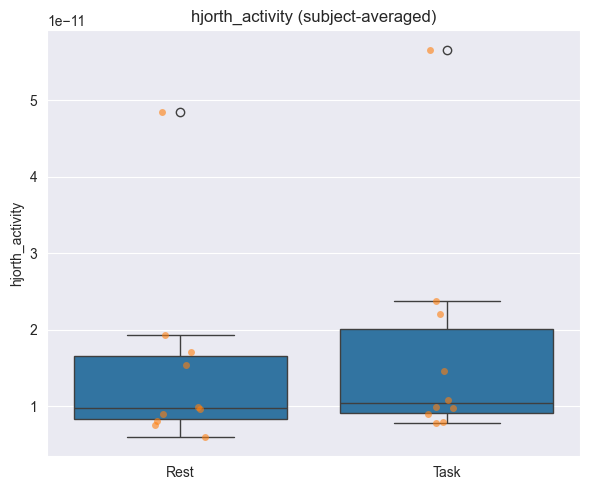

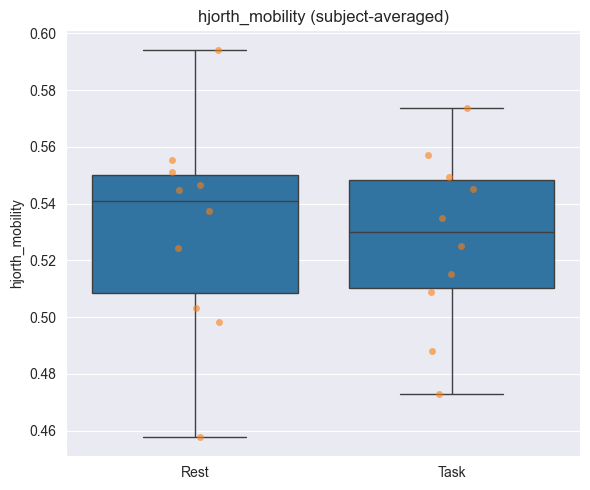

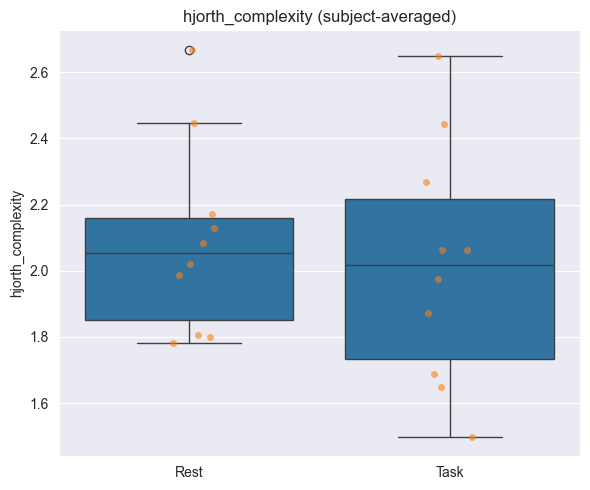

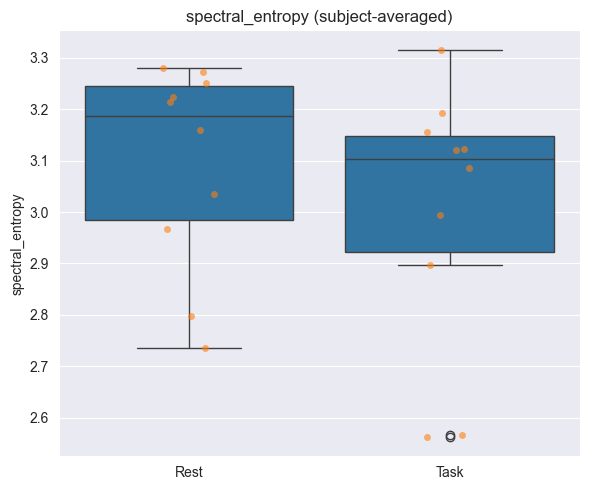

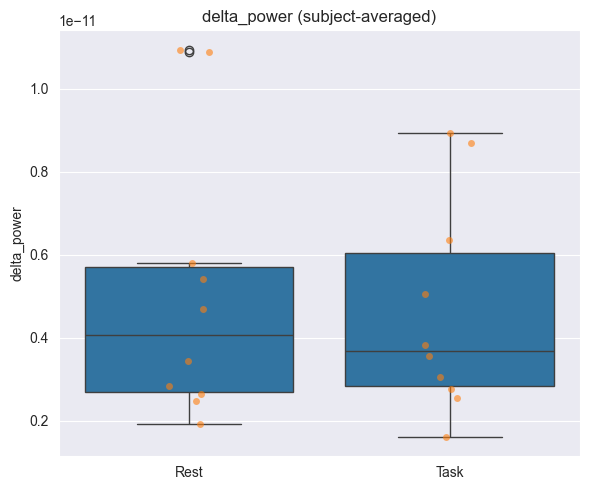

...

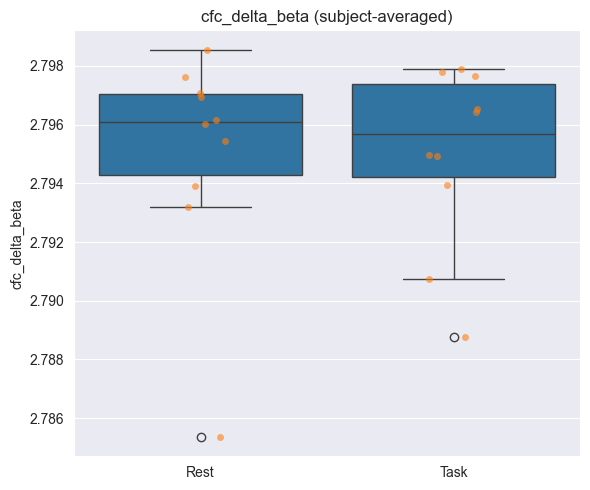

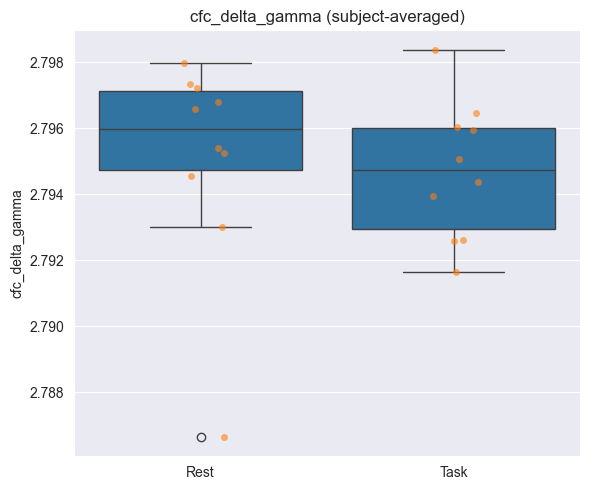

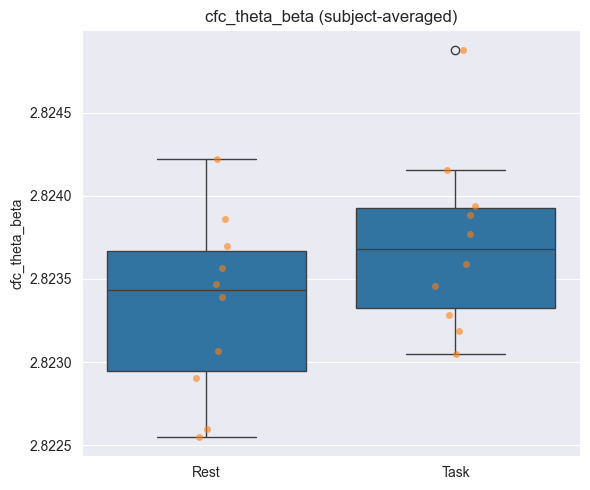

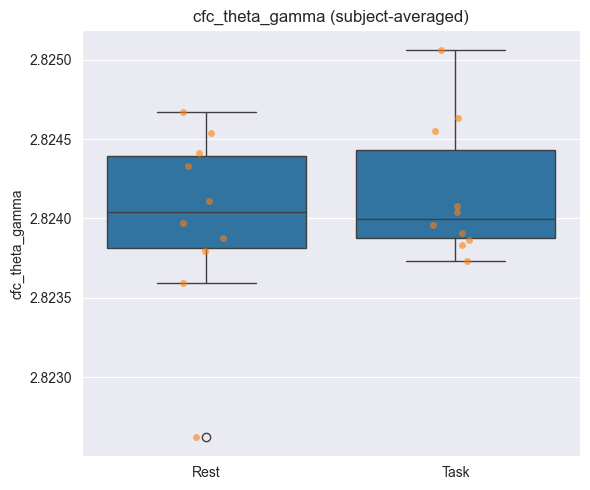

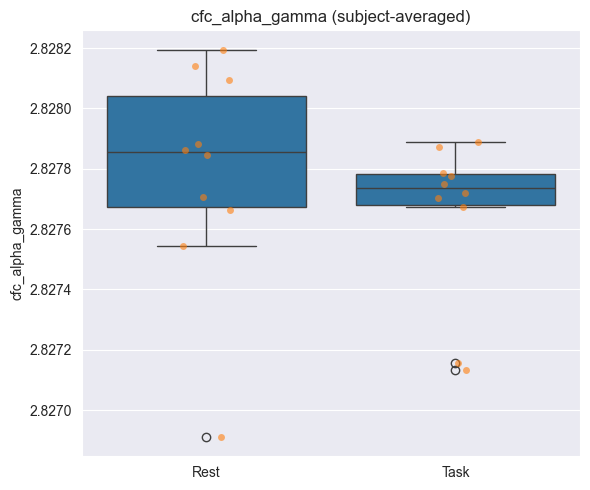

In [133]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================
# BUILD DATAFRAME
# ============================================
df = pd.DataFrame(X_all, columns=feature_names)
df["label"] = y_all
df["subject"] = subjects_all

# ============================================
# AVERAGE PER SUBJECT PER CLASS
# ============================================
df_avg = (
    df
    .groupby(["subject", "label"])
    .mean(numeric_only=True)
    .reset_index()
)

# Map labels for readability
label_map = {0: "Rest", 1: "Task"}
df_avg["label_name"] = df_avg["label"].map(label_map)

# ============================================
# PLOT: ONE FIGURE PER FEATURE
# ============================================
for feature in feature_names:
    plt.figure(figsize=(6, 5))

    sns.boxplot(
        data=df_avg,
        x="label_name",
        y=feature
    )

    sns.stripplot(
        data=df_avg,
        x="label_name",
        y=feature,
        jitter=True,
        alpha=0.6
    )

    plt.title(f"{feature} (subject-averaged)", fontsize=12)
    plt.xlabel("")
    plt.ylabel(feature)

    plt.tight_layout()
    plt.show()

# per-subject normalization

In [134]:
import numpy as np
import mne
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.signal import welch, butter, filtfilt, hilbert
from scipy.stats import entropy
from itertools import product

from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from xgboost import XGBClassifier

# ============================================
# PARAMETERS
# ============================================
TARGET_SFREQ = 125
WINDOW_SEC = 2.0
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)

FLAT_STD_THRESH = 1e-8
FLAT_RANGE_THRESH = 1e-7

CHANNEL = "Cz"  # change if needed

bands = {
    "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

band_names = list(bands.keys())

# valid CFC pairs: low phase → higher amplitude
cfc_pairs = [
    (low, high)
    for low, high in product(band_names, band_names)
    if bands[low][1] < bands[high][0]
]

# ============================================
# SIGNAL VALIDATION
# ============================================
def is_bad_signal(x):
    if x is None:
        return True
    if not np.all(np.isfinite(x)):
        return True
    if np.std(x) < FLAT_STD_THRESH:
        return True
    if (np.max(x) - np.min(x)) < FLAT_RANGE_THRESH:
        return True
    return False

# ============================================
# LOAD SIGNAL
# ============================================
def load_signal(file):
    try:
        raw = mne.io.read_raw_brainvision(file, preload=True, verbose=False)

        if CHANNEL not in raw.ch_names or CHANNEL in raw.info["bads"]:
            return None

        raw.pick([CHANNEL])
        raw.notch_filter(50, verbose=False)
        raw.filter(1, 40, verbose=False)
        raw.resample(TARGET_SFREQ)

        x = raw.get_data()[0]

        if not np.all(np.isfinite(x)):
            return None

        return x

    except:
        return None

# ============================================
# FEATURE FUNCTIONS
# ============================================
def hjorth(x):
    dx = np.diff(x)
    ddx = np.diff(dx)

    var_x = np.var(x)
    var_dx = np.var(dx)

    mobility = np.sqrt(var_dx / var_x) if var_x > 0 else 0
    complexity = np.sqrt(np.var(ddx) / var_dx) / mobility if var_dx > 0 else 0

    return var_x, mobility, complexity

def spectral_entropy(psd):
    psd_norm = psd / (np.sum(psd) + 1e-12)
    return entropy(psd_norm)

def bandpower(psd, freqs, band):
    idx = (freqs >= band[0]) & (freqs <= band[1])
    return np.trapz(psd[idx], freqs[idx]) if np.any(idx) else 0

def lempel_ziv_complexity(x):
    binary = (x > np.mean(x)).astype(int)
    s = ''.join(binary.astype(str))
    i, k = 0, 1
    complexity = 1

    while i + k <= len(s):
        if s[i:i+k] in s[:i+k-1]:
            k += 1
        else:
            complexity += 1
            i += k
            k = 1

    return complexity / (len(s) / np.log2(len(s) + 1))

def compute_cfc_pair(x, fs, low_band, high_band):
    nyq = fs / 2
    try:
        b_low, a_low = butter(4, [low_band[0]/nyq, low_band[1]/nyq], btype='band')
        low_f = filtfilt(b_low, a_low, x)
        phase = np.angle(hilbert(low_f))

        b_high, a_high = butter(4, [high_band[0]/nyq, high_band[1]/nyq], btype='band')
        high_f = filtfilt(b_high, a_high, x)
        amp = np.abs(hilbert(high_f))

        bins = np.linspace(-np.pi, np.pi, 18)
        digitized = np.digitize(phase, bins)

        mean_amp = np.array([
            amp[digitized == i].mean() if np.any(digitized == i) else 0
            for i in range(1, len(bins))
        ])

        mean_amp /= (mean_amp.sum() + 1e-12)
        return entropy(mean_amp)

    except:
        return np.nan

# ============================================
# FEATURE EXTRACTION
# ============================================
def extract_features(x):
    feats = {}

    # Hjorth
    act, mob, comp = hjorth(x)
    feats["hjorth_activity"] = act
    feats["hjorth_mobility"] = mob
    feats["hjorth_complexity"] = comp

    # PSD
    freqs, psd = welch(x, fs=TARGET_SFREQ, nperseg=len(x))
    feats["spectral_entropy"] = spectral_entropy(psd)

    for b, rng in bands.items():
        feats[f"{b}_power"] = bandpower(psd, freqs, rng)

    # LZC
    feats["lzc"] = lempel_ziv_complexity(x)

    # ALL CFC pairs
    for low, high in cfc_pairs:
        feats[f"cfc_{low}_{high}"] = compute_cfc_pair(x, TARGET_SFREQ, bands[low], bands[high])

    return feats

# ============================================
# DATA COLLECTION
# ============================================
all_data = []
feature_names = None

def process_file(file, label, subj):
    global feature_names

    x = load_signal(file)
    if is_bad_signal(x):
        return

    n_windows = len(x) // WINDOW_LEN

    for i in range(n_windows):
        w = x[i*WINDOW_LEN:(i+1)*WINDOW_LEN]

        if is_bad_signal(w):
            continue

        feats = extract_features(w)

        if feature_names is None:
            feature_names = list(feats.keys())

        all_data.append((list(feats.values()), label, subj))

# ==== YOU MUST DEFINE rest_files and task_files ====

for subj in rest_files:
    for f in rest_files[subj]:
        process_file(f, 0, subj)

for subj in task_files:
    for f in task_files[subj]:
        process_file(f, 1, subj)

# ============================================
# STRUCTURE
# ============================================
X_all = np.array([d[0] for d in all_data])
y_all = np.array([d[1] for d in all_data])
subjects_all = np.array([d[2] for d in all_data])

print("Total windows:", len(X_all))

# ============================================
# HANDLE NaNs
# ============================================
imputer = SimpleImputer(strategy="median")
X_all = imputer.fit_transform(X_all)

# ============================================
# SUBJECT SPLIT
# ============================================
unique_subjects = np.unique(subjects_all)

np.random.seed(42)
train_subj = np.random.choice(unique_subjects, int(0.7*len(unique_subjects)), replace=False)
test_subj = np.array([s for s in unique_subjects if s not in train_subj])

train_mask = np.isin(subjects_all, train_subj)
test_mask = np.isin(subjects_all, test_subj)

X_train, X_test = X_all[train_mask], X_all[test_mask]
y_train, y_test = y_all[train_mask], y_all[test_mask]

# ============================================
# PER-SUBJECT NORMALIZATION (TRAIN-FITTED)
# ============================================

from collections import defaultdict

# Compute stats ONLY from training data
subject_stats = {}

for subj in np.unique(subjects_all[train_mask]):
    subj_mask = (subjects_all == subj) & train_mask

    X_subj = X_all[subj_mask]

    mean = np.mean(X_subj, axis=0)
    std = np.std(X_subj, axis=0)

    std[std < 1e-8] = 1.0  # prevent division by zero

    subject_stats[subj] = (mean, std)


def normalize_subject(X, subjects, stats):
    X_norm = np.zeros_like(X)

    for i, subj in enumerate(subjects):
        if subj in stats:
            mean, std = stats[subj]
            X_norm[i] = (X[i] - mean) / std
        else:
            # unseen subject → fallback to global normalization
            global_mean = np.mean(list(s[0] for s in stats.values()), axis=0)
            global_std = np.mean(list(s[1] for s in stats.values()), axis=0)
            X_norm[i] = (X[i] - global_mean) / global_std

    return X_norm


# Apply normalization
X_train = normalize_subject(X_train, subjects_all[train_mask], subject_stats)
X_test  = normalize_subject(X_test,  subjects_all[test_mask],  subject_stats)

# ============================================
# MODEL
# ============================================
model = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model.fit(X_train, y_train)

# ============================================
# EVALUATION
# ============================================
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)[:, 1]

print(classification_report(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_prob))

# ============================================
# FEATURE IMPORTANCE
# ============================================
importance_df = pd.DataFrame({
    "feature": feature_names,
    "importance": model.feature_importances_
}).sort_values("importance", ascending=False)

print(importance_df.head(20))

# ============================================
# CFC IMPORTANCE HEATMAP
# ============================================
cfc_imp = importance_df[importance_df["feature"].str.startswith("cfc_")]

matrix = pd.DataFrame(0, index=band_names, columns=band_names)

for _, row in cfc_imp.iterrows():
    _, low, high = row["feature"].split("_")
    matrix.loc[low, high] = row["importance"]

plt.figure(figsize=(8,6))
sns.heatmap(matrix, annot=True, fmt=".3f", cmap="viridis")
plt.title("CFC Importance (low → high)")
plt.xlabel("High freq")
plt.ylabel("Low freq")
plt.show()

# ============================================
# SUBJECT-AVERAGED BOXPLOTS
# ============================================
df = pd.DataFrame(X_all, columns=feature_names)
df["label"] = y_all
df["subject"] = subjects_all

df_avg = df.groupby(["subject", "label"]).mean().reset_index()

for feat in feature_names:
    plt.figure(figsize=(5,4))
    sns.boxplot(data=df_avg, x="label", y=feat)
    sns.stripplot(data=df_avg, x="label", y=feat, jitter=True, alpha=0.6)
    plt.title(feat)
    plt.tight_layout()
    plt.show()

Total windows: 7500
              precision    recall  f1-score   support

           0       0.49      0.16      0.24       900
           1       0.61      0.89      0.73      1350

    accuracy                           0.60      2250
   macro avg       0.55      0.52      0.48      2250
weighted avg       0.56      0.60      0.53      2250

ROC-AUC: 0.5651999999999999
              feature  importance
0     hjorth_activity    0.132083
2   hjorth_complexity    0.114880
3    spectral_entropy    0.094827
6         alpha_power    0.089493
7          beta_power    0.067862
1     hjorth_mobility    0.057940
8         gamma_power    0.055728
9                 lzc    0.052779
5         theta_power    0.050505
11     cfc_delta_beta    0.047700
10    cfc_delta_alpha    0.047397
4         delta_power    0.041351
15    cfc_alpha_gamma    0.038406
14    cfc_theta_gamma    0.037872
12    cfc_delta_gamma    0.036467
13     cfc_theta_beta    0.034708


TypeError: Invalid value '0.04770045354962349' for dtype 'int64'

# CORAL

In [135]:
import numpy as np

def coral_transform(Xs, Xt, eps=1e-5):
    """
    Align source (Xs) to target (Xt) using CORAL.
    Xs: (n_samples_s, n_features)
    Xt: (n_samples_t, n_features)
    """

    # center
    Xs_mean = np.mean(Xs, axis=0)
    Xt_mean = np.mean(Xt, axis=0)

    Xs_c = Xs - Xs_mean
    Xt_c = Xt - Xt_mean

    # covariance
    Cs = np.cov(Xs_c, rowvar=False) + np.eye(Xs.shape[1]) * eps
    Ct = np.cov(Xt_c, rowvar=False) + np.eye(Xt.shape[1]) * eps

    # matrix square root via SVD
    Us, Ss, _ = np.linalg.svd(Cs)
    Ut, St, _ = np.linalg.svd(Ct)

    Cs_inv_sqrt = Us @ np.diag(1.0 / np.sqrt(Ss)) @ Us.T
    Ct_sqrt = Ut @ np.diag(np.sqrt(St)) @ Ut.T

    # transform
    Xs_aligned = Xs_c @ Cs_inv_sqrt @ Ct_sqrt + Xt_mean

    return Xs_aligned

In [136]:
import numpy as np
import mne
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.signal import welch, butter, filtfilt, hilbert
from scipy.stats import entropy
from itertools import product

from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from xgboost import XGBClassifier

# ============================================
# PARAMETERS
# ============================================
TARGET_SFREQ = 125
WINDOW_SEC = 2.0
WINDOW_LEN = int(WINDOW_SEC * TARGET_SFREQ)

FLAT_STD_THRESH = 1e-8
FLAT_RANGE_THRESH = 1e-7

CHANNEL = "Cz"  # change if needed

bands = {
    "delta": (0.5, 4),
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta": (13, 30),
    "gamma": (30, 45),
}

band_names = list(bands.keys())

# valid CFC pairs: low phase → higher amplitude
cfc_pairs = [
    (low, high)
    for low, high in product(band_names, band_names)
    if bands[low][1] < bands[high][0]
]

# ============================================
# SIGNAL VALIDATION
# ============================================
def is_bad_signal(x):
    if x is None:
        return True
    if not np.all(np.isfinite(x)):
        return True
    if np.std(x) < FLAT_STD_THRESH:
        return True
    if (np.max(x) - np.min(x)) < FLAT_RANGE_THRESH:
        return True
    return False

# ============================================
# LOAD SIGNAL
# ============================================
def load_signal(file):
    try:
        raw = mne.io.read_raw_brainvision(file, preload=True, verbose=False)

        if CHANNEL not in raw.ch_names or CHANNEL in raw.info["bads"]:
            return None

        raw.pick([CHANNEL])
        raw.notch_filter(50, verbose=False)
        raw.filter(1, 40, verbose=False)
        raw.resample(TARGET_SFREQ)

        x = raw.get_data()[0]

        if not np.all(np.isfinite(x)):
            return None

        return x

    except:
        return None

# ============================================
# FEATURE FUNCTIONS
# ============================================
def hjorth(x):
    dx = np.diff(x)
    ddx = np.diff(dx)

    var_x = np.var(x)
    var_dx = np.var(dx)

    mobility = np.sqrt(var_dx / var_x) if var_x > 0 else 0
    complexity = np.sqrt(np.var(ddx) / var_dx) / mobility if var_dx > 0 else 0

    return var_x, mobility, complexity

def spectral_entropy(psd):
    psd_norm = psd / (np.sum(psd) + 1e-12)
    return entropy(psd_norm)

def bandpower(psd, freqs, band):
    idx = (freqs >= band[0]) & (freqs <= band[1])
    return np.trapz(psd[idx], freqs[idx]) if np.any(idx) else 0

def lempel_ziv_complexity(x):
    binary = (x > np.mean(x)).astype(int)
    s = ''.join(binary.astype(str))
    i, k = 0, 1
    complexity = 1

    while i + k <= len(s):
        if s[i:i+k] in s[:i+k-1]:
            k += 1
        else:
            complexity += 1
            i += k
            k = 1

    return complexity / (len(s) / np.log2(len(s) + 1))

def compute_cfc_pair(x, fs, low_band, high_band):
    nyq = fs / 2
    try:
        b_low, a_low = butter(4, [low_band[0]/nyq, low_band[1]/nyq], btype='band')
        low_f = filtfilt(b_low, a_low, x)
        phase = np.angle(hilbert(low_f))

        b_high, a_high = butter(4, [high_band[0]/nyq, high_band[1]/nyq], btype='band')
        high_f = filtfilt(b_high, a_high, x)
        amp = np.abs(hilbert(high_f))

        bins = np.linspace(-np.pi, np.pi, 18)
        digitized = np.digitize(phase, bins)

        mean_amp = np.array([
            amp[digitized == i].mean() if np.any(digitized == i) else 0
            for i in range(1, len(bins))
        ])

        mean_amp /= (mean_amp.sum() + 1e-12)
        return entropy(mean_amp)

    except:
        return np.nan

# ============================================
# FEATURE EXTRACTION
# ============================================
def extract_features(x):
    feats = {}

    # Hjorth
    act, mob, comp = hjorth(x)
    feats["hjorth_activity"] = act
    feats["hjorth_mobility"] = mob
    feats["hjorth_complexity"] = comp

    # PSD
    freqs, psd = welch(x, fs=TARGET_SFREQ, nperseg=len(x))
    feats["spectral_entropy"] = spectral_entropy(psd)

    for b, rng in bands.items():
        feats[f"{b}_power"] = bandpower(psd, freqs, rng)

    # LZC
    feats["lzc"] = lempel_ziv_complexity(x)

    # ALL CFC pairs
    for low, high in cfc_pairs:
        feats[f"cfc_{low}_{high}"] = compute_cfc_pair(x, TARGET_SFREQ, bands[low], bands[high])

    return feats

# ============================================
# DATA COLLECTION
# ============================================
all_data = []
feature_names = None

def process_file(file, label, subj):
    global feature_names

    x = load_signal(file)
    if is_bad_signal(x):
        return

    n_windows = len(x) // WINDOW_LEN

    for i in range(n_windows):
        w = x[i*WINDOW_LEN:(i+1)*WINDOW_LEN]

        if is_bad_signal(w):
            continue

        feats = extract_features(w)

        if feature_names is None:
            feature_names = list(feats.keys())

        all_data.append((list(feats.values()), label, subj))

# ==== YOU MUST DEFINE rest_files and task_files ====

for subj in rest_files:
    for f in rest_files[subj]:
        process_file(f, 0, subj)

for subj in task_files:
    for f in task_files[subj]:
        process_file(f, 1, subj)

# ============================================
# STRUCTURE
# ============================================
X_all = np.array([d[0] for d in all_data])
y_all = np.array([d[1] for d in all_data])
subjects_all = np.array([d[2] for d in all_data])

print("Total windows:", len(X_all))

unique_subjects = np.unique(subjects_all)

np.random.seed(42)
train_subjects = np.random.choice(
    unique_subjects,
    size=int(0.7 * len(unique_subjects)),
    replace=False
)

test_subjects = np.array([s for s in unique_subjects if s not in train_subjects])

train_mask = np.isin(subjects_all, train_subjects)
test_mask = np.isin(subjects_all, test_subjects)

X_train = X_all[train_mask]
y_train = y_all[train_mask]

X_test = X_all[test_mask]
y_test = y_all[test_mask]

# APPLY CORAL: align TRAIN → TEST distribution
X_train = coral_transform(X_train, X_test)

# ============================================
# MODEL
# ============================================
model = XGBClassifier(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='logloss',
    n_jobs=-1,
    random_state=42
)

model.fit(X_train, y_train)

# ============================================
# EVALUATION
# ============================================
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)[:, 1]

print(classification_report(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_prob))

# ============================================
# FEATURE IMPORTANCE
# ============================================
importance_df = pd.DataFrame({
    "feature": feature_names,
    "importance": model.feature_importances_
}).sort_values("importance", ascending=False)

print(importance_df.head(20))

# ============================================
# CFC IMPORTANCE HEATMAP
# ============================================
cfc_imp = importance_df[importance_df["feature"].str.startswith("cfc_")]

matrix = pd.DataFrame(0, index=band_names, columns=band_names)

for _, row in cfc_imp.iterrows():
    _, low, high = row["feature"].split("_")
    matrix.loc[low, high] = row["importance"]

plt.figure(figsize=(8,6))
sns.heatmap(matrix, annot=True, fmt=".3f", cmap="viridis")
plt.title("CFC Importance (low → high)")
plt.xlabel("High freq")
plt.ylabel("Low freq")
plt.show()

# ============================================
# SUBJECT-AVERAGED BOXPLOTS
# ============================================
df = pd.DataFrame(X_all, columns=feature_names)
df["label"] = y_all
df["subject"] = subjects_all

df_avg = df.groupby(["subject", "label"]).mean().reset_index()

for feat in feature_names:
    plt.figure(figsize=(5,4))
    sns.boxplot(data=df_avg, x="label", y=feat)
    sns.stripplot(data=df_avg, x="label", y=feat, jitter=True, alpha=0.6)
    plt.title(feat)
    plt.tight_layout()
    plt.show()

Total windows: 7500
              precision    recall  f1-score   support

           0       0.44      0.18      0.26       900
           1       0.61      0.85      0.71      1350

    accuracy                           0.58      2250
   macro avg       0.53      0.52      0.48      2250
weighted avg       0.54      0.58      0.53      2250

ROC-AUC: 0.5414477366255144
              feature  importance
5         theta_power    0.147396
3    spectral_entropy    0.090699
0     hjorth_activity    0.077998
1     hjorth_mobility    0.070607
2   hjorth_complexity    0.064037
8         gamma_power    0.055487
7          beta_power    0.054590
9                 lzc    0.052706
6         alpha_power    0.051714
11     cfc_delta_beta    0.051528
4         delta_power    0.051109
10    cfc_delta_alpha    0.049237
12    cfc_delta_gamma    0.048785
15    cfc_alpha_gamma    0.046254
13     cfc_theta_beta    0.044680
14    cfc_theta_gamma    0.043173


TypeError: Invalid value '0.051527928560972214' for dtype 'int64'